In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math 
import sklearn.preprocessing 
import random
import yaml
import h5py
import logging
import datetime
import os
import time
import sys

import pprint
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SequentialSampler, BatchSampler
import torch.nn.functional as F


from load_matlab_timedata import get_data_from
from src.TSGenerator import f_Y, f_X, get_func_timeseries
from src.DataLoader import TimeSeriesDataset
from src.model_utils import init_logger, plot_shared_scale, plot_multiscale
from src.Model import LSTM
from src.Losses import myLoss, aux_loss_jordan, prognose_dy

from torch.optim.lr_scheduler import ReduceLROnPlateau  


## Loading config files, setup execution parameters, init objects

In [2]:
plt.rcParams['figure.figsize'] = 20, 7.
CONFIG_FILENAME = "model_params_jordan.yaml"
# ! ls DC_motor_simulation
with open(CONFIG_FILENAME, 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
   
pprint.pprint(config)


p_net = config['network_params']

p_train = config['train_params']

p_gen = config['generator_params']

p_data = config['data_params']
need_normalize = p_data['need_normalize']

{'data_params': {'best_discrete_k': 3,
                 'integration_step': 0.01,
                 'leave_nth': 13,
                 'mat_file': 'DC_motor_simulation/train_3_parameters.mat',
                 'need_normalize': True,
                 'specific_data_source': 'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_noise.mat',
                 'specific_data_sources': ['DC_motor_simulation/test_3_parameters_5_15_1_20_additive_noise.mat',
                                           'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_sin.mat',
                                           'DC_motor_simulation/test_3_parameters_d_001_2.mat',
                                           'DC_motor_simulation/test_3_parameters_v_0_33.mat'],
                 'test_size': 0.3,
                 'use_part_of_data': 1.0},
 'exp_path': 'only_batches',
 'generator_params': {'a': 0.5, 'b': 1.0, 'f_X': 'math.sin', 'f_Y': 'math.cos'},
 'is_debug': False,
 'jordan_path': 'jordan.pt',
 'ne

# Set parameters

In [3]:

# # If `per_element` is True, then LSTM reads in one timestep at a time.
if  p_net['per_element']:
    lstm_input_size = 1
else:
    lstm_input_size = p_net['input_size']
    
# if is_debug:
#     x, y = get_func_timeseries(f_Y = f_Y, f_X = f_X, a=p_generate['a'], b=p_generate['b'])
to_generate_data = config['to_generate_data'] 
if to_generate_data:
    p_gen = config['generator_params']
    print("Data generator params:")
    pprint.pprint(p_gen)
    a = p_gen['a']
    b = p_gen['b']
is_debug = config['is_debug']


init_logger(config)

logging.info("Experiment started with params")
logging.info(f"data_par: {p_data}")
logging.info(f"net_par: {p_net}")
logging.info(f"train_par: {p_train}") 

logger inited to file [only_batcheslogs/exp_2019-05-18_20:47:08.log]


## Init data loader and get appropriate part of data

## Creating objects from imported files

In [4]:
from src.Model import LSTM, LSTM_jordan
from src.Losses import myLoss, prognose_dy, myLoss_jordan  # imports here for faster rerun and debug procedure

model = LSTM_jordan(lstm_input_size,
             p_net['hidden_size'],
             batch_size=p_train['batch_size'],
            jordan_params=3,
             output_dim=1,
             num_layers=p_net['num_layers'],
                    lstm_bias=p_net['bias'])

loss_fn = myLoss_jordan


In [5]:
for name, parameter in model.named_parameters():
    print(name, '\t\t', parameter.shape)

jordan 		 torch.Size([1, 3])
lstm.weight_ih_l0 		 torch.Size([8, 4])
lstm.weight_hh_l0 		 torch.Size([8, 2])
lstm.bias_ih_l0 		 torch.Size([8])
lstm.bias_hh_l0 		 torch.Size([8])
linear.weight 		 torch.Size([1, 2])
linear.bias 		 torch.Size([1])


In [6]:
model.lstm.parameters

<bound method Module.parameters of LSTM(4, 2)>

In [7]:
model.jordan.requires_grad

True

In [8]:
p_optim = p_train['optimizer']

if p_optim['optimizer'] == "adam":
    optimizer = torch.optim.Adam(
#         filter(lambda p: p.requires_grad, model.parameters()),
#         lr=0.01
        [
                {
                    'params': filter(lambda p: p.requires_grad, [model.jordan]),
                    'lr': 0,
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.lstm.parameters()), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.linear.parameters()),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

logging.info(f"Model n params: {model.get_num_params()}")
print(f"model has [{model.get_num_params()}] params")
num_epochs = p_train['num_epochs']
logging.info("Training process INITIALIZED")
optimizer

model has [70.0] params


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.8, 0.95)
    eps: 1e-08
    lr: 0
    weight_decay: 0

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0

Parameter Group 2
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)

In [9]:
optim_jord = torch.optim.Adam(
        [
                {
                    'params': filter(lambda p: p.requires_grad, [model.jordan]),
                    'lr': p_optim['jordan']['lr'],
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.lstm.parameters()), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.linear.parameters()),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

In [10]:
p_sched = p_train['lr_scheduler']
scheduler = ReduceLROnPlateau(optimizer=optimizer,
                              mode='min',
                              factor=p_sched['lr_drop'],
                              patience=p_sched['patience'],
                              cooldown=p_sched['cooldown'],
                              threshold=p_sched['threshold'],
                              threshold_mode='rel',
                              min_lr=10**p_sched['early_stop_order'],
                             verbose=True
                             )
print("LR scheduler set_uped")
scheduler.state_dict()

LR scheduler set_uped


{'factor': 0.4,
 'min_lrs': [1e-08, 1e-08, 1e-08],
 'patience': 60,
 'verbose': True,
 'cooldown': 4,
 'cooldown_counter': 0,
 'mode': 'min',
 'threshold': 0.01,
 'threshold_mode': 'rel',
 'best': inf,
 'num_bad_epochs': 0,
 'mode_worse': inf,
 'eps': 1e-08,
 'last_epoch': -1}

In [11]:
sample_x= torch.rand([p_net['retrospective_steps'], p_train['batch_size'], 1])
y, pars = model(sample_x)

In [12]:
sample_x.shape


torch.Size([64, 1024, 1])

using 1.0 of data
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


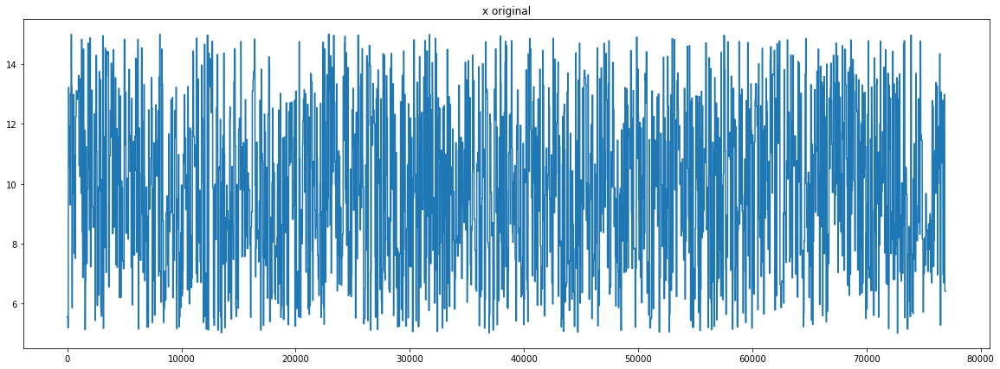

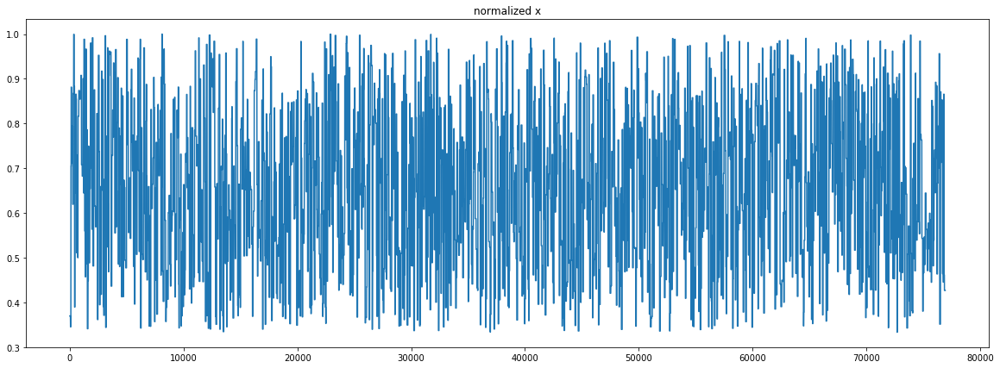

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (23078, 1)
output partition shape (23078, 1)
stacked Y shape  (23014, 1)
Y_tensor torch.Size([23014, 1])
X_tensor torch.Size([64, 23013, 1])
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


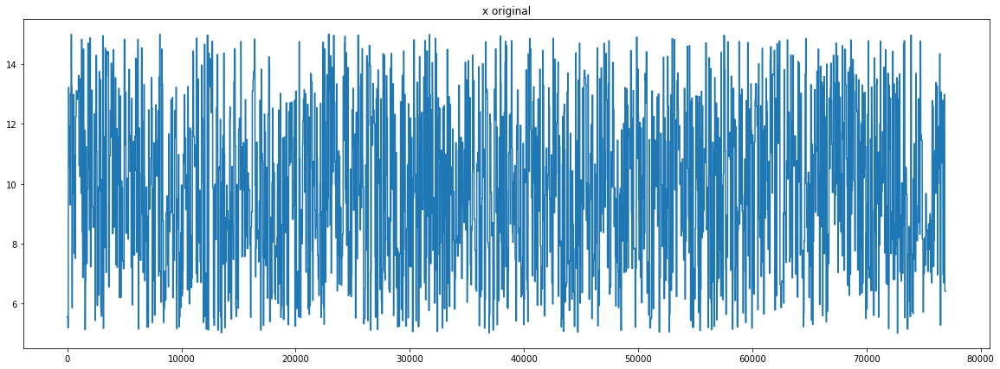

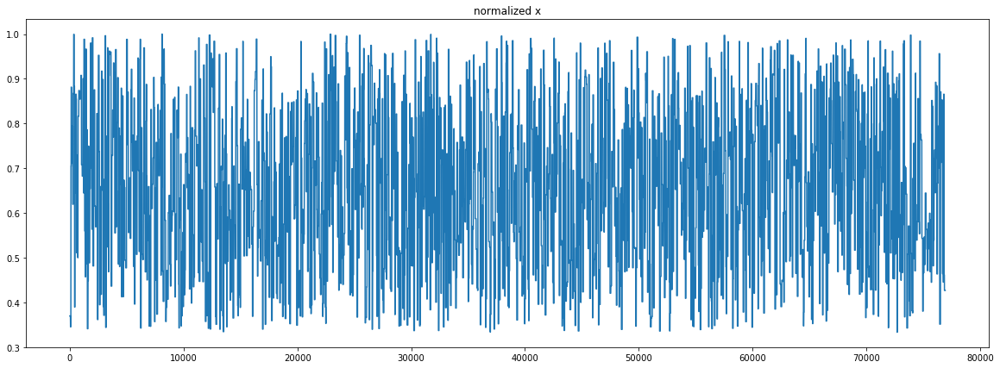

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (53846, 1)
output partition shape (53846, 1)
stacked Y shape  (53782, 1)
Y_tensor torch.Size([53782, 1])
X_tensor torch.Size([64, 53781, 1])
train set: [53782] batches
test set: [23014] batches
data_loading time 27.869977235794067 secs


In [13]:
# todo add time tracking for this cell
use_part = p_data['use_part_of_data']
print(f"using {use_part} of data")

t_tick = time.time()

test_ts_ds = TimeSeriesDataset(config=config,
                               partition=(use_part - use_part*p_data['test_size'], use_part),                        
                               logging=logging)

train_ts_ds = TimeSeriesDataset(config=config,
                                partition=(0, use_part - use_part*p_data['test_size']),
                                logging=logging)

print(f"train set: [{len(train_ts_ds)}] batches")
print(f"test set: [{len(test_ts_ds)}] batches")

if need_normalize:
    config['x_norm'] = train_ts_ds.x_norms[0]
    config['y_norm'] = train_ts_ds.y_norms[0]
    config['x_norm']
else:
    config['x_norm'] = 1
    config['y_norm'] = 1
    config['x_norm']

train_dl = DataLoader(dataset = train_ts_ds,
                      batch_sampler = BatchSampler(
                          sampler = SequentialSampler(train_ts_ds), 
                          batch_size = p_train['batch_size'],
                          drop_last = True)
                     )
test_dl = DataLoader(dataset = test_ts_ds,
                     batch_sampler = BatchSampler(
                     sampler = SequentialSampler(test_ts_ds), 
                     batch_size = p_train['batch_size'], 
                     drop_last = True)
                    )    
    
t_tock = time.time()
dataload_time = t_tock - t_tick
print(f"data_loading time {dataload_time} secs")

## Inspecting data we have, get several batches and look inside on pretty large scale to see individual iterations:

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


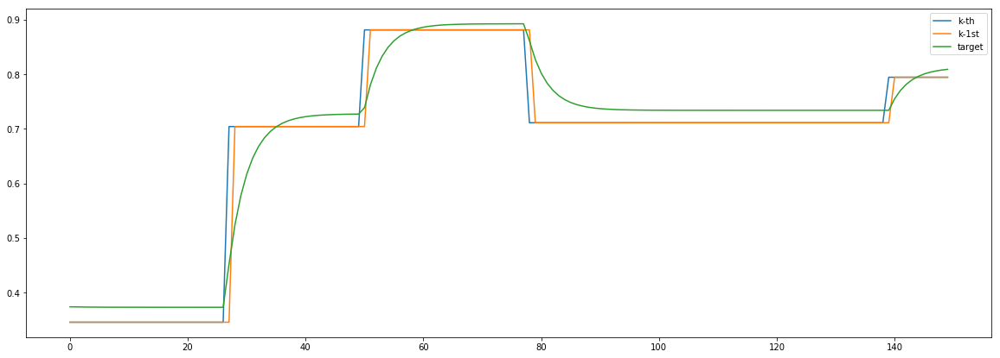

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


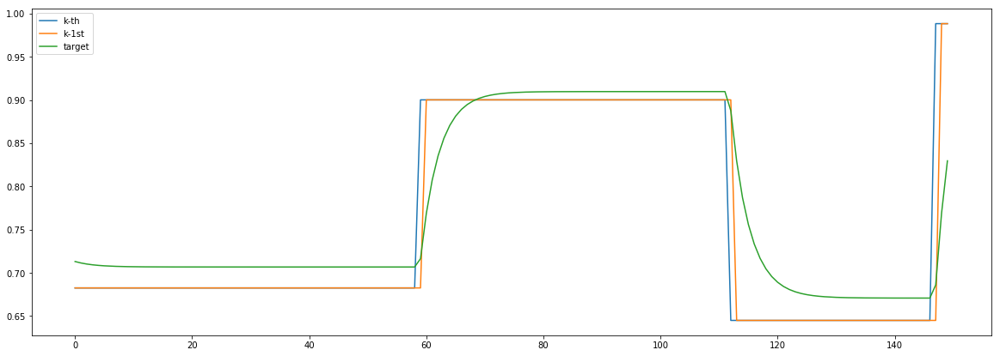

In [14]:
f, t = 0, 150
for i, batch in enumerate(train_dl):
    x, y, ind = batch
    print(f"x [batch_size, retrospective_steps, channels] :{x.shape}")
    print(f"y [batch_size, channels]: {y.shape}")
    y_kth = y.detach().numpy()[f:t, 0]
    print(f"y_last [slice_size]: {y_kth.shape}")
    x = x.transpose(0,1)
    plt.plot(x.detach().numpy()[-1][f:t], label='k-th')
    plt.plot(x.detach().numpy()[-2][f:t], label='k-1st')
    plt.plot(y_kth, label='target')
    plt.legend()
    plt.show()
    if i == 1:
        break

In [15]:
# #####################
# # 
# #####################
# from torch.nn import init
# for layer_p in a._all_weights:
#     for p in layer_p:
#         if 'weight' in p:
#             # print(p, a.__getattr__(p))
#             init.normal(a.__getattr__(p), 0.0, 0.02)

In [16]:
logging.info("History INITIALIZED")

hist = {
    
    "train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_test":{
        "batches":{
            "main":np.zeros(len(test_dl)),
            "aux":np.zeros(len(test_dl)),
            "jordan":np.zeros(len(test_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    'mean_params_sample':
    {
        '1':np.zeros(num_epochs),
        '2':np.zeros(num_epochs),    
        '3':np.zeros(num_epochs)
    },
    'lr': np.zeros(num_epochs),
    'loss_rate': np.zeros(num_epochs),
    'weights_sum': np.zeros(num_epochs), 
    'weights_var': np.zeros(num_epochs),
    
    'grads':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'weights':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'vars':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'param_grads':{
        'batches':{"p1":np.zeros(len(train_dl)),
                   "p2":np.zeros(len(train_dl)),
                   "p3":np.zeros(len(train_dl))
                  },
        'epochs':{
            "p1":np.zeros(num_epochs), 
            "p2":np.zeros(num_epochs),
            "p3":np.zeros(num_epochs)
        }
    },
    'aux_global':[],
    'grad_global':{'p1':[], 'p2':[],'p3':[],'lstm':[], 'linear':[]}
}

In [43]:
def batch_iteration(iter_index, model, optimizer, batch_data, backprop, hist_part):
    
    x_batch, y_batch, indexes = batch_data
    x_batch.transpose_(0, 1) # todo get rid of it
    model.hidden = model.init_hidden()   
    
    
    if backprop:
        y_pred, jordan = model(x_batch)
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=False,
                        core_flag=False,
                      aux_flag=True,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optimizer.zero_grad()
        aux_loss *= 10**p_train['aux_loss']['scaling_order']
        hist_part["aux"][iter_index] = aux_loss.item()
        aux_loss.backward()
        optimizer.step()
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=False,
                      aux_flag=False,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optim_jord.zero_grad()
        jordan_loss *= 10**p_train['jordan_loss']['scaling_order'] # TODO change to special
        hist_part["jordan"][iter_index] = jordan_loss.item()    
        jordan_loss.backward()
        optim_jord.step()

        main_loss *= 0 #10*p_train['core_loss']['scaling_order']
        
        
        
    else:
        y_pred, jordan = model(x_batch)
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=True,
                      aux_flag=False,
                         blind_aux_flag=True,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        
#         optimizer.zero_grad()
        
#         aux_loss.backward()
        
#         combined_loss.backward()
    # TODO or manually add weight decay here when grad is ready
    #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
        for name, parameter in model.named_parameters():
            hist['grads']['batches'][name][iter_index] = parameter.grad.sum().item()
            hist['weights']['batches'][name][iter_index] = parameter.sum().item()
            hist['vars']['batches'][name][iter_index] = parameter.var().item()
        hist['param_grads']['batches']['p1'][iter_index] = model.jordan.grad[0][0].item()
        hist['param_grads']['batches']['p2'][iter_index] = model.jordan.grad[0][1].item()
        hist['param_grads']['batches']['p3'][iter_index] = model.jordan.grad[0][2].item()
        
        hist['grad_global']['p1'].append(model.jordan.grad[0][0].item())
        hist['grad_global']['p2'].append(model.jordan.grad[0][1].item())
        hist['grad_global']['p3'].append(model.jordan.grad[0][2].item())
        
        hist['grad_global']['lstm'].append(sum([p.grad.abs().sum() for p in model.lstm.parameters()]).item())
        hist['grad_global']['linear'].append(sum([p.grad.abs().sum() for p in model.linear.parameters()]).item())
        hist['aux_global'].append(aux_loss.item())
        
#         optimizer.step()
    
    hist_part["main"][iter_index] = main_loss.item()
    
    return y_pred, jordan

In [44]:
def update_long_term_hist(batches_hist, long_term_hist):
    mean_main = np.average(batches_hist["main"])
    mean_aux = np.average(batches_hist["aux"])
    mean_jord = np.average(batches_hist["jordan"])
    long_term_hist["main"][t] = mean_main
    long_term_hist["aux"][t] = mean_aux
    long_term_hist["jordan"][t] = mean_jord
    return mean_main, mean_aux, mean_jord

In [45]:
def slice_loss_sum(losses_dict, index):
    return sum([val[index] for val in losses_dict.values()])

In [46]:
for p in model.parameters():
    print(p)

Parameter containing:
tensor([[0.4514, 1.0306, 6.9329]], requires_grad=True)
Parameter containing:
tensor([[ 0.1776, -0.2802,  0.5308,  0.6732],
        [-0.1943,  0.0606,  0.1011,  0.8121],
        [ 0.2304,  0.5935, -0.5908,  0.3484],
        [ 0.0172,  0.2340,  0.3800,  0.4230],
        [ 0.3230, -0.5968, -0.3523,  0.0785],
        [-0.1450,  0.7547, -0.2411,  0.0252],
        [ 1.0770,  0.0920, -0.1798, -0.3576],
        [ 1.3500,  0.4316,  0.4255, -0.4260]], requires_grad=True)
Parameter containing:
tensor([[ 0.4748,  0.2922],
        [-0.6348,  0.7166],
        [-0.3561,  0.1439],
        [-0.4835,  0.4780],
        [ 0.1701, -0.5794],
        [-0.4532,  0.7268],
        [-0.4483,  0.5338],
        [-0.0721,  0.2383]], requires_grad=True)
Parameter containing:
tensor([-0.4178,  0.6995, -0.1585, -0.0027, -0.2063, -0.1061,  0.3206,  0.2580],
       requires_grad=True)
Parameter containing:
tensor([-0.1575,  0.0038,  0.7299,  0.0494, -0.1722,  0.5049,  0.7380,  0.6411],
       requi

## Train model

aux preds: 0.4501093029975891           1.027823805809021           7.216427326202393
main loss 0.0
aux loss 1904.238485483023
jord loss 9843.09500826322
combined loss 11747.333493746244 


Parameter containing:
tensor([[0.4501, 1.0278, 7.2164]], requires_grad=True)


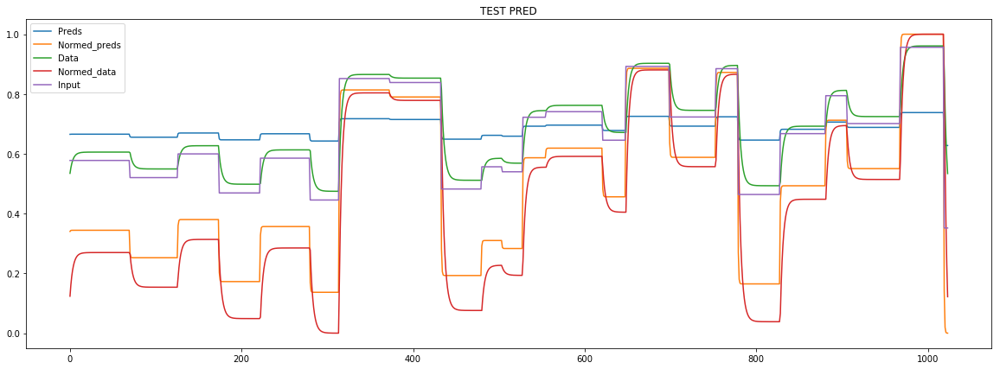

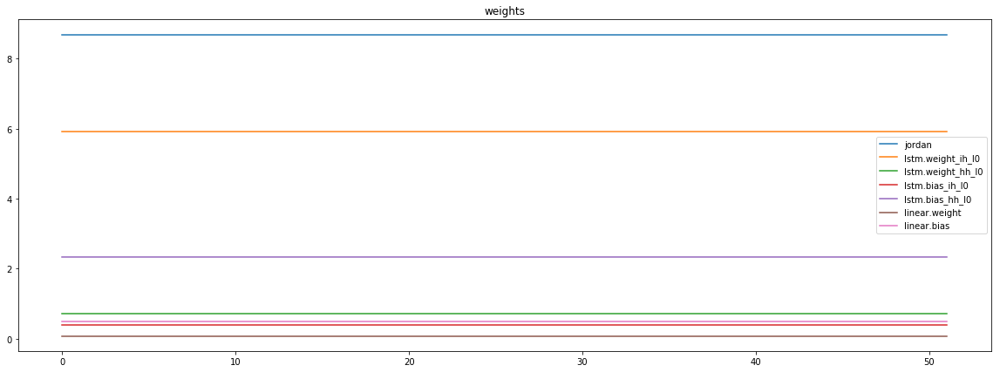

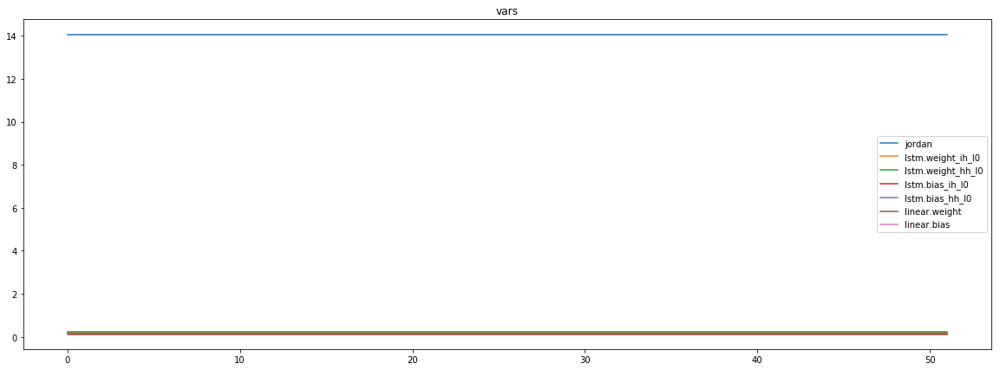

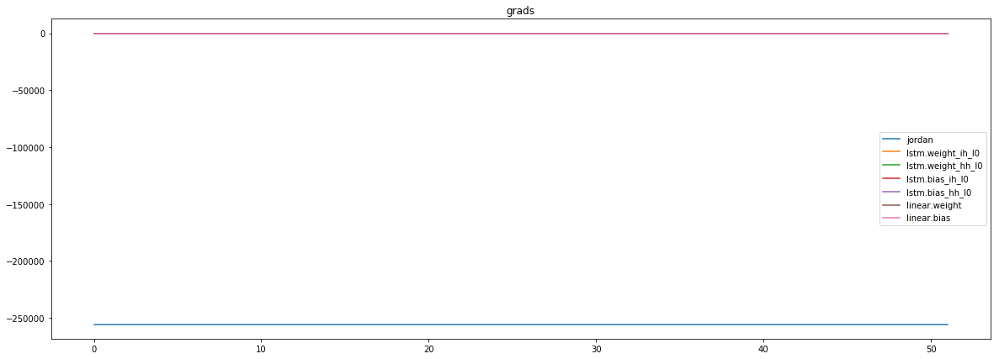

mean_p1 : 8106.88671875
mean_p2 : -259376.453125
mean_p3 : -4134.6591796875


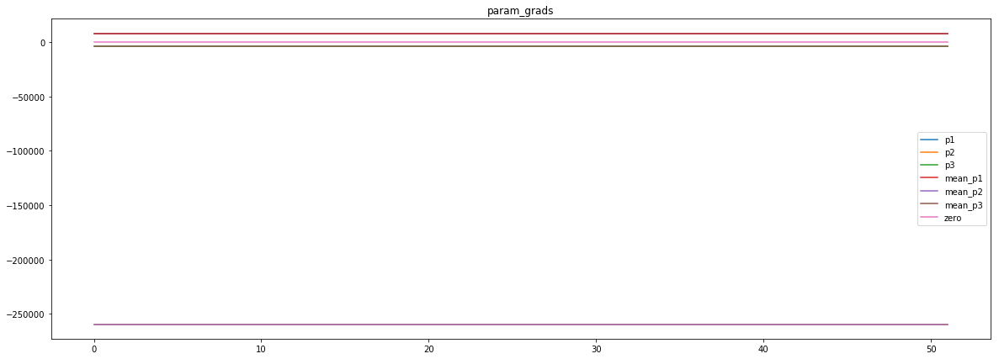

Epoch [0] 
     train_loss[11747.333493746244] 
     eval_train[0.32384879376667625] 
     eval_test[0.3257384991950609]


aux preds: 0.4474368691444397           1.0248870849609375           7.495543003082275
main loss 0.0
aux loss 1863.8784836989182
jord loss 9405.436870868389
combined loss 11269.315354567307 


Parameter containing:
tensor([[0.4474, 1.0249, 7.4955]], requires_grad=True)


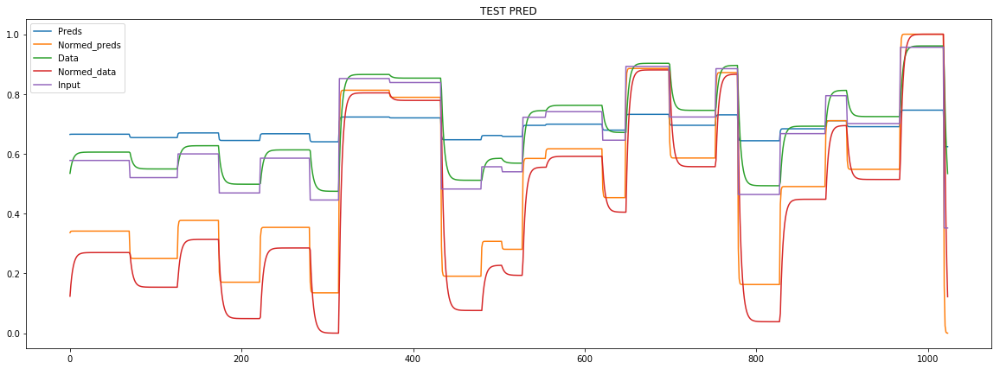

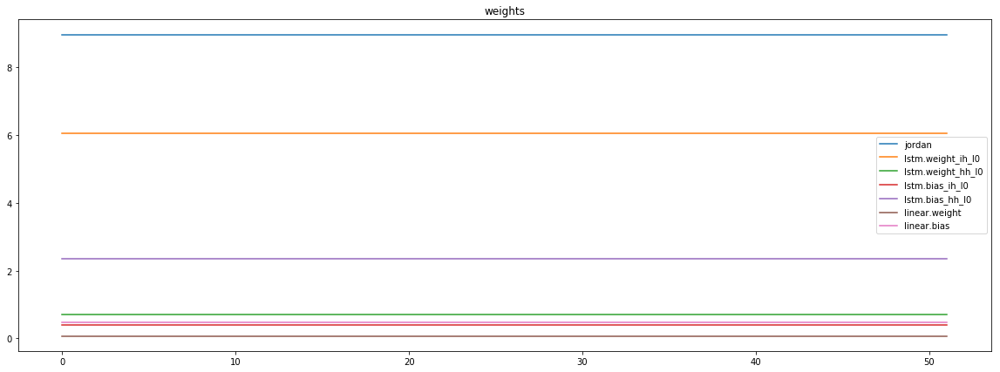

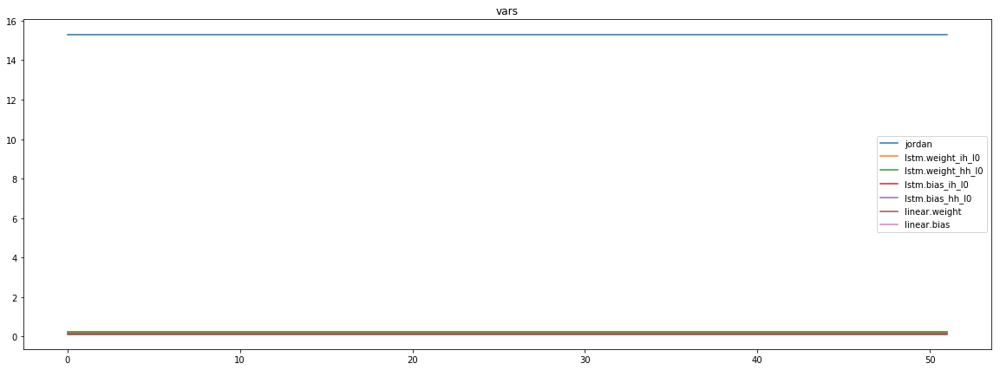

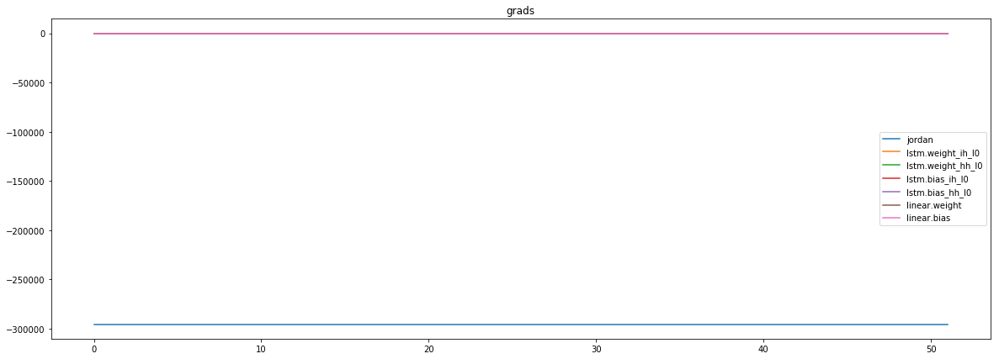

mean_p1 : 3464.134521484375
mean_p2 : -294415.90625
mean_p3 : -4480.1328125


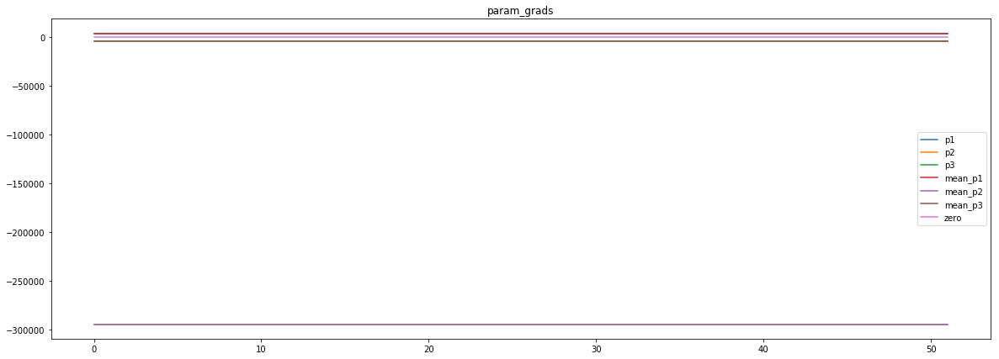

Epoch [1] 
     train_loss[11269.315354567307] 
     eval_train[0.3206755656999751] 
     eval_test[0.32248123472725804]


aux preds: 0.44672349095344543           1.0221037864685059           7.764980792999268
main loss 0.0
aux loss 1817.8086266150842
jord loss 8970.445838341346
combined loss 10788.25446495643 


Parameter containing:
tensor([[0.4467, 1.0221, 7.7650]], requires_grad=True)


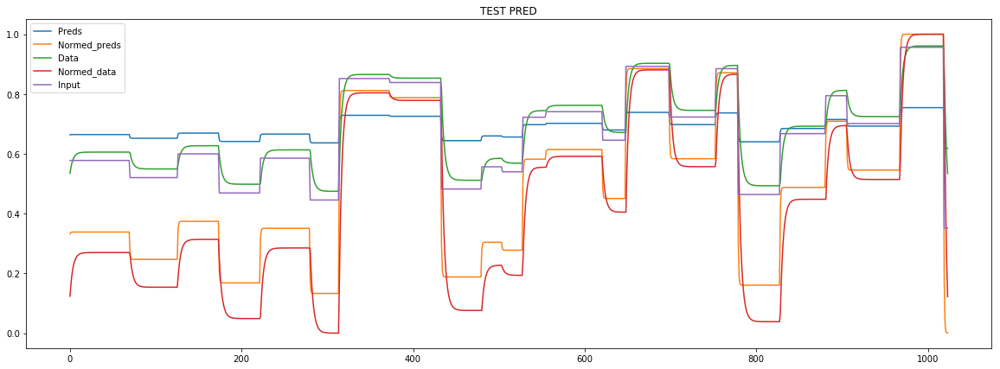

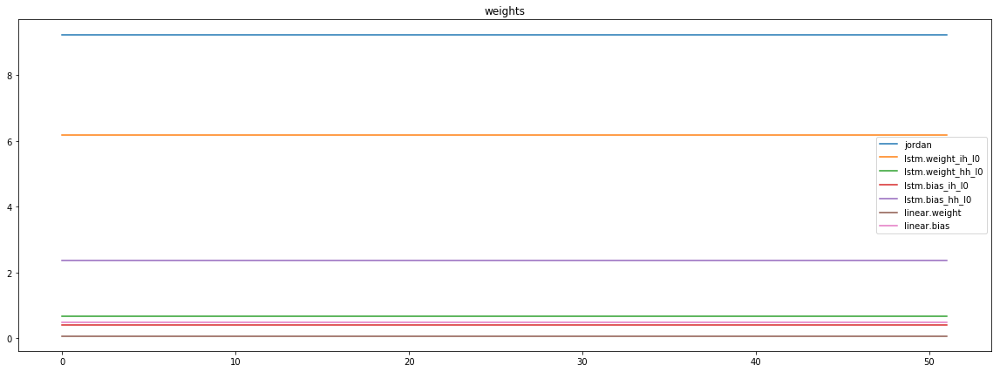

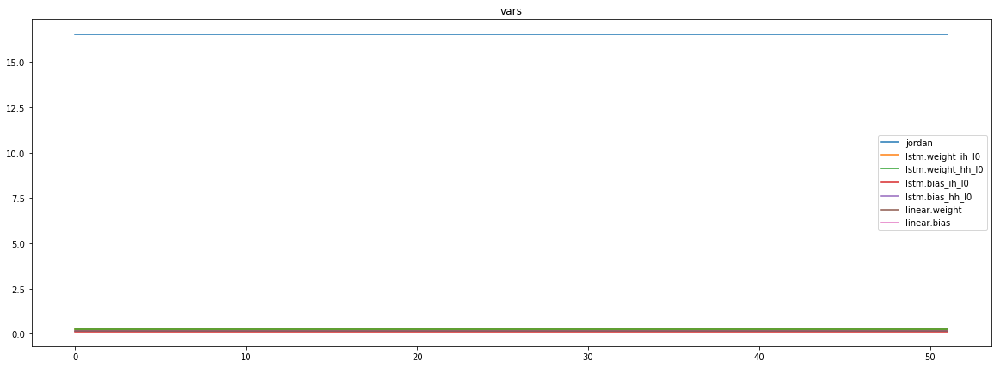

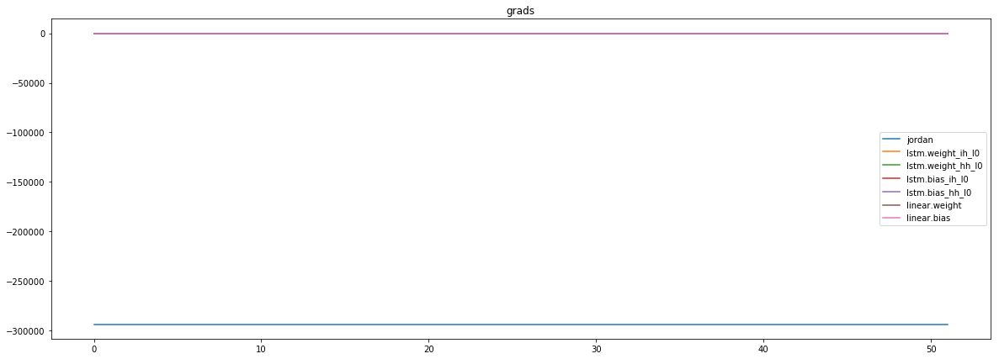

mean_p1 : -1201.172119140625
mean_p2 : -287870.90625
mean_p3 : -4427.40576171875


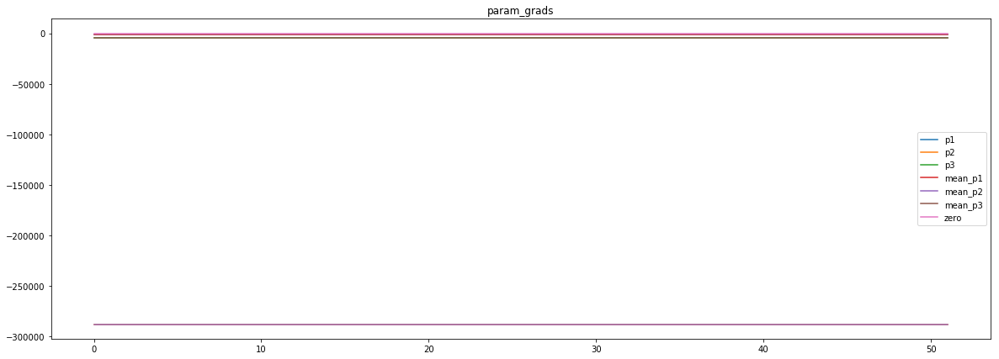

Epoch [2] 
     train_loss[10788.25446495643] 
     eval_train[0.3170879260242845] 
     eval_test[0.3188395429910584]


aux preds: 0.44849535822868347           1.0192484855651855           8.029728889465332
main loss 0.0
aux loss 1764.1842087965745
jord loss 8540.94747220553
combined loss 10305.131681002104 


Parameter containing:
tensor([[0.4485, 1.0192, 8.0297]], requires_grad=True)


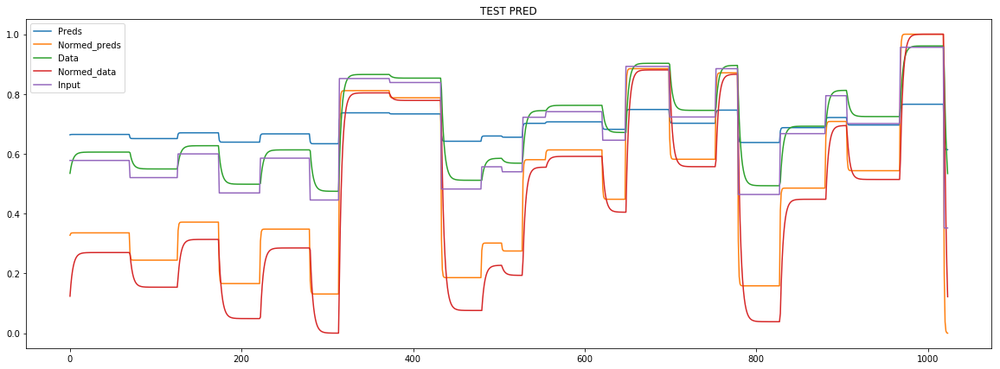

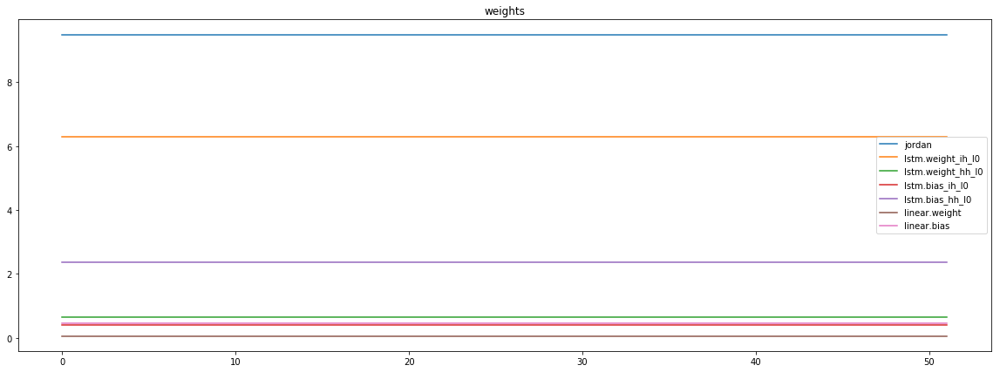

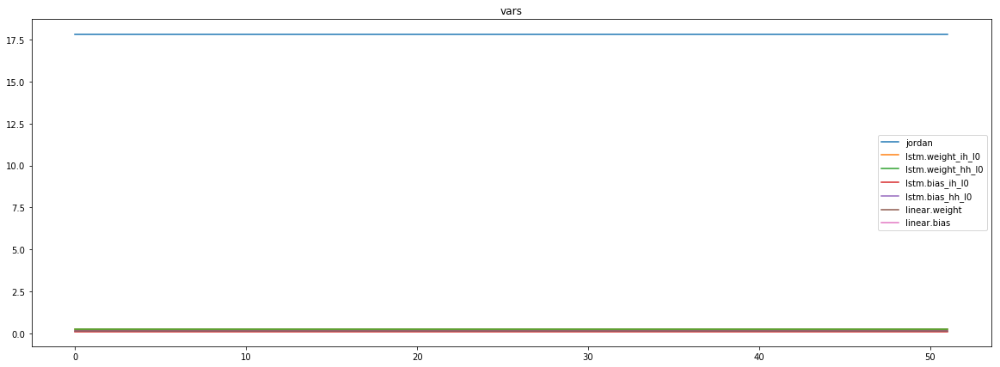

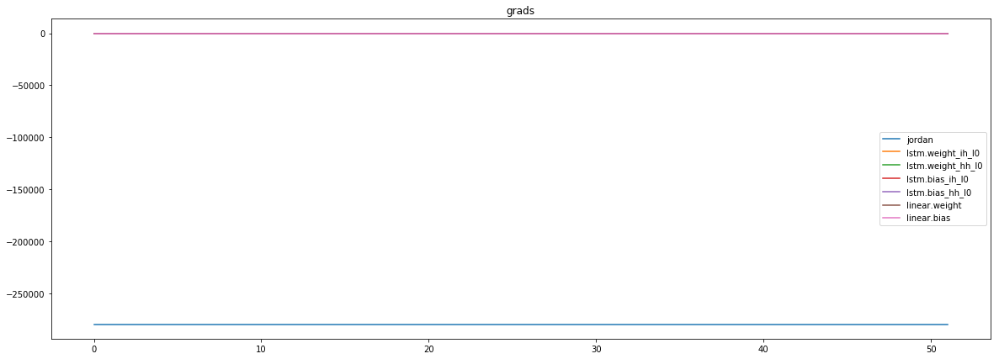

mean_p1 : 9697.98046875
mean_p2 : -284859.40625
mean_p3 : -4381.05859375


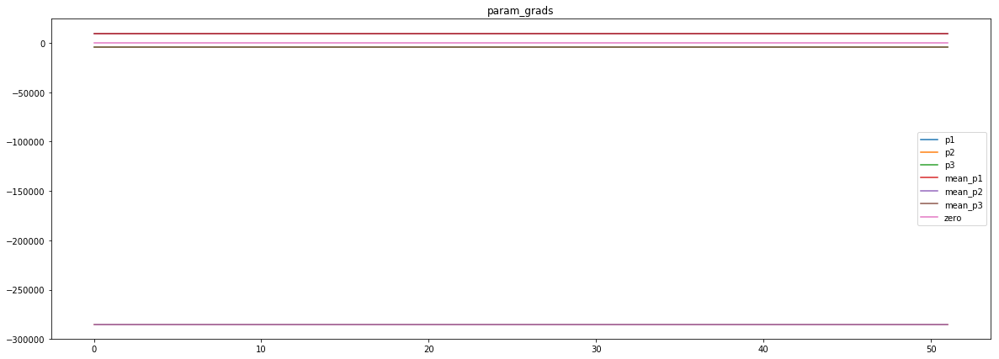

Epoch [3] 
     train_loss[10305.131681002104] 
     eval_train[0.3128631389162575] 
     eval_test[0.31445021360096603]


aux preds: 0.4463735520839691           1.0177475214004517           8.265192985534668
main loss 0.0
aux loss 1699.5833153357873
jord loss 8195.659067007211
combined loss 9895.242382342998 


Parameter containing:
tensor([[0.4464, 1.0177, 8.2652]], requires_grad=True)


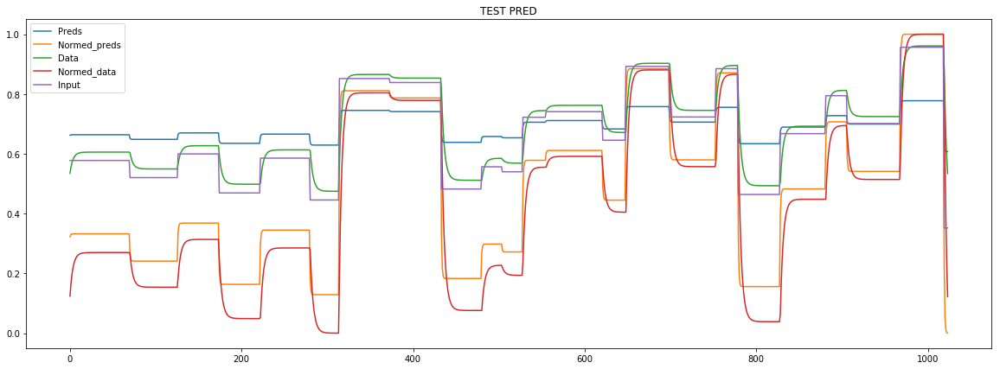

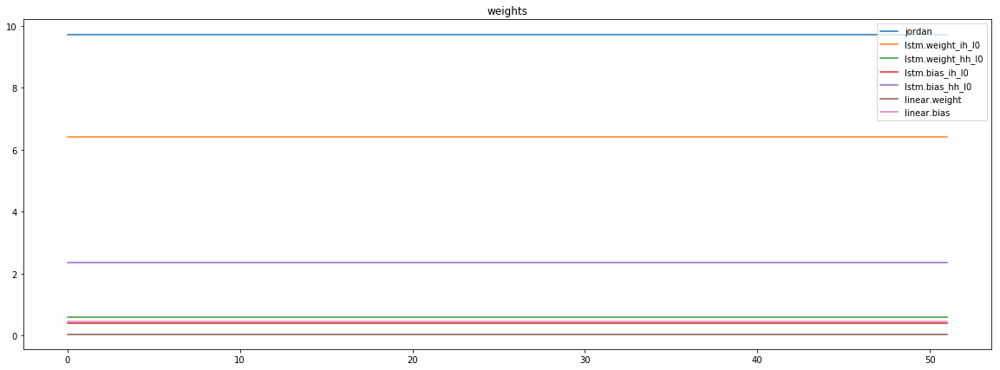

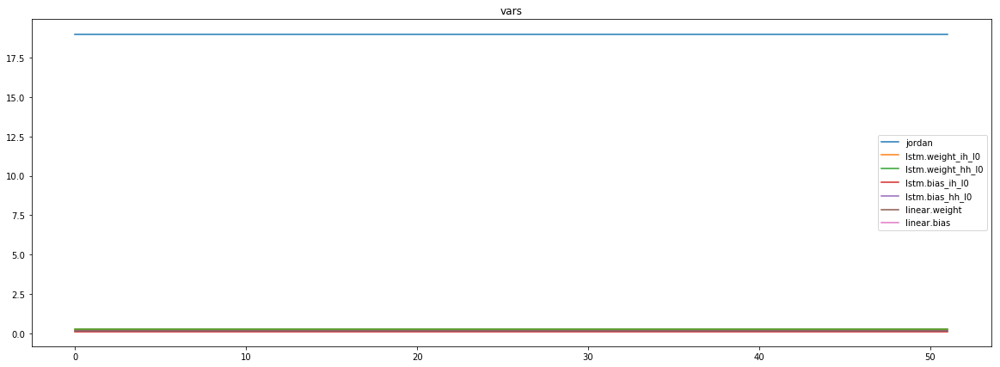

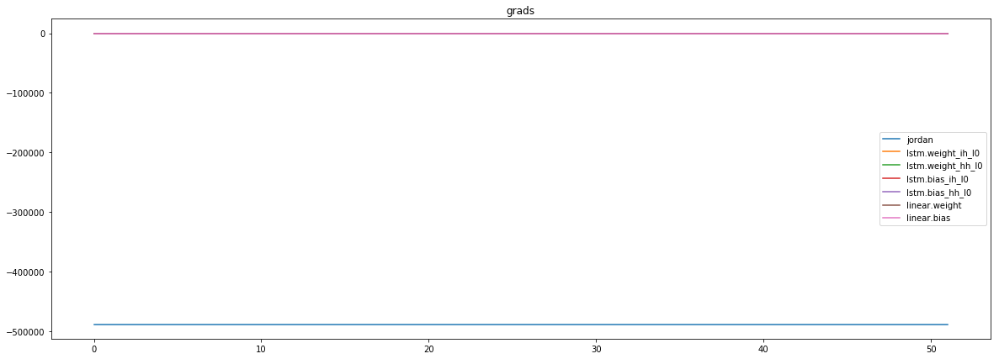

mean_p1 : -3334.322509765625
mean_p2 : -478307.78125
mean_p3 : -6140.14306640625


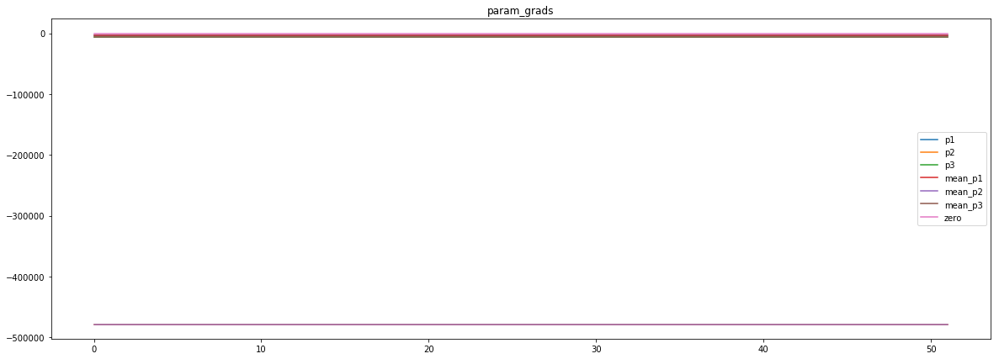

loss rate [0.028451692617754598]
Epoch [4] 
     train_loss[9895.242382342998] 
     eval_train[0.30806534928986085] 
     eval_test[0.30952589628709987]


aux preds: 0.44812703132629395           1.0152885913848877           8.47468090057373
main loss 0.0
aux loss 1626.3494380070613
jord loss 7917.0908203125
combined loss 9543.44025831956 


Parameter containing:
tensor([[0.4481, 1.0153, 8.4747]], requires_grad=True)


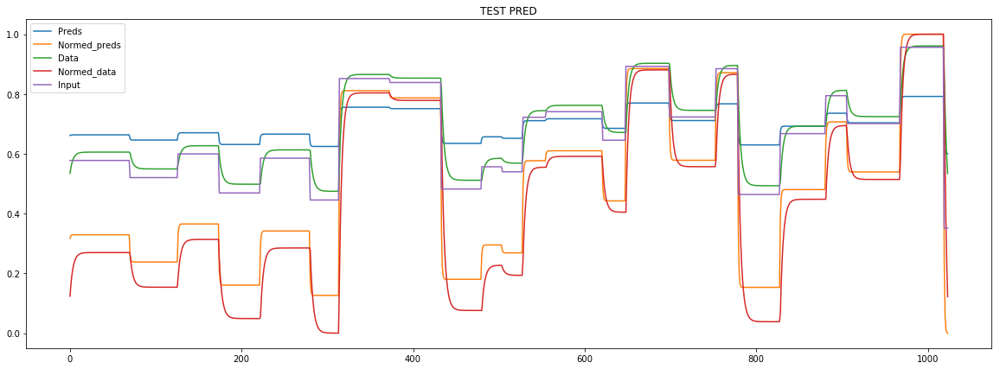

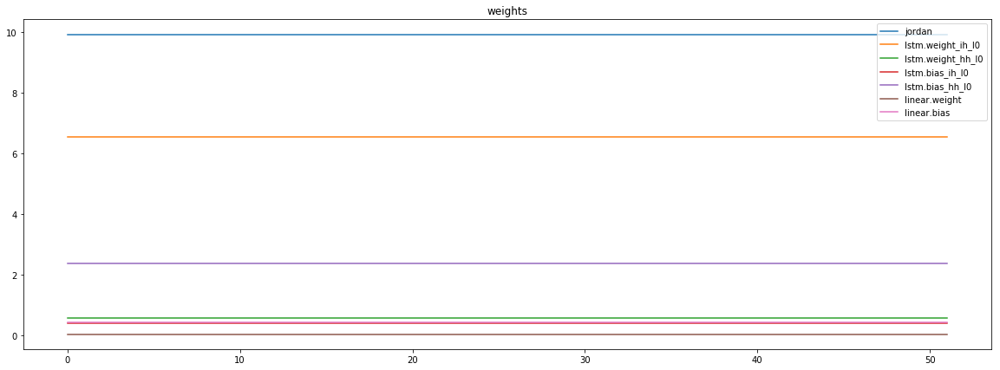

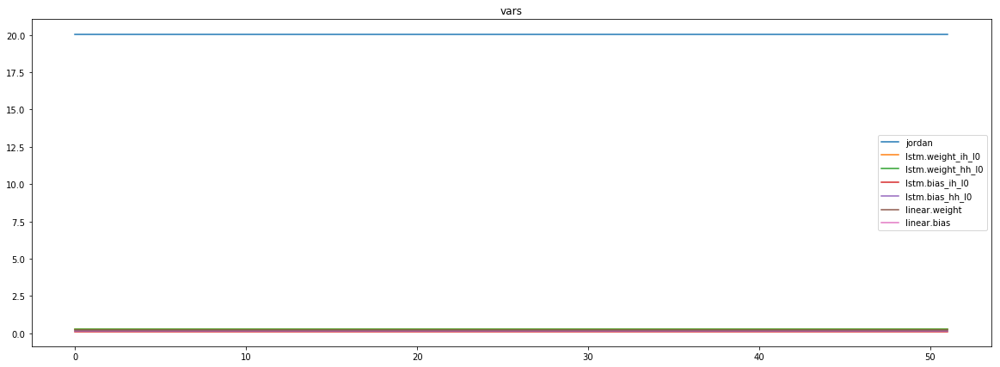

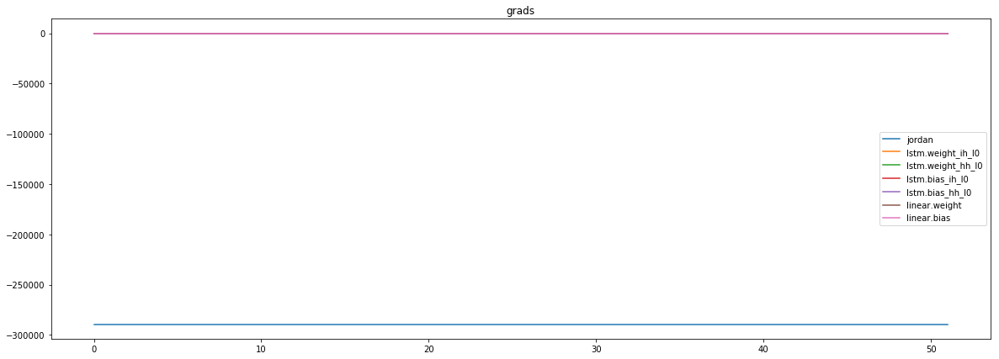

mean_p1 : 16257.6640625
mean_p2 : -300994.5625
mean_p3 : -4515.279296875


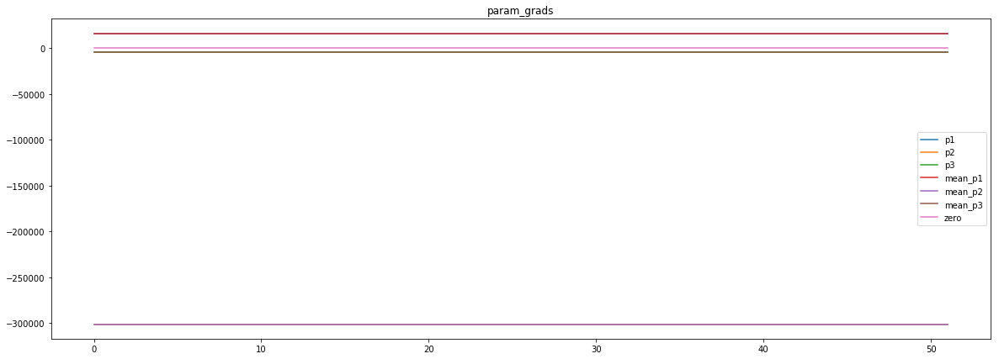

loss rate [0.03349848428083657]
Epoch [5] 
     train_loss[9543.44025831956] 
     eval_train[0.3025038879042348] 
     eval_test[0.3037442525171421]


aux preds: 0.4479397237300873           1.014916181564331           8.683794975280762
main loss 0.0
aux loss 1539.4160743126502
jord loss 7594.34609750601
combined loss 9133.76217181866 


Parameter containing:
tensor([[0.4479, 1.0149, 8.6838]], requires_grad=True)


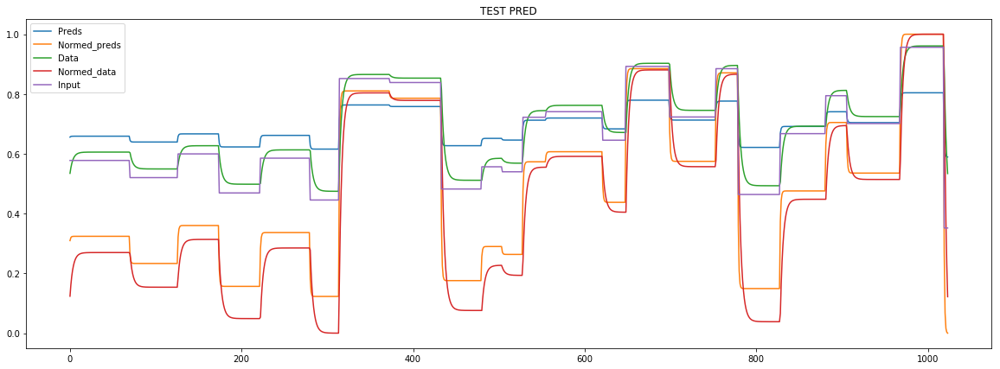

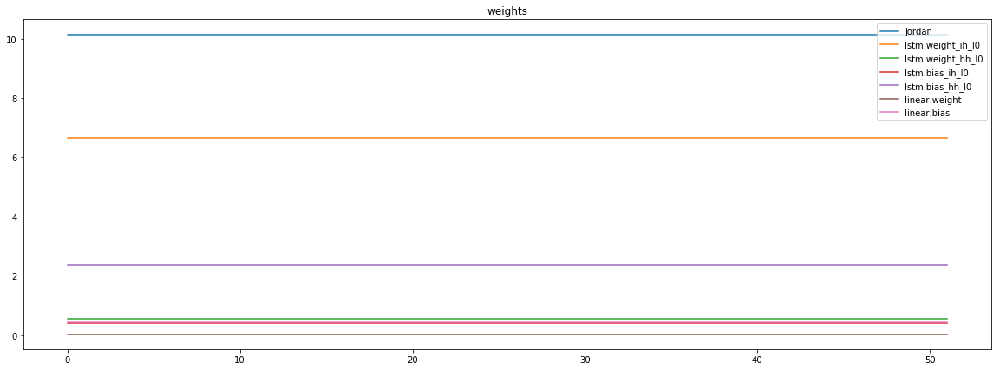

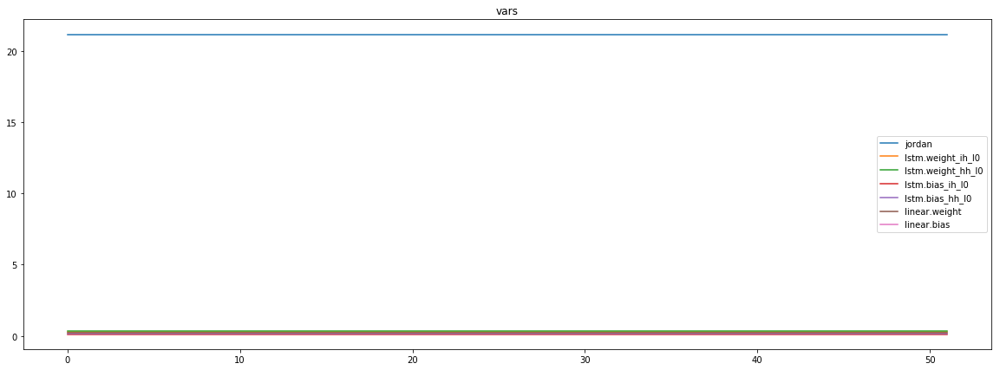

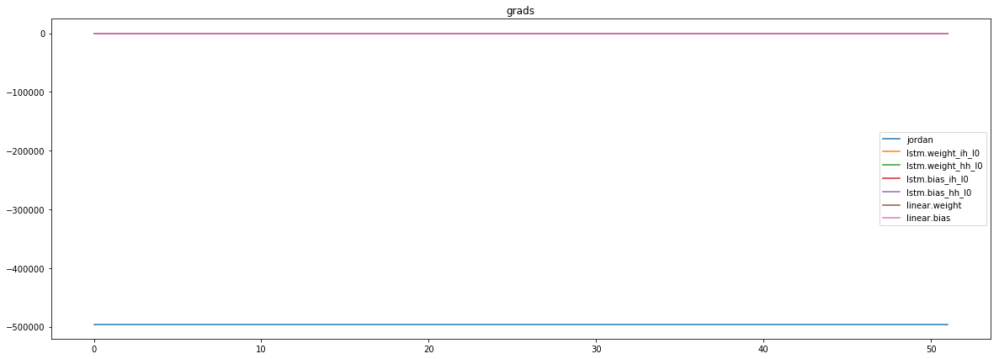

mean_p1 : -66581.90625
mean_p2 : -423504.5625
mean_p3 : -5585.99560546875


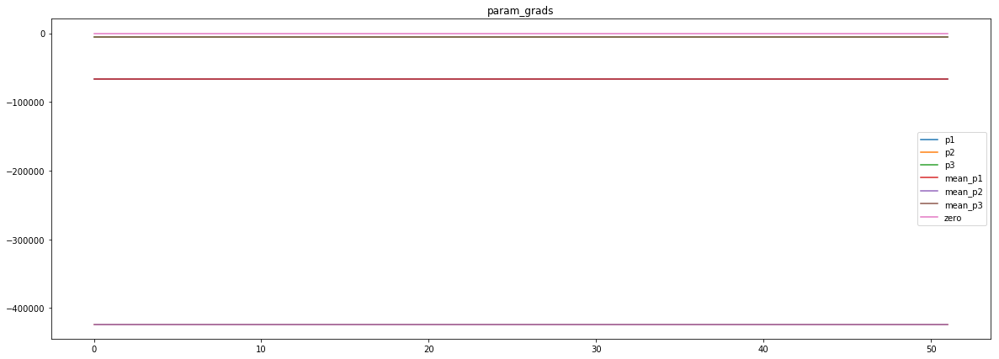

loss rate [0.038169558698737394]
Epoch [6] 
     train_loss[9133.76217181866] 
     eval_train[0.2961515181590445] 
     eval_test[0.29743656185878947]


aux preds: 0.44497790932655334           1.0134539604187012           8.854806900024414
main loss 0.0
aux loss 1441.0401400052583
jord loss 7325.403339092548
combined loss 8766.443479097807 


Parameter containing:
tensor([[0.4450, 1.0135, 8.8548]], requires_grad=True)


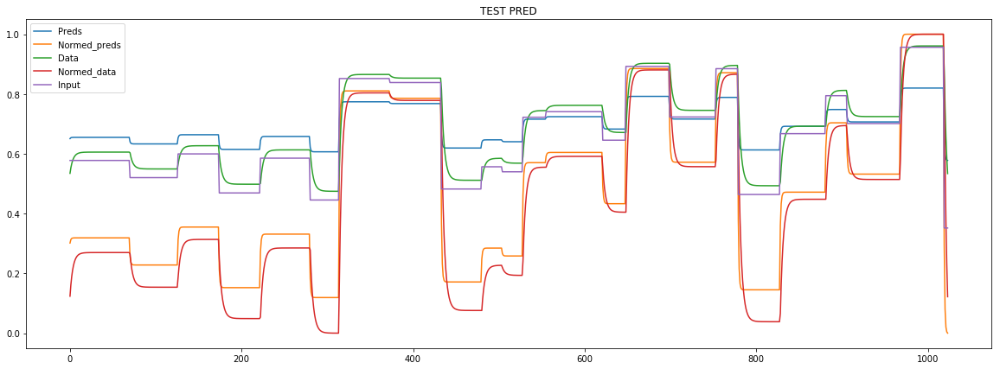

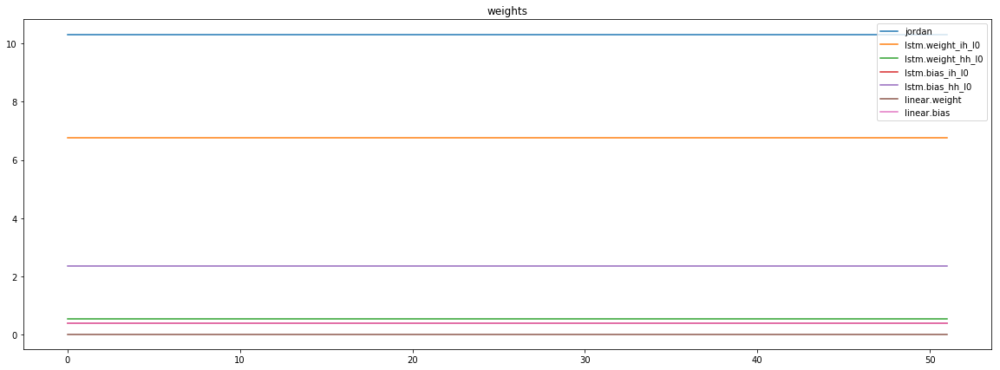

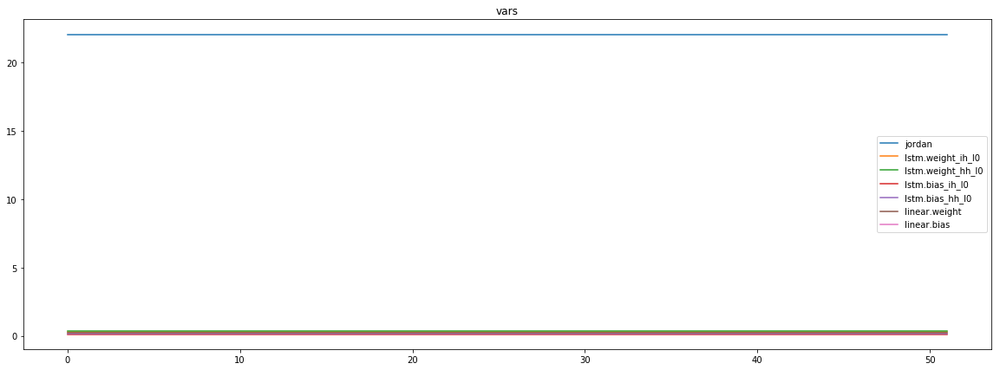

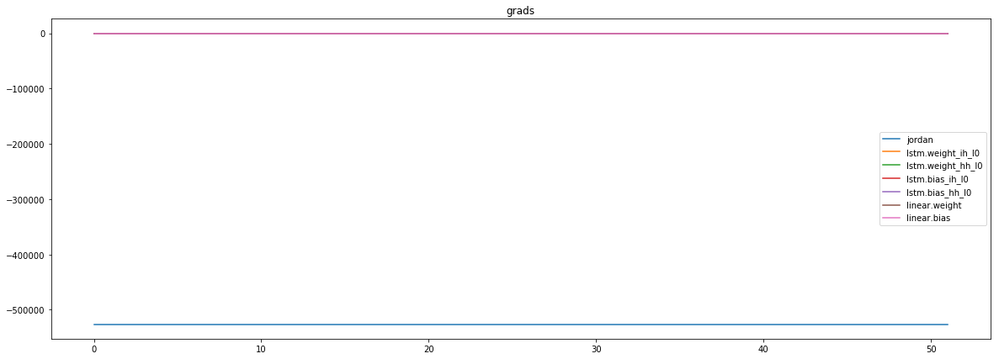

mean_p1 : 15645.892578125
mean_p2 : -535045.3125
mean_p3 : -6587.2705078125


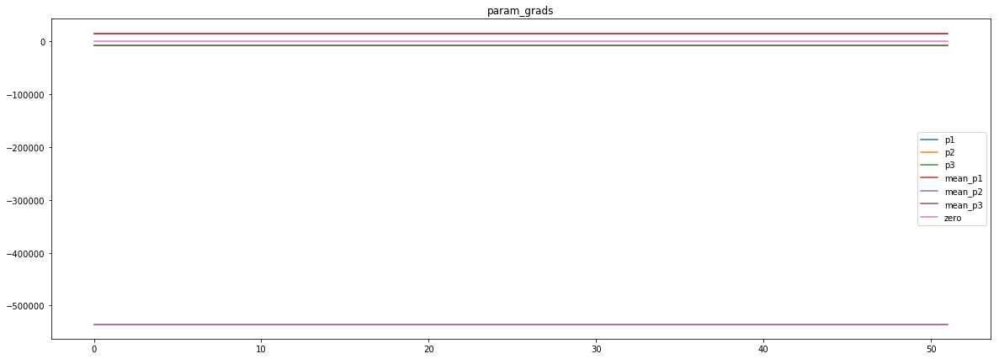

loss rate [0.04477113835634483]
Epoch [7] 
     train_loss[8766.443479097807] 
     eval_train[0.28874759381422055] 
     eval_test[0.28997777817262843]


aux preds: 0.4474821984767914           1.012808918952942           9.023716926574707
main loss 0.0
aux loss 1327.3677051250752
jord loss 6970.9961500901445
combined loss 8298.363855215219 


Parameter containing:
tensor([[0.4475, 1.0128, 9.0237]], requires_grad=True)


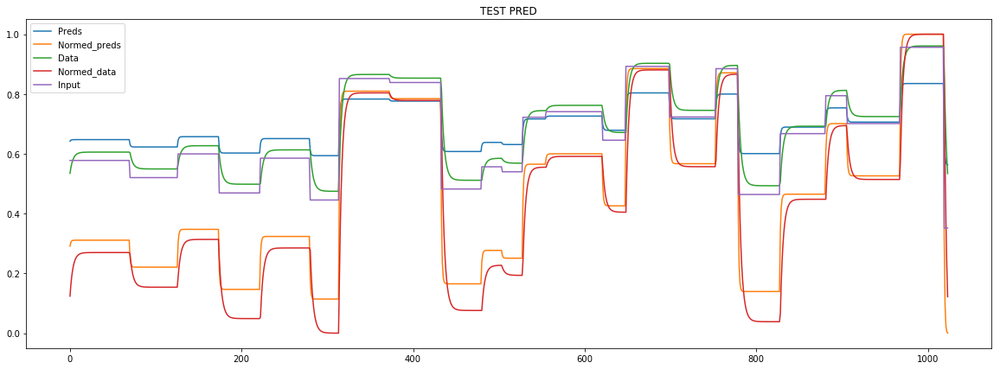

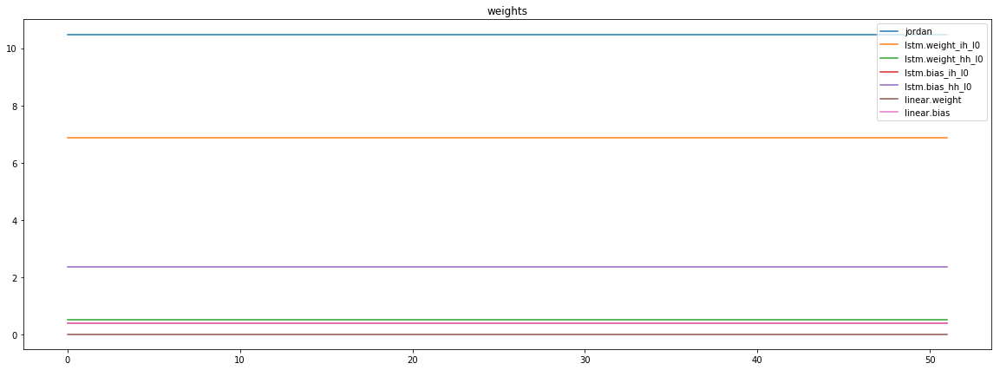

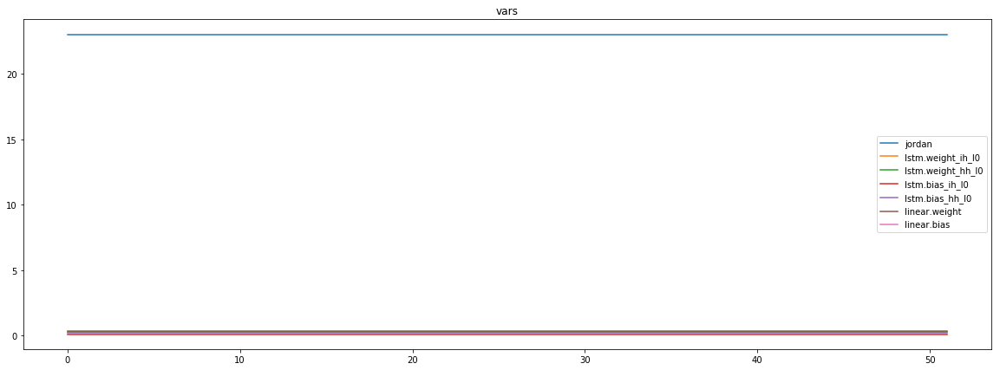

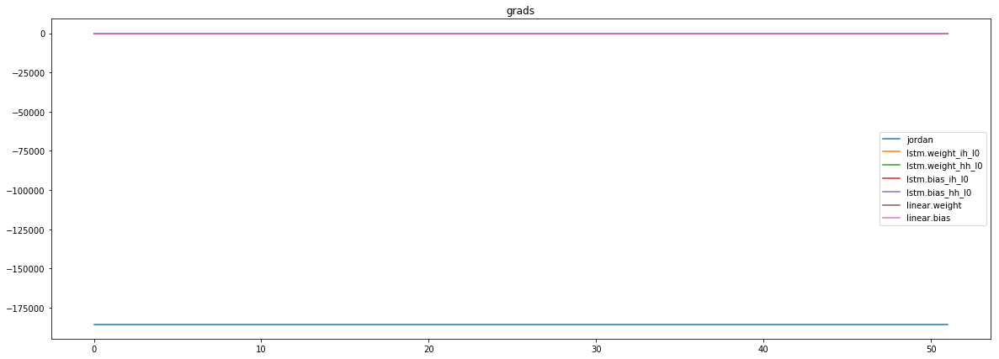

mean_p1 : -49472.42578125
mean_p2 : -133104.015625
mean_p3 : -2867.952880859375


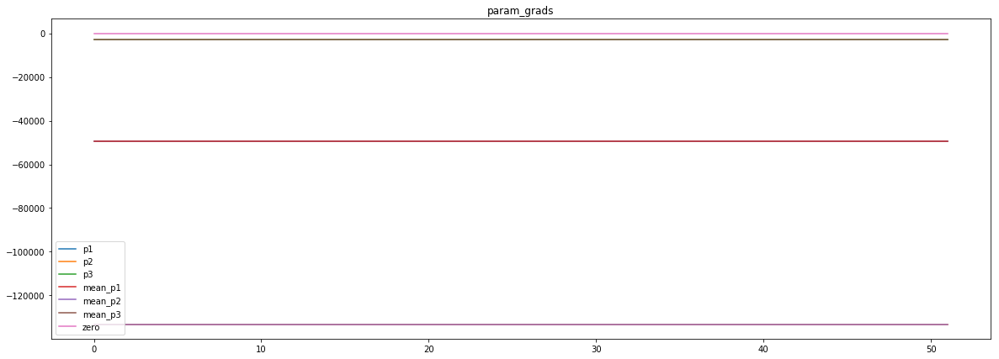

loss rate [0.05180249703635931]
Epoch [8] 
     train_loss[8298.363855215219] 
     eval_train[0.2802947834671403] 
     eval_test[0.28166478406637907]


aux preds: 0.4487769305706024           1.0084503889083862           9.172080039978027
main loss 0.0
aux loss 1194.5315974308894
jord loss 6748.03432053786
combined loss 7942.56591796875 


Parameter containing:
tensor([[0.4488, 1.0085, 9.1721]], requires_grad=True)


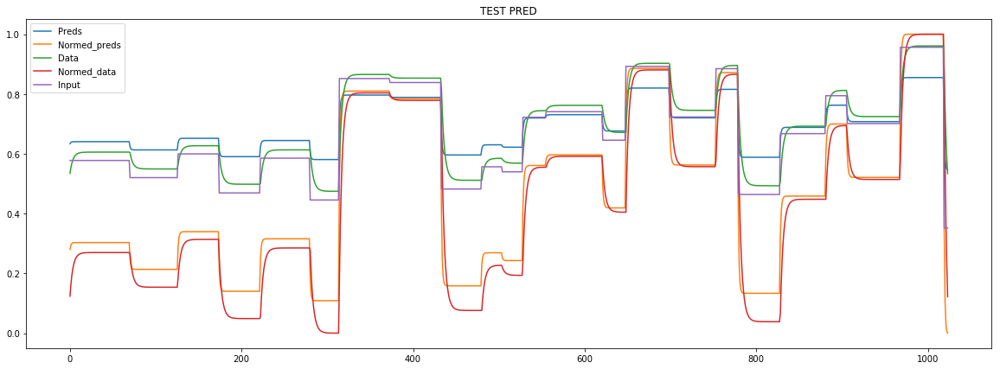

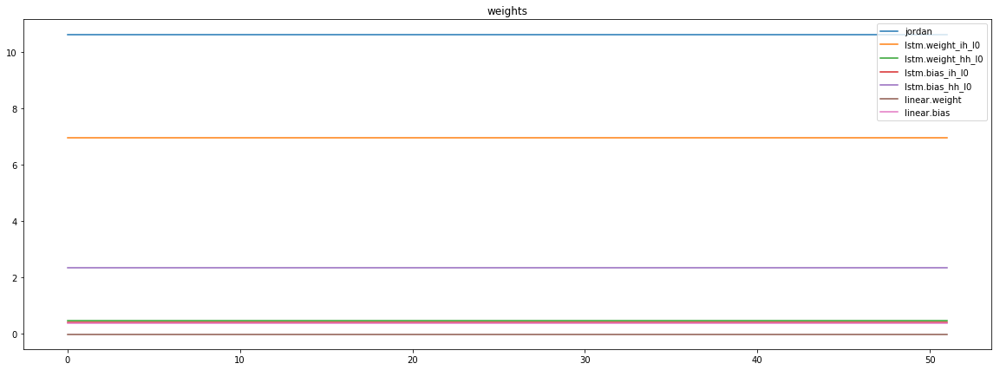

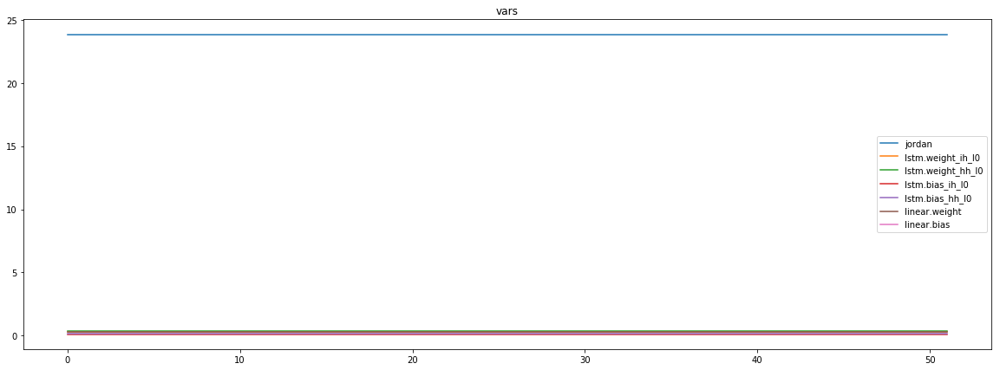

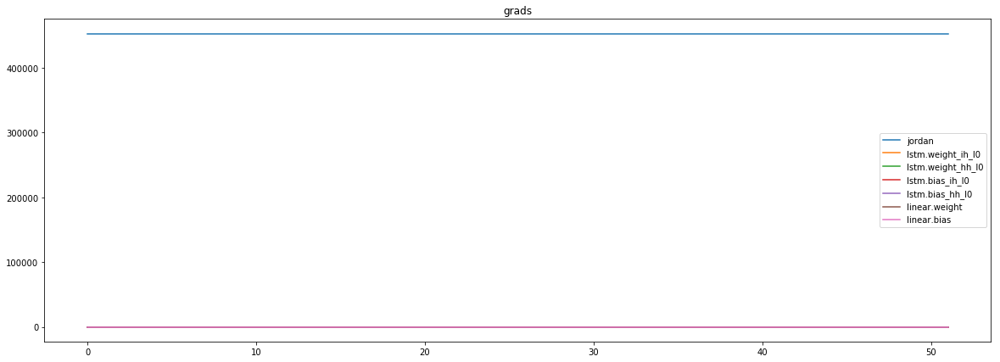

mean_p1 : -49926.15625
mean_p2 : 498842.40625
mean_p3 : 3966.038818359375


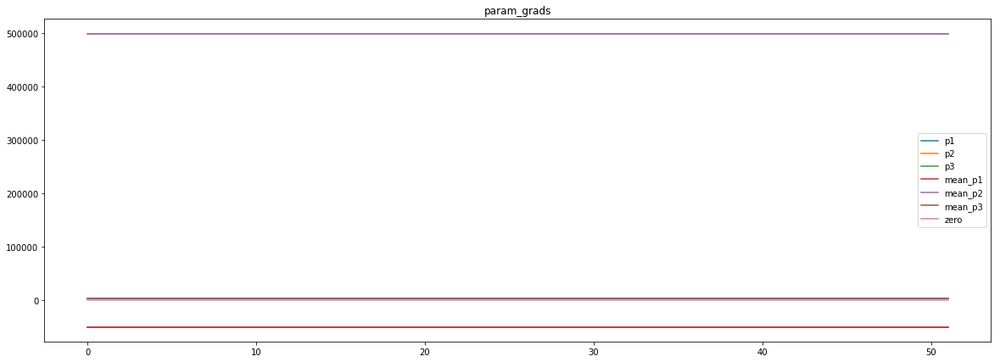

loss rate [0.06174549337949686]
Epoch [9] 
     train_loss[7942.56591796875] 
     eval_train[0.2704517258725201] 
     eval_test[0.27180580159818585]


aux preds: 0.44974851608276367           1.0074702501296997           9.326394081115723
main loss 0.0
aux loss 1043.551020695613
jord loss 6448.034067007212
combined loss 7491.585087702825 


Parameter containing:
tensor([[0.4497, 1.0075, 9.3264]], requires_grad=True)


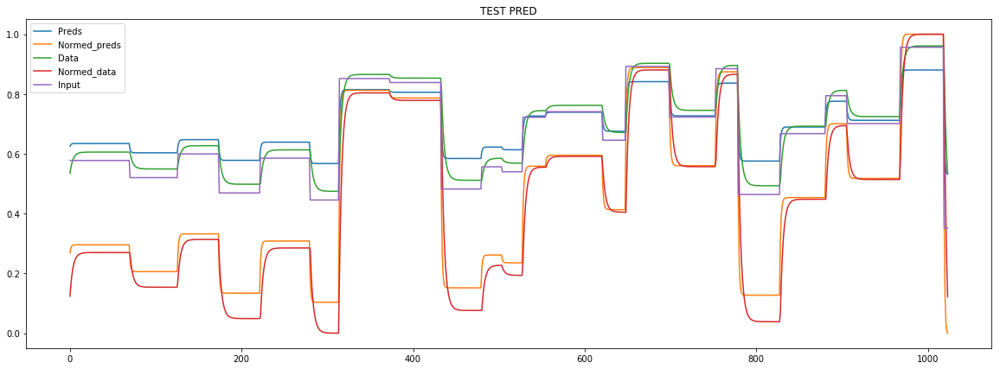

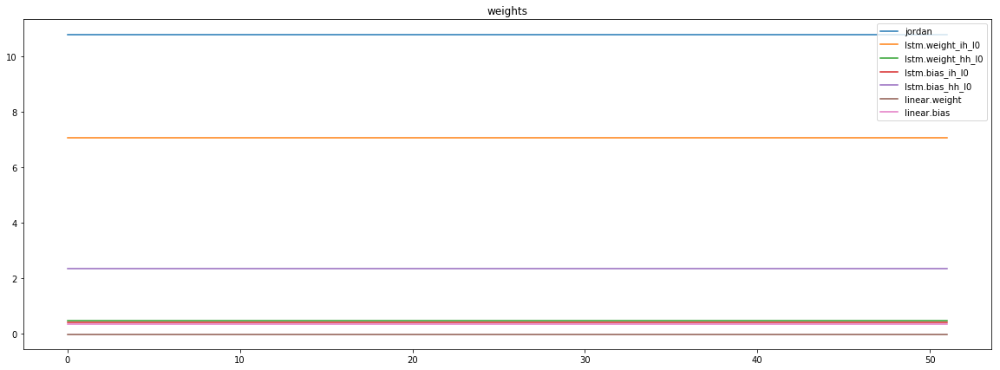

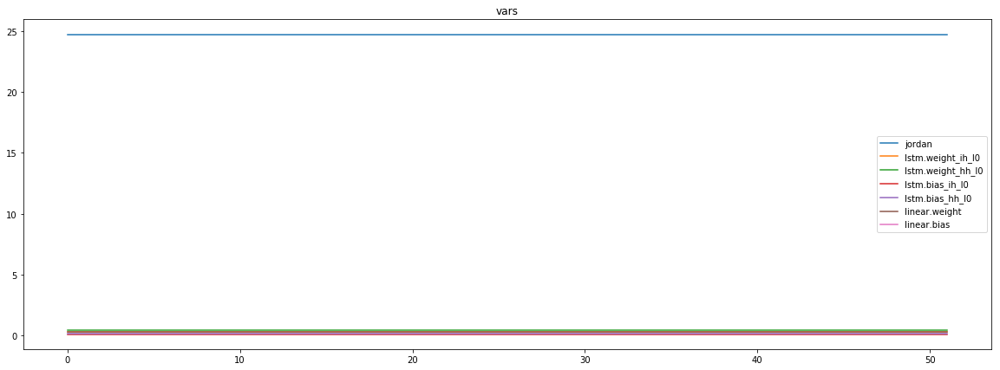

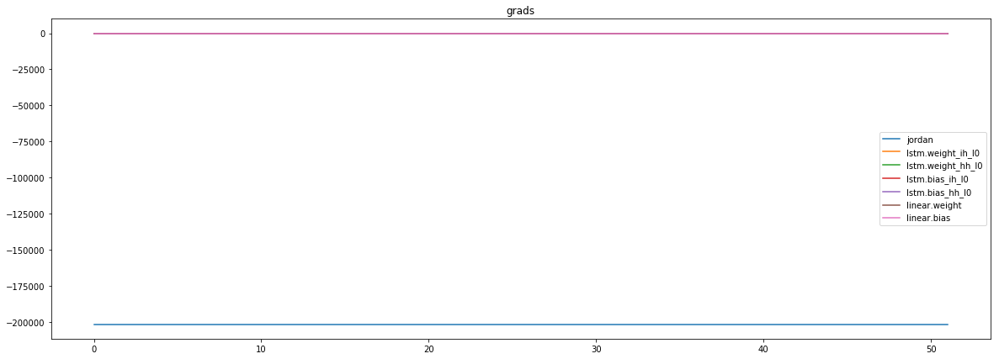

mean_p1 : -57438.0859375
mean_p2 : -141327.0625
mean_p3 : -2937.51513671875


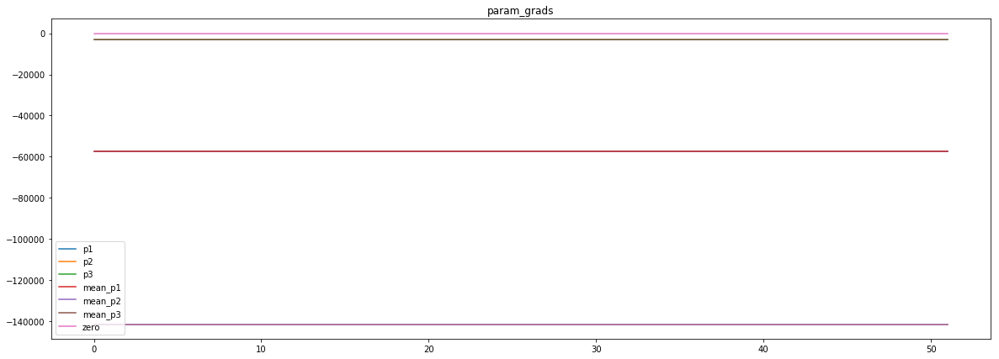

loss rate [0.07461918240709797]
Epoch [10] 
     train_loss[7491.585087702825] 
     eval_train[0.2589652505165969] 
     eval_test[0.2601703121750192]


aux preds: 0.44728872179985046           1.006162405014038           9.446733474731445
main loss 0.0
aux loss 877.4807574932391
jord loss 6363.719613882212
combined loss 7241.200371375451 


Parameter containing:
tensor([[0.4473, 1.0062, 9.4467]], requires_grad=True)


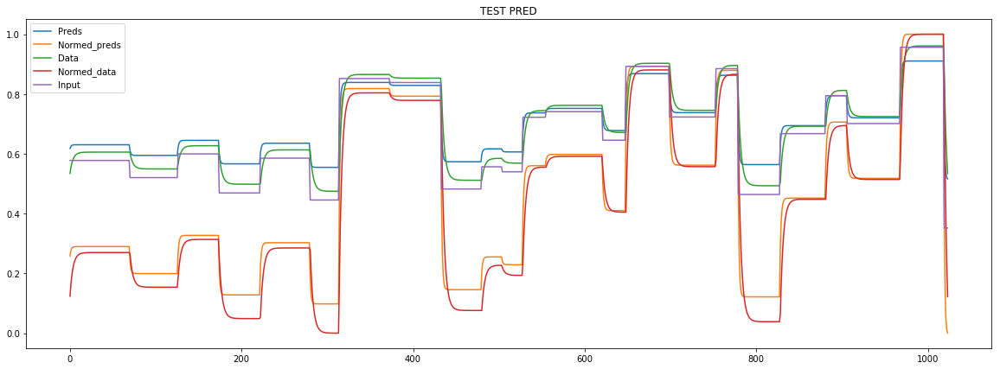

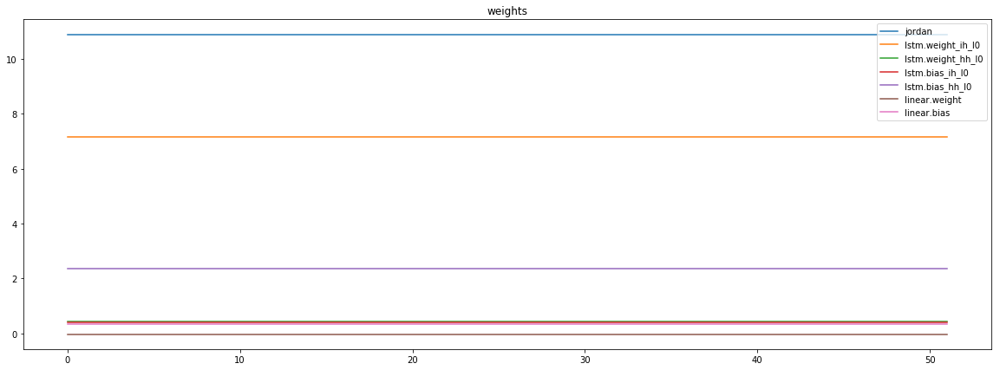

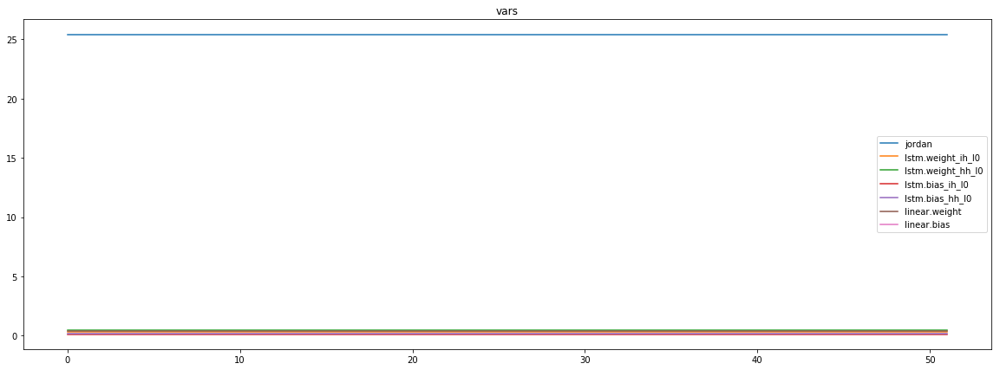

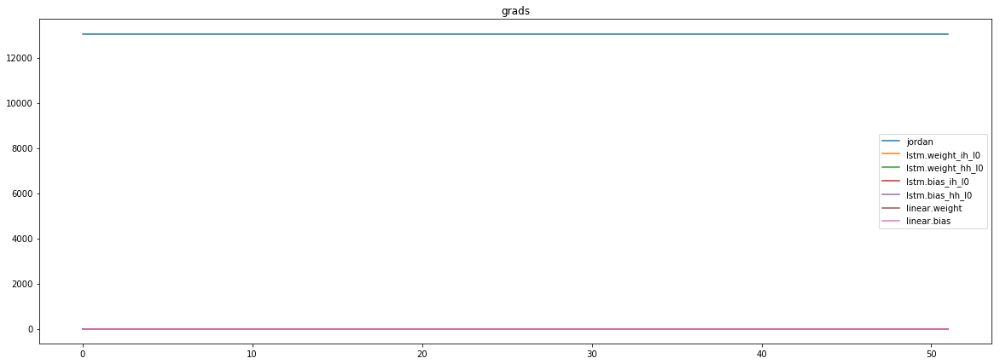

mean_p1 : -67743.2734375
mean_p2 : 81407.6953125
mean_p3 : -608.904541015625


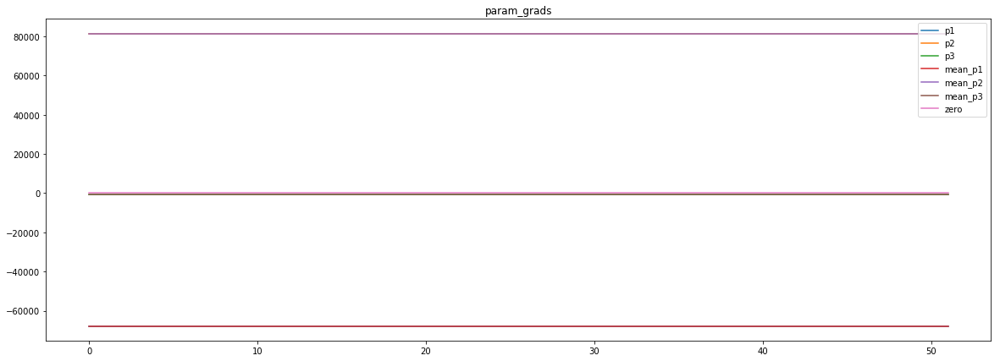

loss rate [0.08847924309037836]
Epoch [11] 
     train_loss[7241.200371375451] 
     eval_train[0.24634869699366388] 
     eval_test[0.2472168556837873]


aux preds: 0.4479551613330841           1.0045005083084106           9.556119918823242
main loss 0.0
aux loss 691.7440297053411
jord loss 6135.94184758113
combined loss 6827.685877286471 


Parameter containing:
tensor([[0.4480, 1.0045, 9.5561]], requires_grad=True)


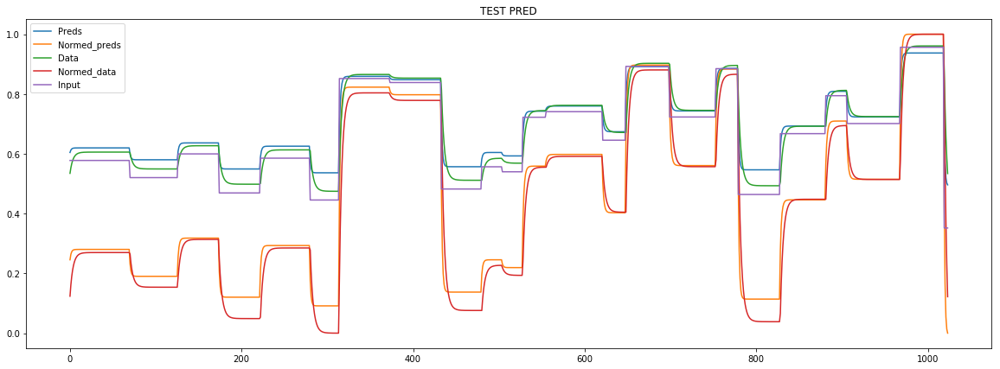

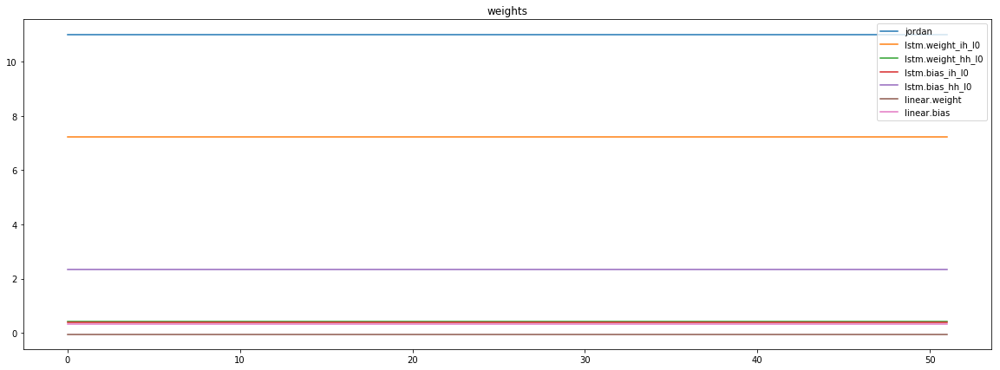

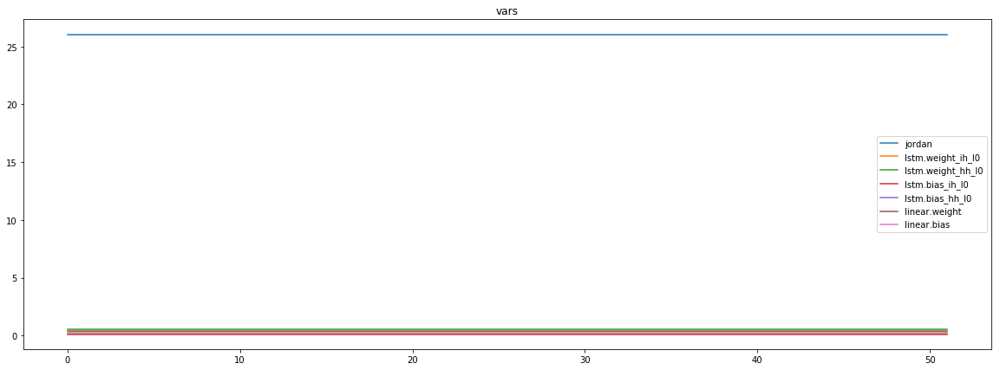

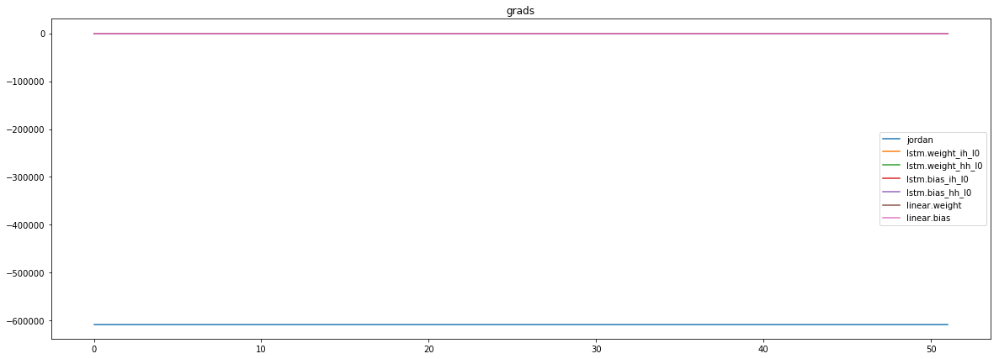

mean_p1 : 21518.94921875
mean_p2 : -621497.0
mean_p3 : -7213.595703125


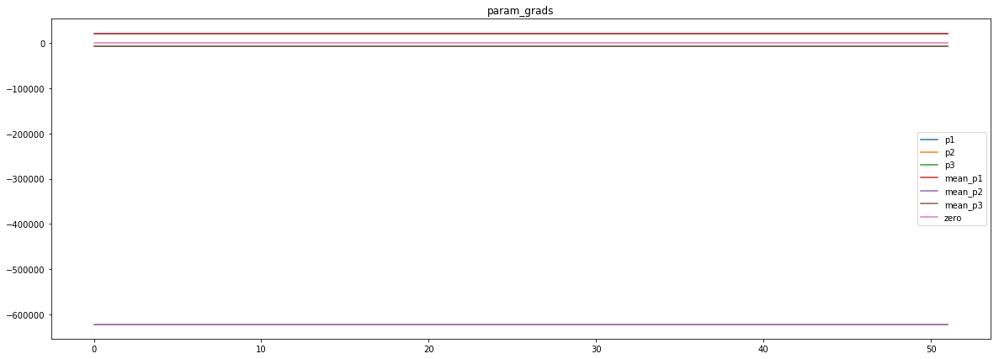

loss rate [0.09847013399845972]
Epoch [12] 
     train_loss[6827.685877286471] 
     eval_train[0.23330632556014907] 
     eval_test[0.2341552444479682]


aux preds: 0.45026180148124695           1.003660798072815           9.627193450927734
main loss 0.0
aux loss 552.7067190317007
jord loss 6169.354219876803
combined loss 6722.060938908504 


Parameter containing:
tensor([[0.4503, 1.0037, 9.6272]], requires_grad=True)


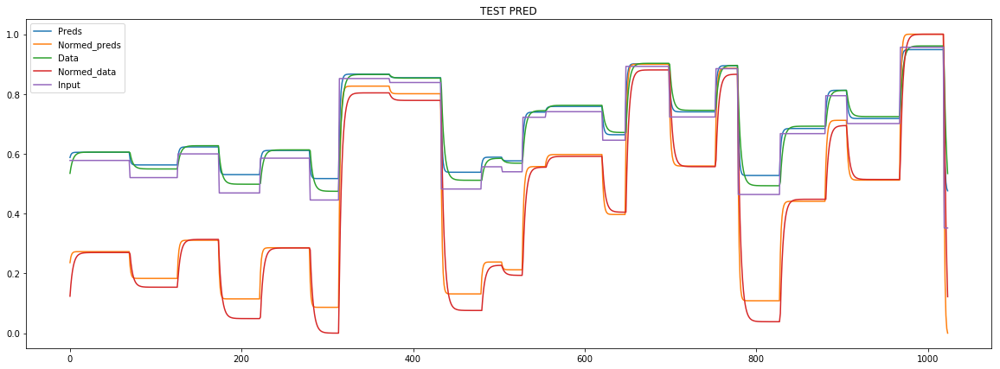

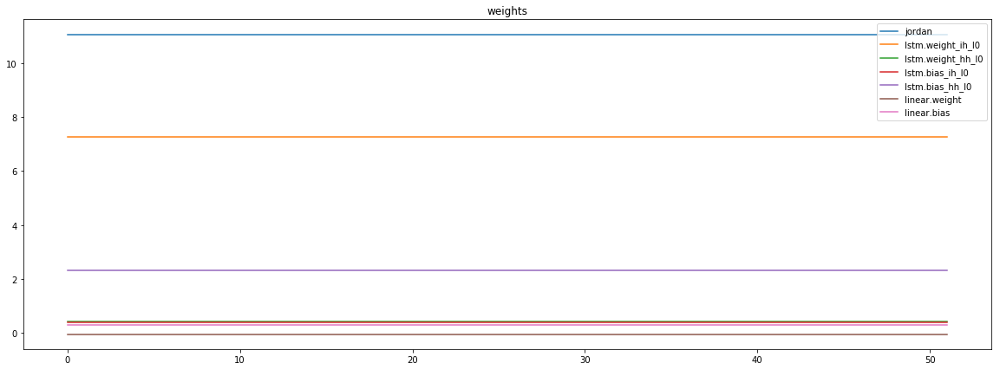

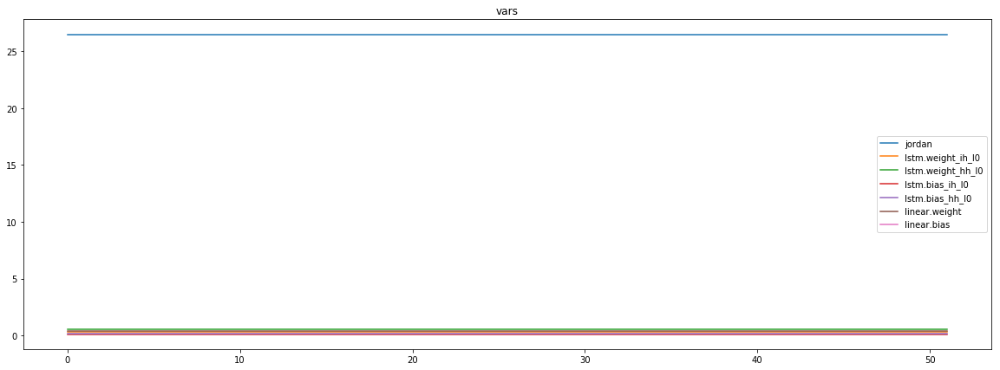

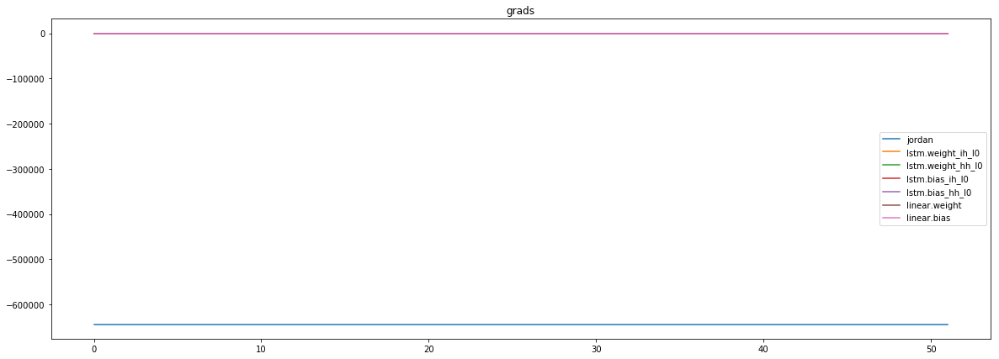

mean_p1 : 12138.654296875
mean_p2 : -648531.75
mean_p3 : -7346.95751953125


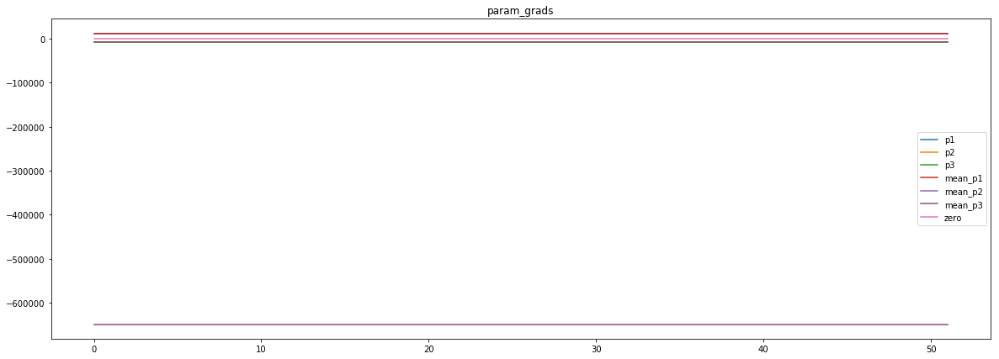

loss rate [0.083176226722525]
Epoch [13] 
     train_loss[6722.060938908504] 
     eval_train[0.22556659831808734] 
     eval_test[0.22662123749879273]


aux preds: 0.4473397731781006           1.0035643577575684           9.702431678771973
main loss 0.0
aux loss 469.9840375460111
jord loss 5930.964388333834
combined loss 6400.948425879845 


Parameter containing:
tensor([[0.4473, 1.0036, 9.7024]], requires_grad=True)


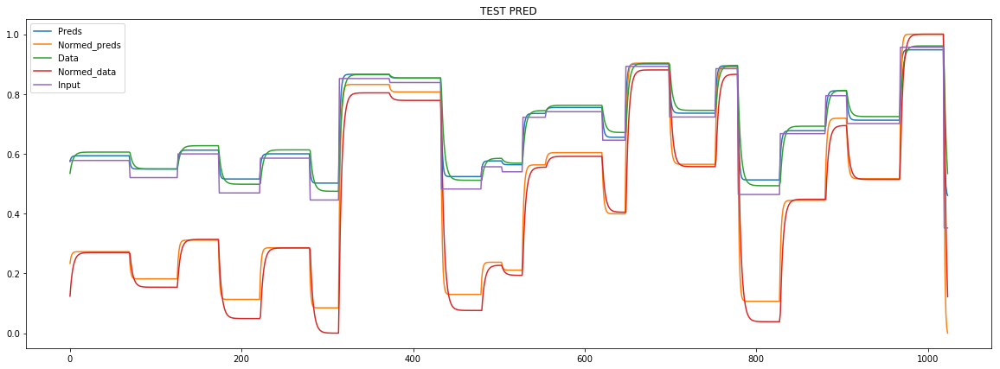

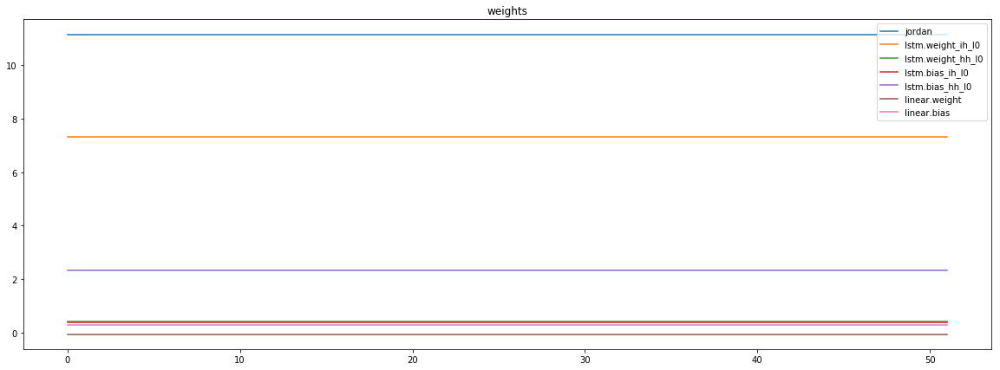

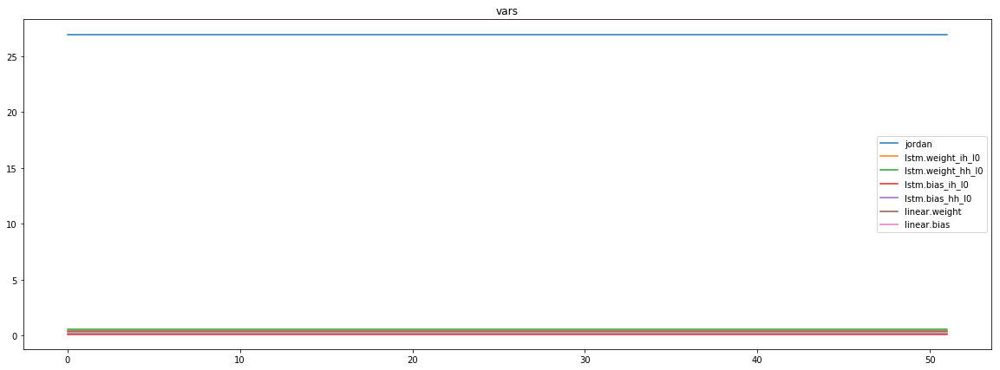

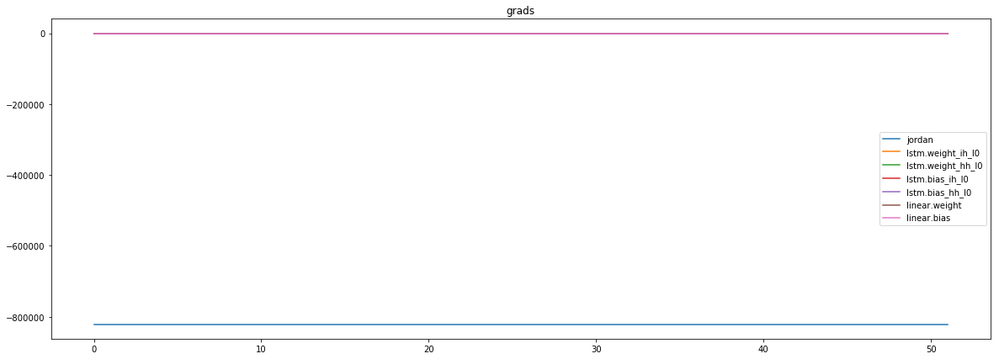

mean_p1 : -21444.11328125
mean_p2 : -791344.4375
mean_p3 : -8216.3232421875


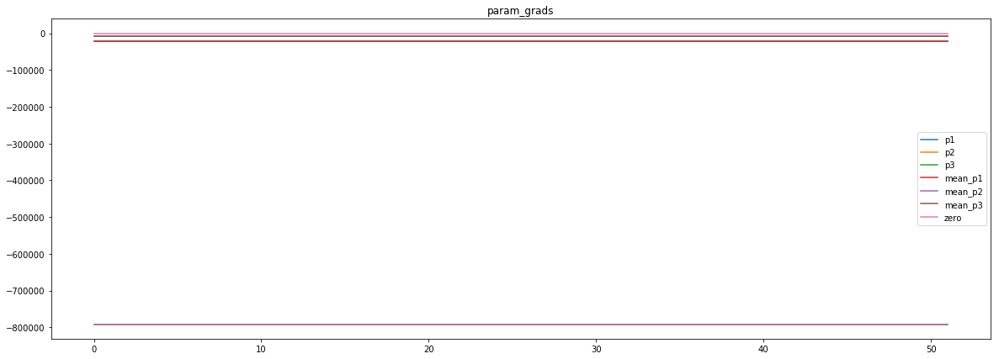

loss rate [0.04715450678741695]
Epoch [14] 
     train_loss[6400.948425879845] 
     eval_train[0.22325552851319883] 
     eval_test[0.22486942032860083]


aux preds: 0.4500417709350586           1.0024597644805908           9.774515151977539
main loss 0.0
aux loss 446.83348552997296
jord loss 5808.150428185096
combined loss 6254.983913715068 


Parameter containing:
tensor([[0.4500, 1.0025, 9.7745]], requires_grad=True)


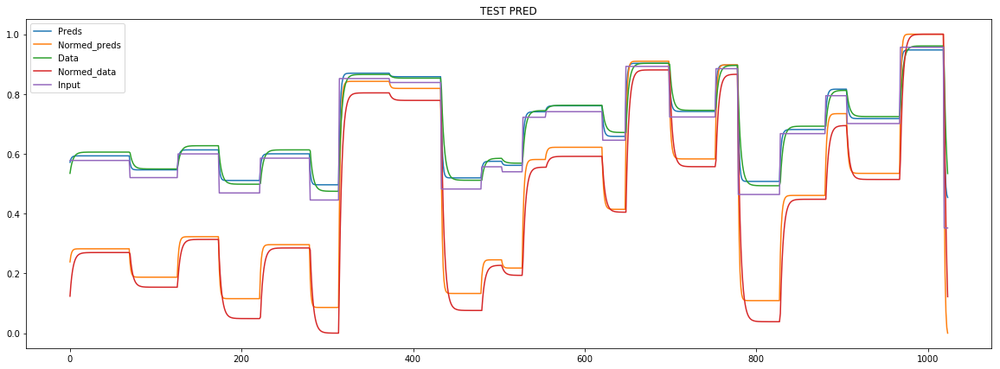

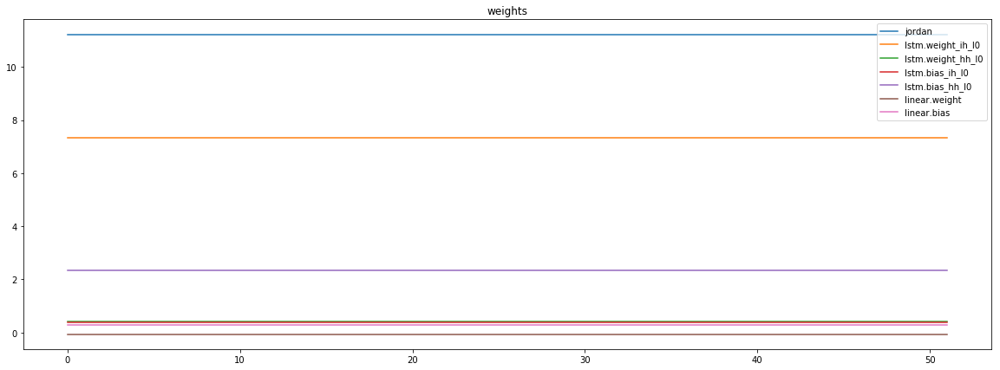

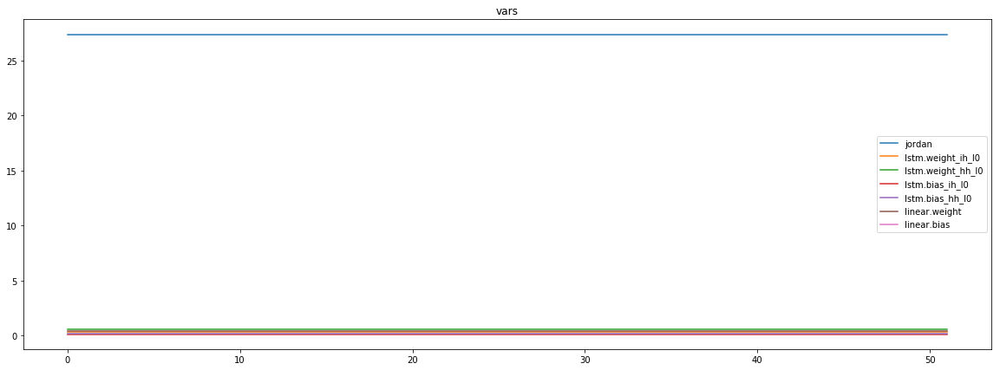

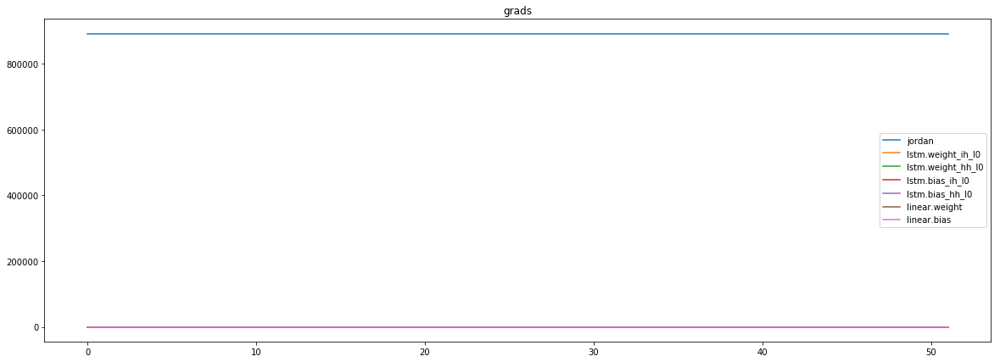

mean_p1 : -30278.361328125
mean_p2 : 913032.625
mean_p3 : 9160.0498046875


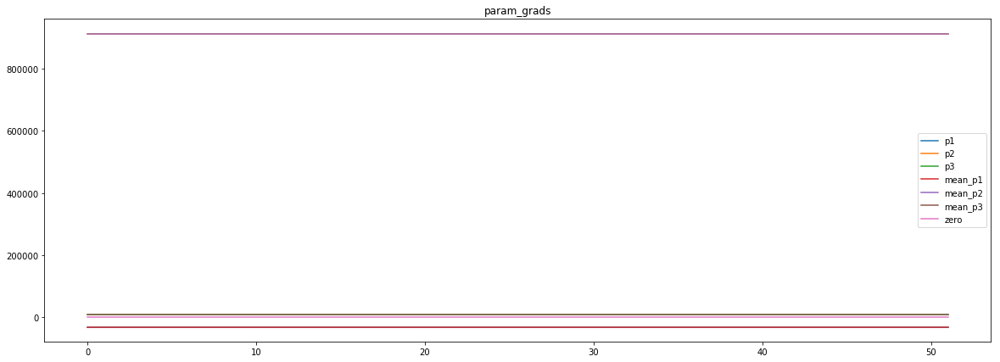

loss rate [0.023366417610292567]
Epoch [15] 
     train_loss[6254.983913715068] 
     eval_train[0.22149063962010235] 
     eval_test[0.2232082712633366]


aux preds: 0.44727596640586853           0.9992968440055847           9.835070610046387
main loss 0.0
aux loss 432.5226358266977
jord loss 5671.839693509615
combined loss 6104.3623293363125 


Parameter containing:
tensor([[0.4473, 0.9993, 9.8351]], requires_grad=True)


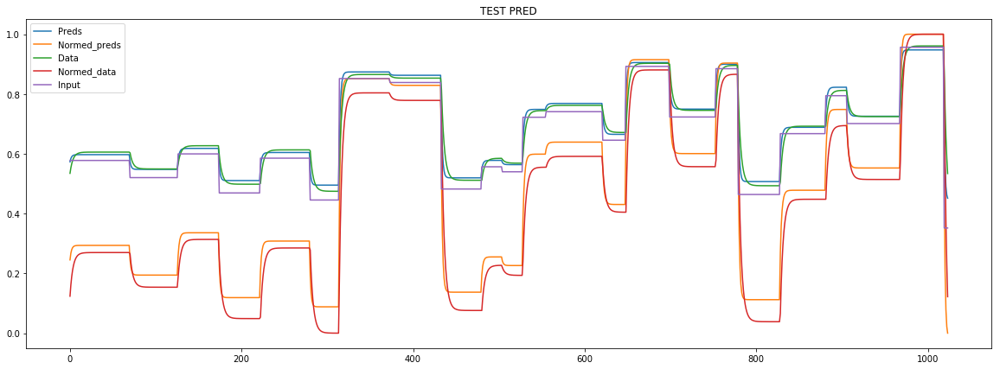

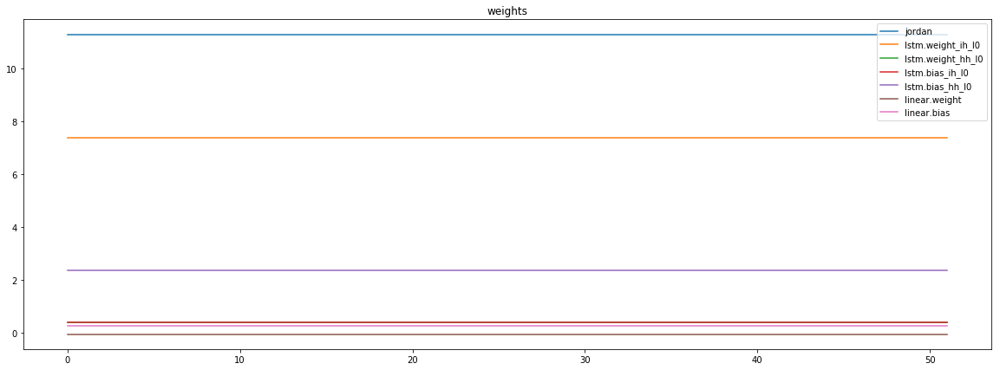

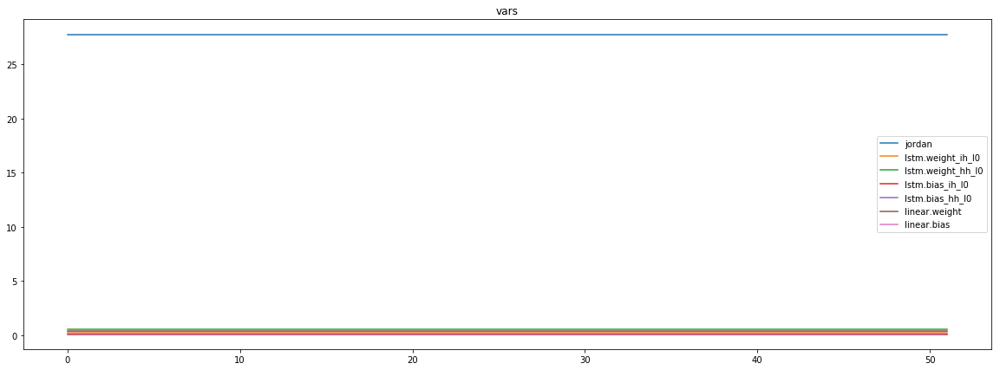

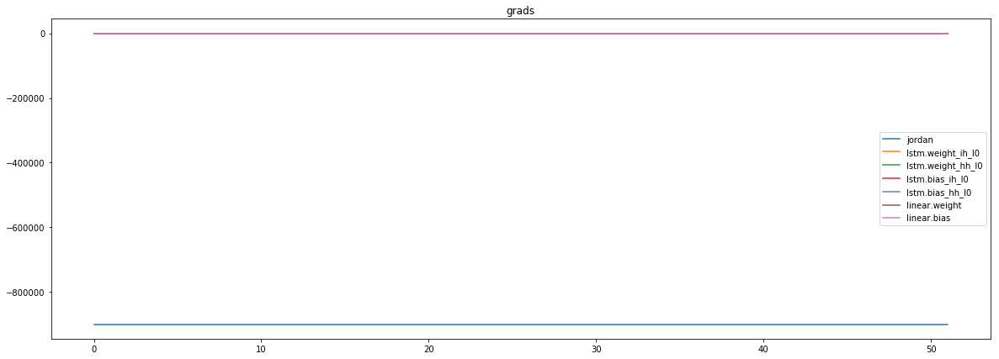

mean_p1 : -1451.8709716796875
mean_p2 : -888721.0625
mean_p3 : -8902.404296875


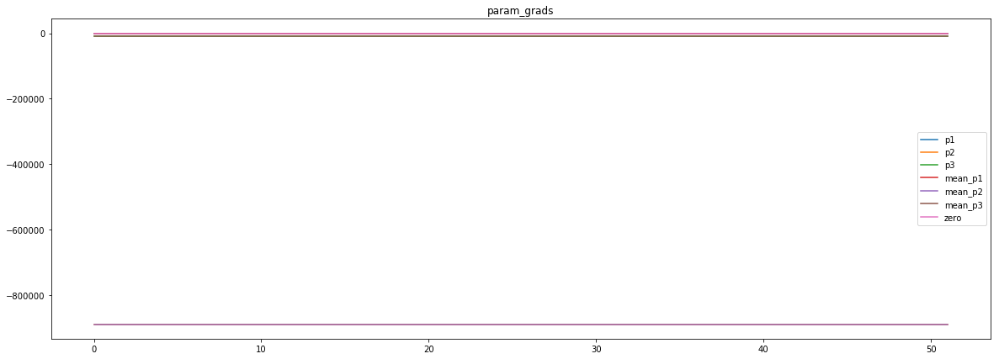

loss rate [0.009752385537881825]
Epoch [16] 
     train_loss[6104.3623293363125] 
     eval_train[0.2209418854819467] 
     eval_test[0.22270633500408044]


aux preds: 0.44950005412101746           0.9981639385223389           9.865325927734375
main loss 0.0
aux loss 421.274899996244
jord loss 5960.411907489483
combined loss 6381.6868074857275 


Parameter containing:
tensor([[0.4495, 0.9982, 9.8653]], requires_grad=True)


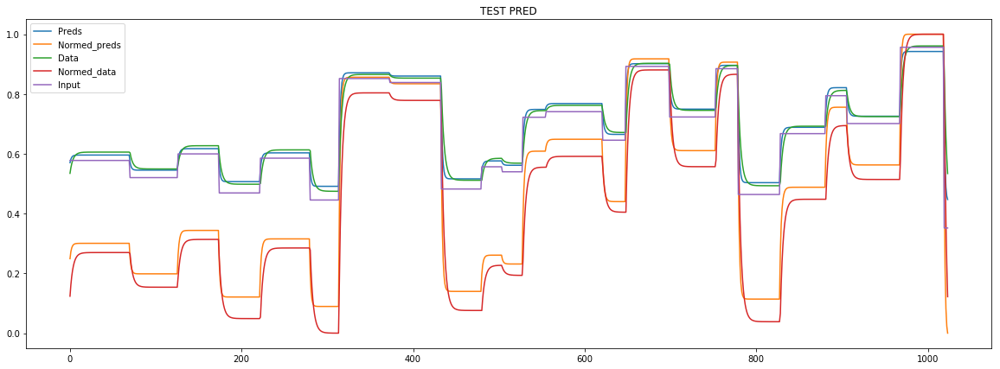

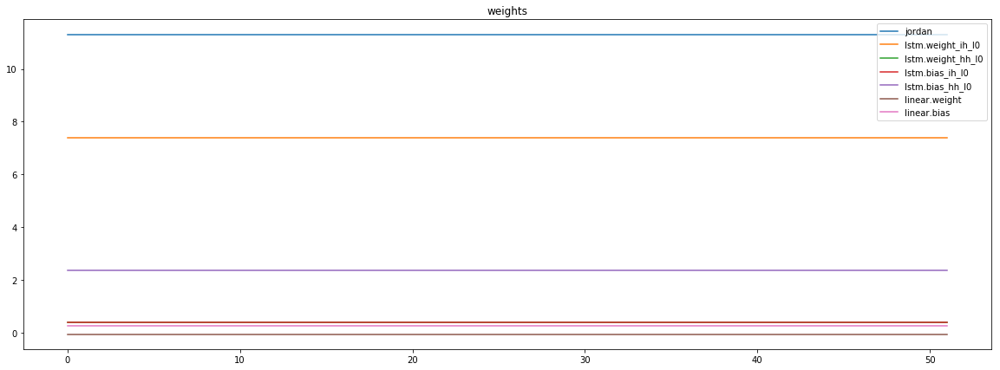

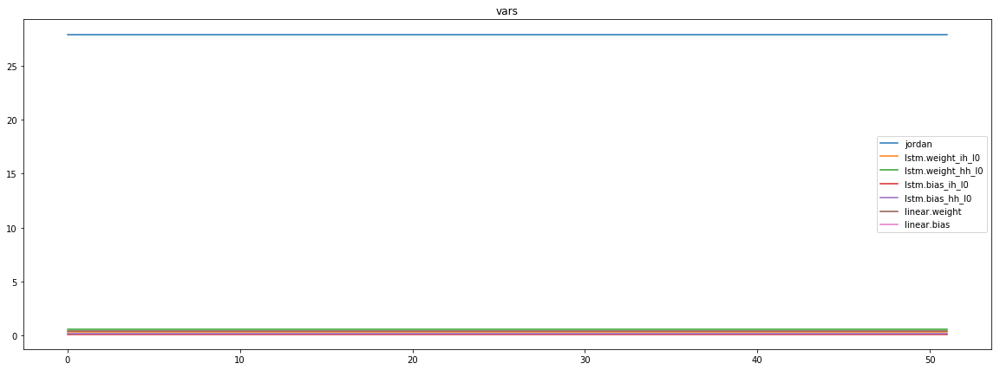

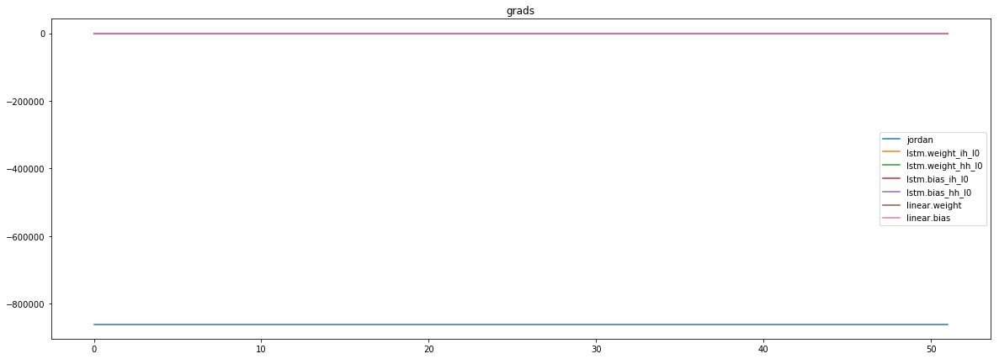

mean_p1 : 14271.4404296875
mean_p2 : -865635.875
mean_p3 : -8711.9814453125


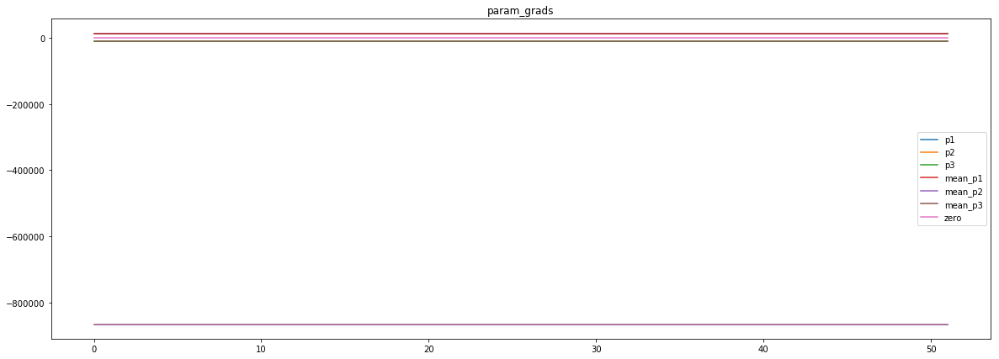

loss rate [0.006418287865561867]
Epoch [17] 
     train_loss[6381.6868074857275] 
     eval_train[0.220180382199872] 
     eval_test[0.22215958053923465]


aux preds: 0.44534963369369507           1.0016720294952393           9.876031875610352
main loss 0.0
aux loss 414.3885744535006
jord loss 6258.817580003005
combined loss 6673.206154456506 


Parameter containing:
tensor([[0.4453, 1.0017, 9.8760]], requires_grad=True)


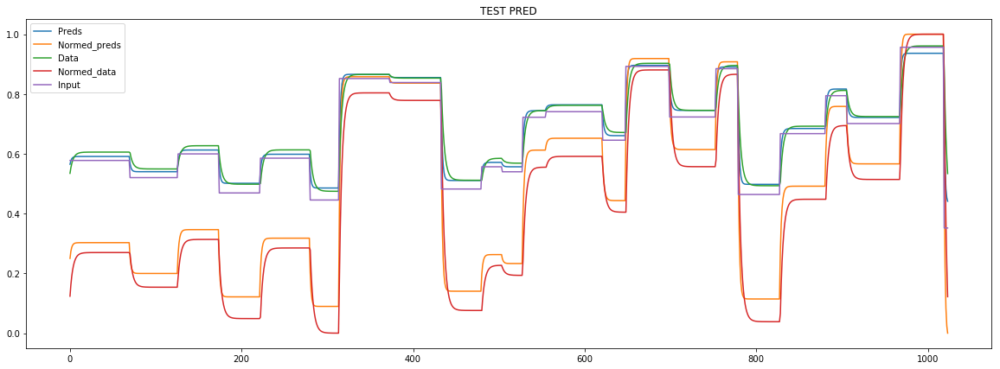

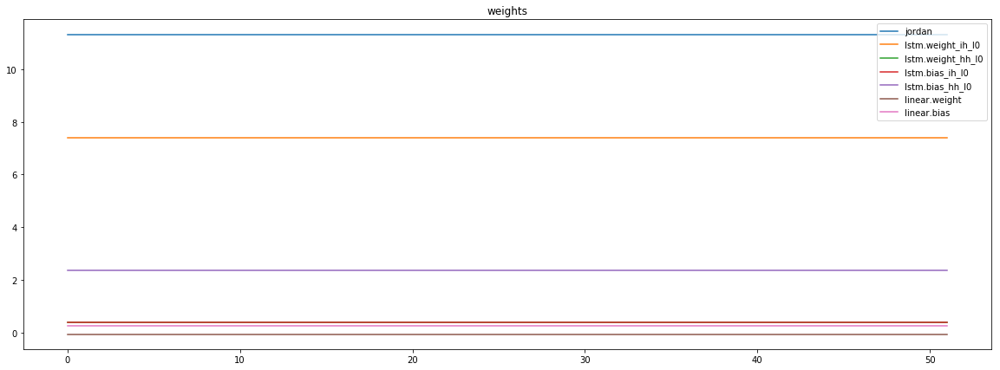

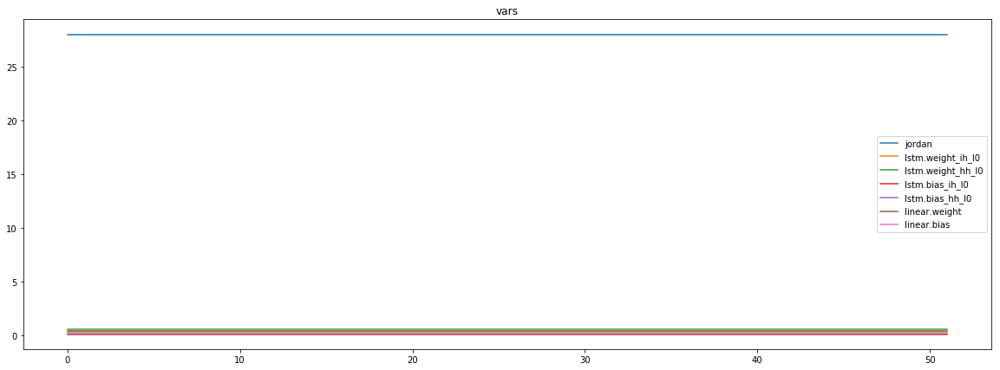

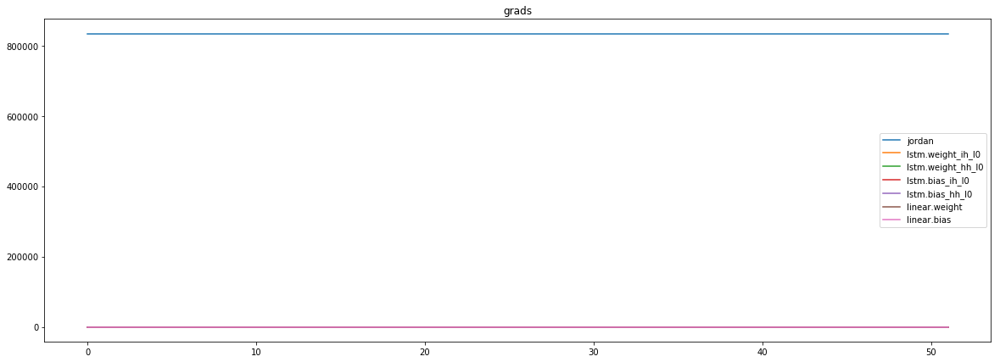

mean_p1 : -49858.2578125
mean_p2 : 875002.3125
mean_p3 : 8729.296875


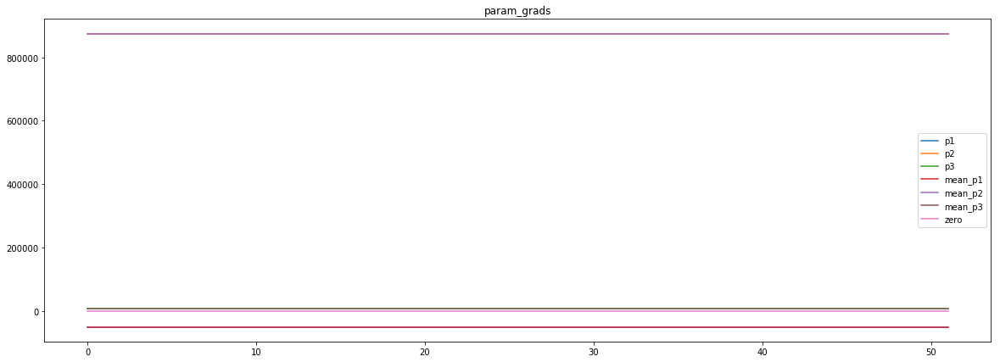

loss rate [0.0020609986806728875]
Epoch [18] 
     train_loss[6673.206154456506] 
     eval_train[0.2199781498370262] 
     eval_test[0.22223242892968384]


aux preds: 0.4488931894302368           0.9997390508651733           9.890655517578125
main loss 0.0
aux loss 411.20135791485126
jord loss 6006.357187124399
combined loss 6417.558545039251 


Parameter containing:
tensor([[0.4489, 0.9997, 9.8907]], requires_grad=True)


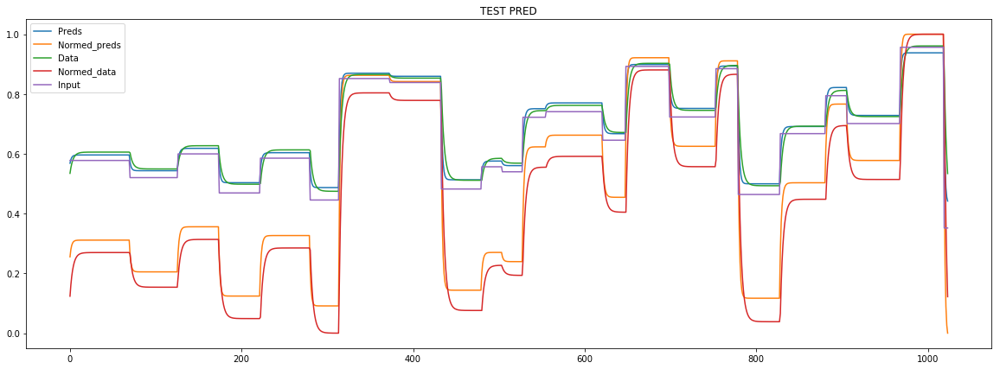

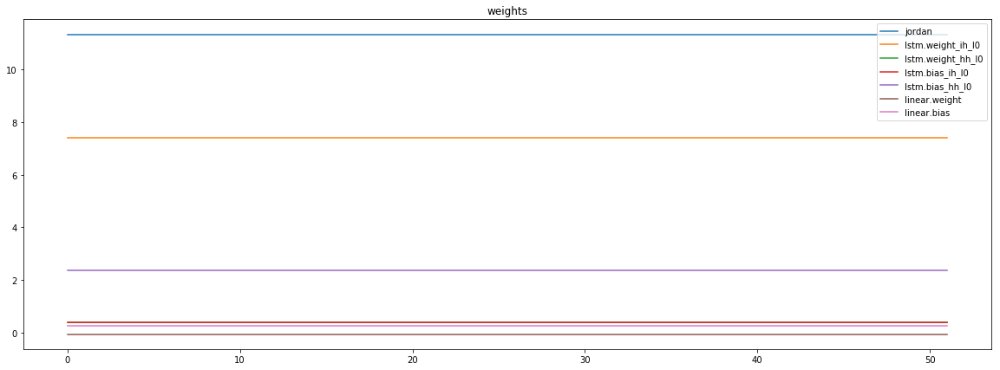

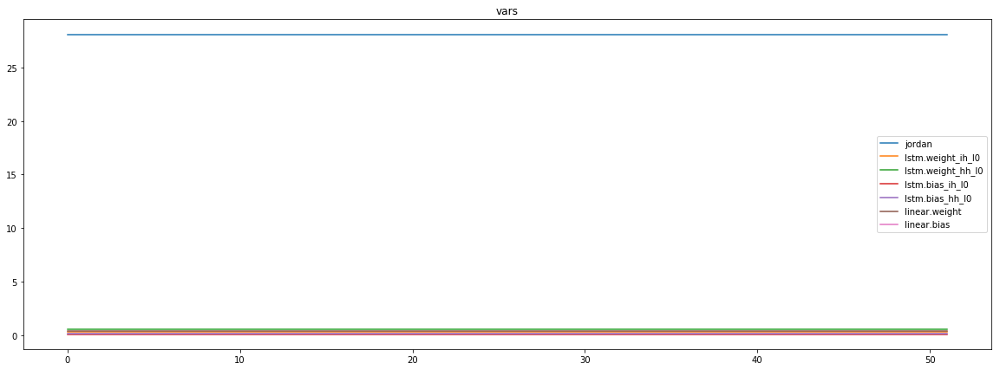

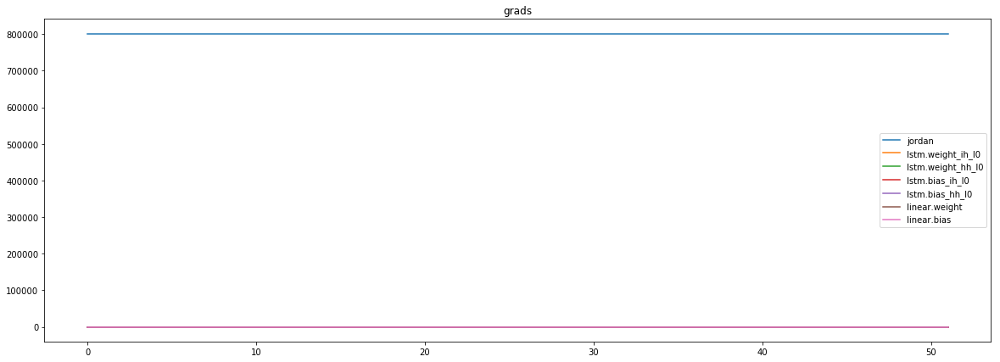

mean_p1 : 9913.7998046875
mean_p2 : 783635.5
mean_p3 : 7914.84619140625


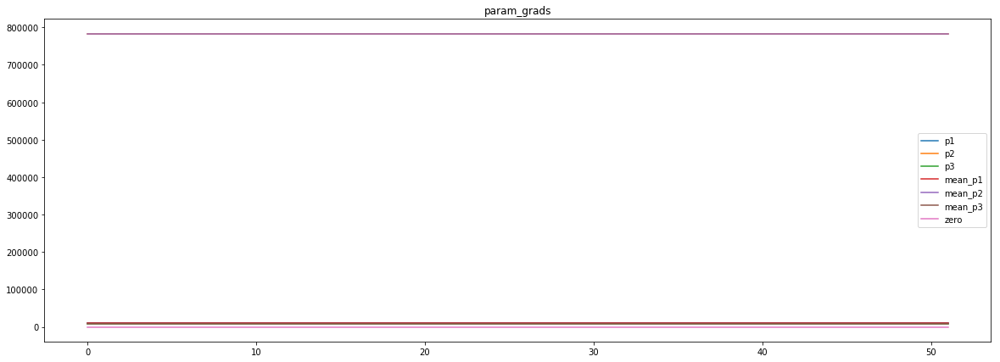

loss rate [0.002467559823363441]
Epoch [19] 
     train_loss[6417.558545039251] 
     eval_train[0.219579811530331] 
     eval_test[0.22181741313331504]


aux preds: 0.44916266202926636           0.9997062087059021           9.903366088867188
main loss 0.0
aux loss 408.1358971228966
jord loss 6077.140639085036
combined loss 6485.276536207933 


Parameter containing:
tensor([[0.4492, 0.9997, 9.9034]], requires_grad=True)


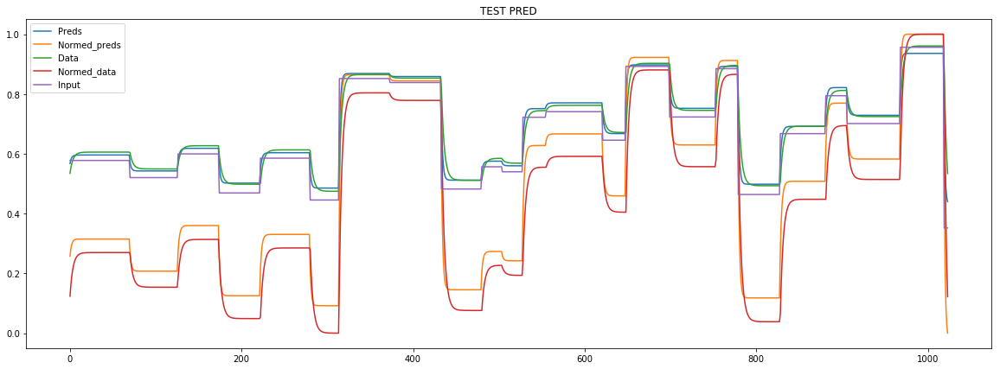

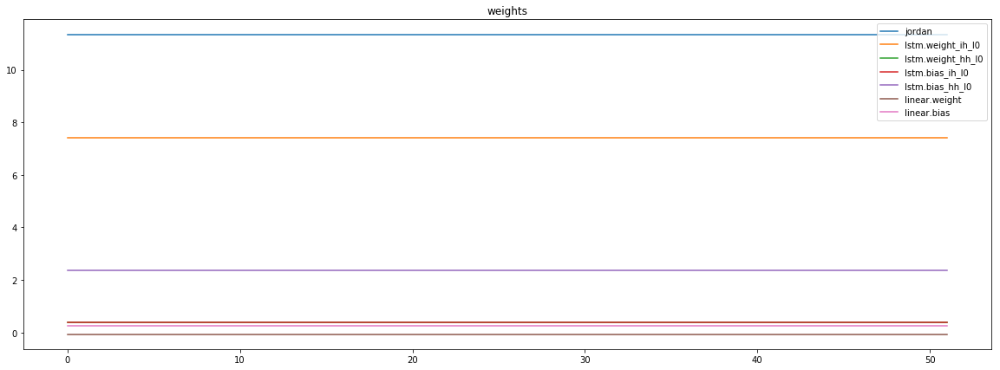

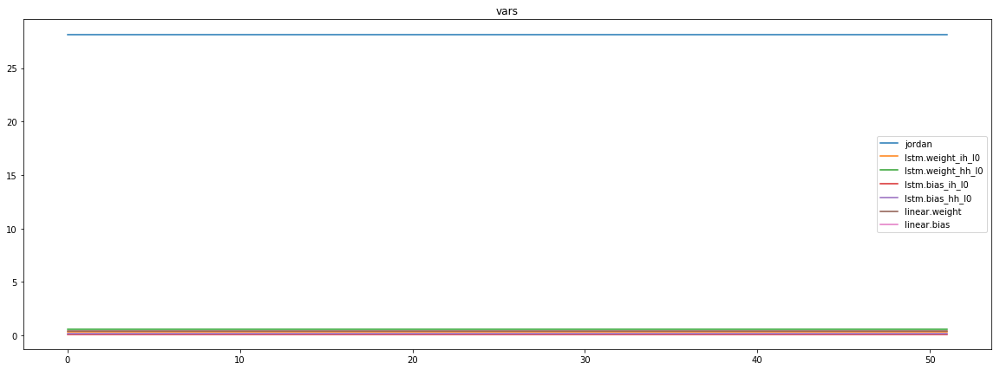

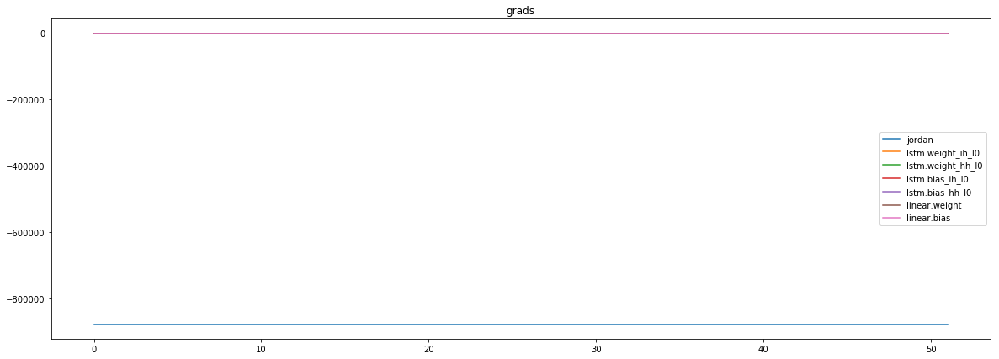

mean_p1 : -1191.0821533203125
mean_p2 : -867054.5
mean_p3 : -8694.005859375


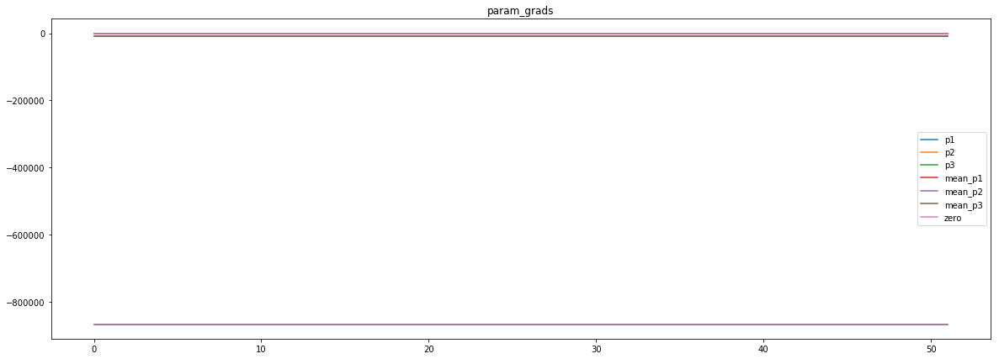

loss rate [0.00162188564356458]
Epoch [20] 
     train_loss[6485.276536207933] 
     eval_train[0.21938424541328386] 
     eval_test[0.22170963570136915]


aux preds: 0.4476153254508972           0.9990185499191284           9.910887718200684
main loss 0.0
aux loss 404.50559880183295
jord loss 6121.050631009615
combined loss 6525.556229811448 


Parameter containing:
tensor([[0.4476, 0.9990, 9.9109]], requires_grad=True)


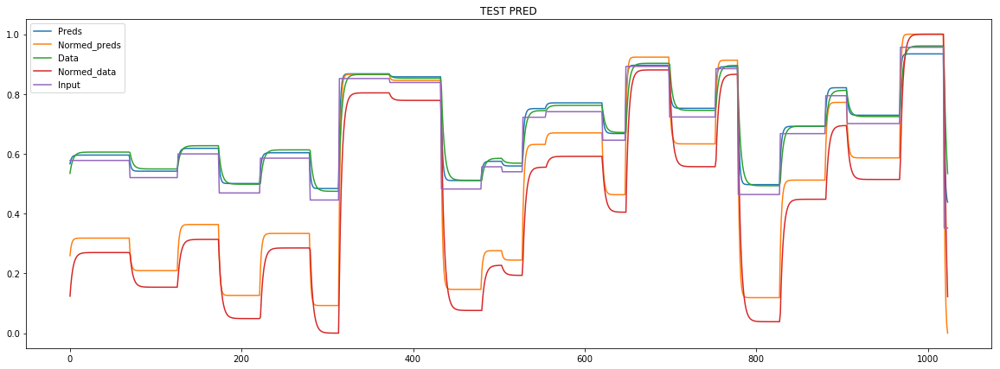

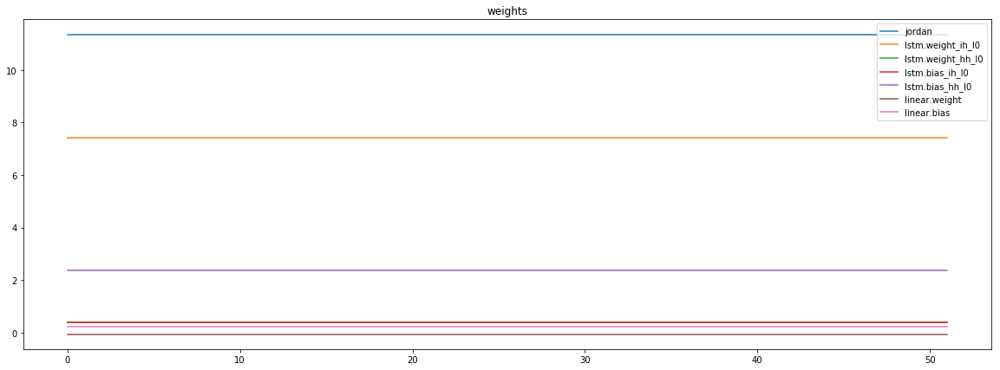

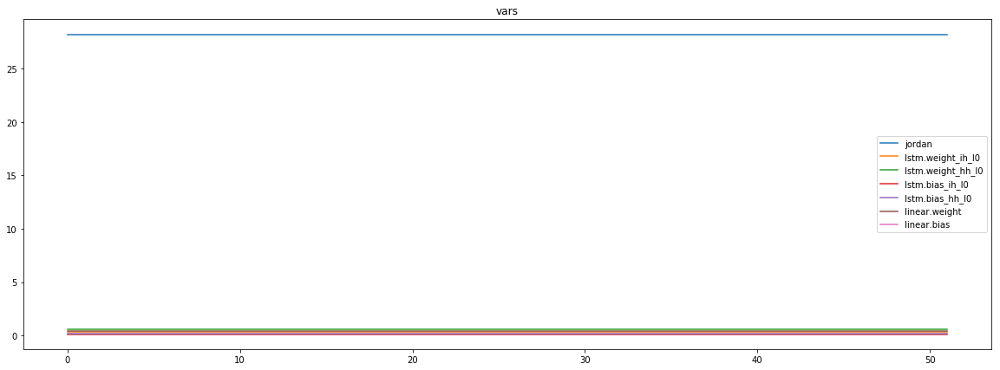

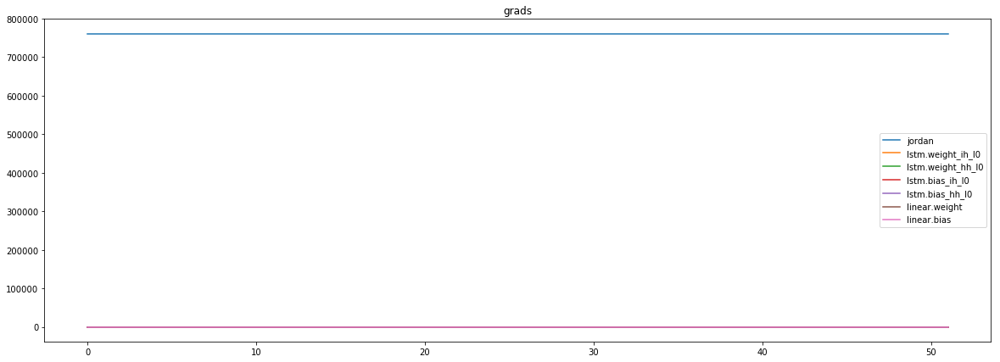

mean_p1 : -70811.1875
mean_p2 : 823729.375
mean_p3 : 8208.6357421875


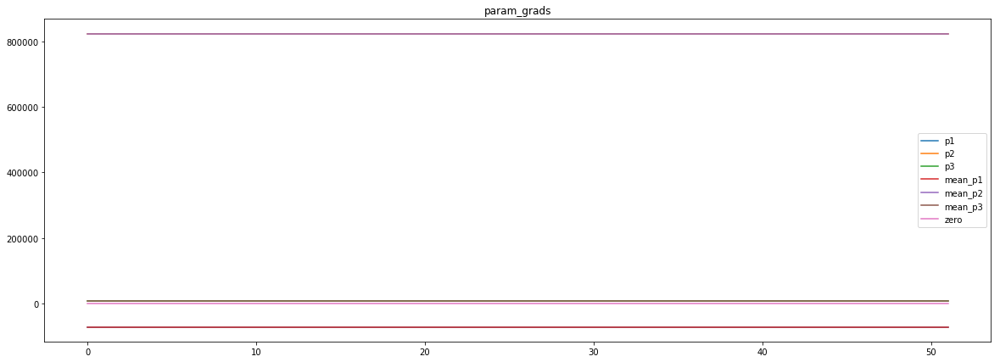

loss rate [0.0012790811919456413]
Epoch [21] 
     train_loss[6525.556229811448] 
     eval_train[0.21922928402916741] 
     eval_test[0.22163597244600003]


aux preds: 0.4502188265323639           1.0015134811401367           9.926312446594238
main loss 0.0
aux loss 403.7419175368089
jord loss 5955.323725773738
combined loss 6359.065643310547 


Parameter containing:
tensor([[0.4502, 1.0015, 9.9263]], requires_grad=True)


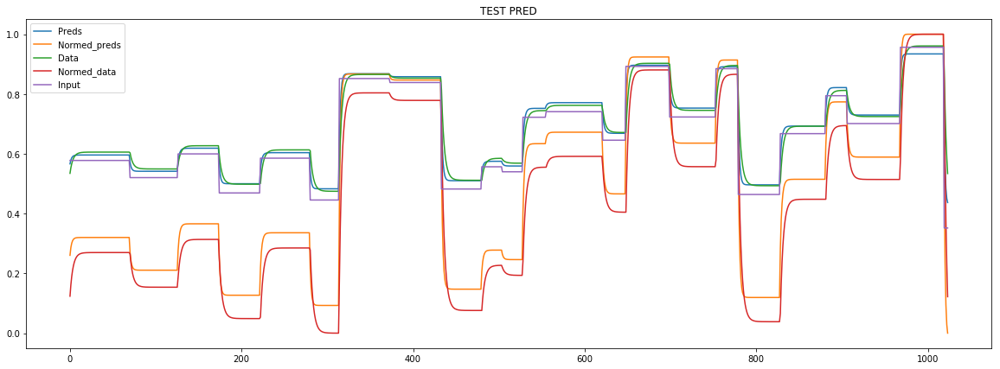

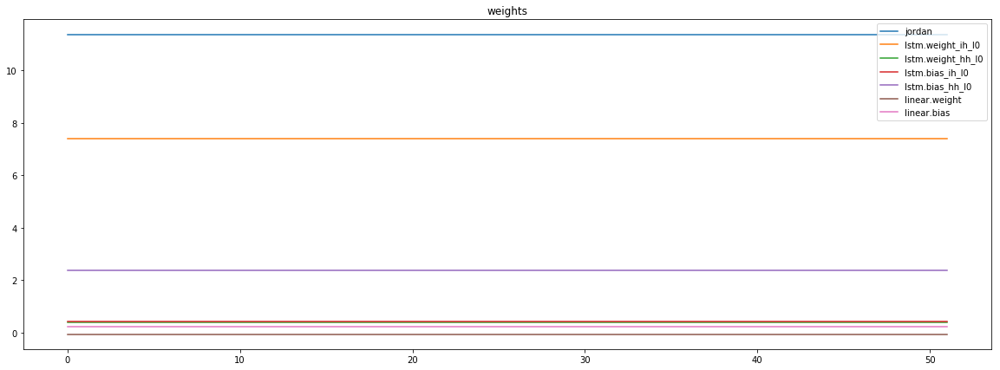

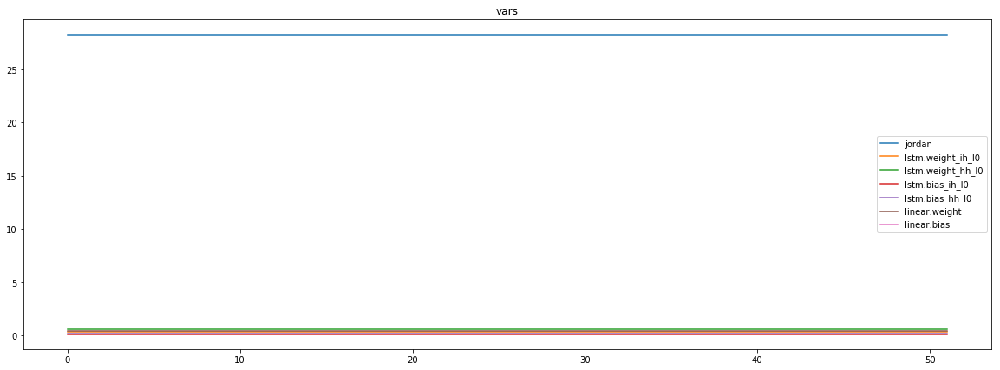

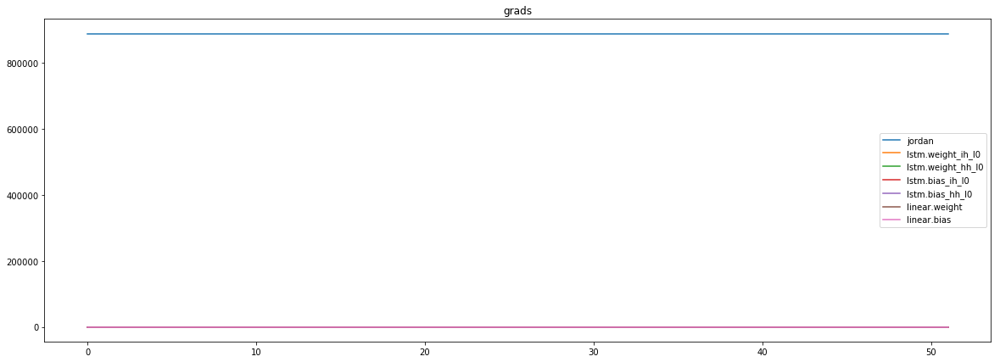

mean_p1 : -26240.69140625
mean_p2 : 906603.625
mean_p3 : 9118.5830078125


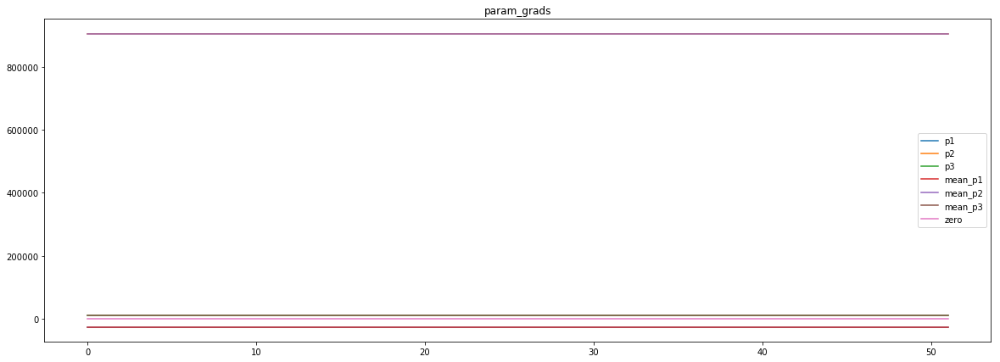

loss rate [0.0006146882964155331]
Epoch [22] 
     train_loss[6359.065643310547] 
     eval_train[0.21912506700923234] 
     eval_test[0.22158471778543157]


aux preds: 0.45052289962768555           1.0023257732391357           9.931900024414062
main loss 0.0
aux loss 403.0992114727314
jord loss 5931.827721228967
combined loss 6334.926932701698 


Parameter containing:
tensor([[0.4505, 1.0023, 9.9319]], requires_grad=True)


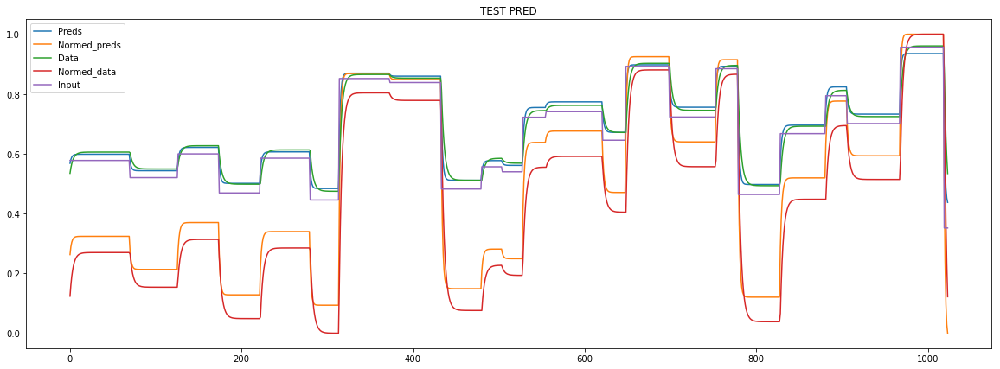

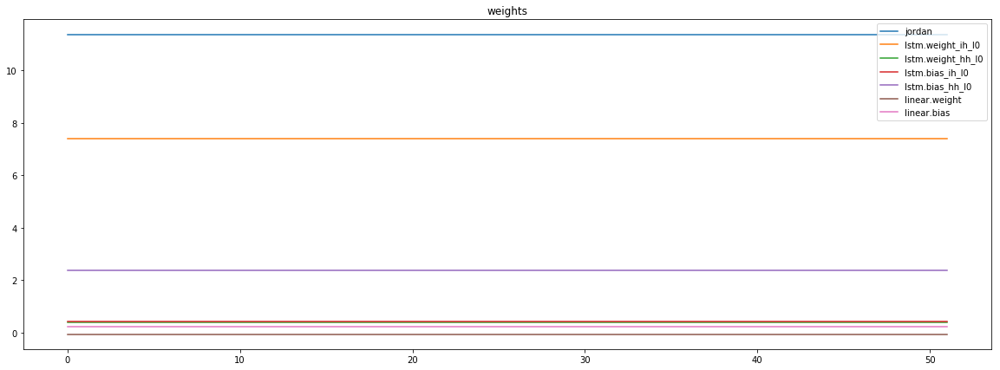

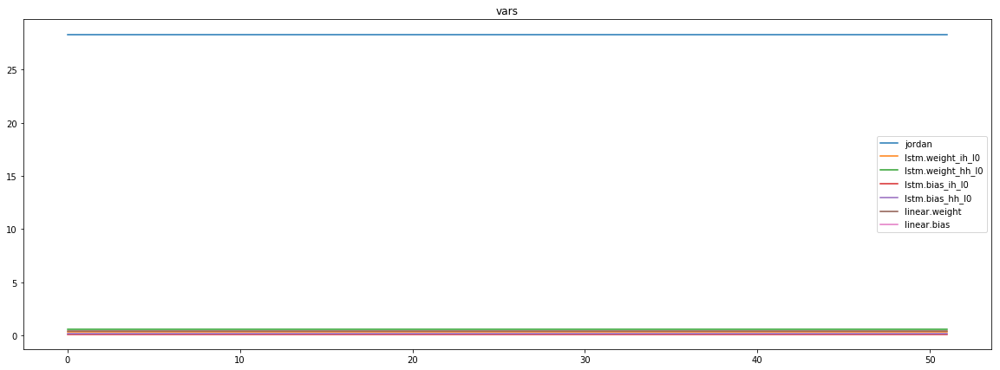

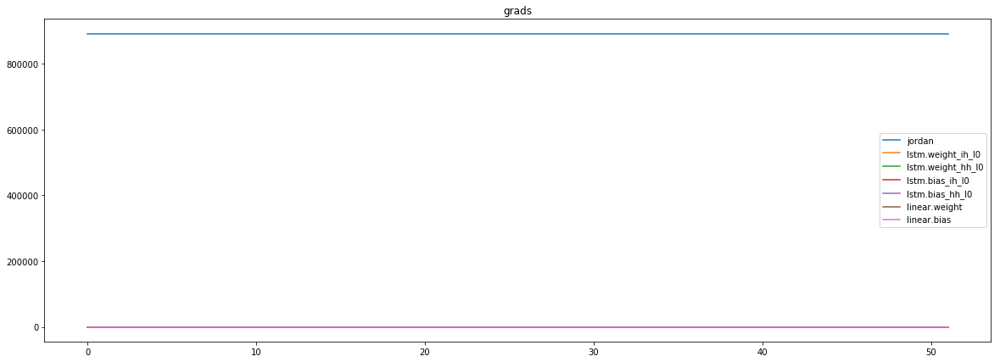

mean_p1 : -31471.0546875
mean_p2 : 914345.0625
mean_p3 : 9173.2236328125


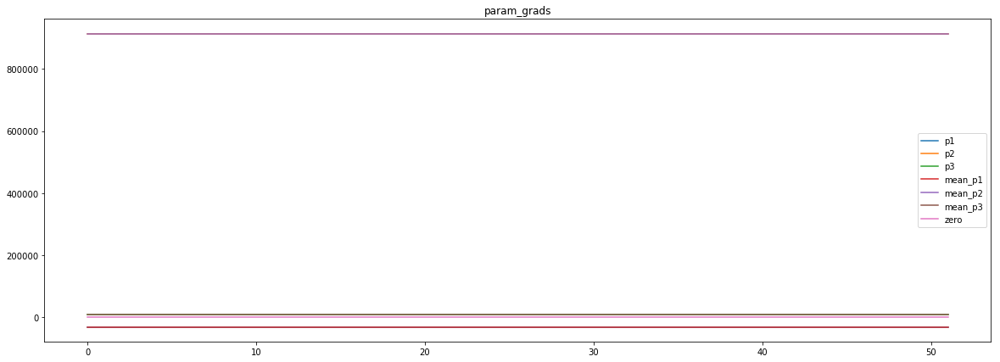

loss rate [-0.0001491990580315683]
Epoch [23] 
     train_loss[6334.926932701698] 
     eval_train[0.2192535270542766] 
     eval_test[0.2216765109703622]


aux preds: 0.4476839303970337           0.998859703540802           9.930533409118652
main loss 0.0
aux loss 404.57122509296124
jord loss 6390.154573880709
combined loss 6794.72579897367 


Parameter containing:
tensor([[0.4477, 0.9989, 9.9305]], requires_grad=True)


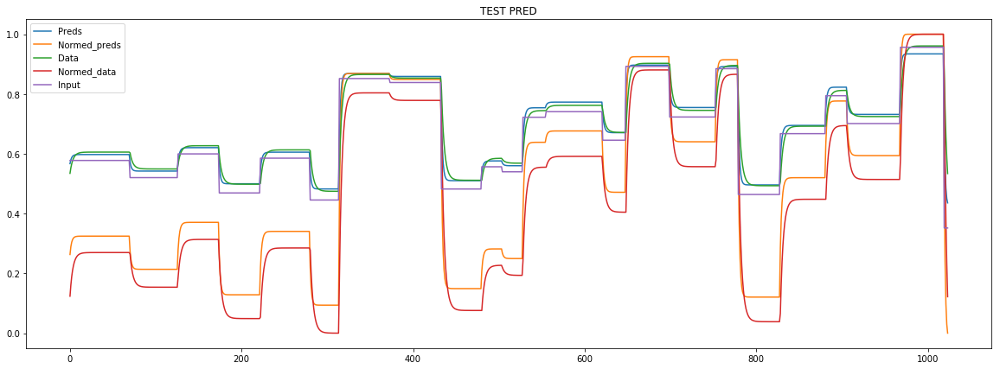

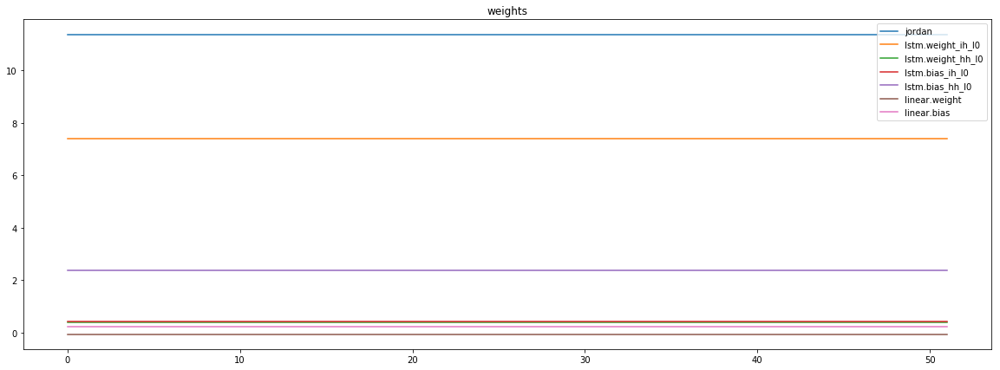

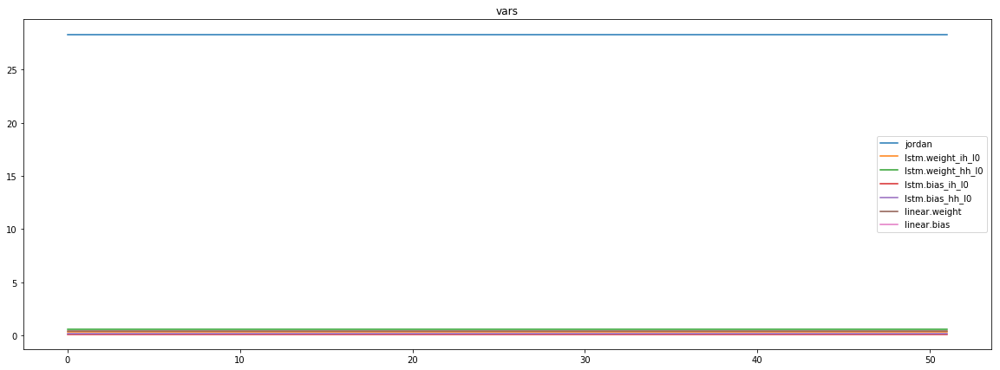

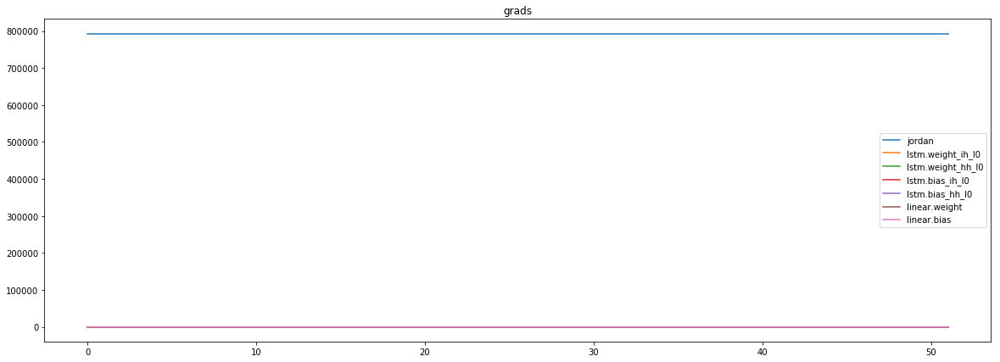

mean_p1 : -62173.92578125
mean_p2 : 846713.5
mean_p3 : 8449.68359375


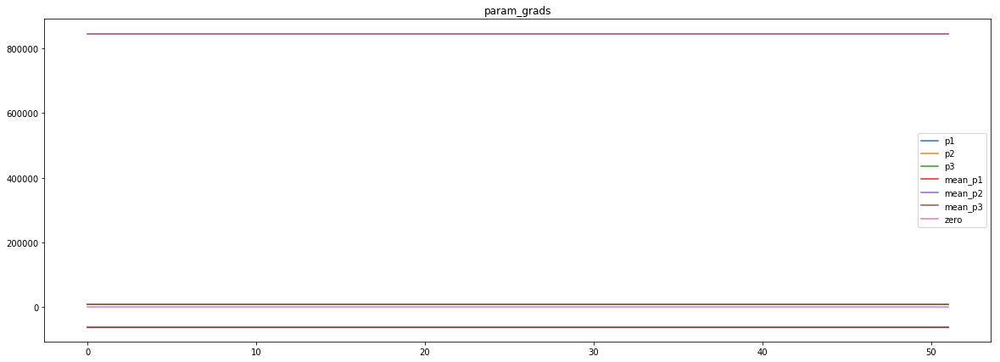

loss rate [0.0004224055072229449]
Epoch [24] 
     train_loss[6794.72579897367] 
     eval_train[0.2190407497736697] 
     eval_test[0.2215387816540897]


aux preds: 0.44974079728126526           1.0016621351242065           9.933015823364258
main loss 0.0
aux loss 399.32071274977466
jord loss 5973.232896071214
combined loss 6372.553608820988 


Parameter containing:
tensor([[0.4497, 1.0017, 9.9330]], requires_grad=True)


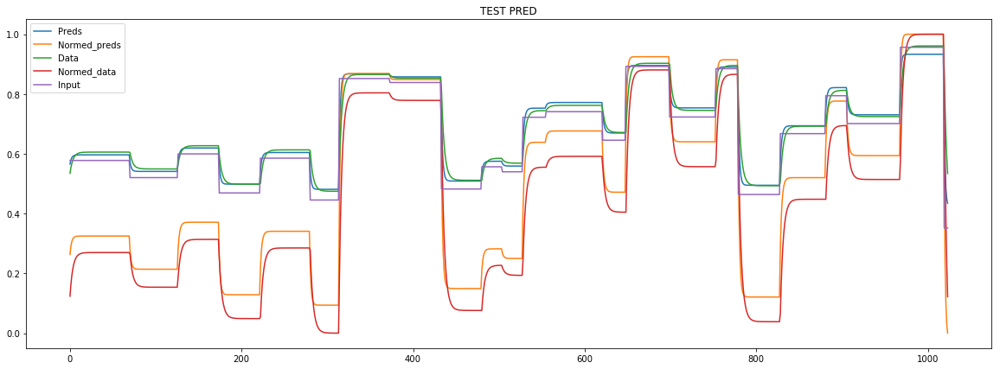

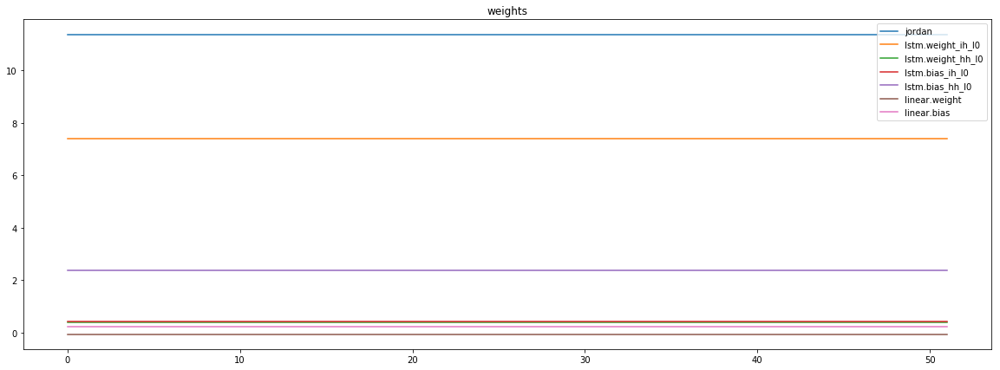

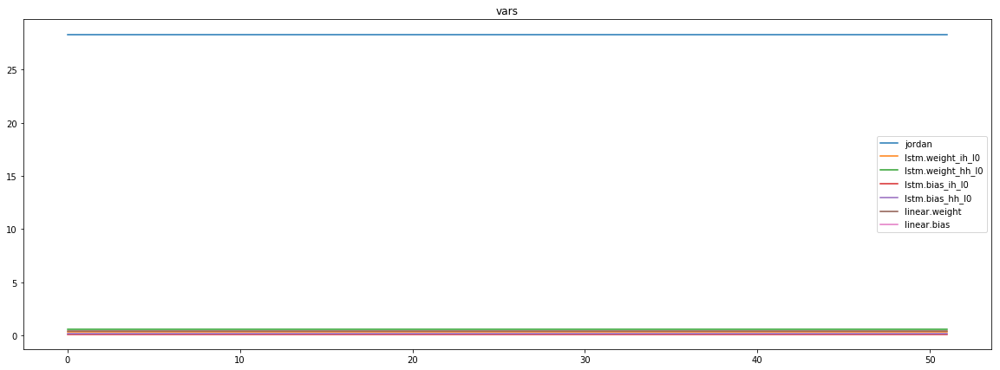

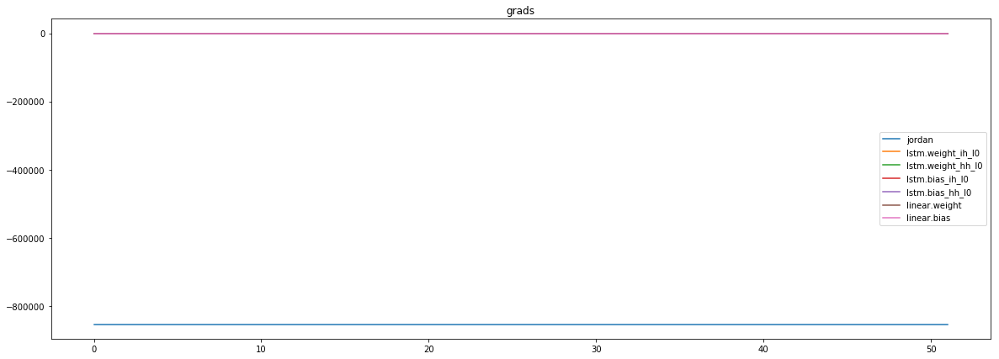

mean_p1 : -41310.921875
mean_p2 : -804741.75
mean_p3 : -8061.486328125


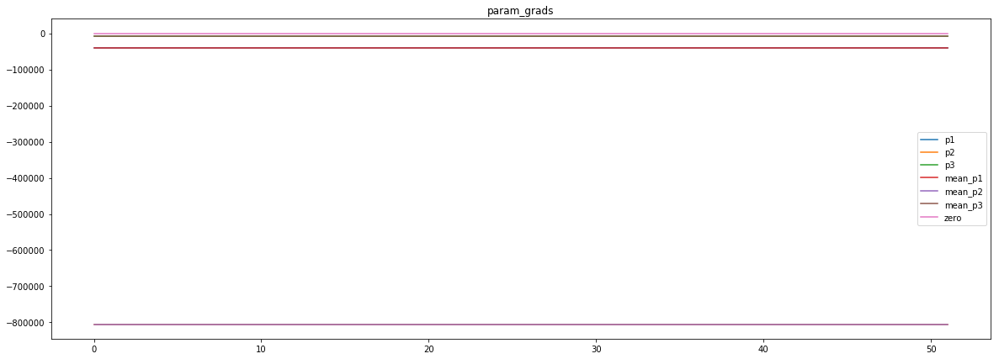

loss rate [0.000681910919490325]
Epoch [25] 
     train_loss[6372.553608820988] 
     eval_train[0.2188846094963642] 
     eval_test[0.22144889200783588]


aux preds: 0.44838955998420715           0.998111367225647           9.936421394348145
main loss 0.0
aux loss 399.9690774770883
jord loss 5955.6624427208535
combined loss 6355.631520197941 


Parameter containing:
tensor([[0.4484, 0.9981, 9.9364]], requires_grad=True)


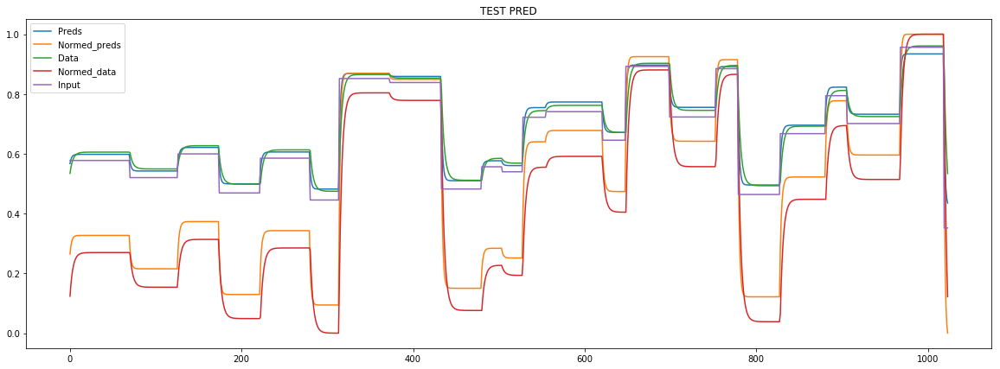

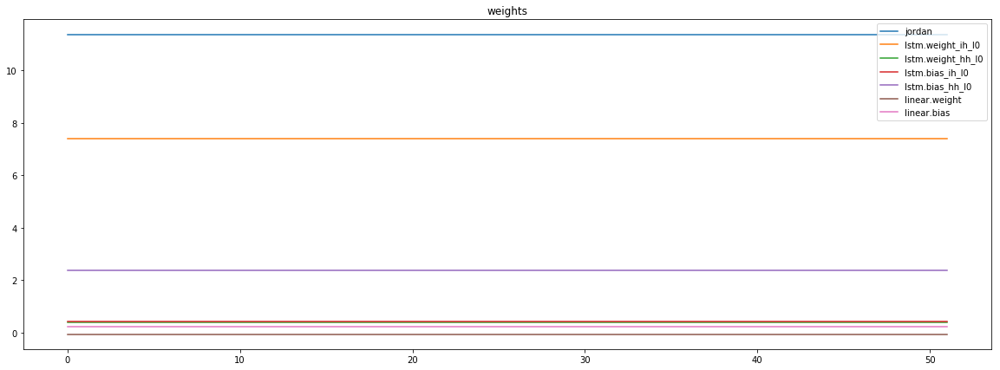

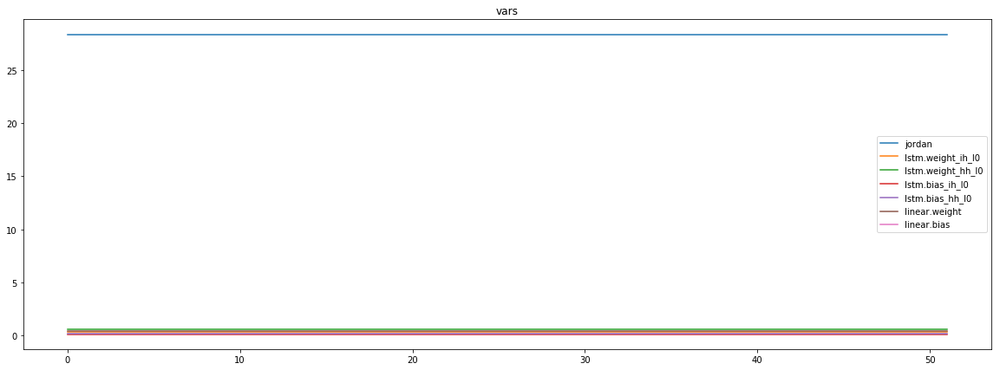

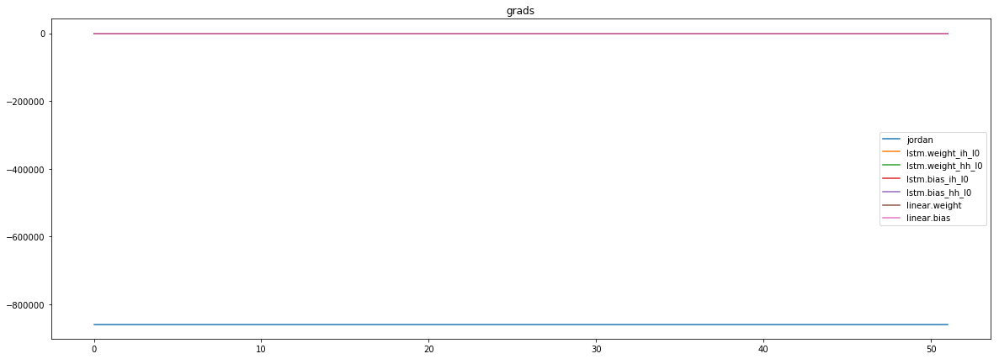

mean_p1 : 15393.3984375
mean_p2 : -865616.4375
mean_p3 : -8711.77734375


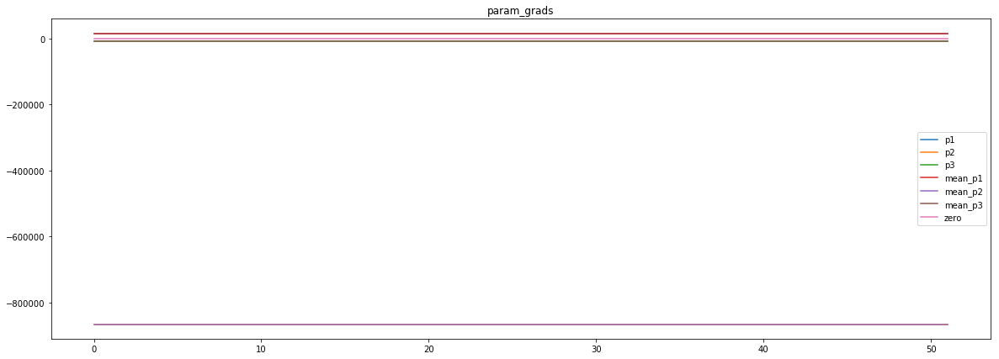

loss rate [0.00046829514538726524]
Epoch [26] 
     train_loss[6355.631520197941] 
     eval_train[0.2189333462514556] 
     eval_test[0.2214509752071039]


aux preds: 0.4472501873970032           1.0019782781600952           9.938915252685547
main loss 0.0
aux loss 397.3302905742939
jord loss 6311.5989332932695
combined loss 6708.929223867563 


Parameter containing:
tensor([[0.4473, 1.0020, 9.9389]], requires_grad=True)


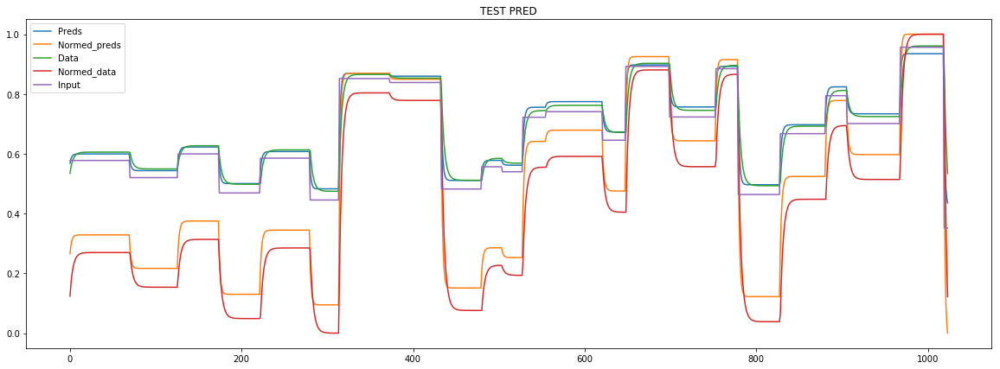

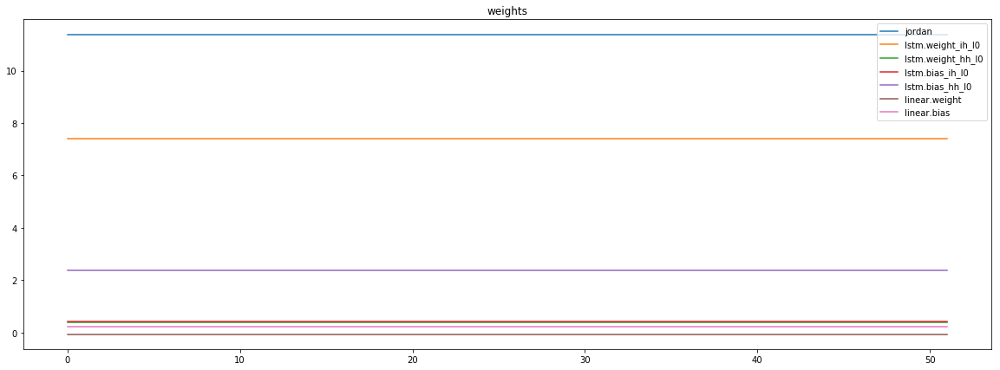

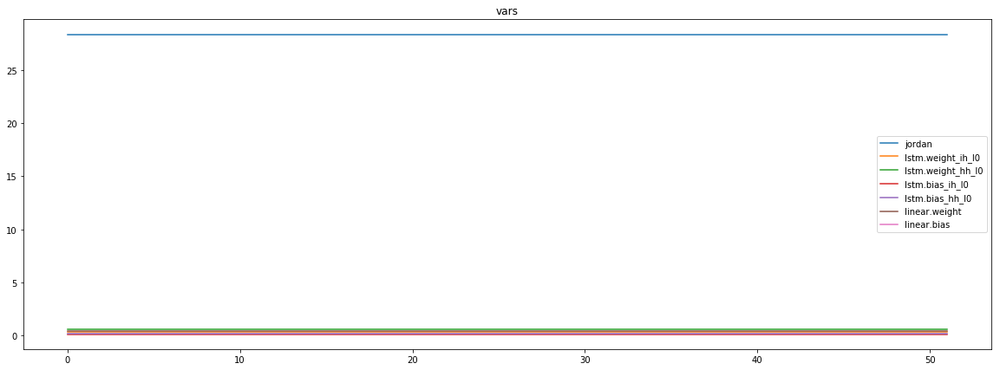

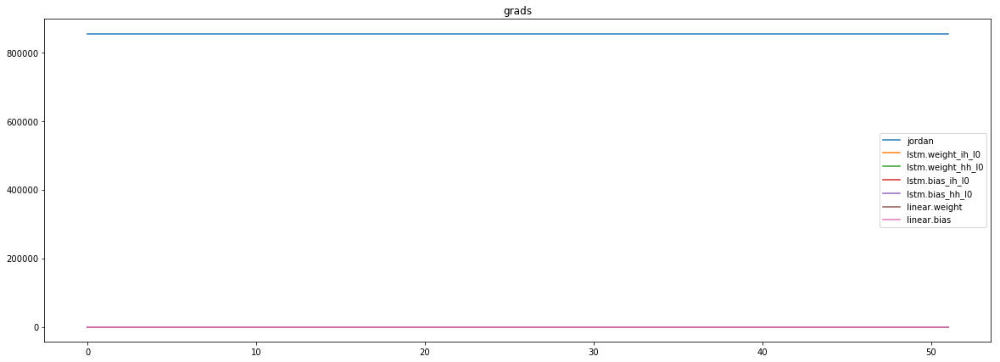

mean_p1 : 32342.60546875
mean_p2 : 813853.0625
mean_p3 : 8299.5419921875


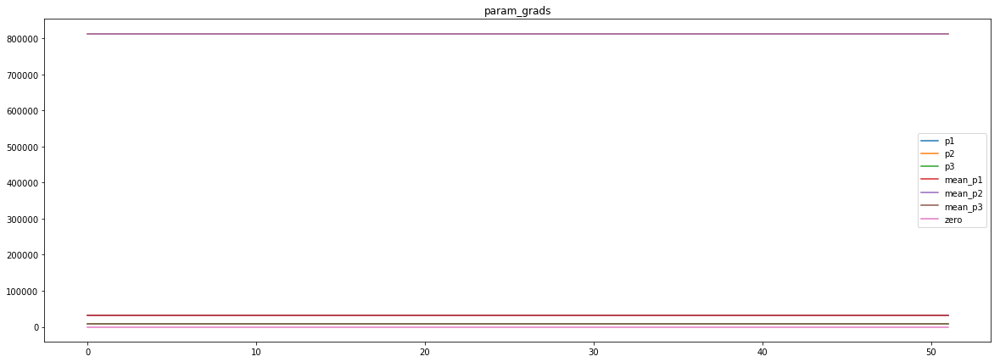

loss rate [-0.00015045564601789962]
Epoch [27] 
     train_loss[6708.929223867563] 
     eval_train[0.2190313549318279] 
     eval_test[0.2215128724717281]


aux preds: 0.44791728258132935           1.0006229877471924           9.932836532592773
main loss 0.0
aux loss 398.34568669245795
jord loss 5965.276254507212
combined loss 6363.62194119967 


Parameter containing:
tensor([[0.4479, 1.0006, 9.9328]], requires_grad=True)


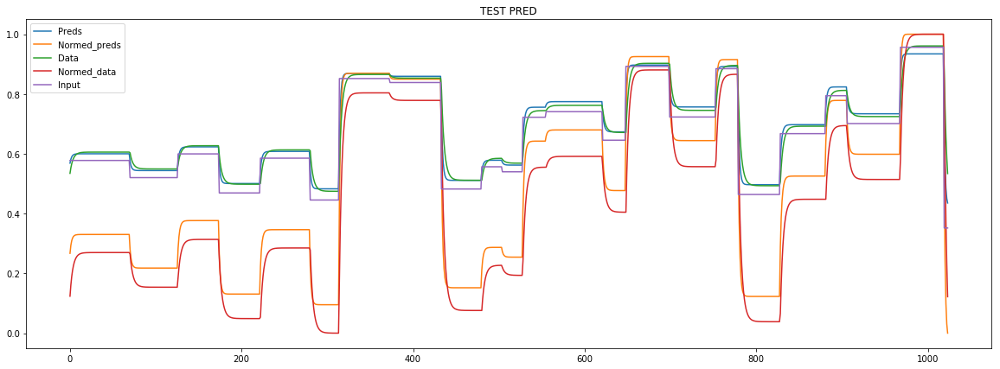

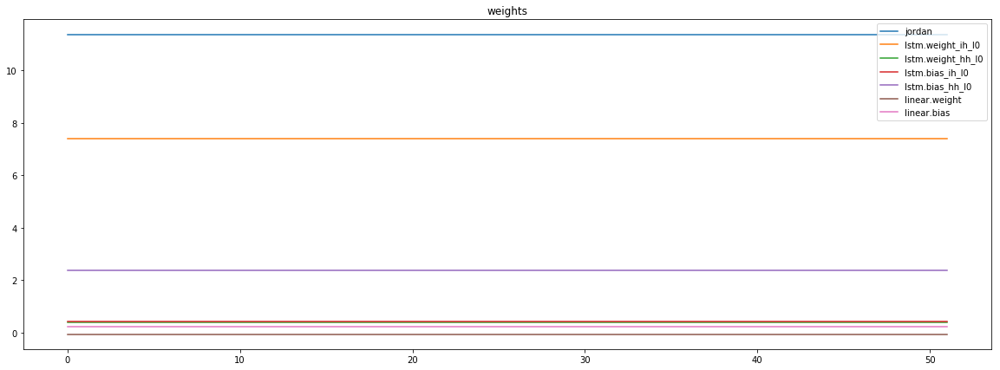

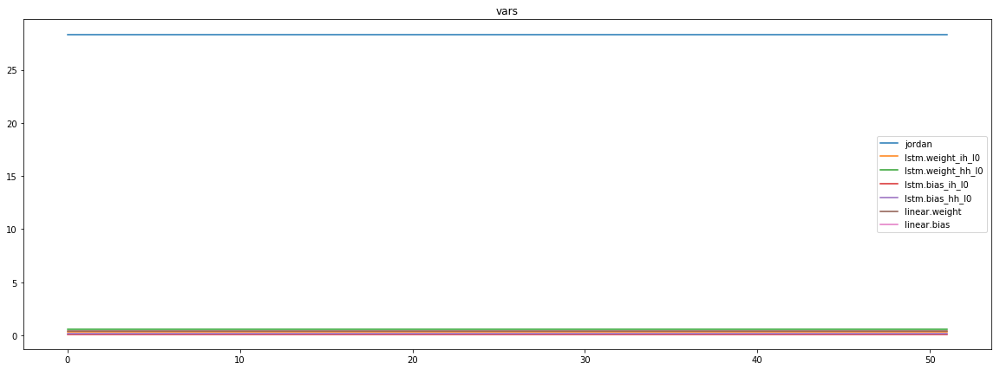

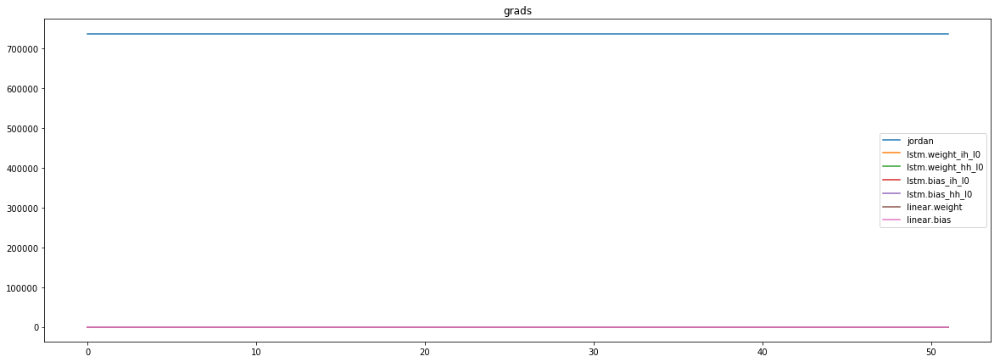

mean_p1 : -33594.12109375
mean_p2 : 763794.375
mean_p3 : 7628.892578125


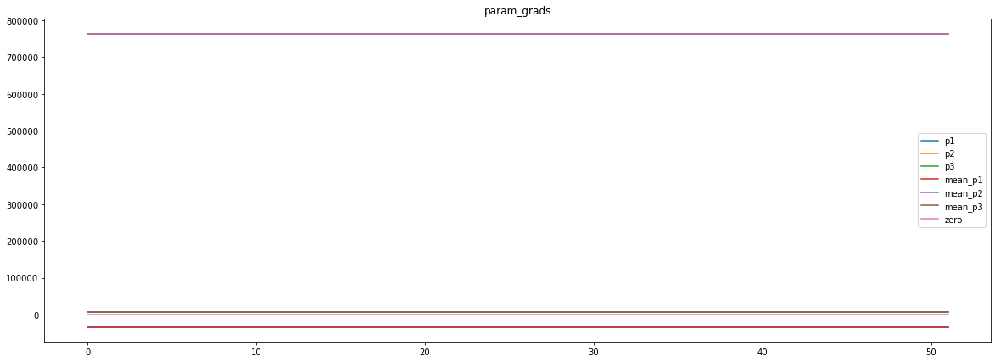

loss rate [-8.337256865109666e-06]
Epoch [28] 
     train_loss[6363.62194119967] 
     eval_train[0.21898439601780129] 
     eval_test[0.22147275968878105]


aux preds: 0.44950070977211           0.9980365037918091           9.934937477111816
main loss 0.0
aux loss 396.68177091158356
jord loss 6181.46279672476
combined loss 6578.144567636344 


Parameter containing:
tensor([[0.4495, 0.9980, 9.9349]], requires_grad=True)


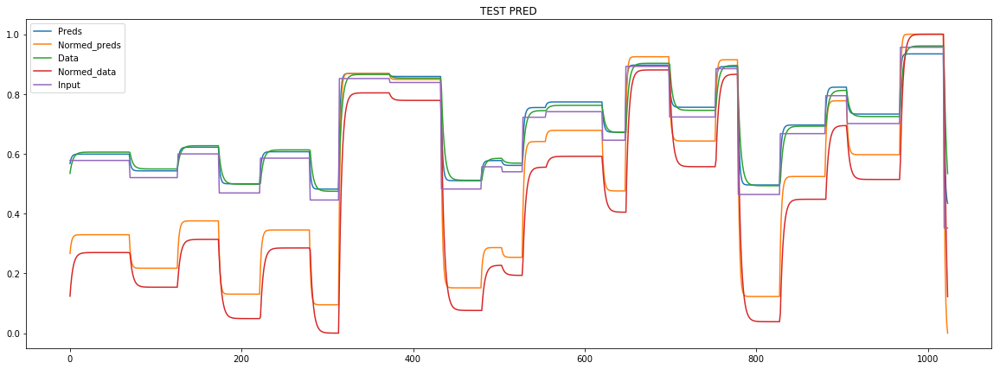

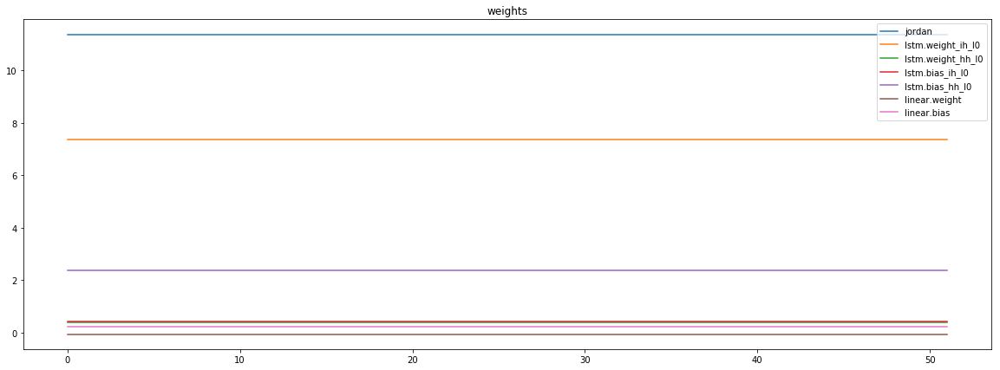

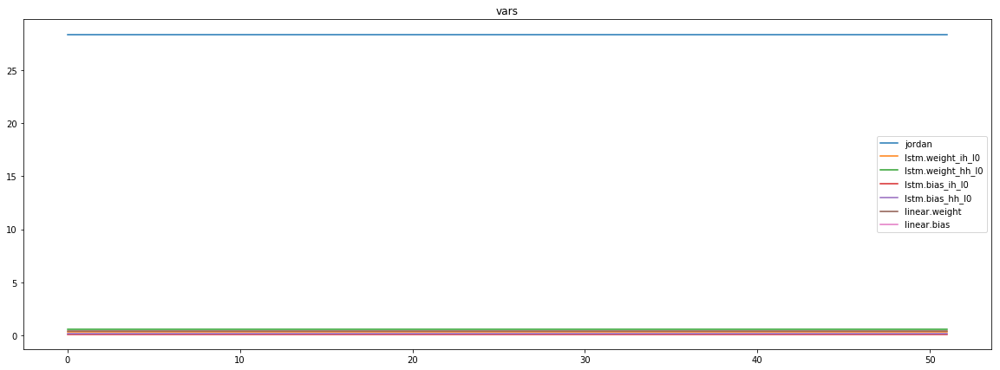

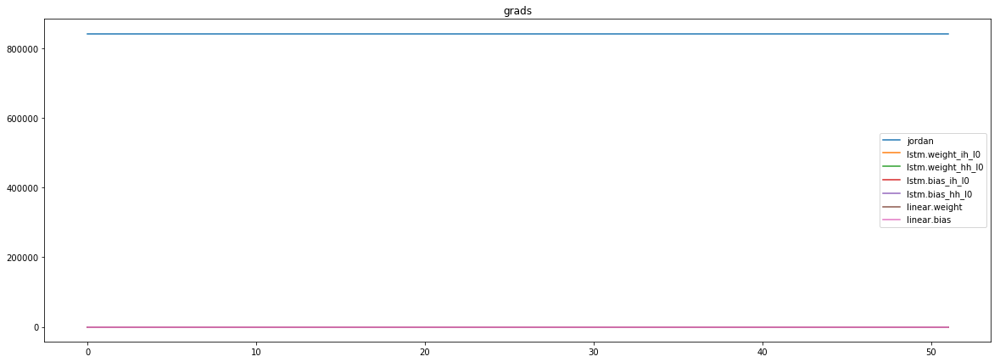

mean_p1 : -46948.04296875
mean_p2 : 880781.4375
mean_p3 : 8811.8203125


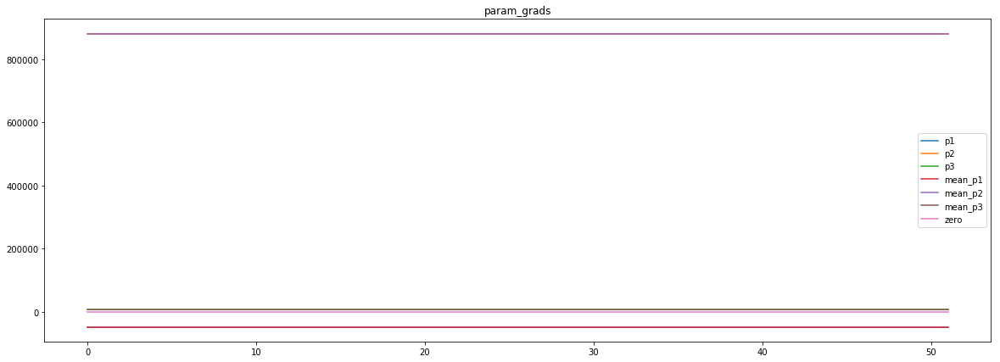

loss rate [0.0007917639378698382]
Epoch [29] 
     train_loss[6578.144567636344] 
     eval_train[0.21876652513702327] 
     eval_test[0.22130351014096628]


aux preds: 0.4482492208480835           0.9971609115600586           9.94180965423584
main loss 0.0
aux loss 396.70042184682995
jord loss 6156.236689640926
combined loss 6552.937111487756 


Parameter containing:
tensor([[0.4482, 0.9972, 9.9418]], requires_grad=True)


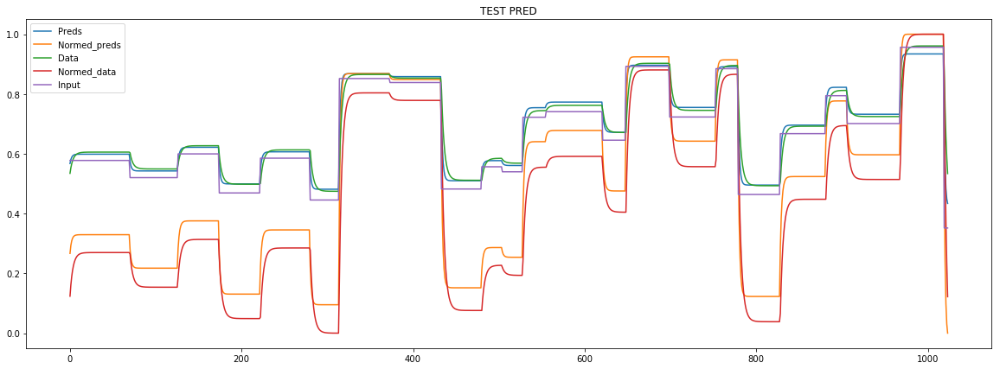

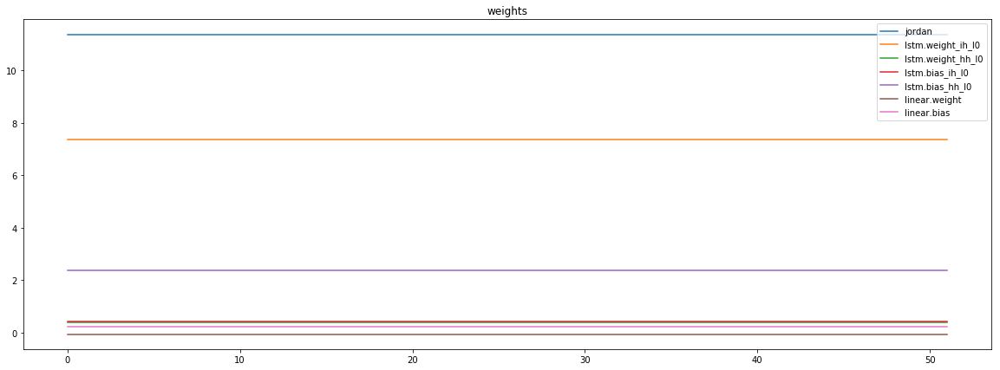

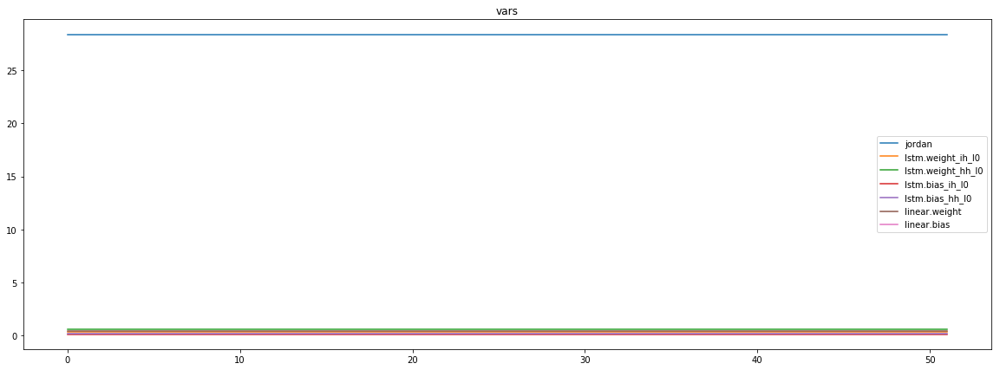

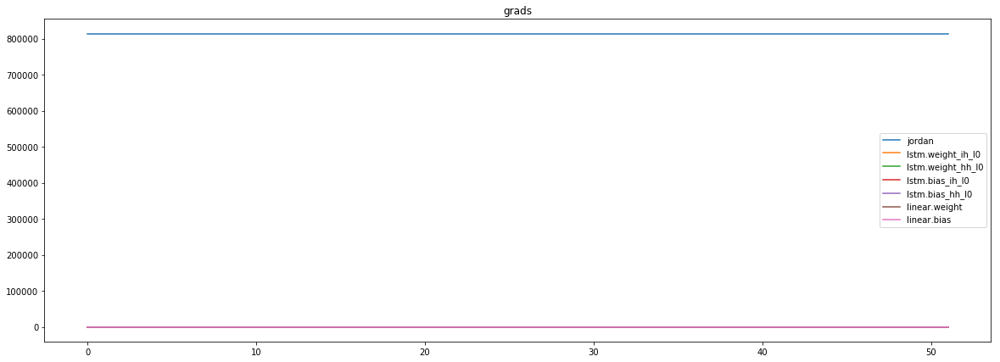

mean_p1 : 61412.63671875
mean_p2 : 744968.4375
mean_p3 : 7656.5615234375


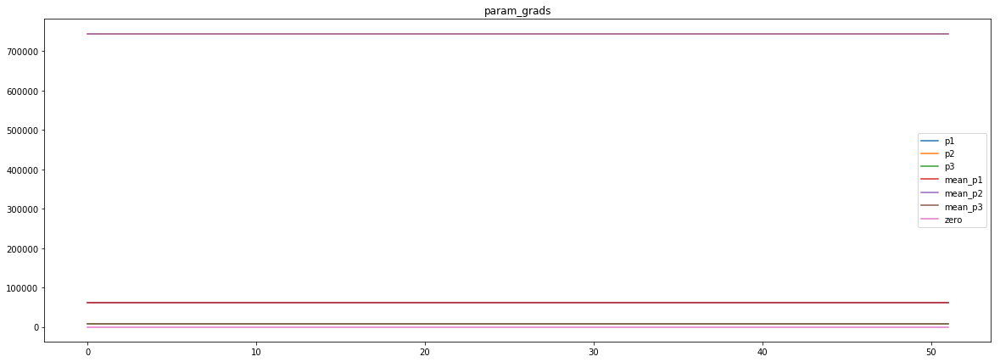

loss rate [0.0010183503244471925]
Epoch [30] 
     train_loss[6552.937111487756] 
     eval_train[0.2186466961418493] 
     eval_test[0.22120422107929533]


aux preds: 0.4493967890739441           1.0029879808425903           9.948261260986328
main loss 0.0
aux loss 395.3112018291767
jord loss 6303.4246826171875
combined loss 6698.735884446364 


Parameter containing:
tensor([[0.4494, 1.0030, 9.9483]], requires_grad=True)


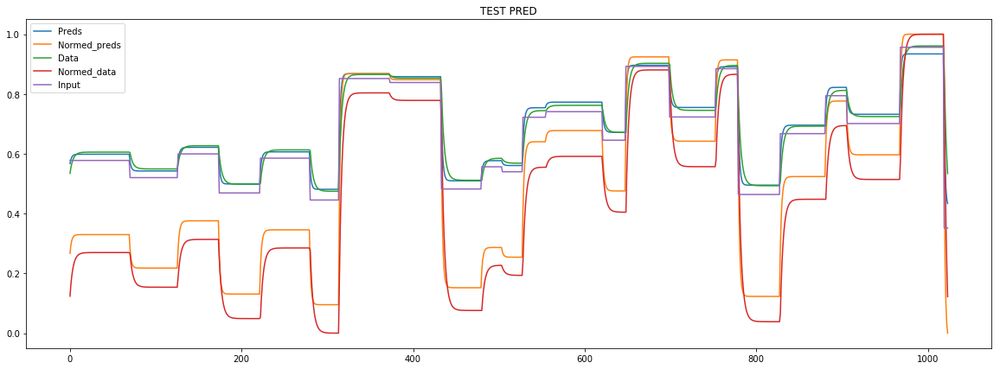

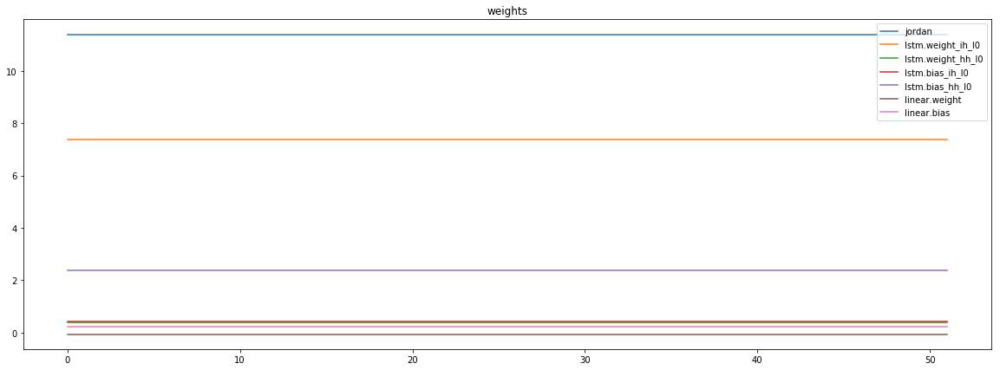

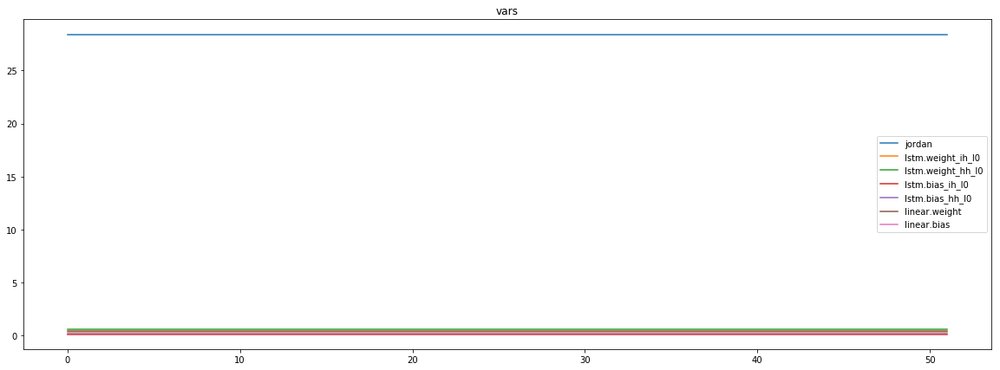

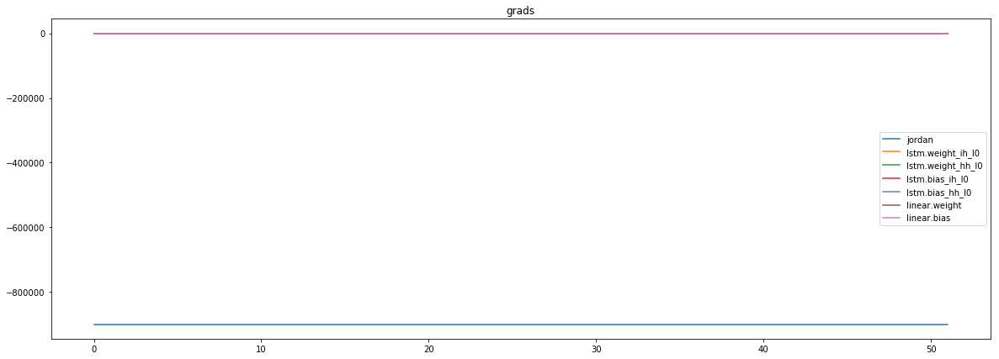

mean_p1 : -29700.84765625
mean_p2 : -860976.0625
mean_p3 : -8566.7236328125


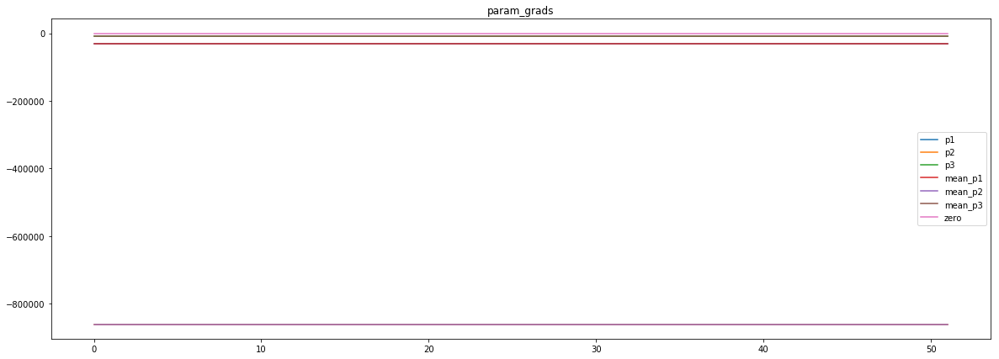

loss rate [0.0008900317412353642]
Epoch [31] 
     train_loss[6698.735884446364] 
     eval_train[0.21855861398104862] 
     eval_test[0.22112984239885752]


aux preds: 0.447307288646698           1.001744031906128           9.951671600341797
main loss 0.0
aux loss 394.6258797278771
jord loss 6304.8738685021035
combined loss 6699.4997482299805 


Parameter containing:
tensor([[0.4473, 1.0017, 9.9517]], requires_grad=True)


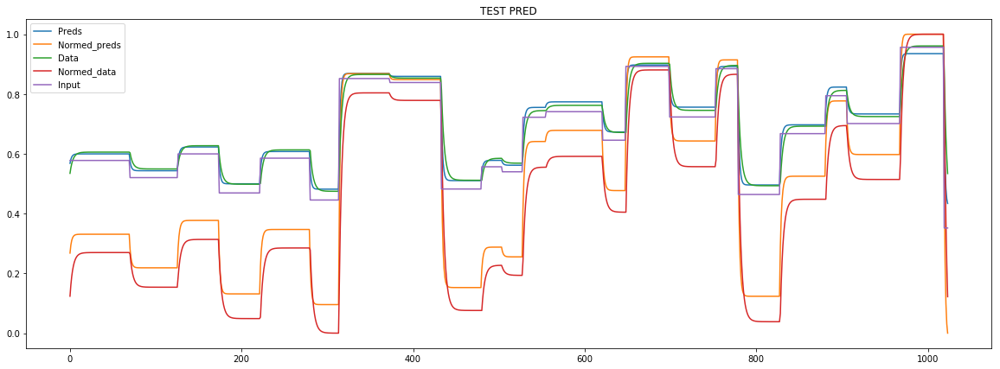

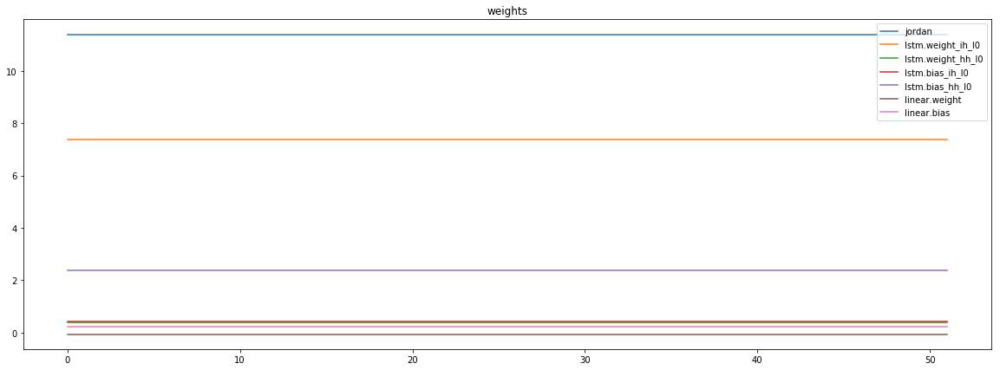

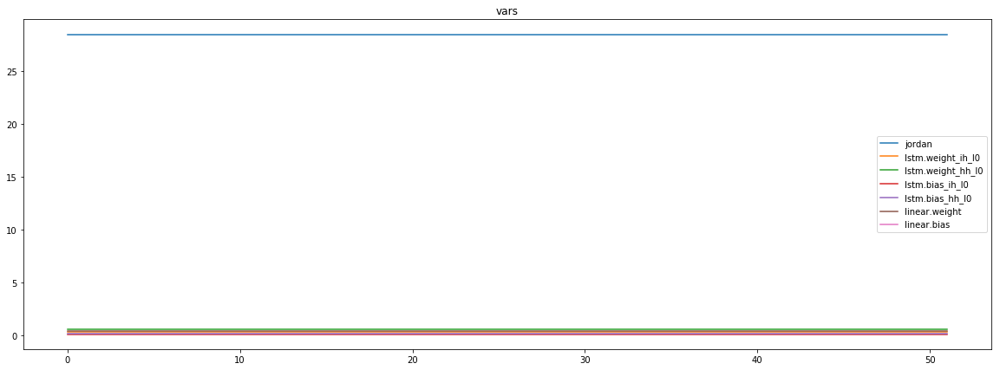

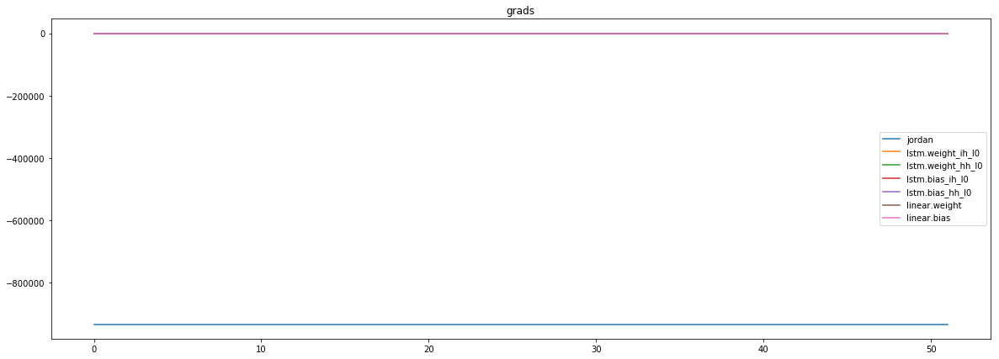

mean_p1 : -47926.78125
mean_p2 : -877937.0
mean_p3 : -8692.1259765625


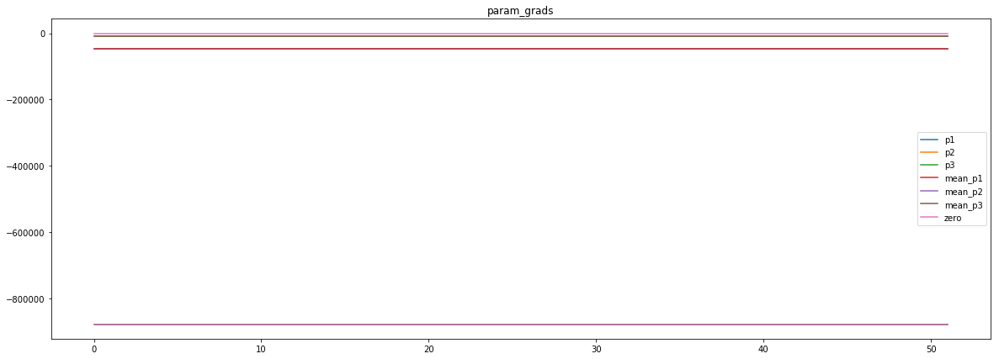

loss rate [0.0002767550114505246]
Epoch [32] 
     train_loss[6699.4997482299805] 
     eval_train[0.21860691967706838] 
     eval_test[0.2211513028649444]


aux preds: 0.4465353786945343           1.002199649810791           9.953863143920898
main loss 0.0
aux loss 392.8520865807167
jord loss 6446.610168457031
combined loss 6839.462255037748 


Parameter containing:
tensor([[0.4465, 1.0022, 9.9539]], requires_grad=True)


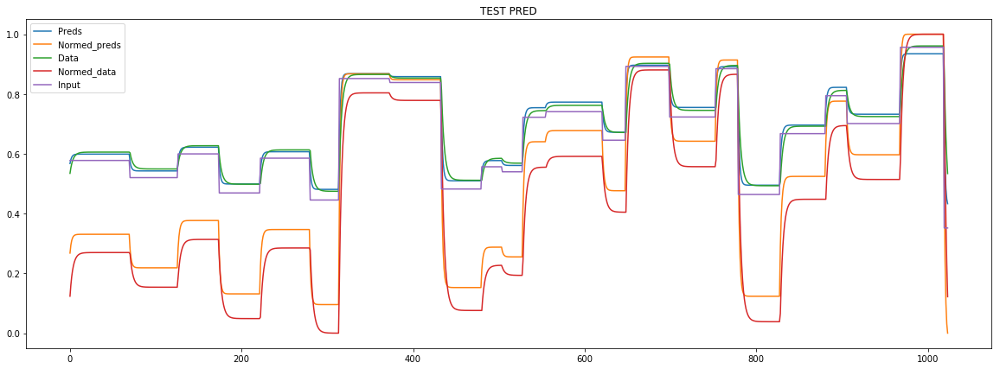

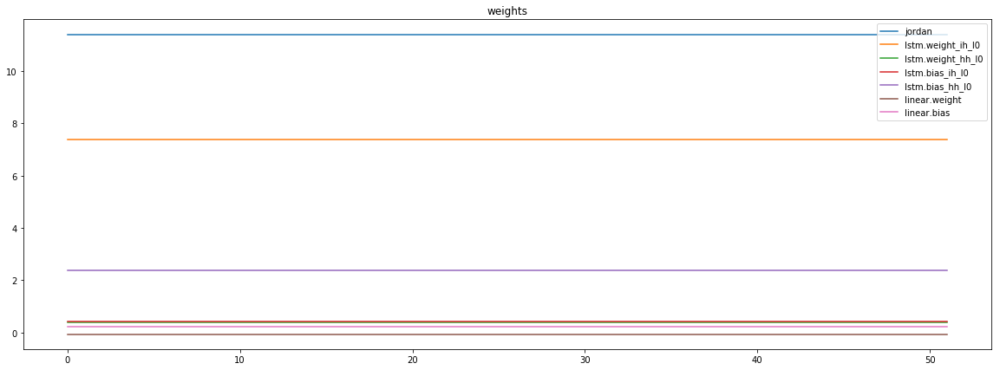

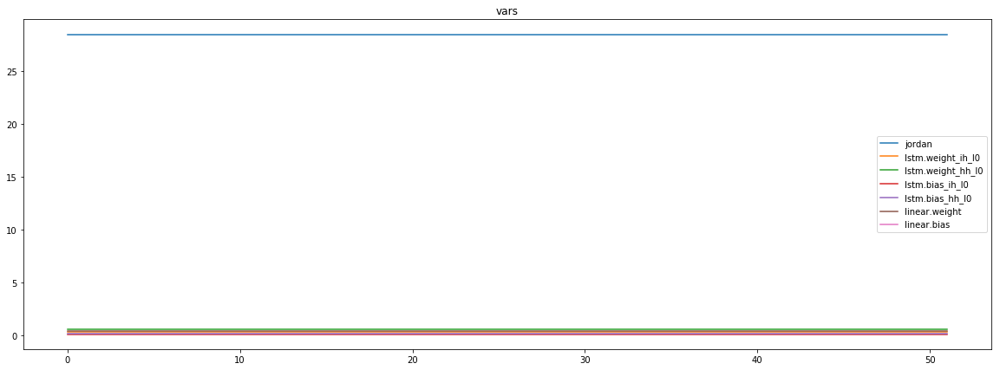

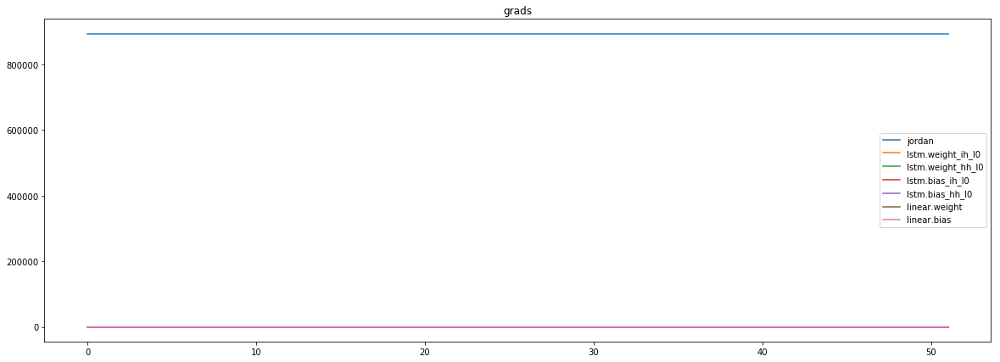

mean_p1 : -29507.08203125
mean_p2 : 913703.5625
mean_p3 : 9173.1630859375


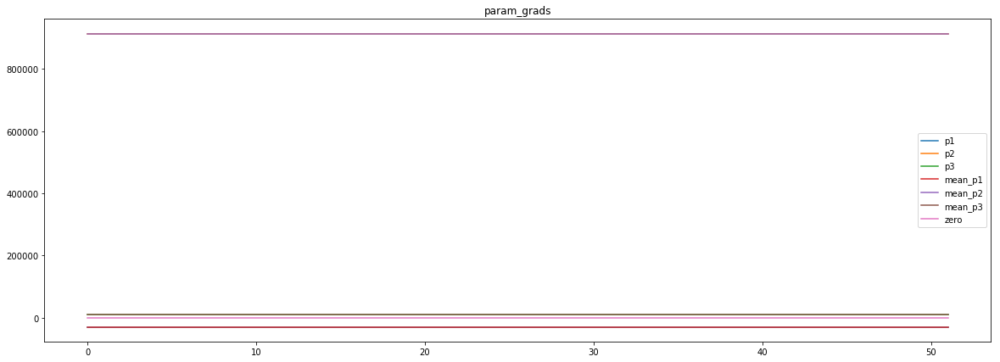

loss rate [0.0006728708046948029]
Epoch [33] 
     train_loss[6839.462255037748] 
     eval_train[0.21842722283103141] 
     eval_test[0.2210129754702476]


aux preds: 0.44716110825538635           1.003432035446167           9.948394775390625
main loss 0.0
aux loss 391.13979867788464
jord loss 6192.874089167668
combined loss 6584.013887845553 


Parameter containing:
tensor([[0.4472, 1.0034, 9.9484]], requires_grad=True)


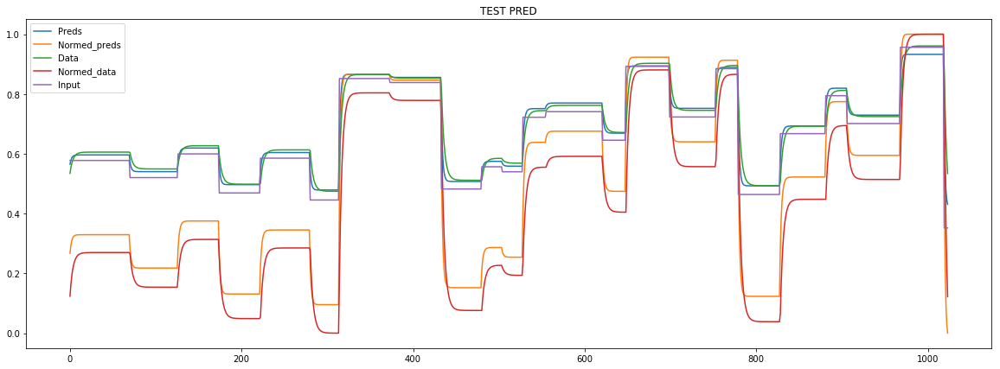

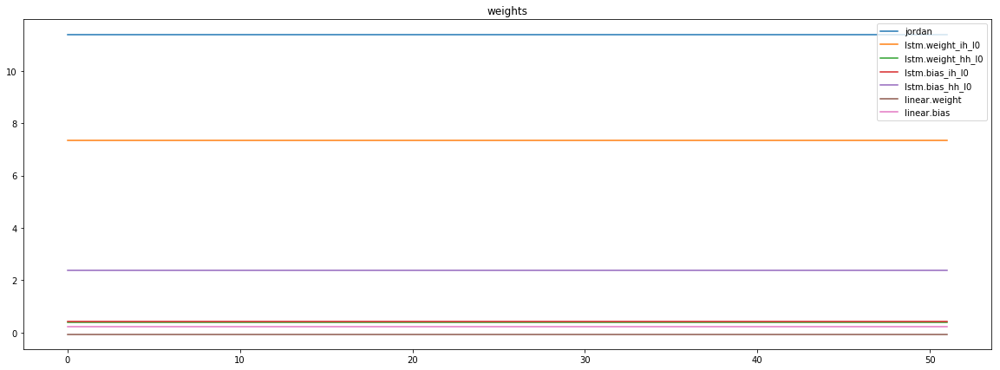

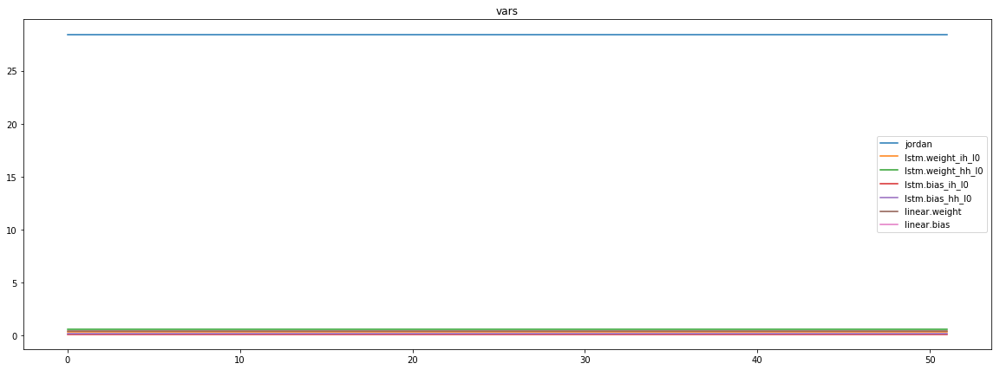

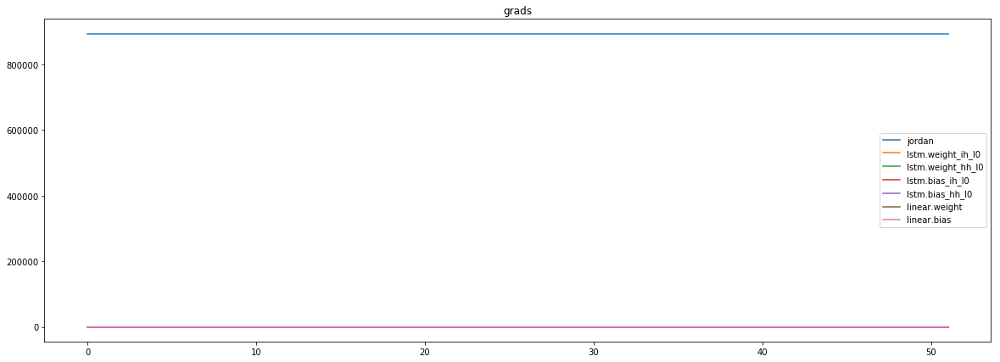

mean_p1 : -32814.99609375
mean_p2 : 918057.0
mean_p3 : 9210.45703125


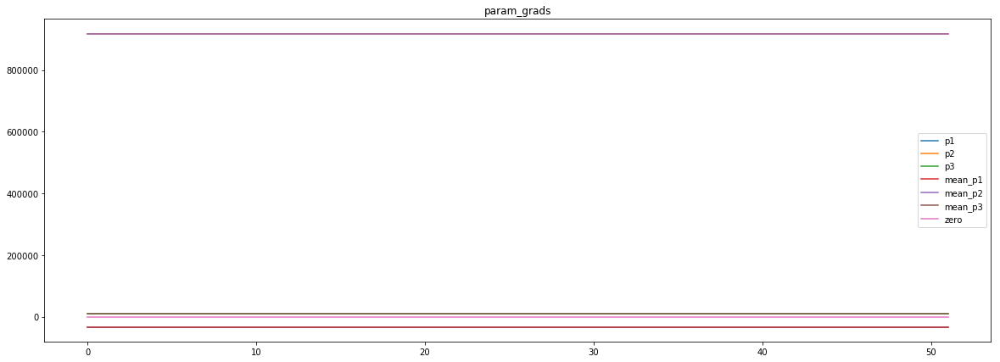

loss rate [0.0006353006821766538]
Epoch [34] 
     train_loss[6584.013887845553] 
     eval_train[0.21822688279028693] 
     eval_test[0.22095757650888778]


aux preds: 0.44884029030799866           0.9994644522666931           9.944762229919434
main loss 0.0
aux loss 391.3710462130033
jord loss 6074.4128981370195
combined loss 6465.7839443500225 


Parameter containing:
tensor([[0.4488, 0.9995, 9.9448]], requires_grad=True)


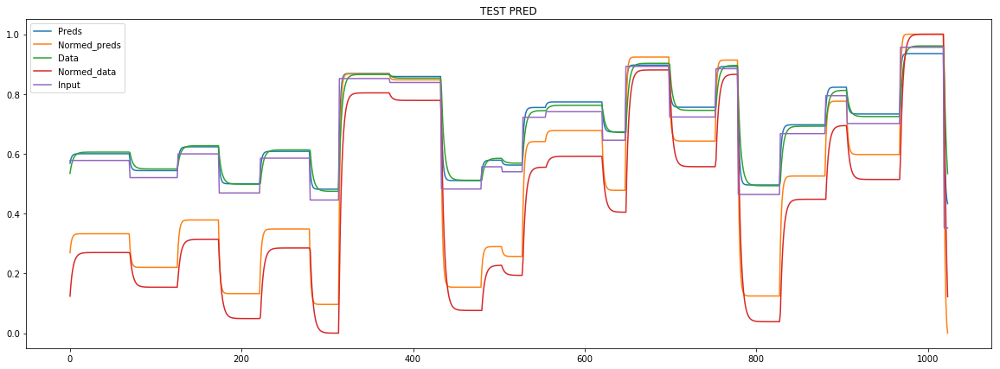

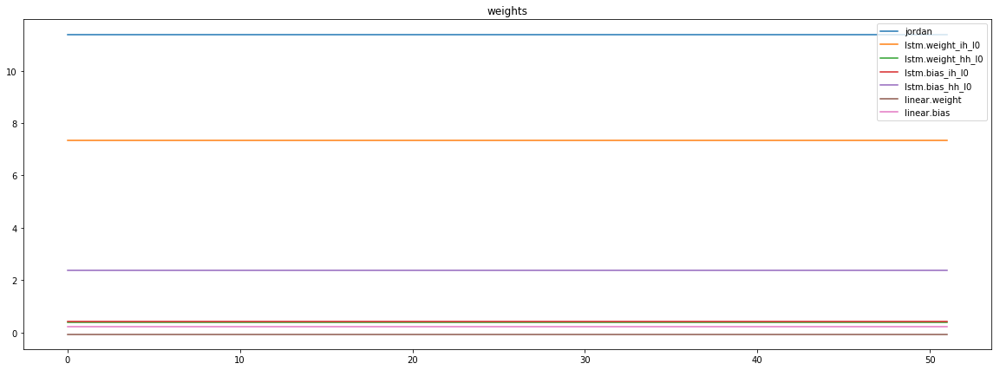

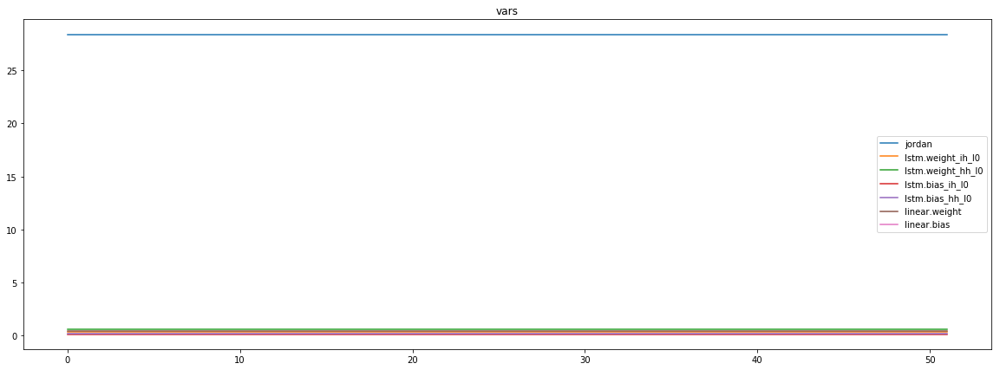

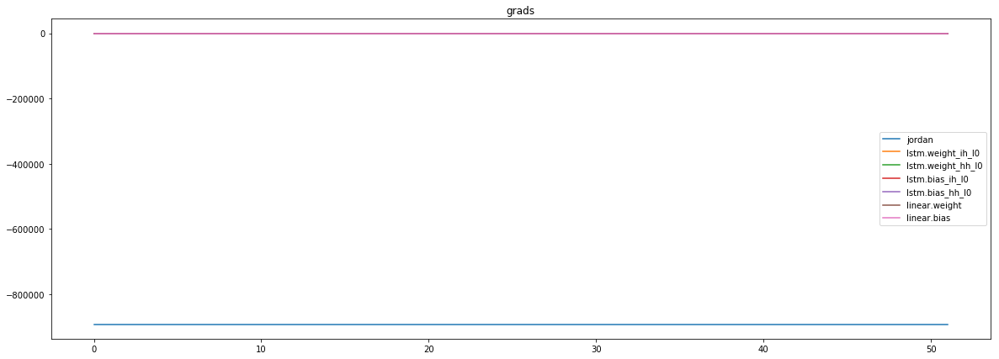

mean_p1 : -12081.9912109375
mean_p2 : -871394.0
mean_p3 : -8703.7568359375


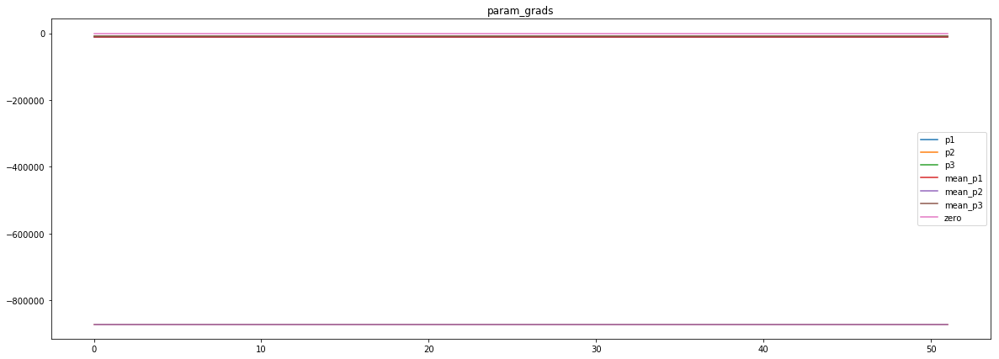

loss rate [0.0003976300711336922]
Epoch [35] 
     train_loss[6465.7839443500225] 
     eval_train[0.21839216793887314] 
     eval_test[0.22095272588458928]


aux preds: 0.4493134915828705           0.9979325532913208           9.951705932617188
main loss 0.0
aux loss 391.72609241192157
jord loss 6087.363253079928
combined loss 6479.08934549185 


Parameter containing:
tensor([[0.4493, 0.9979, 9.9517]], requires_grad=True)


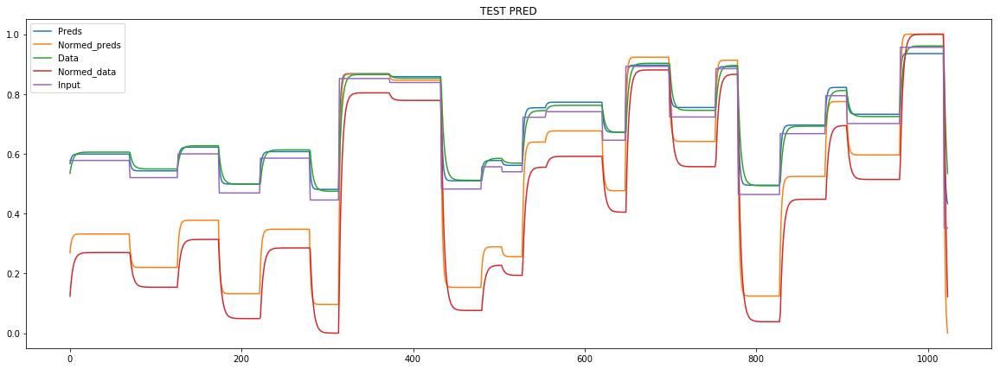

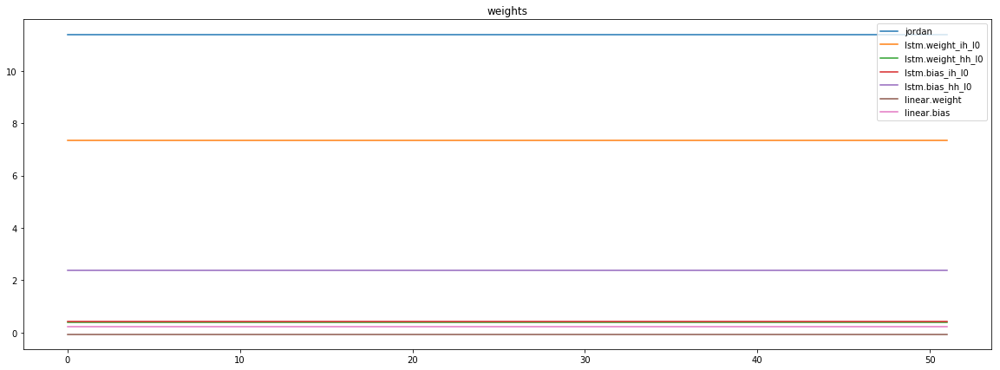

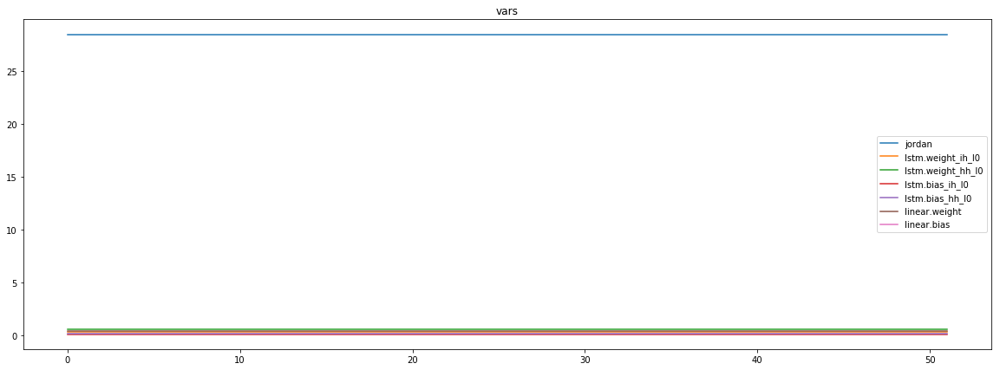

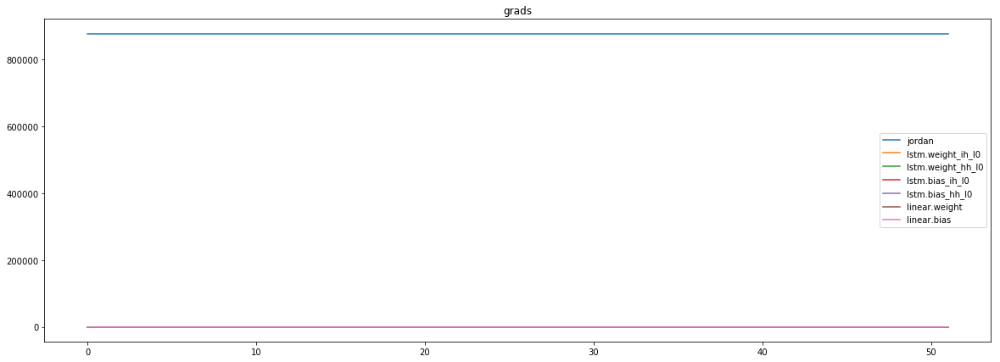

mean_p1 : -33891.91796875
mean_p2 : 901907.6875
mean_p3 : 9049.8671875


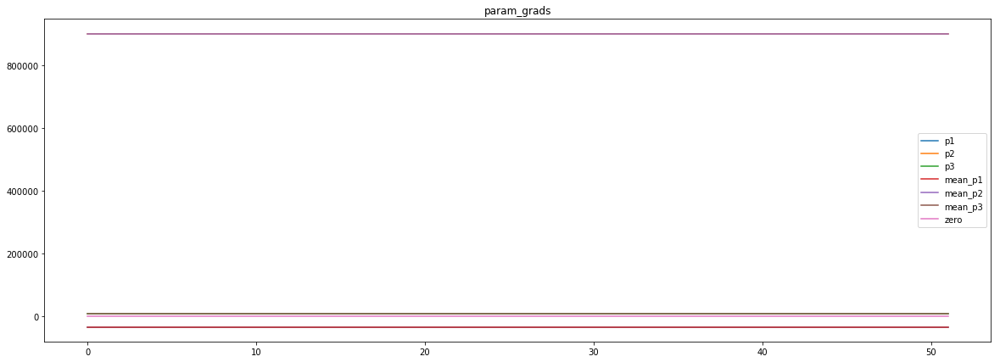

loss rate [0.0007685233428181837]
Epoch [36] 
     train_loss[6479.08934549185] 
     eval_train[0.21820487982880035] 
     eval_test[0.22080460195006293]


aux preds: 0.4499512016773224           0.9977496266365051           9.955310821533203
main loss 0.0
aux loss 390.1366882324219
jord loss 6248.783855731671
combined loss 6638.920543964093 


Parameter containing:
tensor([[0.4500, 0.9977, 9.9553]], requires_grad=True)


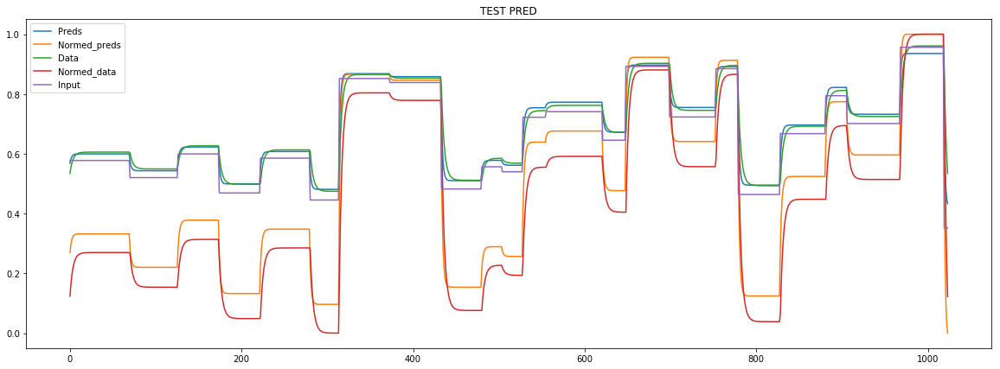

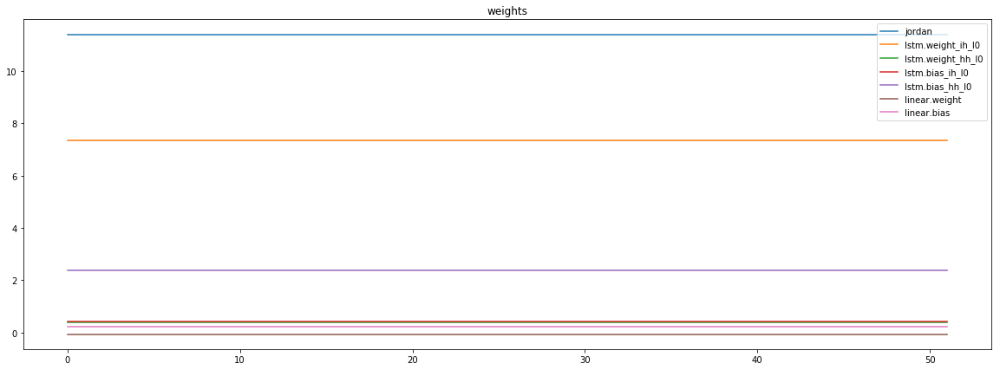

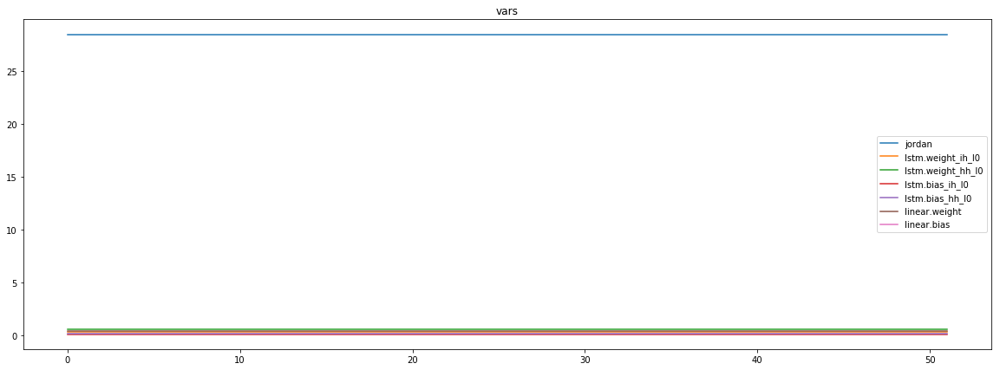

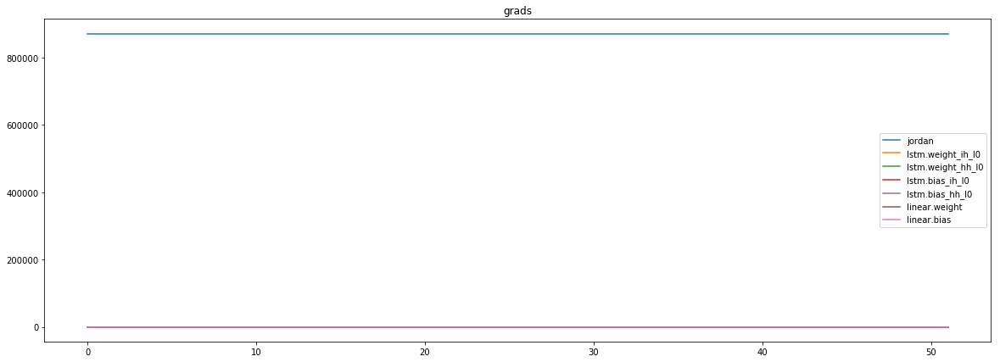

mean_p1 : -34139.6171875
mean_p2 : 896597.5
mean_p3 : 8996.8095703125


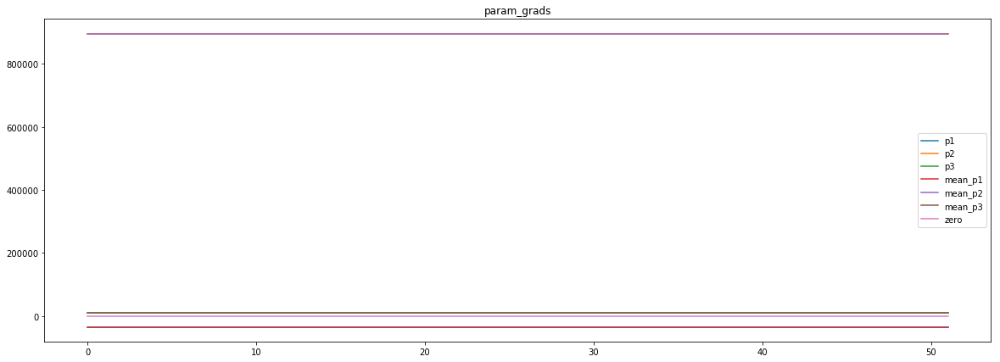

loss rate [0.0007007238302084717]
Epoch [37] 
     train_loss[6638.920543964093] 
     eval_train[0.21815735443781772] 
     eval_test[0.22075017473914404]


aux preds: 0.4494870603084564           0.9973107576370239           9.955415725708008
main loss 0.0
aux loss 389.6185062115009
jord loss 6274.067011906551
combined loss 6663.685518118052 


Parameter containing:
tensor([[0.4495, 0.9973, 9.9554]], requires_grad=True)


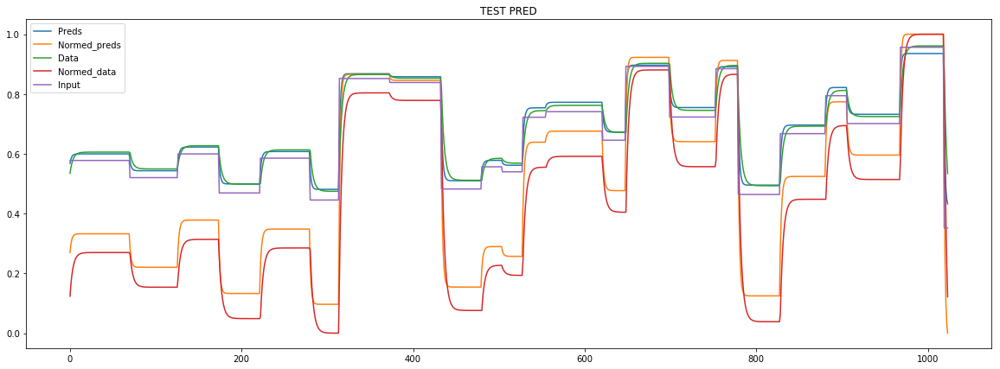

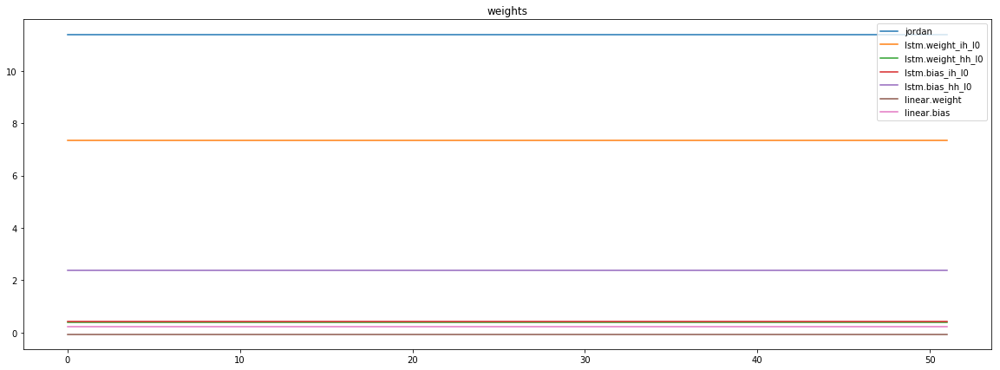

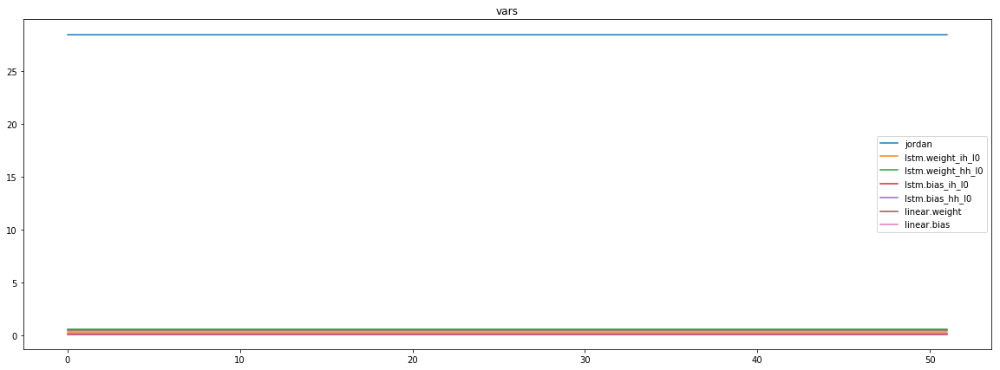

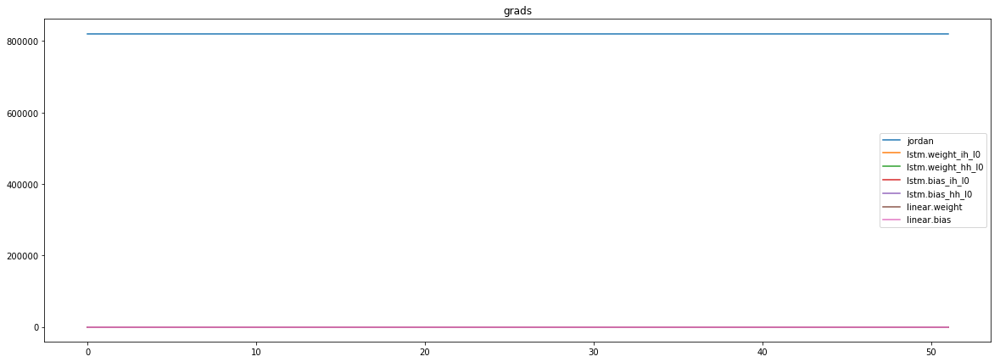

mean_p1 : 60221.7109375
mean_p2 : 753126.125
mean_p3 : 7720.8740234375


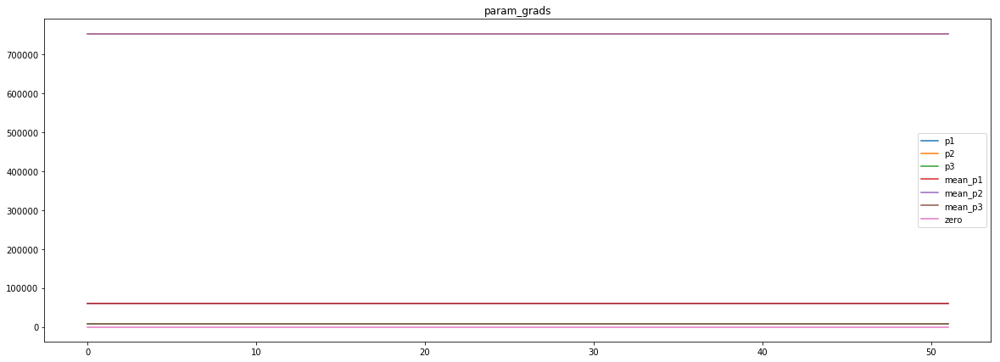

loss rate [0.0007542849148987063]
Epoch [38] 
     train_loss[6663.685518118052] 
     eval_train[0.21806582258656046] 
     eval_test[0.22066926105286588]


aux preds: 0.44976407289505005           0.9983835220336914           9.961834907531738
main loss 0.0
aux loss 422.8406037550706
jord loss 5993.777597280649
combined loss 6416.61820103572 


Parameter containing:
tensor([[0.4498, 0.9984, 9.9618]], requires_grad=True)


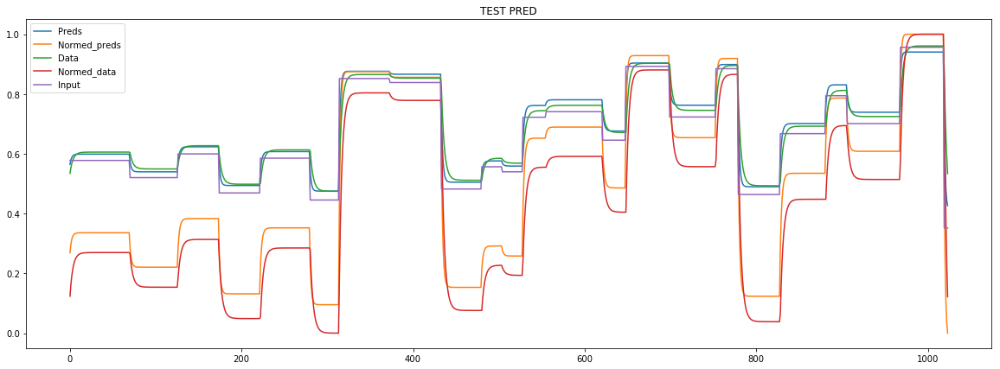

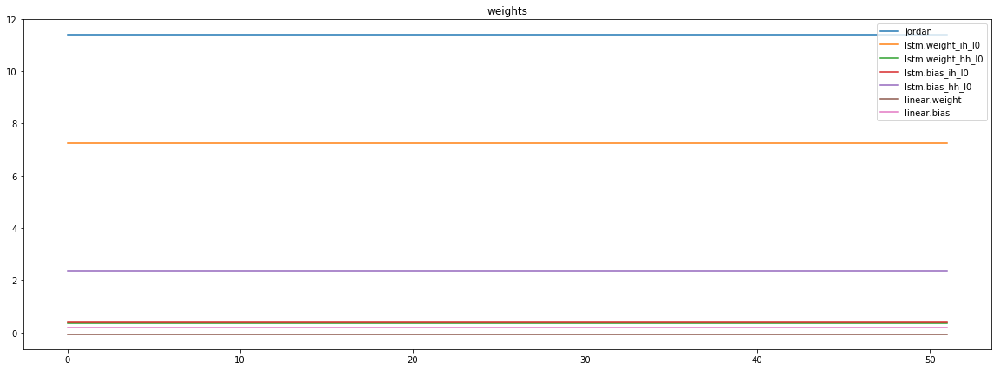

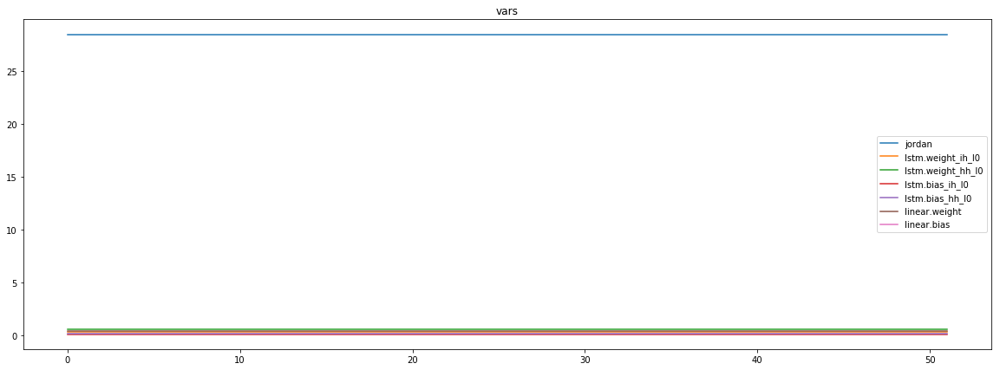

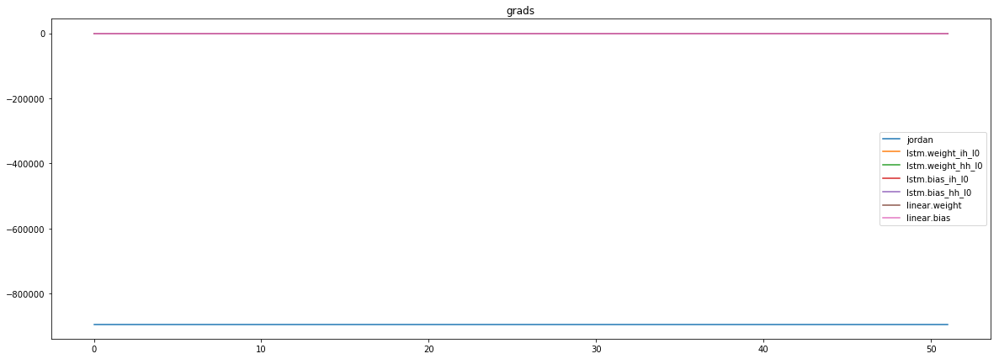

mean_p1 : -8402.900390625
mean_p2 : -876140.0625
mean_p3 : -8764.138671875


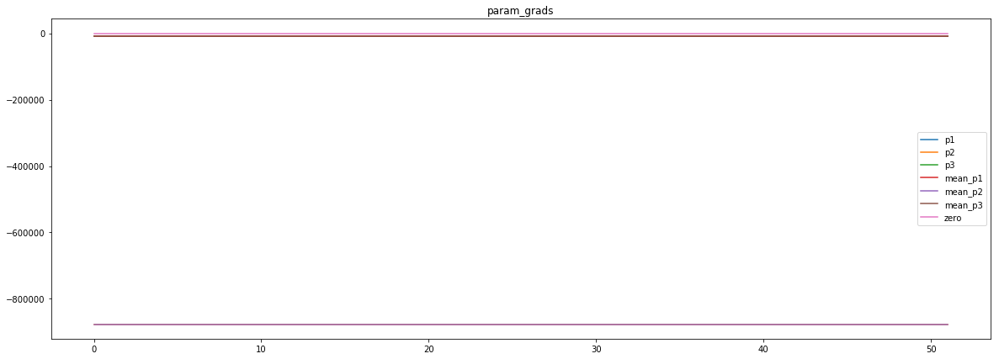

loss rate [-0.006532248734026469]
Epoch [39] 
     train_loss[6416.61820103572] 
     eval_train[0.21945415532144788] 
     eval_test[0.22218328329141845]


aux preds: 0.45173877477645874           1.0005079507827759           9.969099044799805
main loss 0.0
aux loss 400.9933589054988
jord loss 6459.127192570613
combined loss 6860.120551476112 


Parameter containing:
tensor([[0.4517, 1.0005, 9.9691]], requires_grad=True)


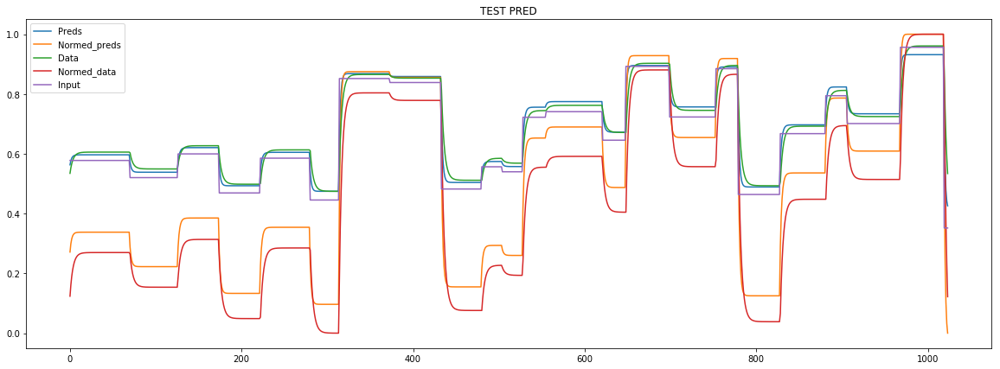

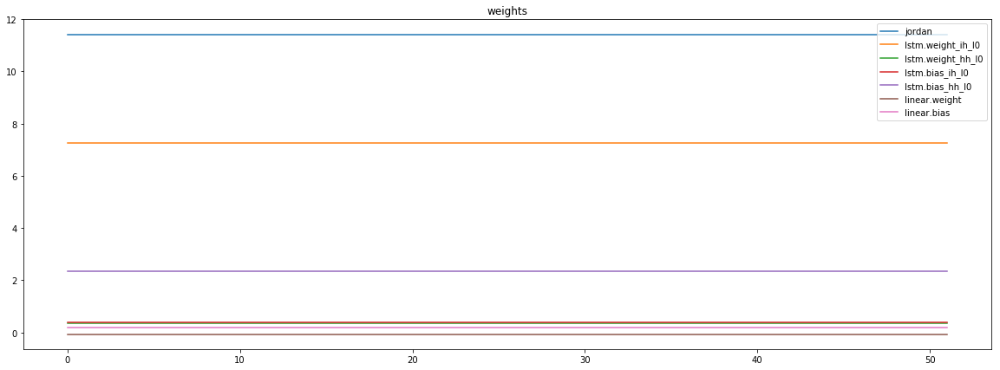

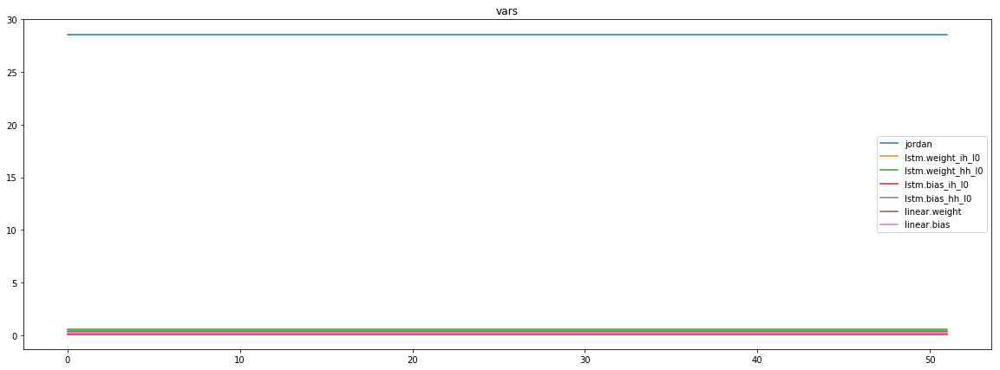

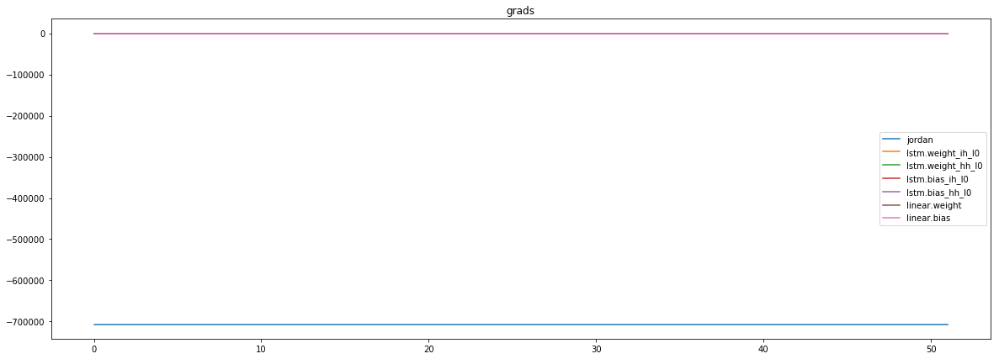

mean_p1 : 51873.37109375
mean_p2 : -750515.9375
mean_p3 : -7590.88037109375


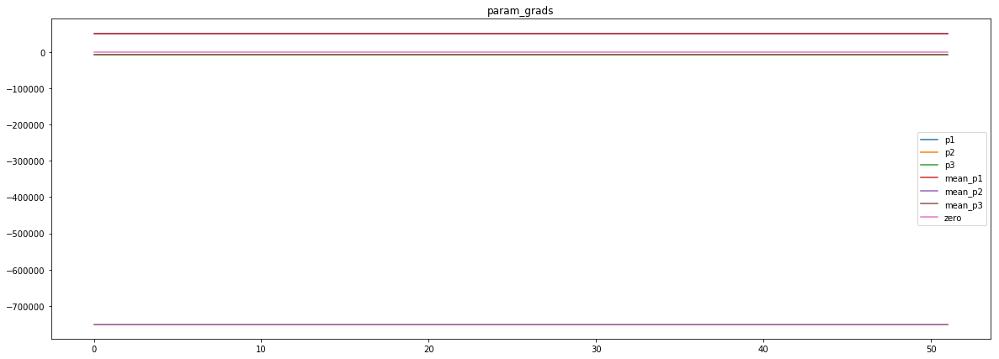

loss rate [-0.00192868764731835]
Epoch [40] 
     train_loss[6860.120551476112] 
     eval_train[0.21868347292407772] 
     eval_test[0.22162753381681713]


aux preds: 0.449465274810791           0.9976581931114197           9.973230361938477
main loss 0.0
aux loss 396.99617473895734
jord loss 6431.545302170974
combined loss 6828.541476909931 


Parameter containing:
tensor([[0.4495, 0.9977, 9.9732]], requires_grad=True)


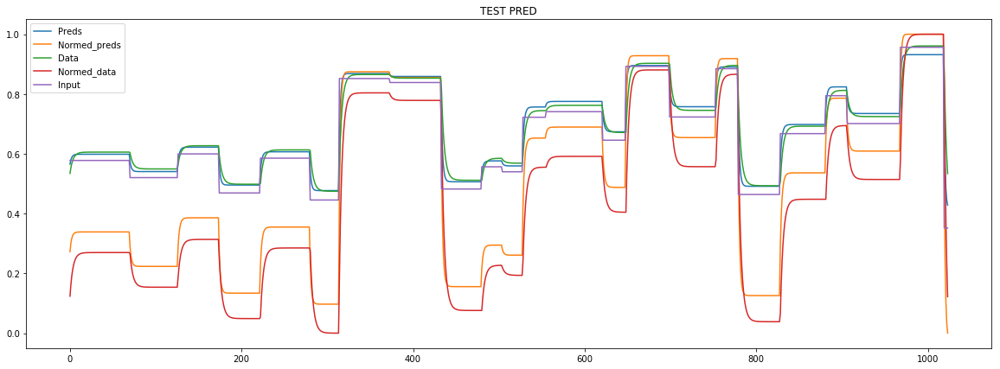

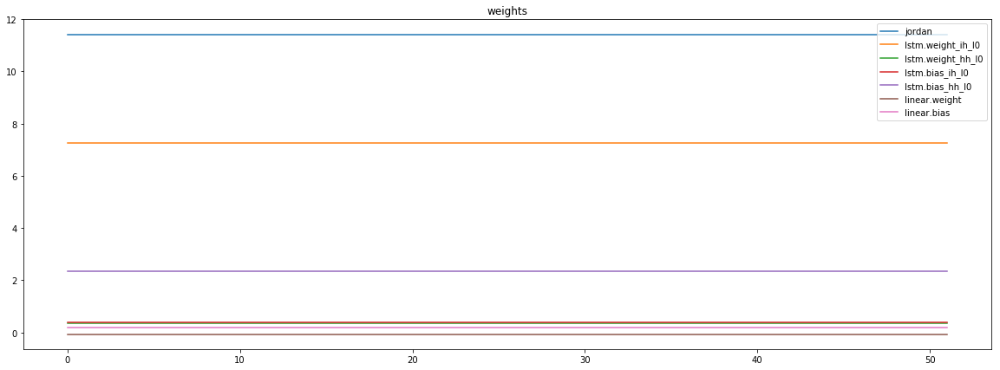

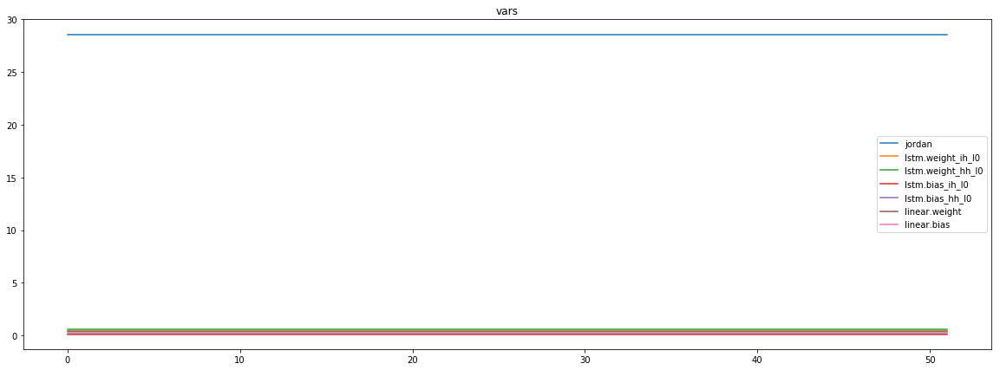

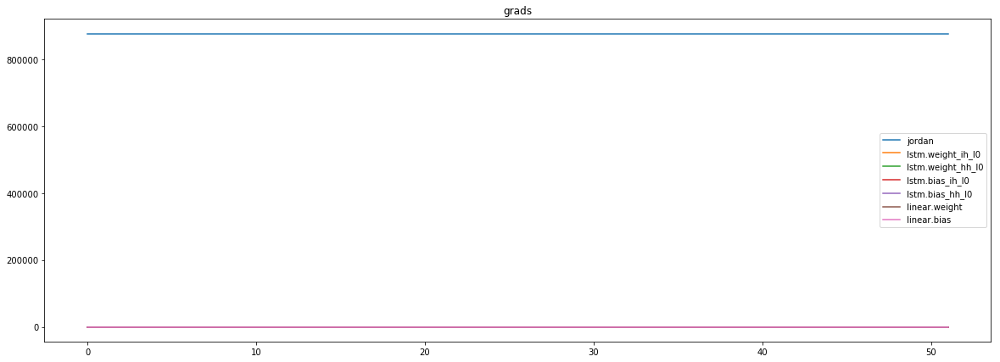

mean_p1 : -33280.96875
mean_p2 : 900657.1875
mean_p3 : 9042.9970703125


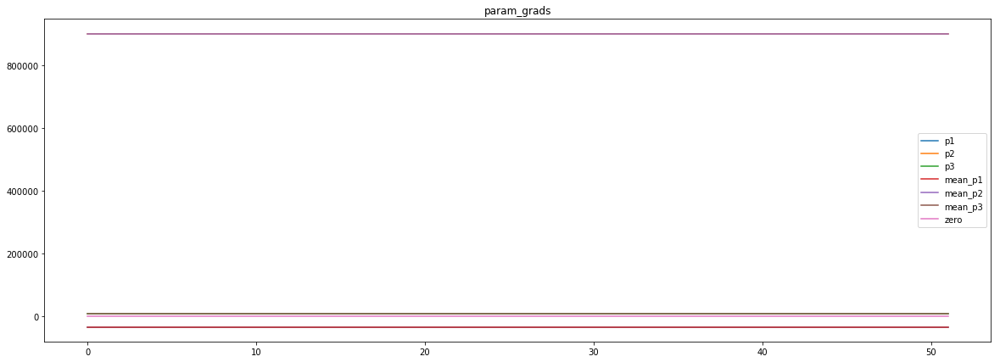

loss rate [-4.437653537303632e-05]
Epoch [41] 
     train_loss[6828.541476909931] 
     eval_train[0.21870081760705662] 
     eval_test[0.22150318849493156]


aux preds: 0.44897231459617615           1.0025138854980469           9.973776817321777
main loss 0.0
aux loss 397.03175471379205
jord loss 6104.220538799579
combined loss 6501.252293513371 


Parameter containing:
tensor([[0.4490, 1.0025, 9.9738]], requires_grad=True)


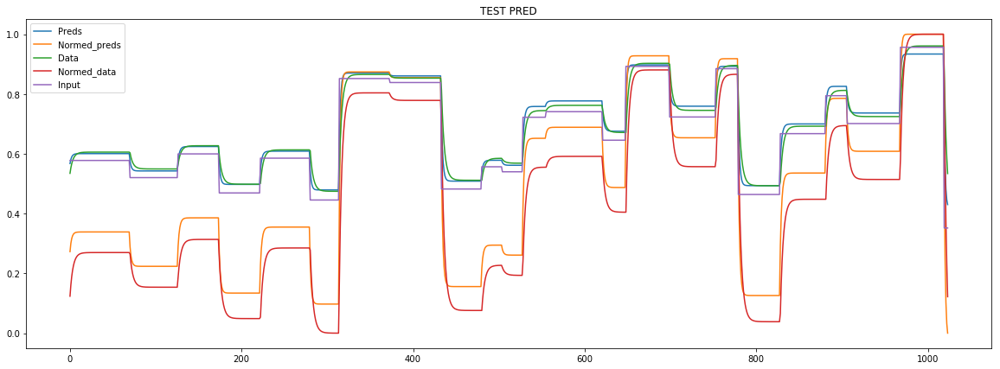

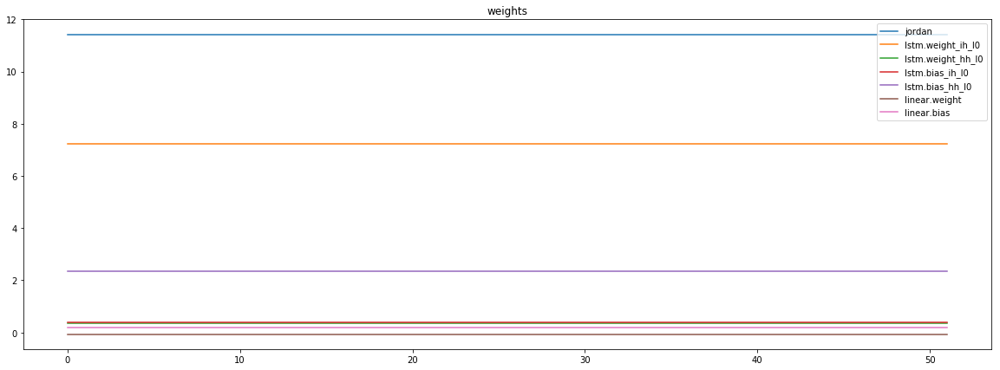

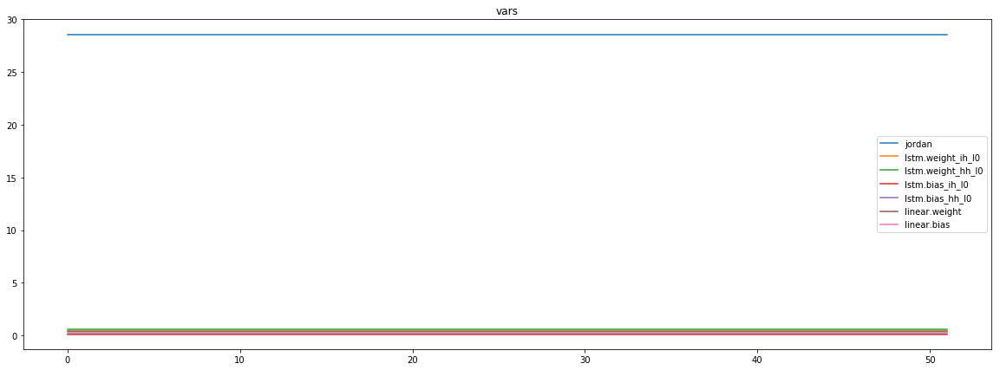

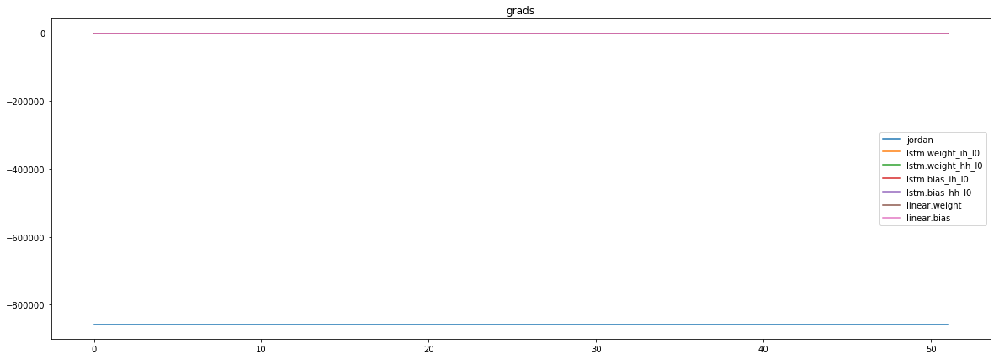

mean_p1 : -22695.4375
mean_p2 : -826071.3125
mean_p3 : -8259.830078125


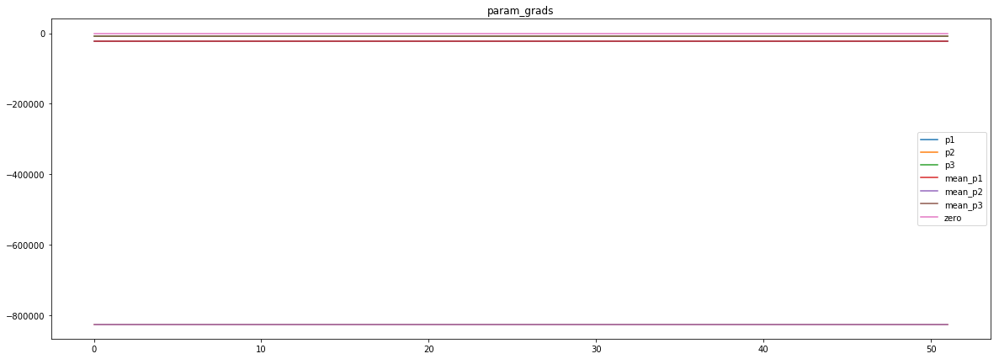

loss rate [0.0011346938467944323]
Epoch [42] 
     train_loss[6501.252293513371] 
     eval_train[0.21890214930933252] 
     eval_test[0.2215196926316077]


aux preds: 0.4505191445350647           0.9976460933685303           9.968050956726074
main loss 0.0
aux loss 397.13854334904596
jord loss 6504.507159893329
combined loss 6901.645703242375 


Parameter containing:
tensor([[0.4505, 0.9976, 9.9681]], requires_grad=True)


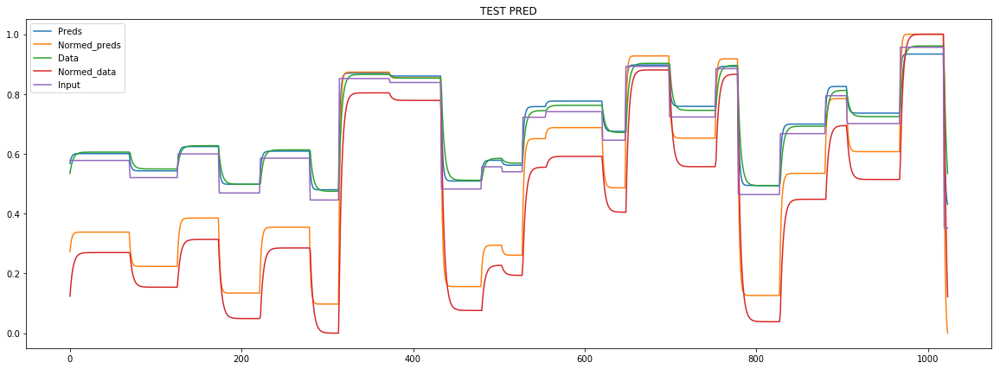

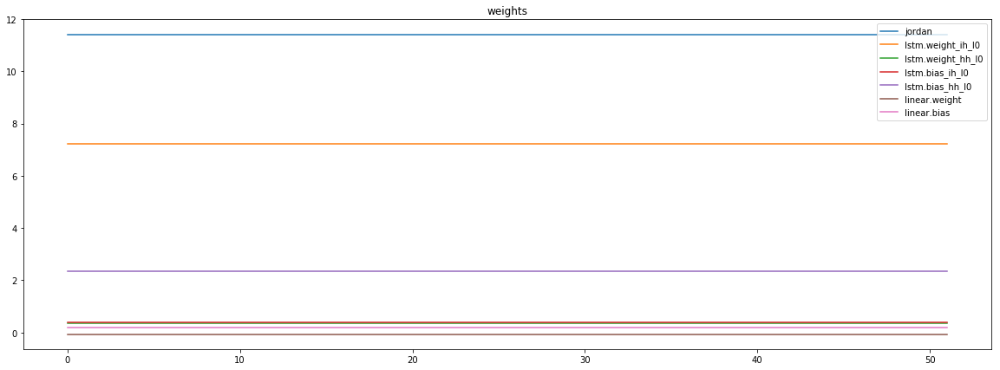

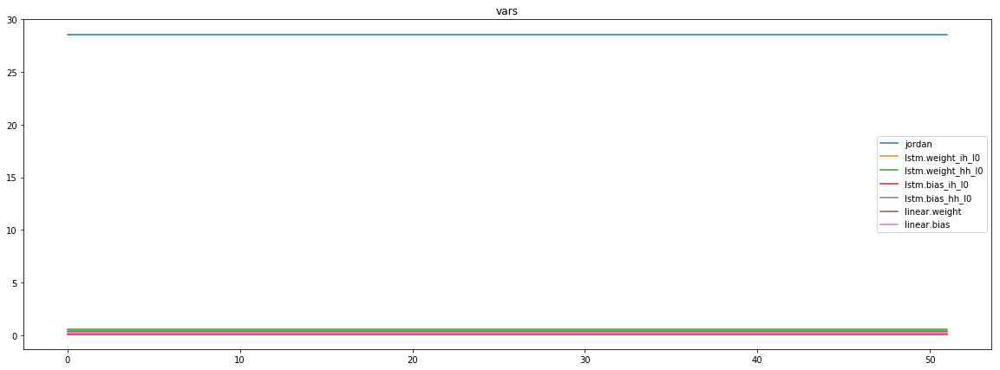

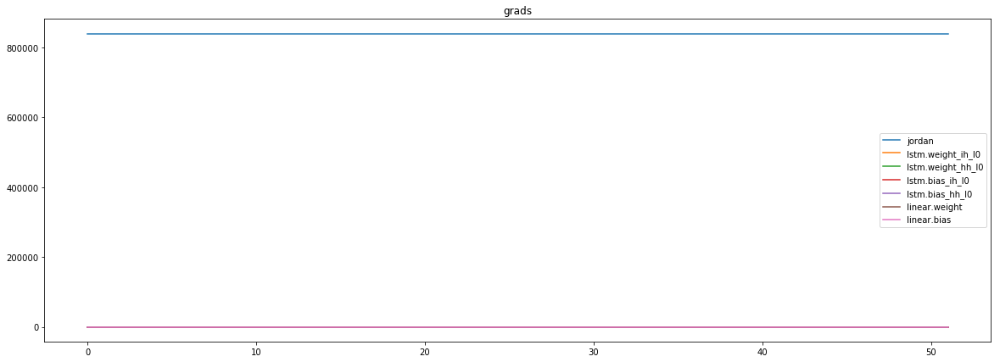

mean_p1 : -40807.328125
mean_p2 : 871413.625
mean_p3 : 8724.99609375


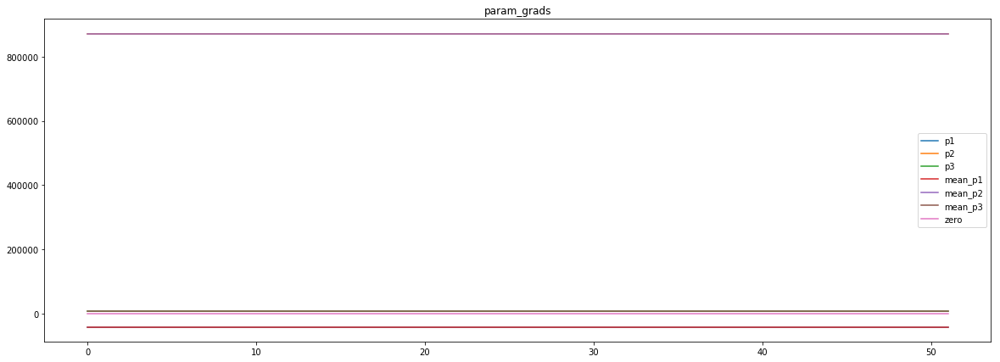

loss rate [0.0004694627657938488]
Epoch [43] 
     train_loss[6901.645703242375] 
     eval_train[0.21884564396280506] 
     eval_test[0.221446128773757]


aux preds: 0.44719240069389343           1.0002681016921997           9.96867561340332
main loss 0.0
aux loss 394.6515767024114
jord loss 6132.632028432993
combined loss 6527.283605135404 


Parameter containing:
tensor([[0.4472, 1.0003, 9.9687]], requires_grad=True)


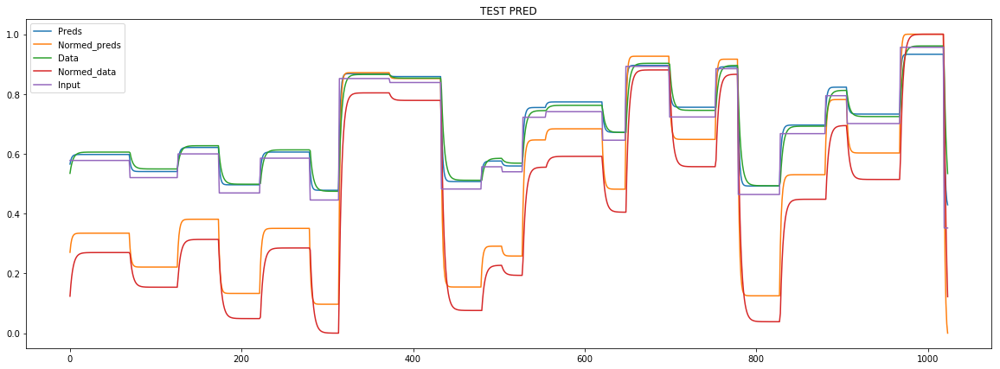

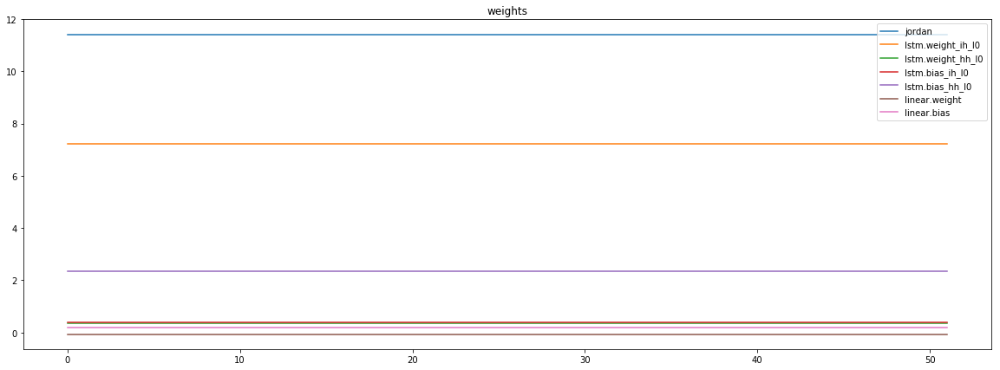

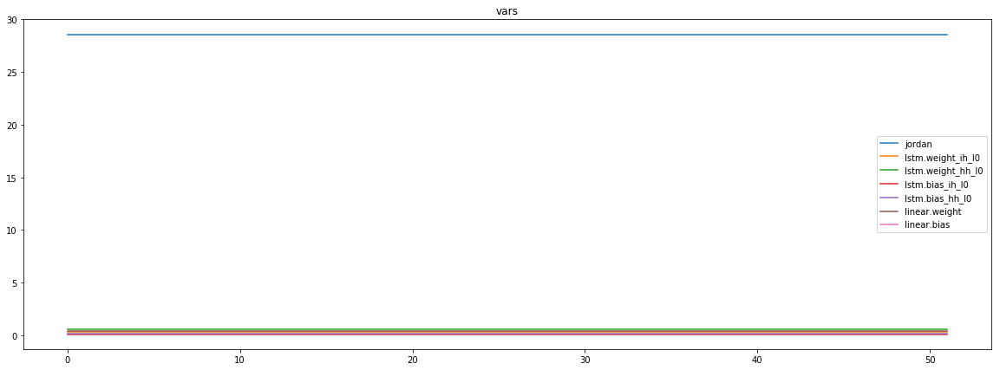

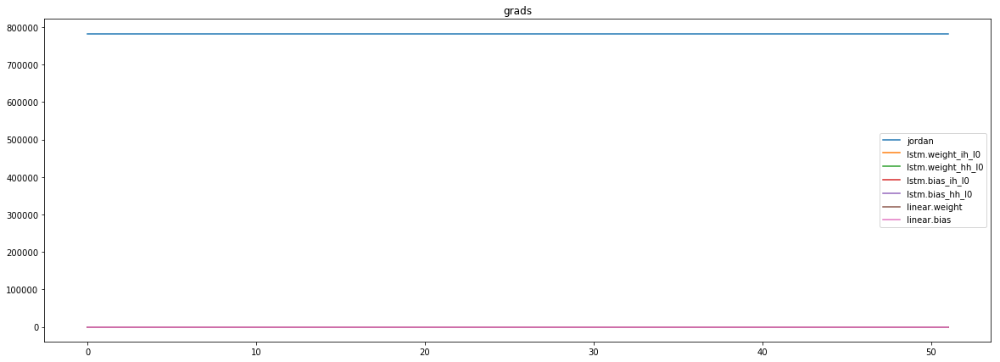

mean_p1 : -15161.7216796875
mean_p2 : 789926.625
mean_p3 : 8002.35400390625


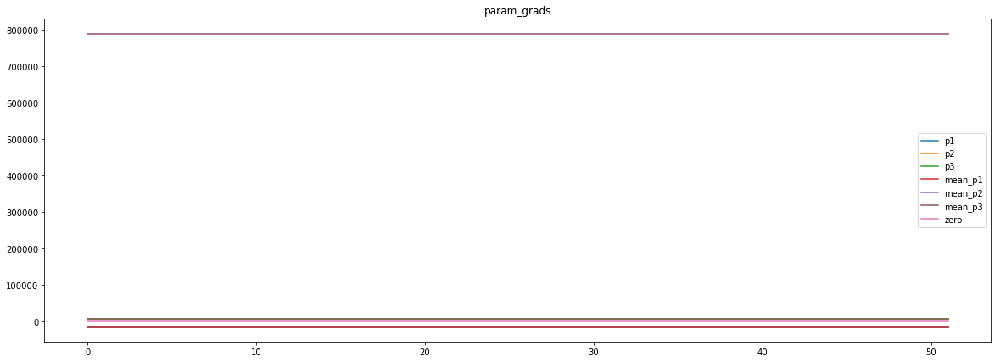

loss rate [0.001087499879725673]
Epoch [44] 
     train_loss[6527.283605135404] 
     eval_train[0.2185027254387163] 
     eval_test[0.22124879997731609]


aux preds: 0.44919532537460327           0.9995294213294983           9.967489242553711
main loss 0.0
aux loss 393.84675774207483
jord loss 5964.6165114182695
combined loss 6358.463269160345 


Parameter containing:
tensor([[0.4492, 0.9995, 9.9675]], requires_grad=True)


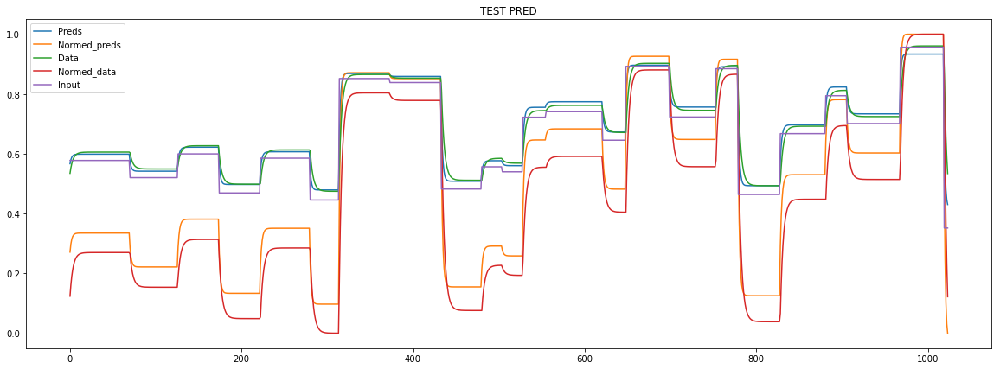

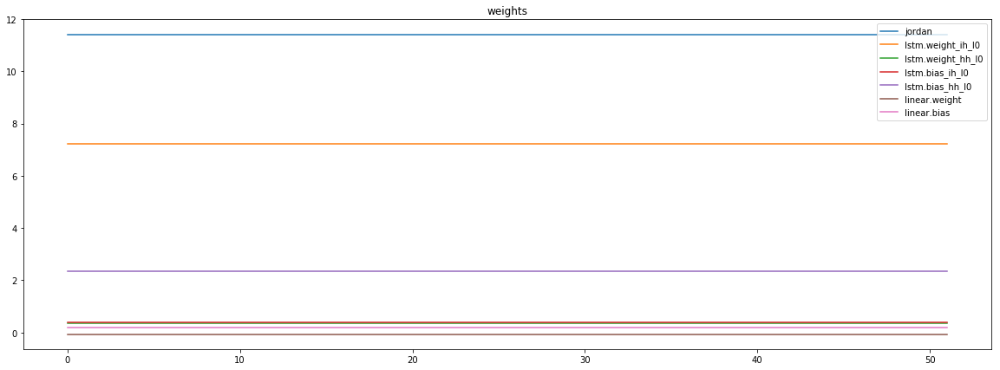

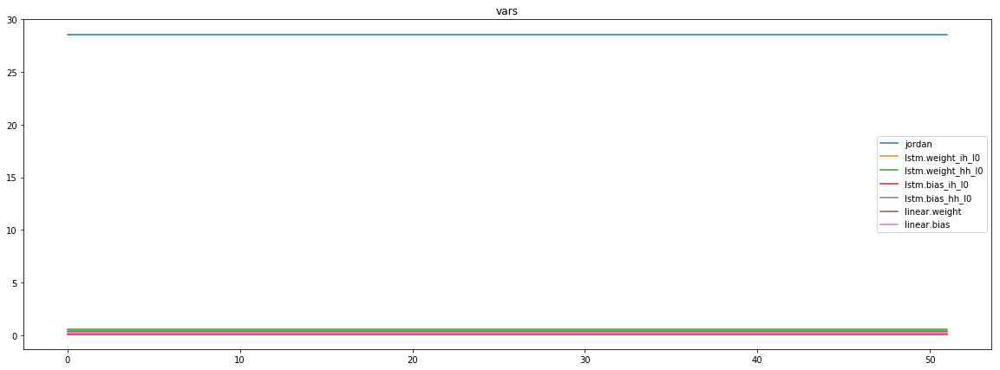

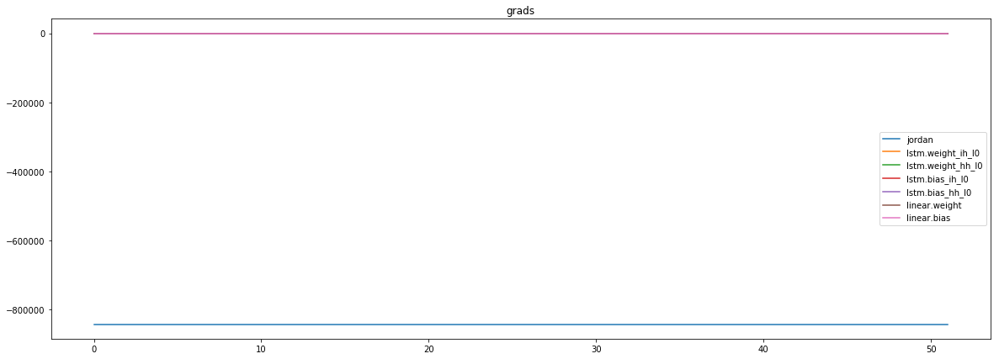

mean_p1 : 12277.185546875
mean_p2 : -845887.4375
mean_p3 : -8514.736328125


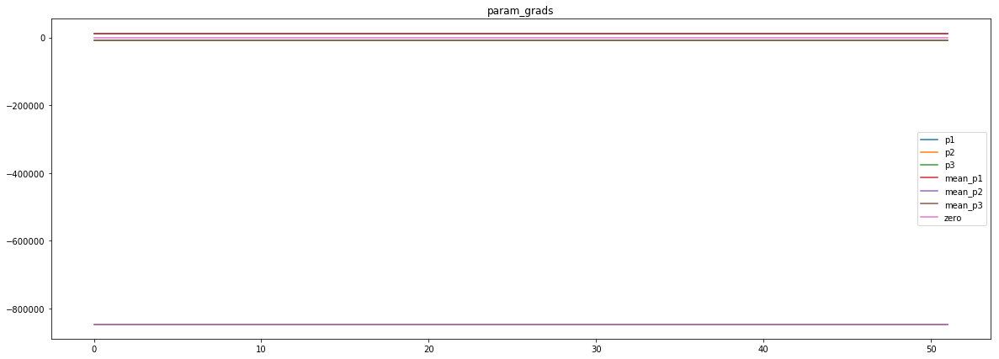

loss rate [0.0008121091872052011]
Epoch [45] 
     train_loss[6358.463269160345] 
     eval_train[0.21854652227977145] 
     eval_test[0.22122506886212662]


aux preds: 0.44840142130851746           1.0023287534713745           9.972759246826172
main loss 0.0
aux loss 392.5520676832933
jord loss 6065.275461050181
combined loss 6457.827528733474 


Parameter containing:
tensor([[0.4484, 1.0023, 9.9728]], requires_grad=True)


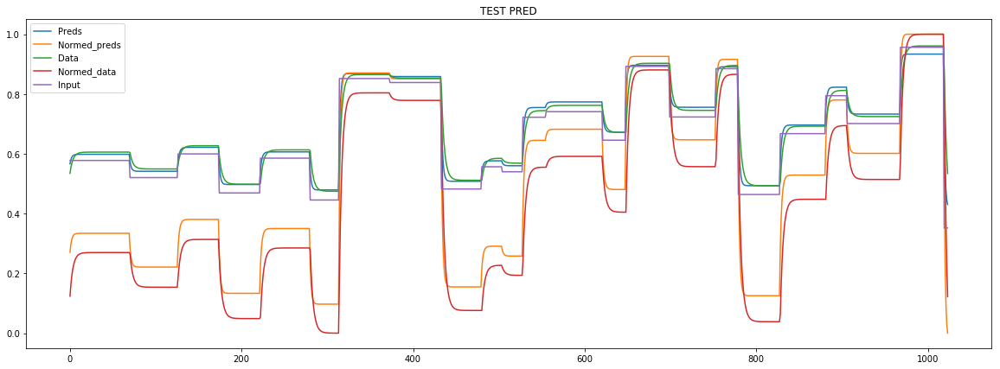

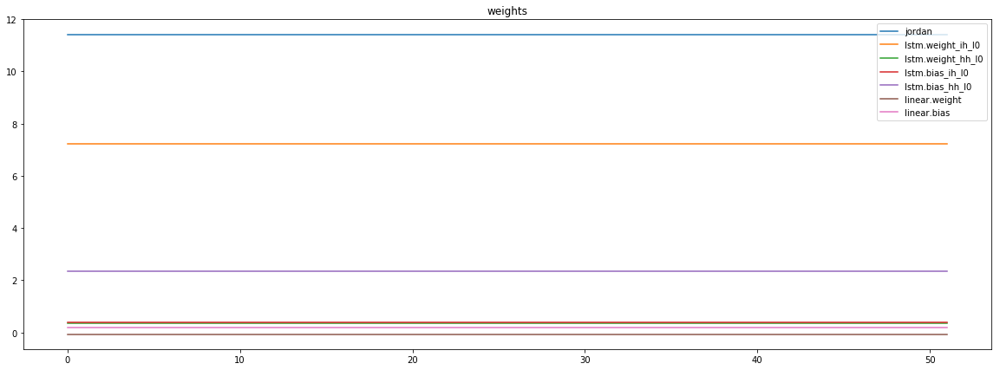

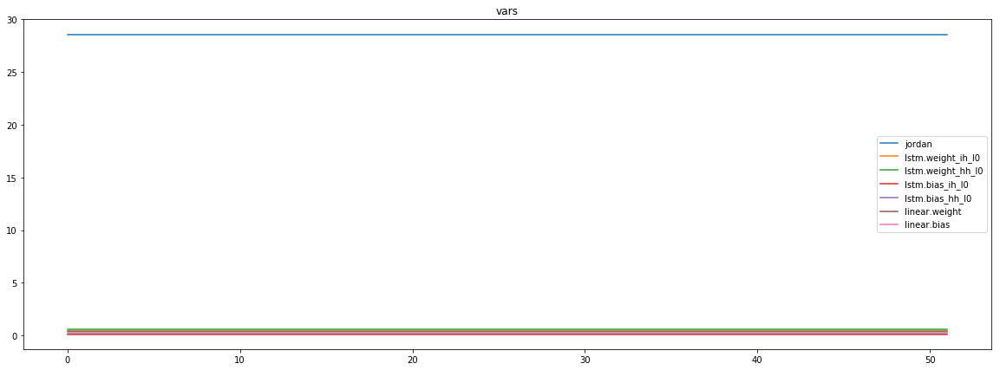

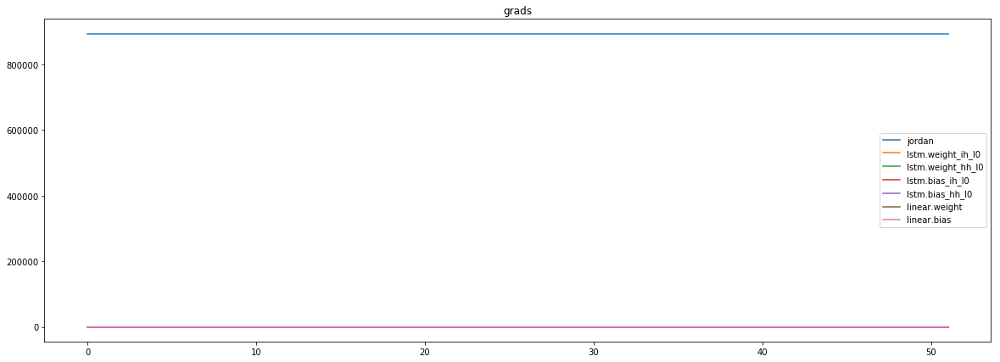

mean_p1 : -29603.853515625
mean_p2 : 913910.0625
mean_p3 : 9175.2314453125


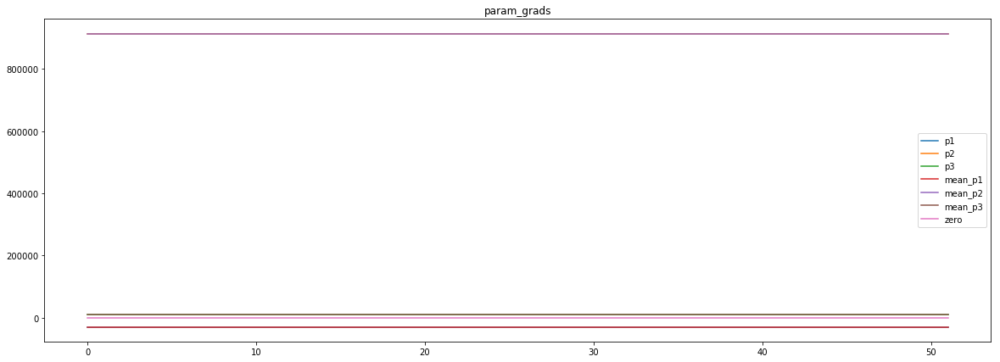

loss rate [0.0007035697451575063]
Epoch [46] 
     train_loss[6457.827528733474] 
     eval_train[0.2184629989071534] 
     eval_test[0.22115096119655803]


aux preds: 0.44776108860969543           0.9990763068199158           9.970736503601074
main loss 0.0
aux loss 393.2000527015099
jord loss 6042.34535569411
combined loss 6435.54540839562 


Parameter containing:
tensor([[0.4478, 0.9991, 9.9707]], requires_grad=True)


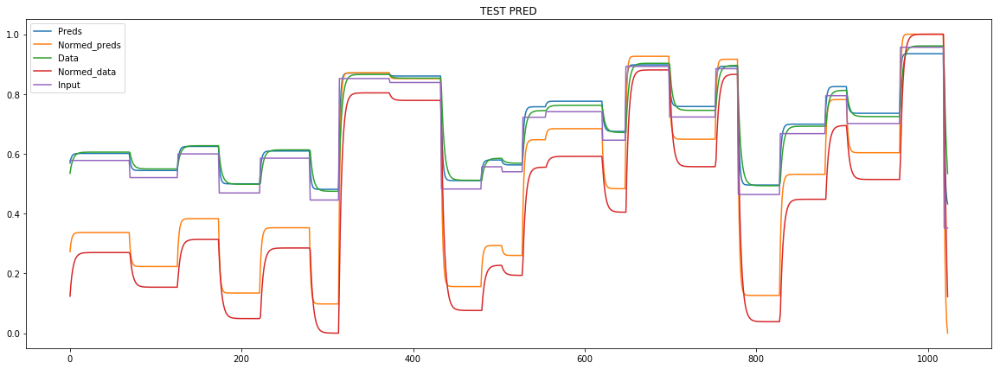

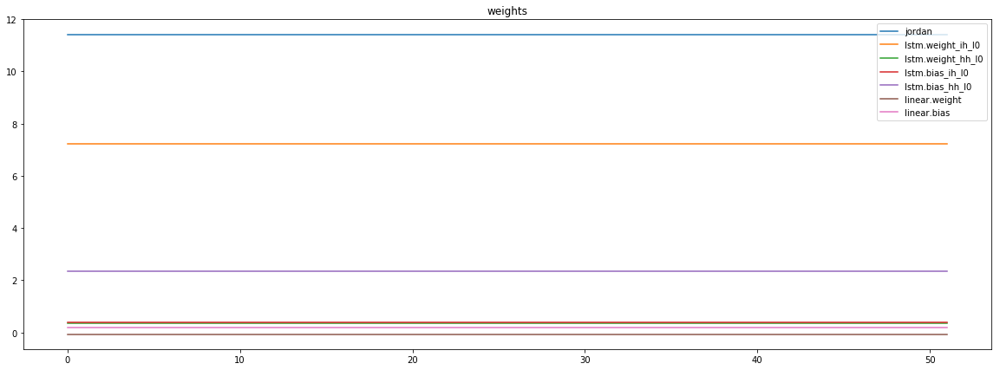

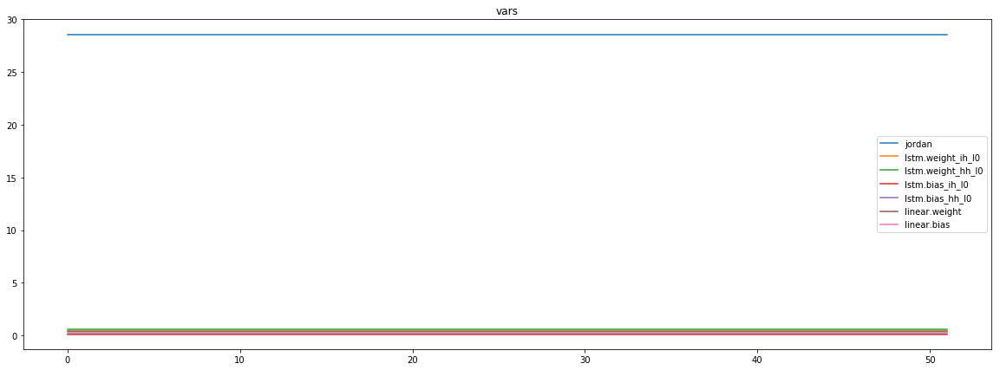

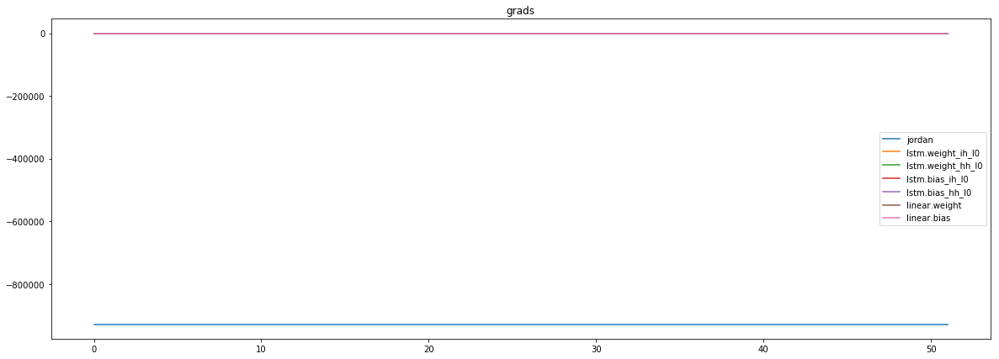

mean_p1 : -35522.53125
mean_p2 : -884345.8125
mean_p3 : -8777.83203125


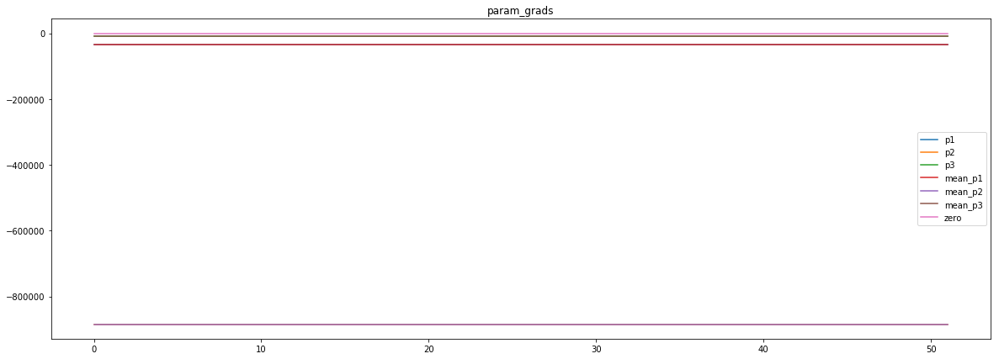

loss rate [-0.0004664262525799767]
Epoch [47] 
     train_loss[6435.54540839562] 
     eval_train[0.2187734023811152] 
     eval_test[0.22131145402619784]


aux preds: 0.4500906467437744           1.0011780261993408           9.97486686706543
main loss 0.0
aux loss 392.9892789400541
jord loss 6465.781034029447
combined loss 6858.770312969501 


Parameter containing:
tensor([[0.4501, 1.0012, 9.9749]], requires_grad=True)


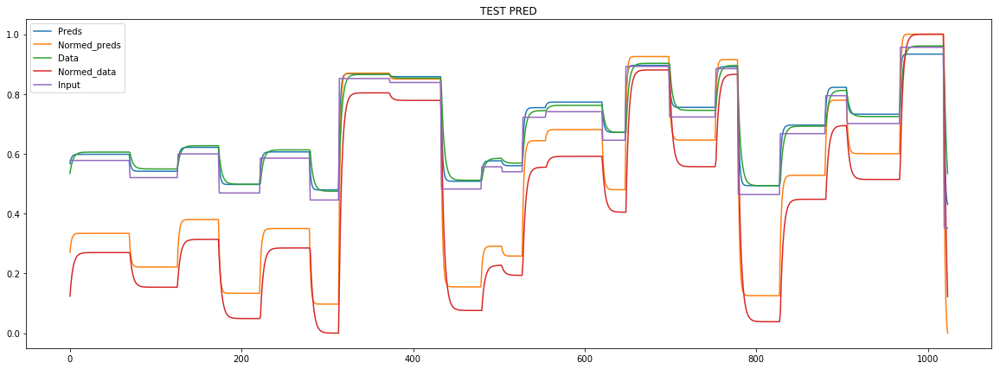

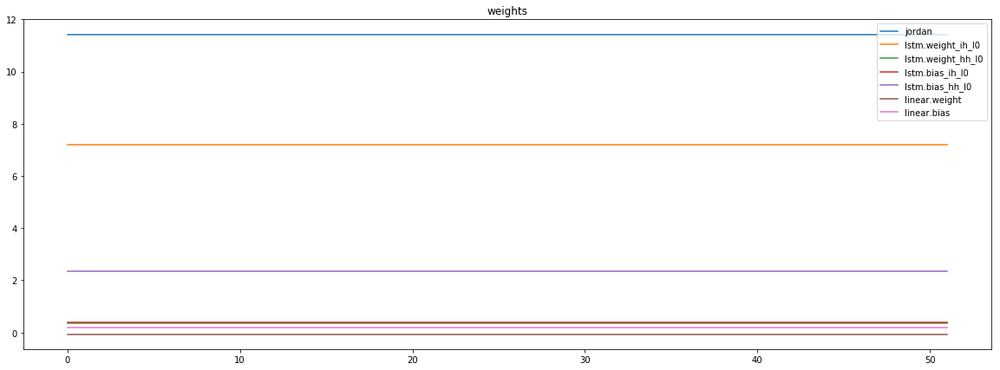

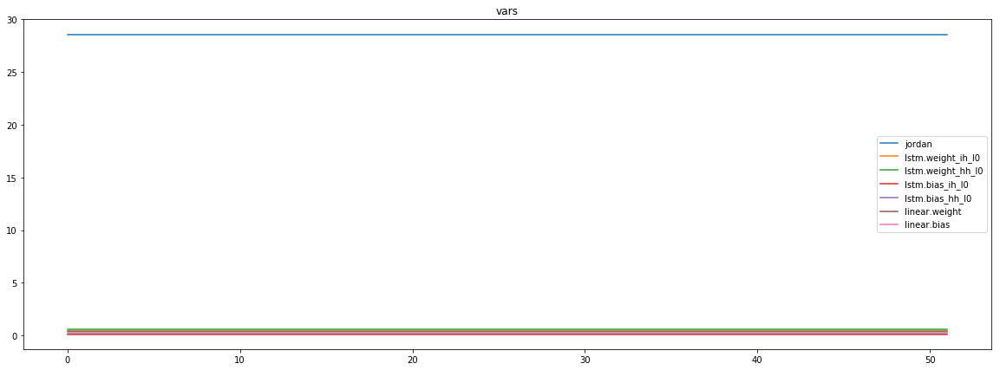

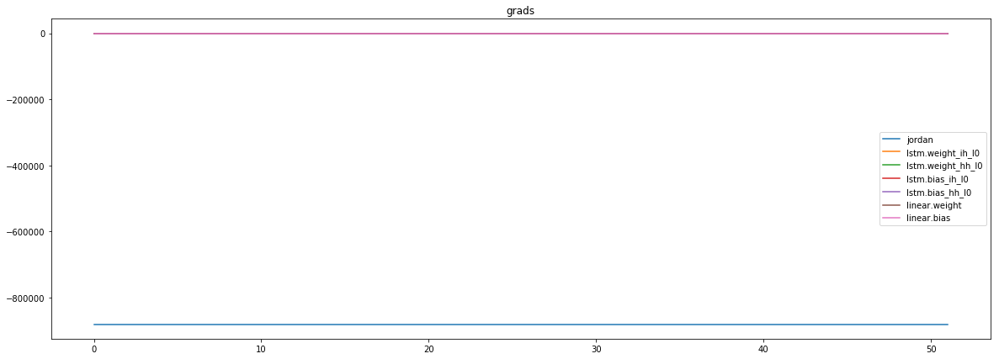

mean_p1 : -39687.54296875
mean_p2 : -832222.875
mean_p3 : -8291.8349609375


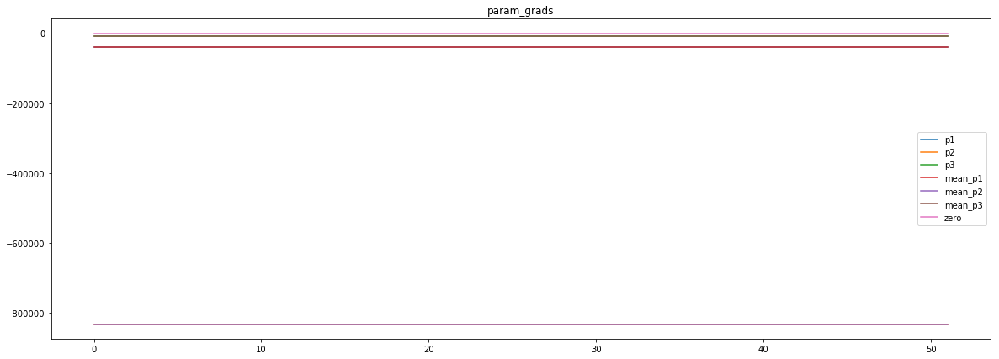

loss rate [0.0007709670705242644]
Epoch [48] 
     train_loss[6858.770312969501] 
     eval_train[0.21837534760841382] 
     eval_test[0.221058600963178]


aux preds: 0.4492017328739166           1.0021449327468872           9.970727920532227
main loss 0.0
aux loss 391.71412482628455
jord loss 6140.344919057993
combined loss 6532.059043884277 


Parameter containing:
tensor([[0.4492, 1.0021, 9.9707]], requires_grad=True)


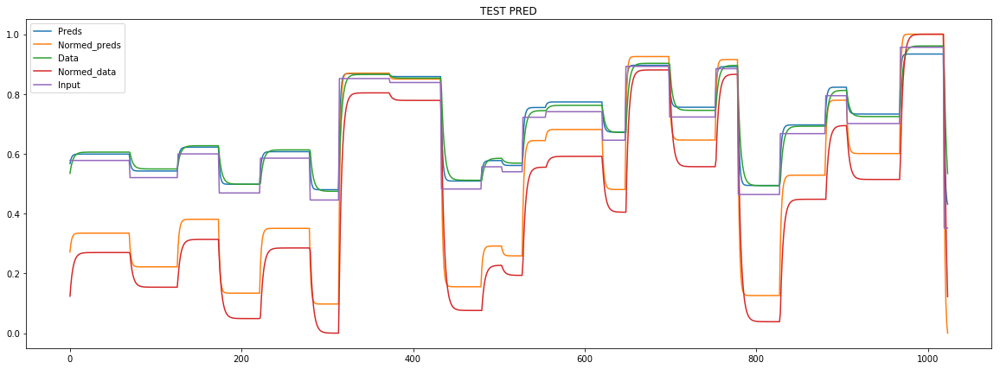

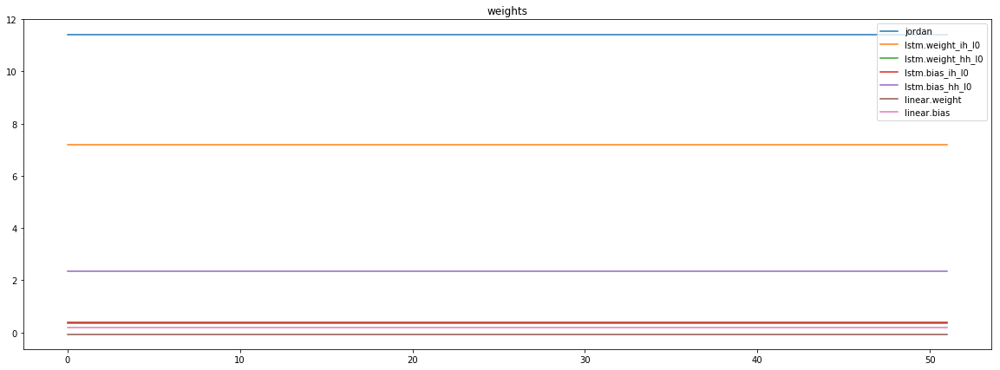

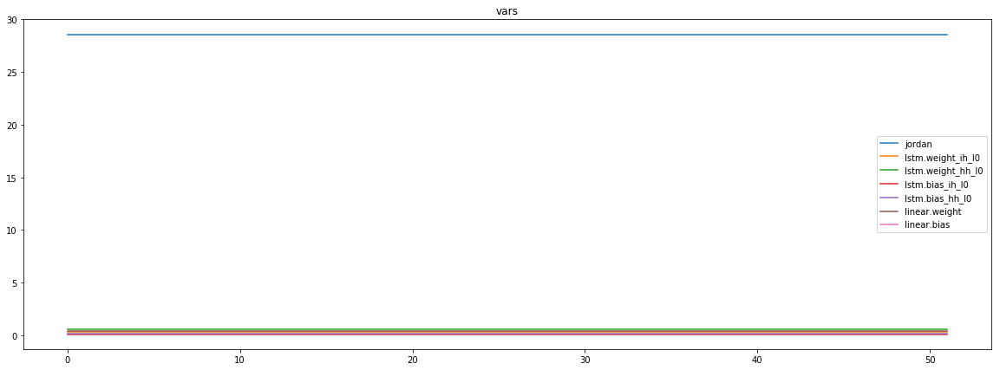

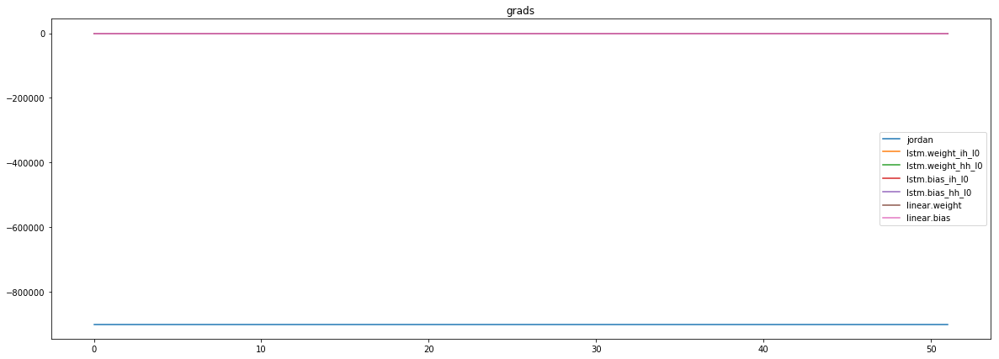

mean_p1 : -30517.7109375
mean_p2 : -861746.75
mean_p3 : -8569.123046875


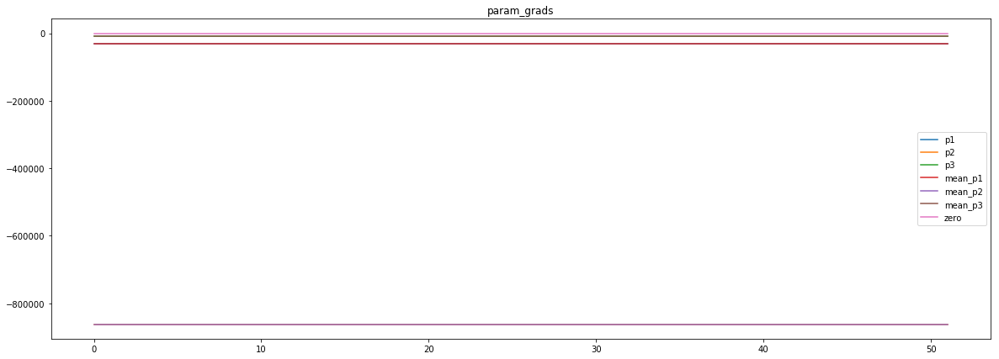

loss rate [0.0005758999755981487]
Epoch [49] 
     train_loss[6532.059043884277] 
     eval_train[0.21839597409304515] 
     eval_test[0.2210462981496345]


aux preds: 0.44963982701301575           1.0006738901138306           9.973379135131836
main loss 0.0
aux loss 391.81050990178034
jord loss 6256.009652944712
combined loss 6647.820162846492 


Parameter containing:
tensor([[0.4496, 1.0007, 9.9734]], requires_grad=True)


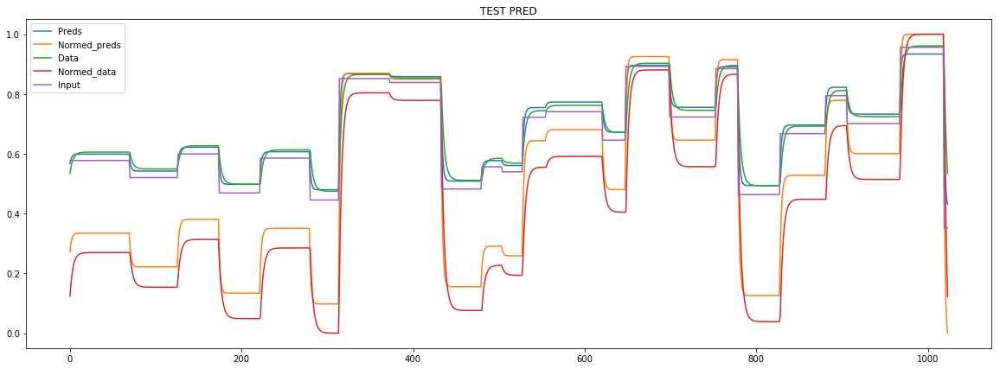

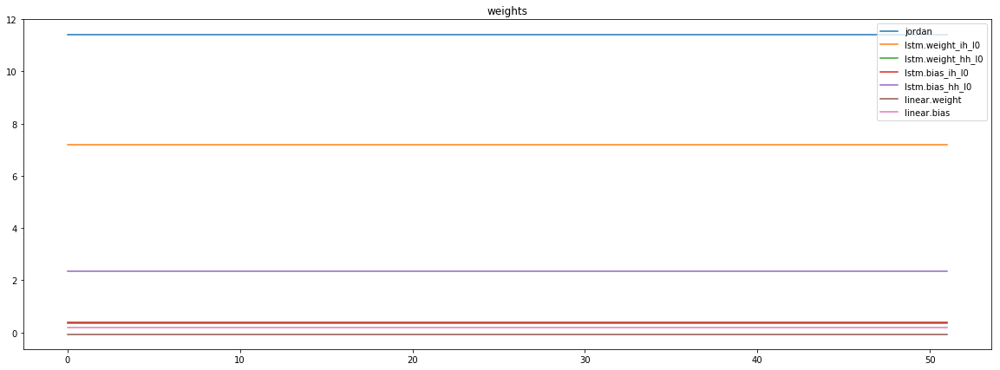

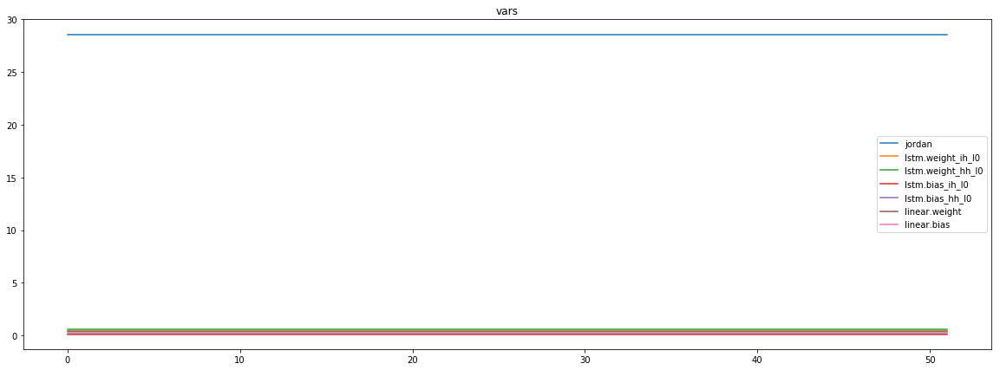

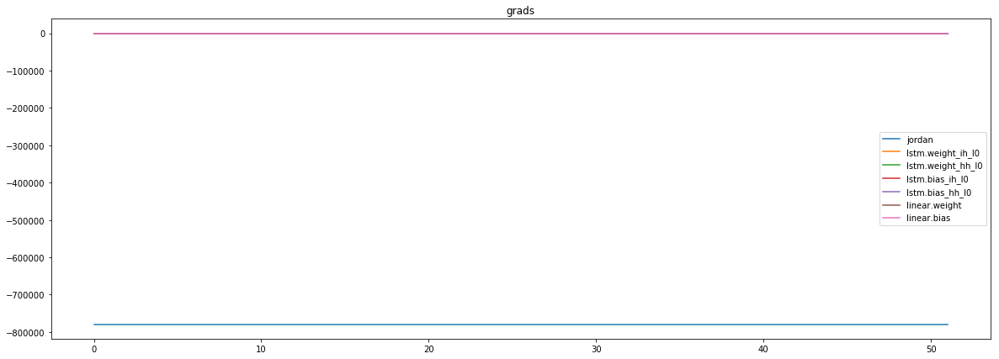

mean_p1 : 24230.732421875
mean_p2 : -795283.1875
mean_p3 : -8036.8720703125


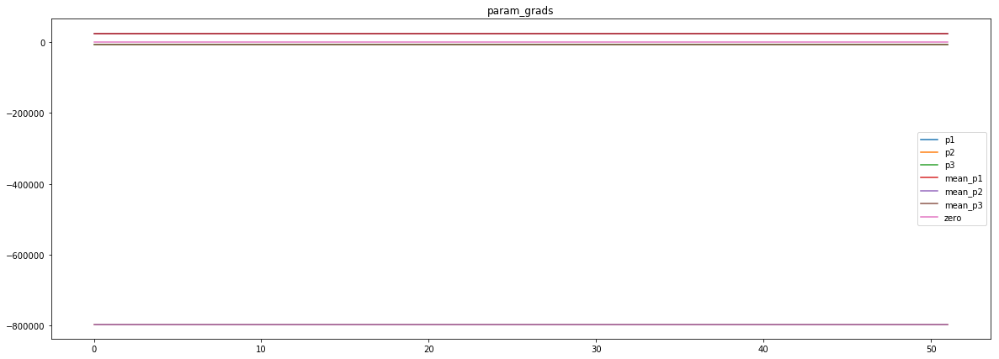

loss rate [0.0006521208808537571]
Epoch [50] 
     train_loss[6647.820162846492] 
     eval_train[0.21833396036750993] 
     eval_test[0.22099457516080953]


aux preds: 0.449397474527359           0.9987115263938904           9.9719877243042
main loss 0.0
aux loss 389.9415482741136
jord loss 6304.2805410531855
combined loss 6694.222089327299 


Parameter containing:
tensor([[0.4494, 0.9987, 9.9720]], requires_grad=True)


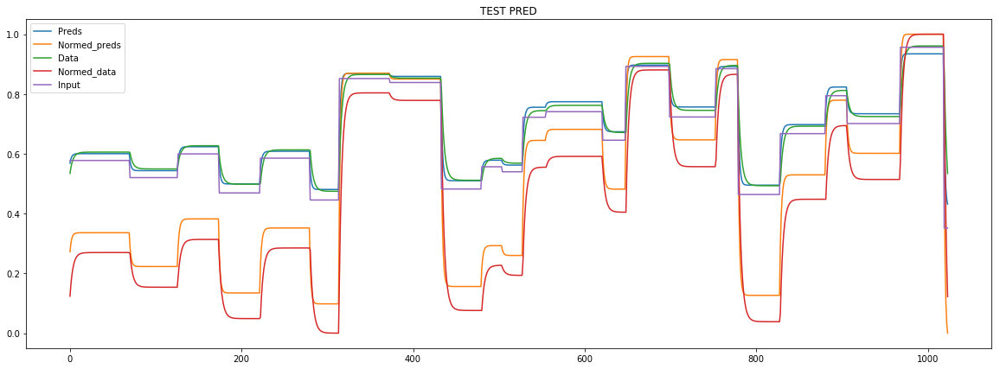

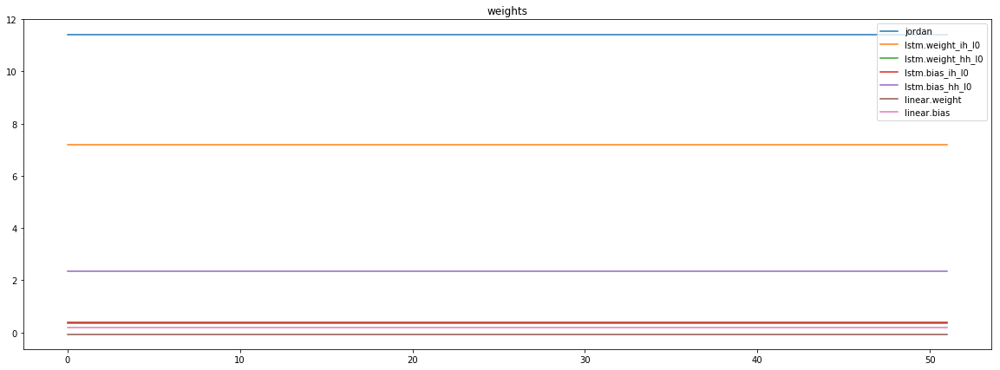

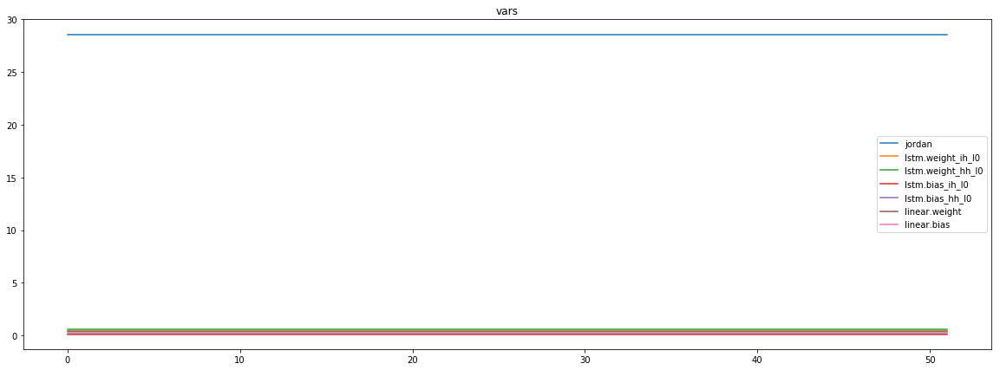

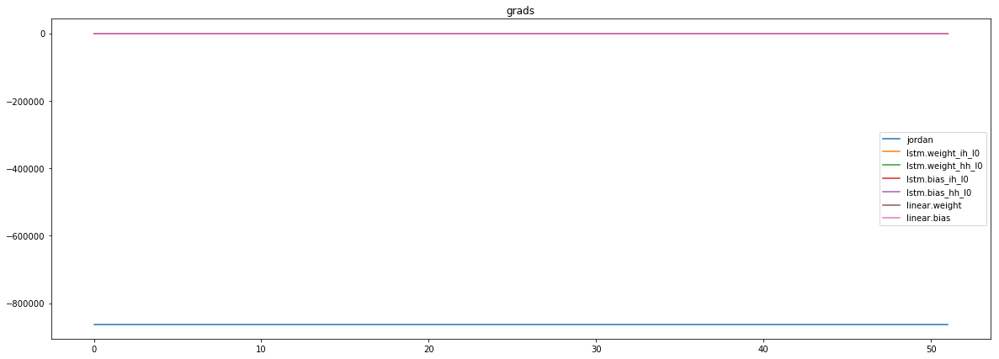

mean_p1 : 5626.2255859375
mean_p2 : -859258.125
mean_p3 : -8624.240234375


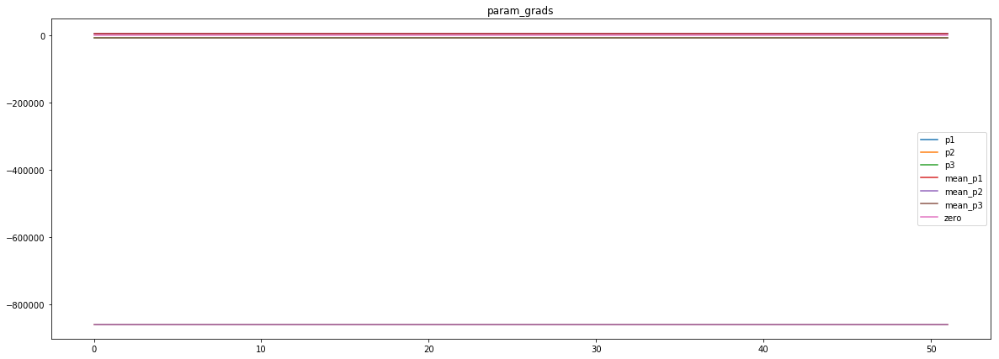

loss rate [-7.825243006820415e-05]
Epoch [51] 
     train_loss[6694.222089327299] 
     eval_train[0.21845265999078176] 
     eval_test[0.22105045447295363]


aux preds: 0.4488239884376526           0.998428225517273           9.971755027770996
main loss 0.0
aux loss 390.2622516338642
jord loss 5960.566720815806
combined loss 6350.82897244967 


Parameter containing:
tensor([[0.4488, 0.9984, 9.9718]], requires_grad=True)


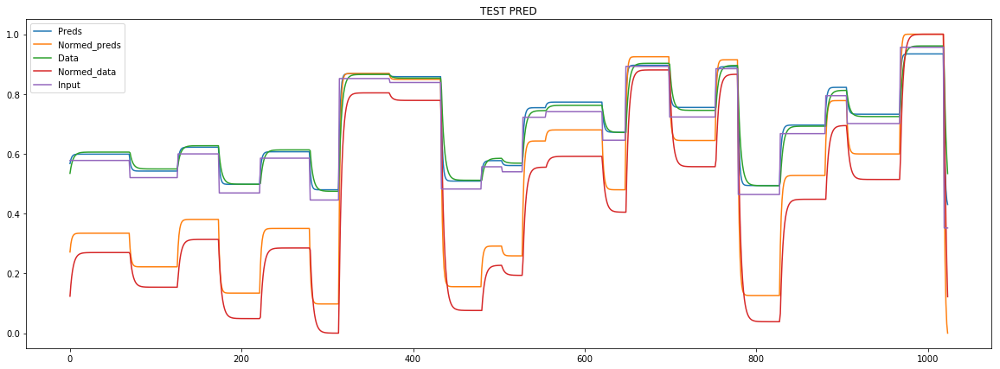

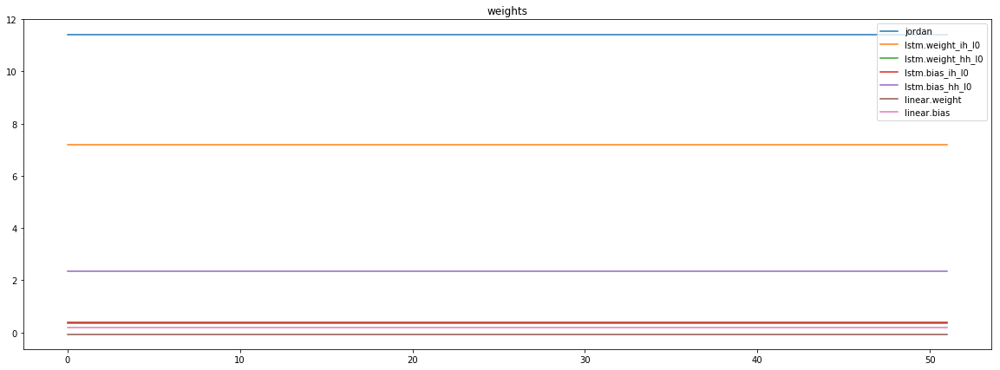

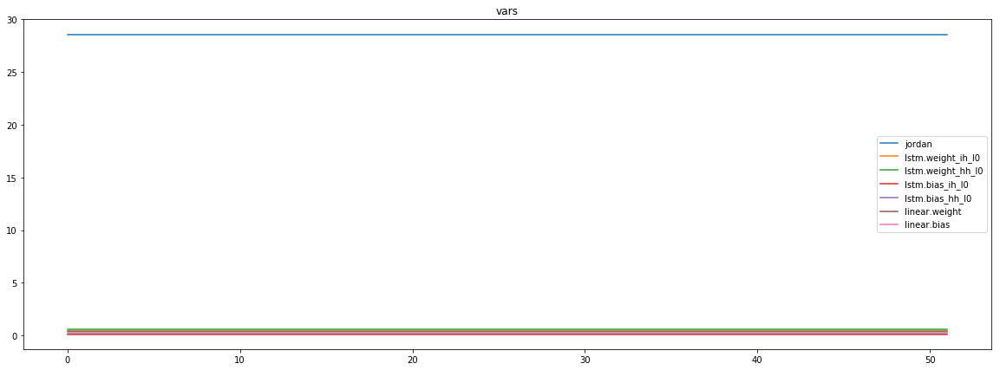

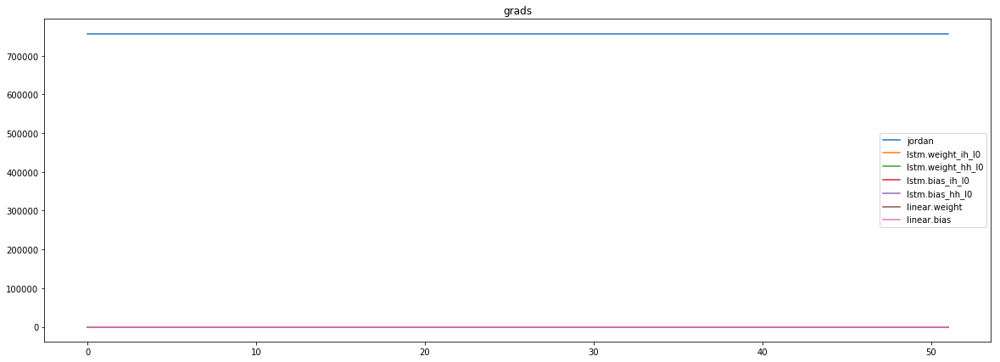

mean_p1 : -18220.091796875
mean_p2 : 767565.5625
mean_p3 : 7768.3974609375


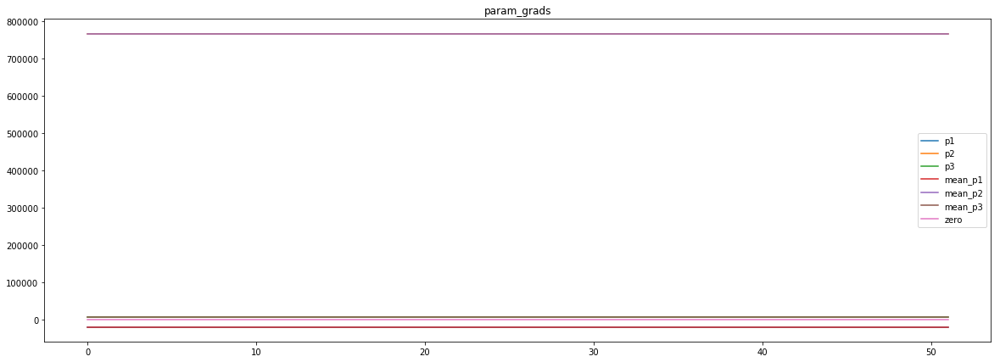

loss rate [0.0005651014491866446]
Epoch [52] 
     train_loss[6350.82897244967] 
     eval_train[0.21823968860105825] 
     eval_test[0.2209055379710414]


aux preds: 0.4494348466396332           0.9984252452850342           9.968400001525879
main loss 0.0
aux loss 389.23240778996393
jord loss 5995.028573843149
combined loss 6384.260981633113 


Parameter containing:
tensor([[0.4494, 0.9984, 9.9684]], requires_grad=True)


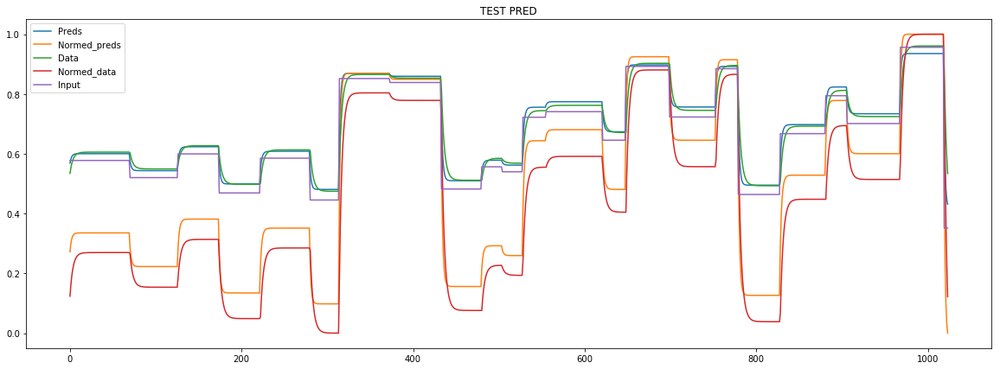

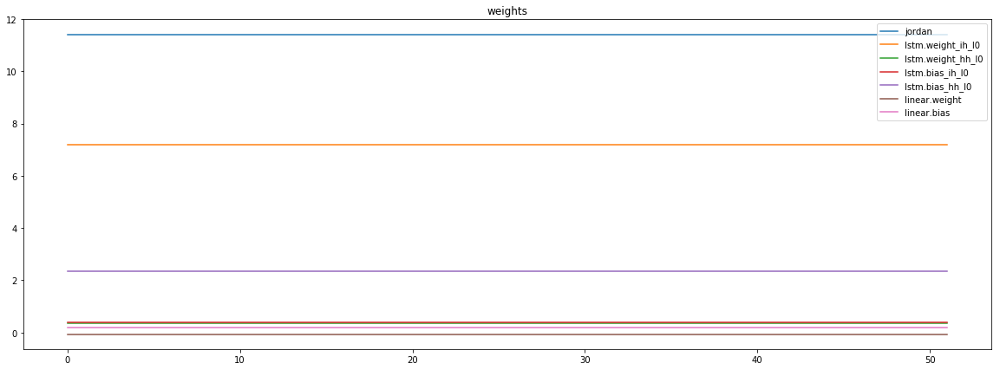

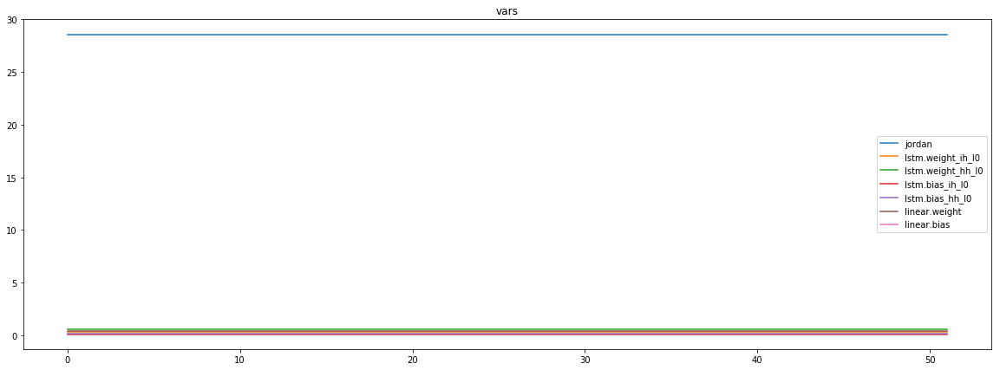

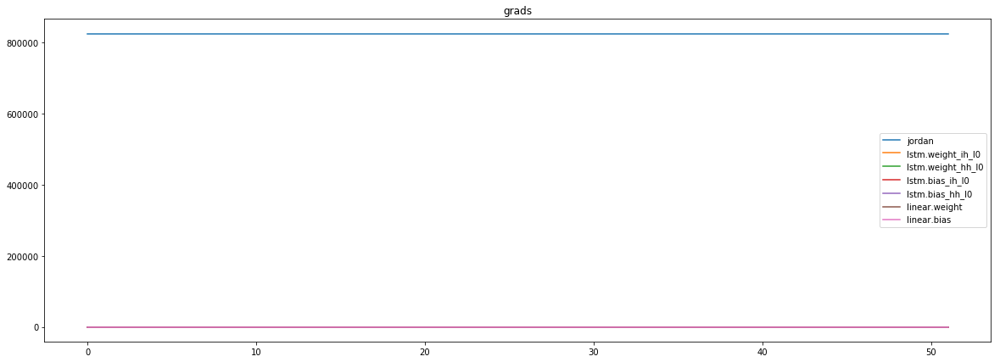

mean_p1 : -46422.5703125
mean_p2 : 863177.375
mean_p3 : 8629.9951171875


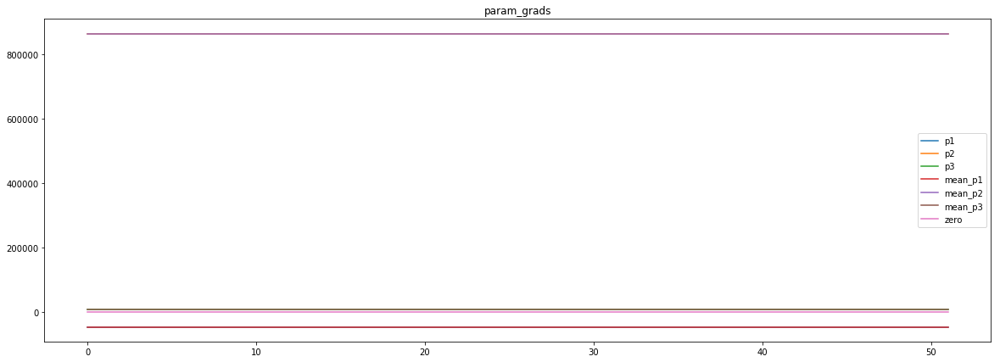

loss rate [5.268405603853221e-05]
Epoch [53] 
     train_loss[6384.260981633113] 
     eval_train[0.21837929589673874] 
     eval_test[0.22097188022665]


aux preds: 0.44965437054634094           0.9992842078208923           9.967852592468262
main loss 0.0
aux loss 389.0793762207031
jord loss 6073.192199707031
combined loss 6462.271575927734 


Parameter containing:
tensor([[0.4497, 0.9993, 9.9679]], requires_grad=True)


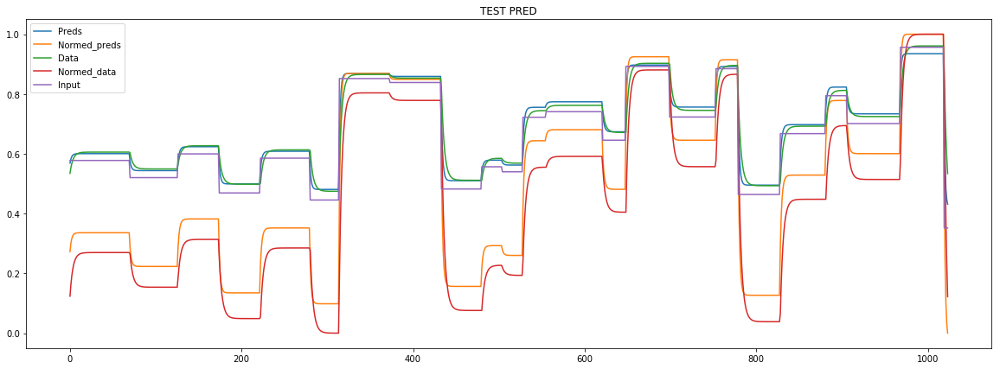

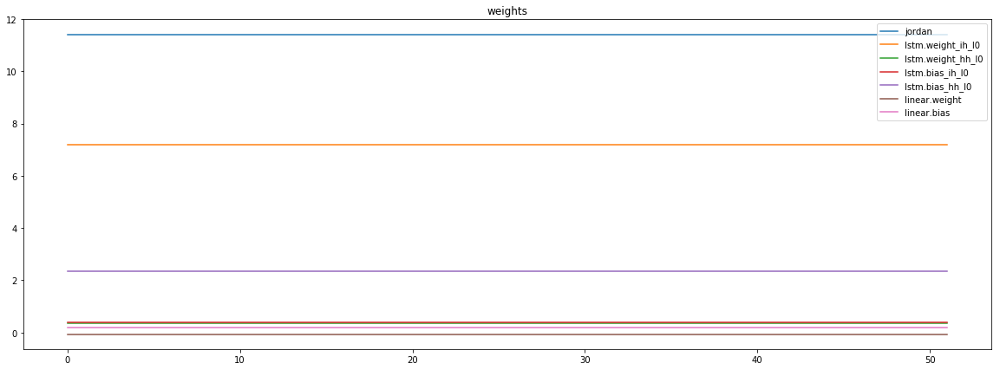

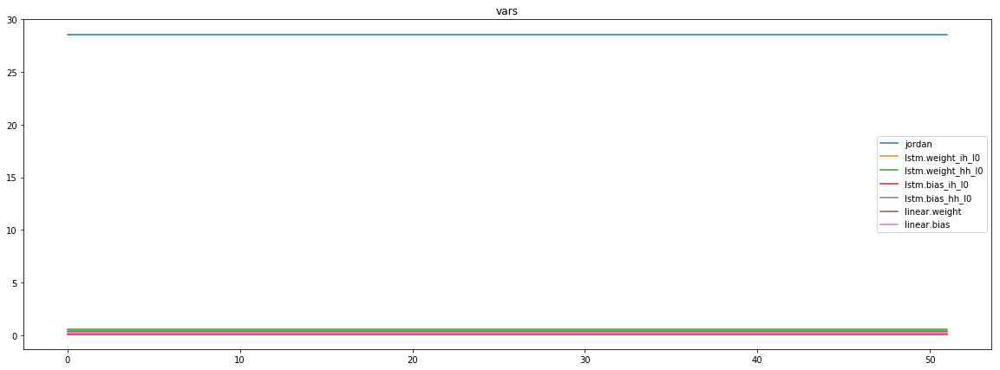

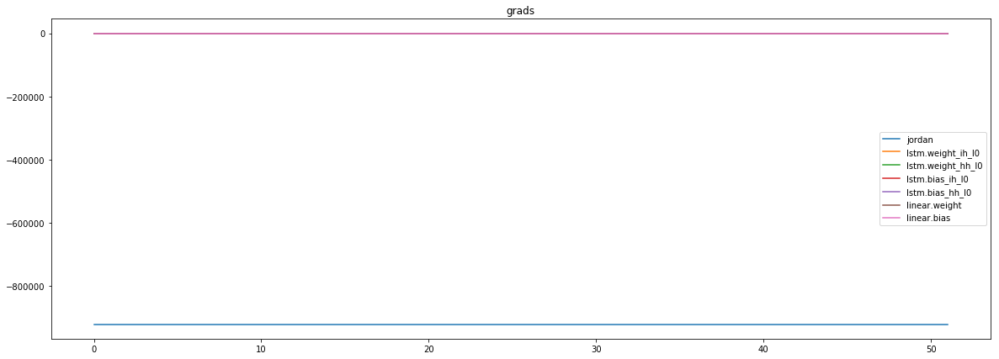

mean_p1 : -41816.109375
mean_p2 : -871825.5
mean_p3 : -8646.2900390625


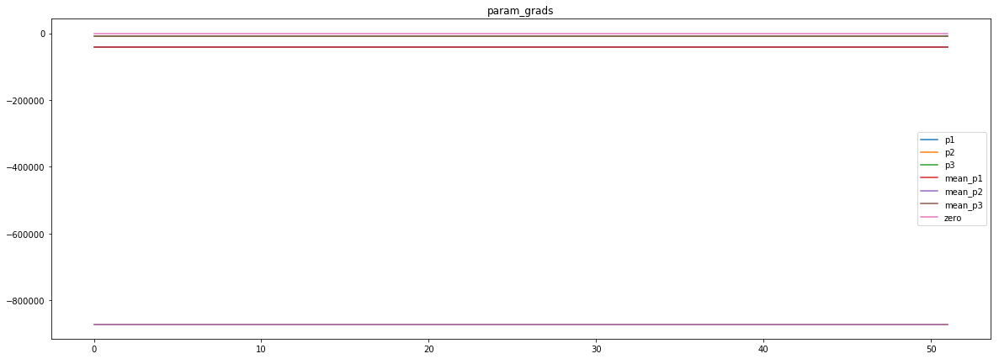

loss rate [0.0002153893830559861]
Epoch [54] 
     train_loss[6462.271575927734] 
     eval_train[0.21832811635417432] 
     eval_test[0.2209283616817133]


aux preds: 0.44806283712387085           0.9994178414344788           9.973190307617188
main loss 0.0
aux loss 388.94837247408356
jord loss 5995.777508075421
combined loss 6384.725880549505 


Parameter containing:
tensor([[0.4481, 0.9994, 9.9732]], requires_grad=True)


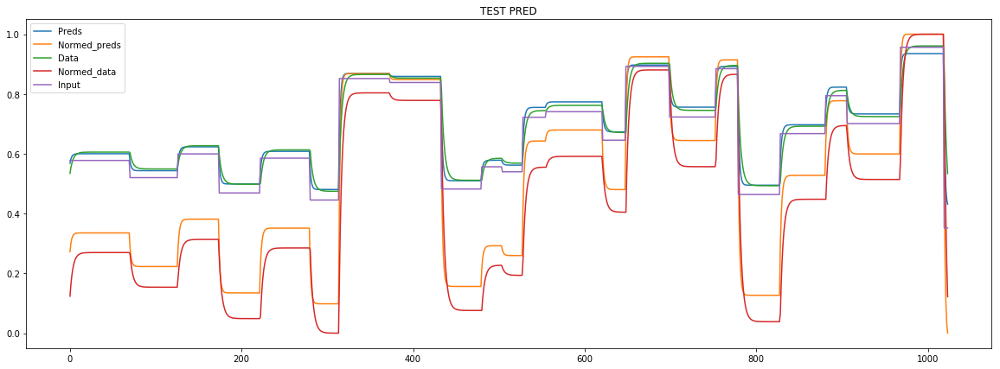

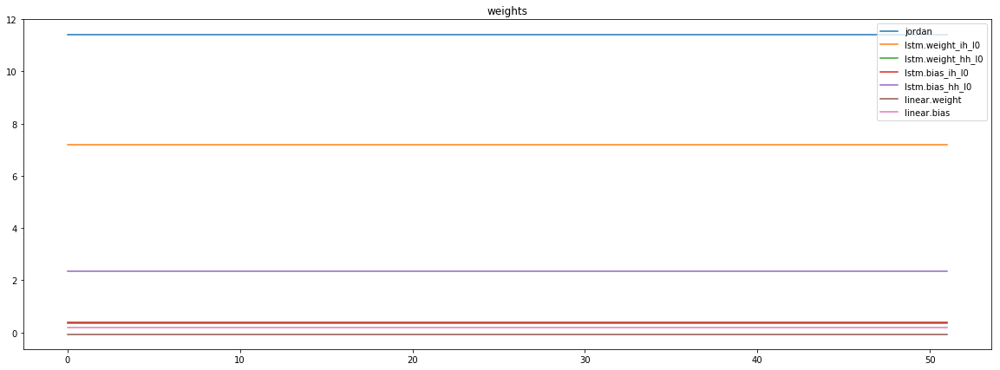

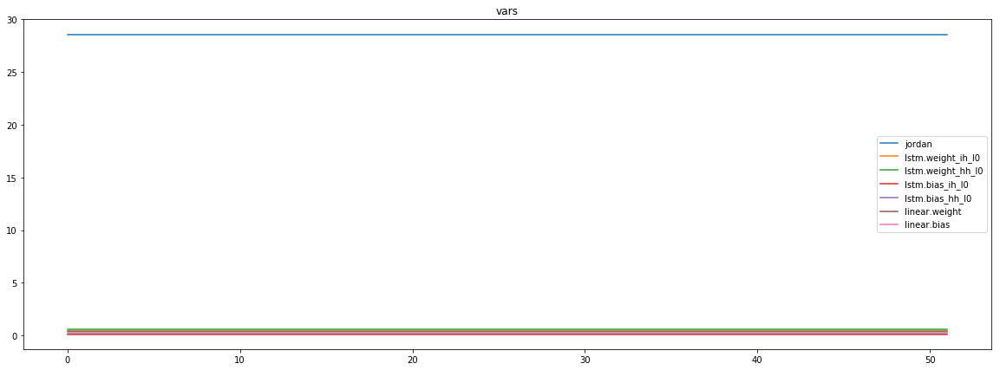

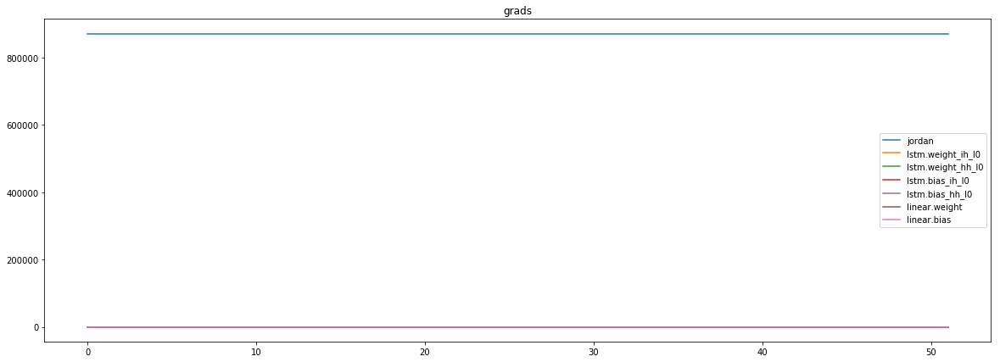

mean_p1 : -5722.90771484375
mean_p2 : 868546.3125
mean_p3 : 8820.78125


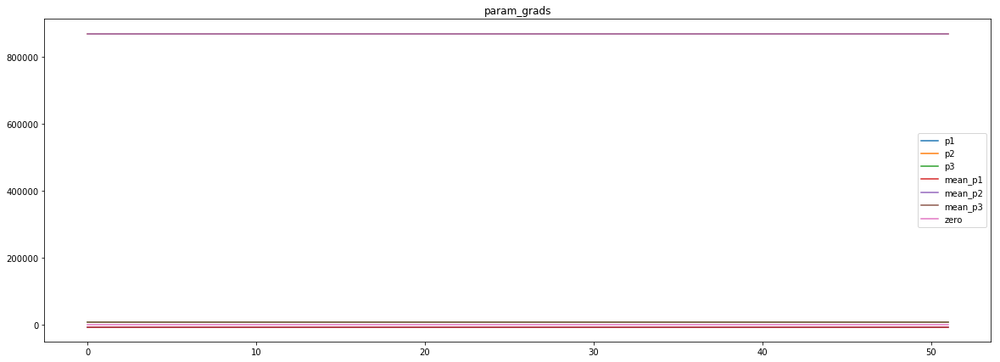

loss rate [0.0003501609751606072]
Epoch [55] 
     train_loss[6384.725880549505] 
     eval_train[0.21824382963733602] 
     eval_test[0.2208578970537267]


aux preds: 0.45036885142326355           1.0012662410736084           9.980683326721191
main loss 0.0
aux loss 388.2199959388146
jord loss 5760.3132887620195
combined loss 6148.533284700834 


Parameter containing:
tensor([[0.4504, 1.0013, 9.9807]], requires_grad=True)


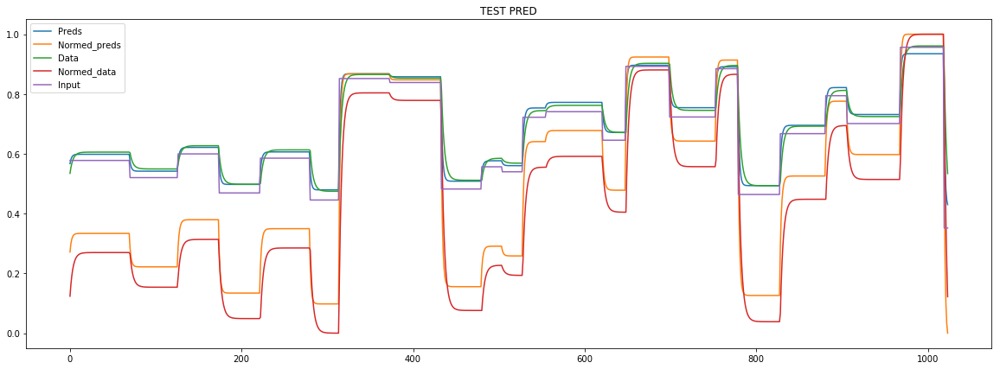

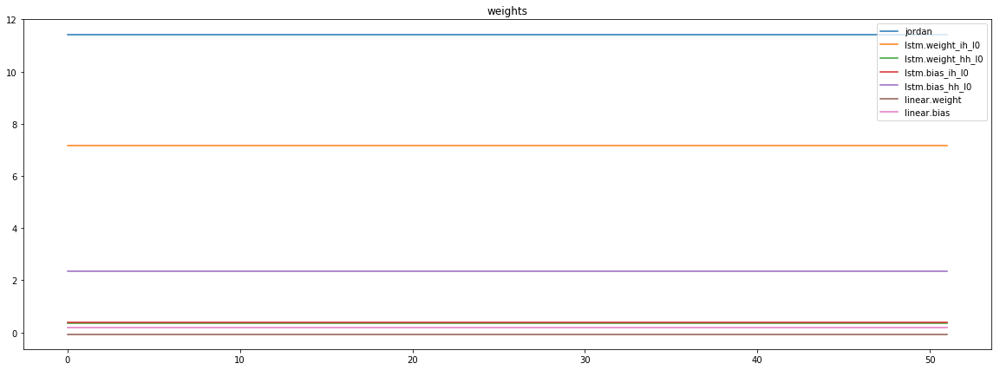

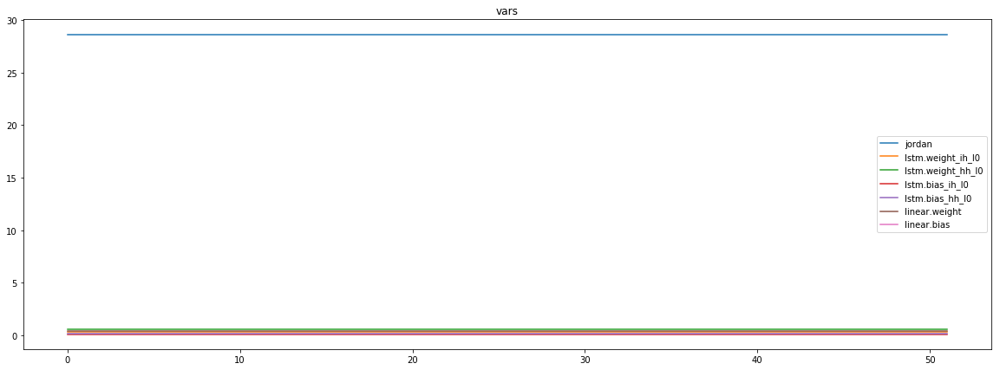

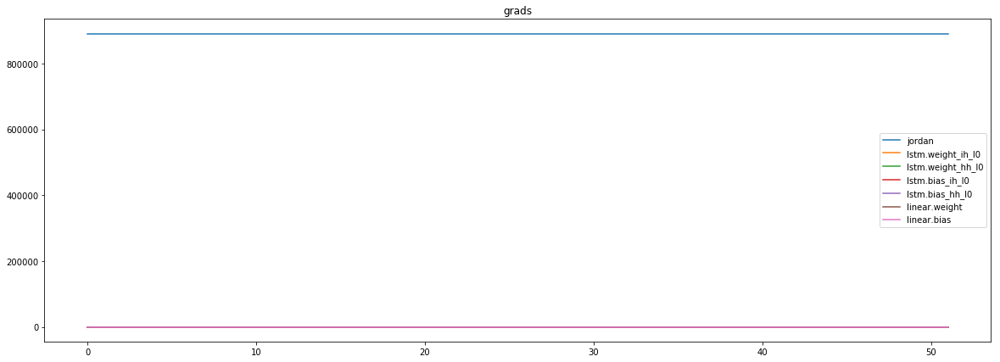

mean_p1 : -28970.30078125
mean_p2 : 910866.1875
mean_p3 : 9150.6787109375


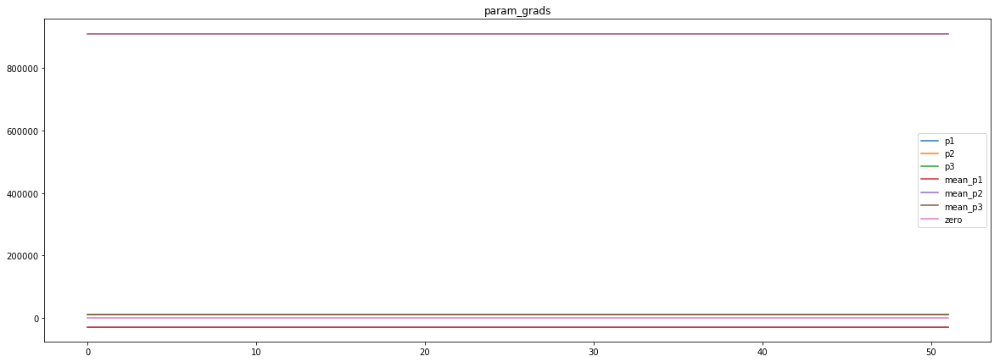

loss rate [0.0009208286895401319]
Epoch [56] 
     train_loss[6148.533284700834] 
     eval_train[0.2180261513075003] 
     eval_test[0.22071595075116915]


aux preds: 0.4478600323200226           1.0002802610397339           9.980796813964844
main loss 0.0
aux loss 388.71626633864184
jord loss 5970.524672288161
combined loss 6359.240938626803 


Parameter containing:
tensor([[0.4479, 1.0003, 9.9808]], requires_grad=True)


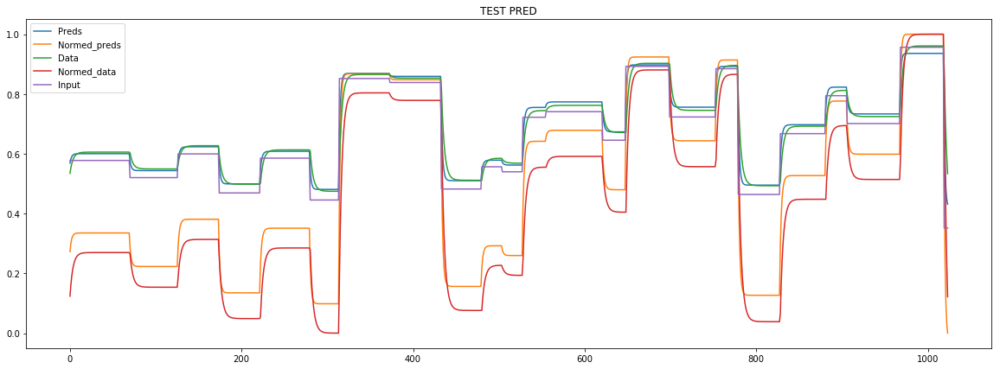

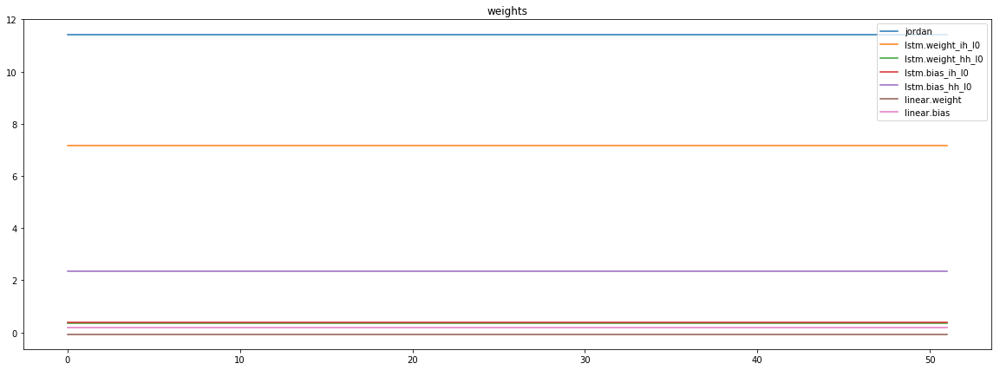

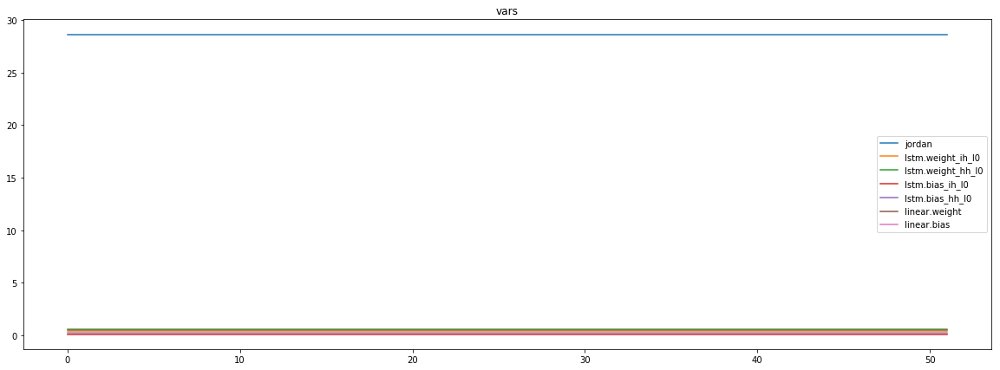

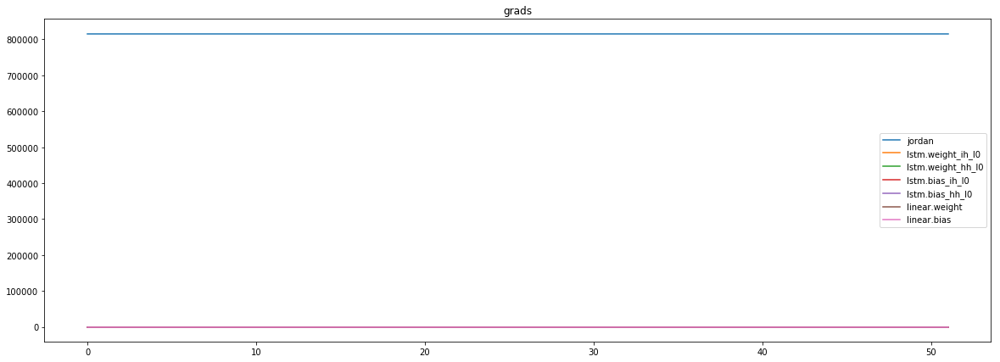

mean_p1 : -695.6582641601562
mean_p2 : 808725.1875
mean_p3 : 8251.7431640625


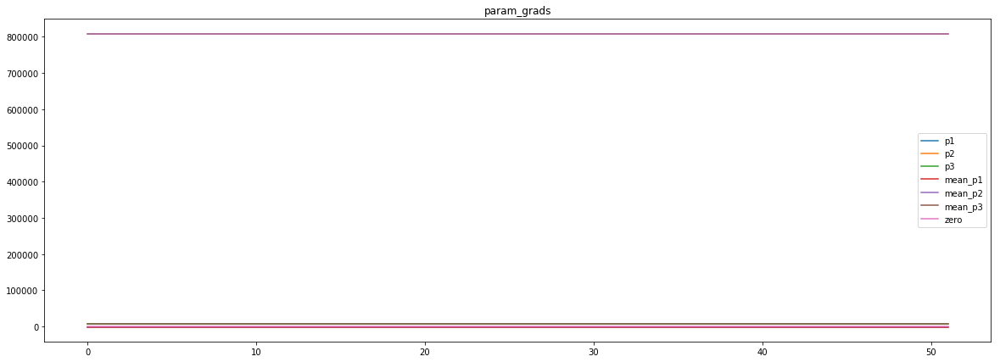

loss rate [0.00021281023663166643]
Epoch [57] 
     train_loss[6359.240938626803] 
     eval_train[0.21818636092715535] 
     eval_test[0.22078707407821307]


aux preds: 0.4460974931716919           1.0024553537368774           9.971906661987305
main loss 0.0
aux loss 386.6602841890775
jord loss 6207.145437387319
combined loss 6593.8057215763965 


Parameter containing:
tensor([[0.4461, 1.0025, 9.9719]], requires_grad=True)


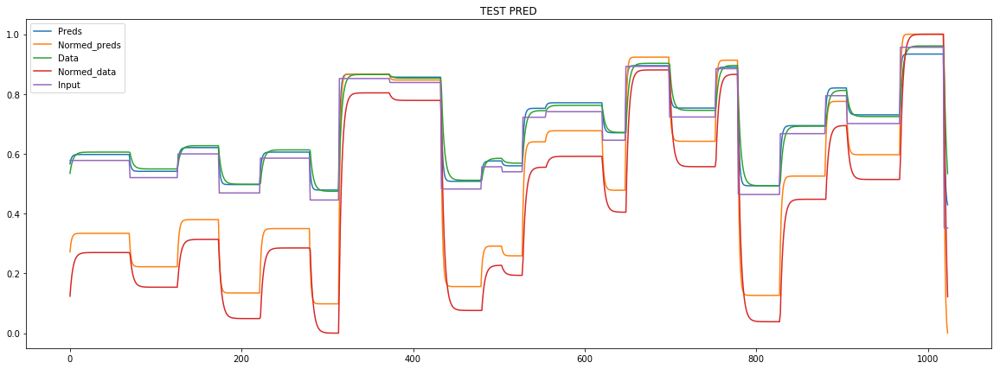

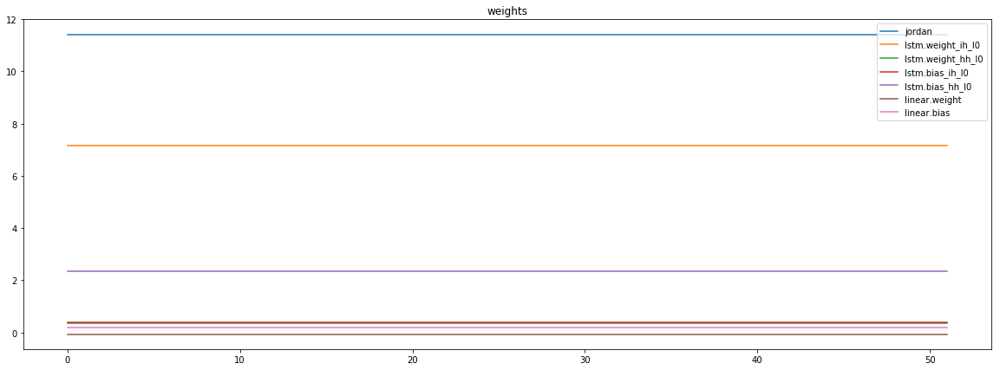

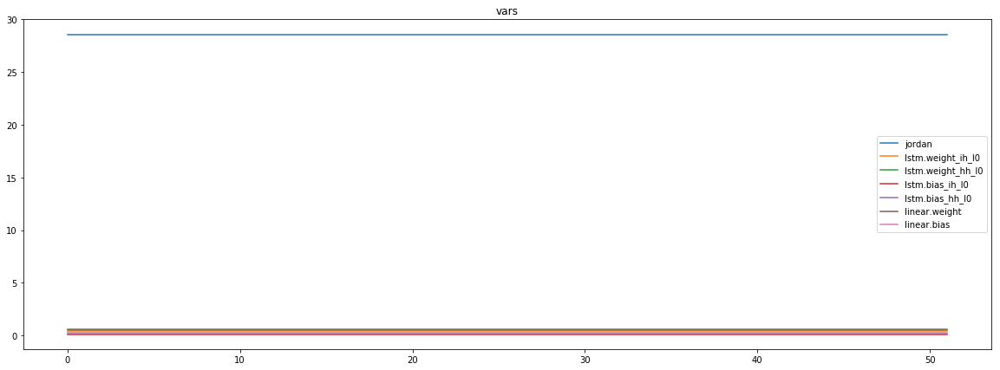

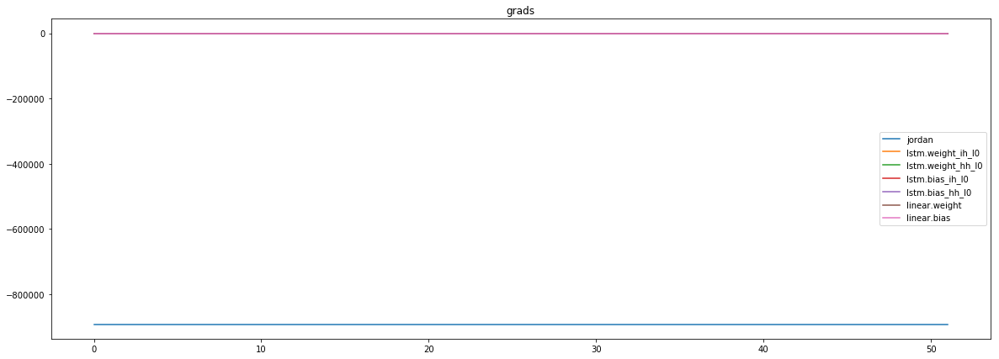

mean_p1 : -27082.9921875
mean_p2 : -856689.4375
mean_p3 : -8535.53515625


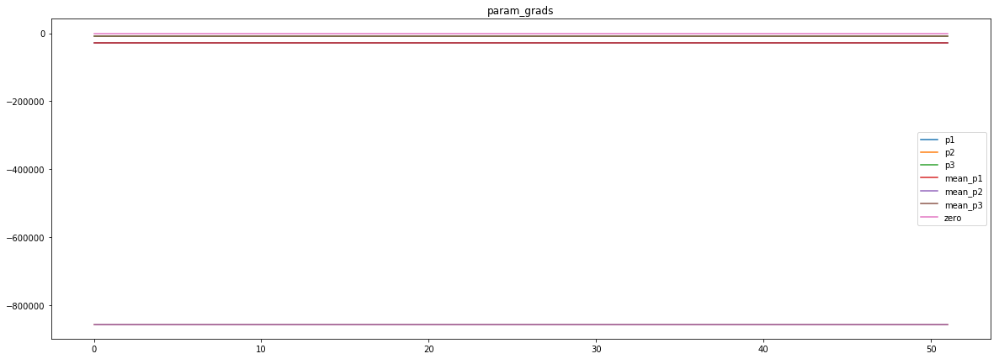

loss rate [0.0006310774872219094]
Epoch [58] 
     train_loss[6593.8057215763965] 
     eval_train[0.21789694423429093] 
     eval_test[0.22064764027229763]


aux preds: 0.44761329889297485           0.9977090358734131           9.964807510375977
main loss 0.0
aux loss 387.5779841496394
jord loss 6361.934734637921
combined loss 6749.5127187875605 


Parameter containing:
tensor([[0.4476, 0.9977, 9.9648]], requires_grad=True)


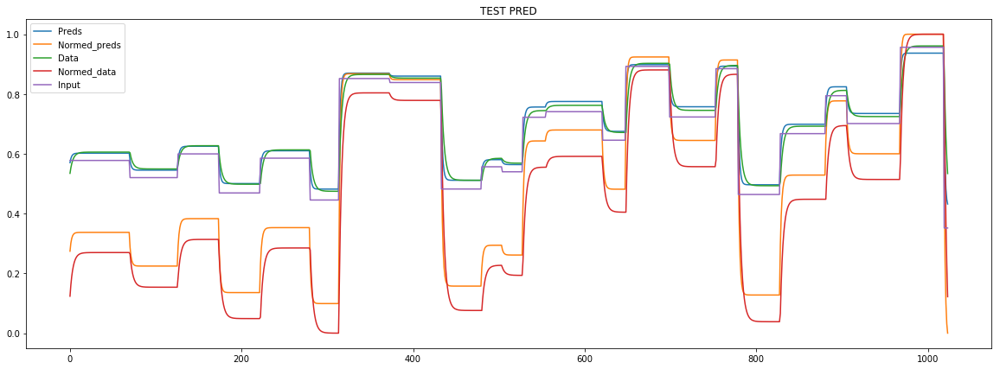

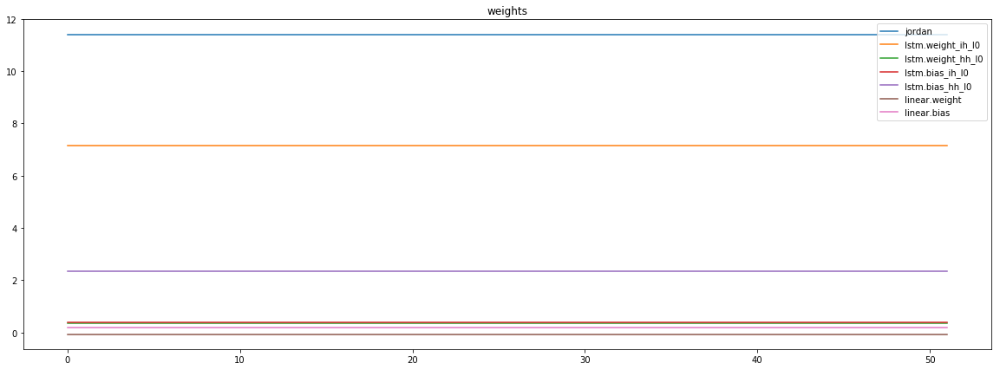

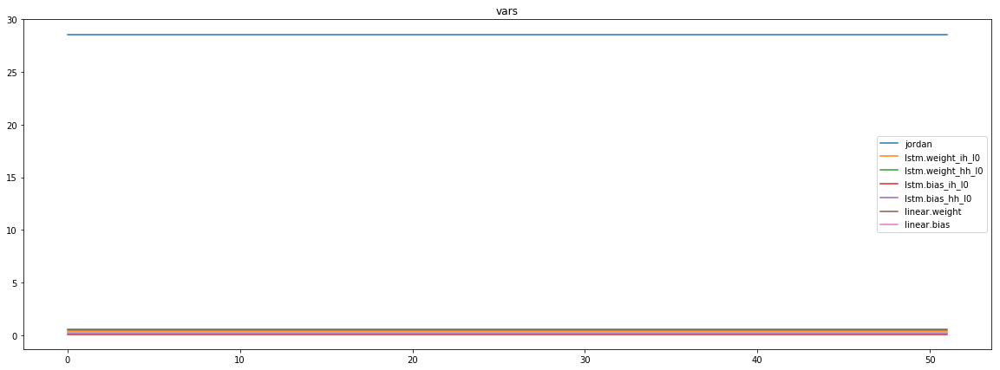

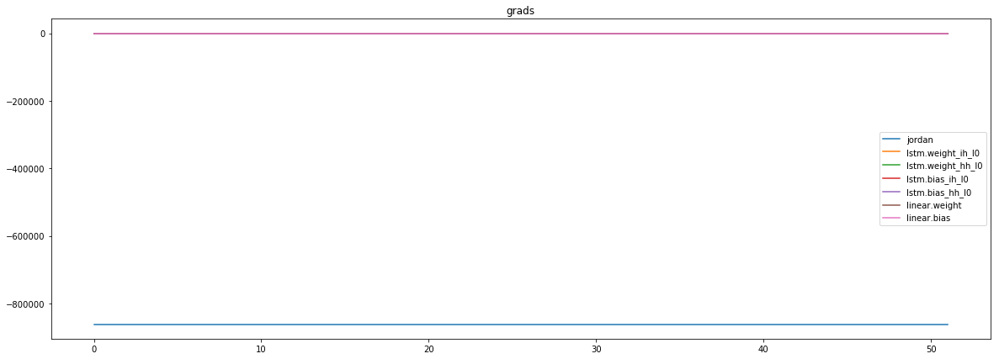

mean_p1 : 14871.62890625
mean_p2 : -867592.125
mean_p3 : -8726.306640625


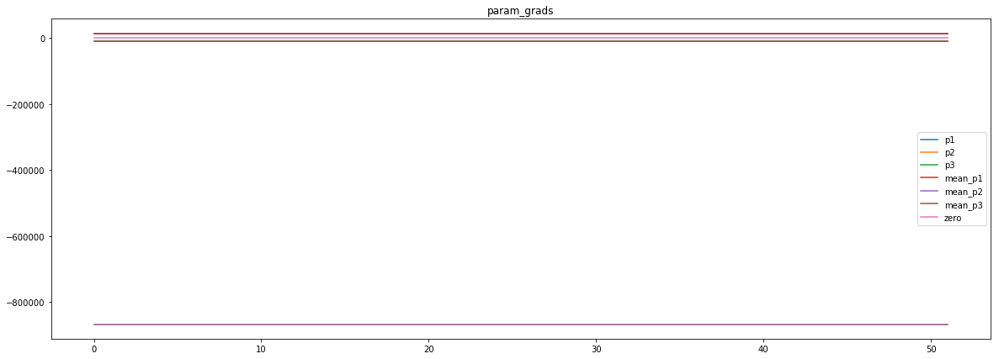

loss rate [-0.0007578423097303055]
Epoch [59] 
     train_loss[6749.5127187875605] 
     eval_train[0.2183588378023929] 
     eval_test[0.2208841569637033]


aux preds: 0.4467335641384125           1.0015819072723389           9.965217590332031
main loss 0.0
aux loss 385.7184800368089
jord loss 6141.366314227765
combined loss 6527.084794264573 


Parameter containing:
tensor([[0.4467, 1.0016, 9.9652]], requires_grad=True)


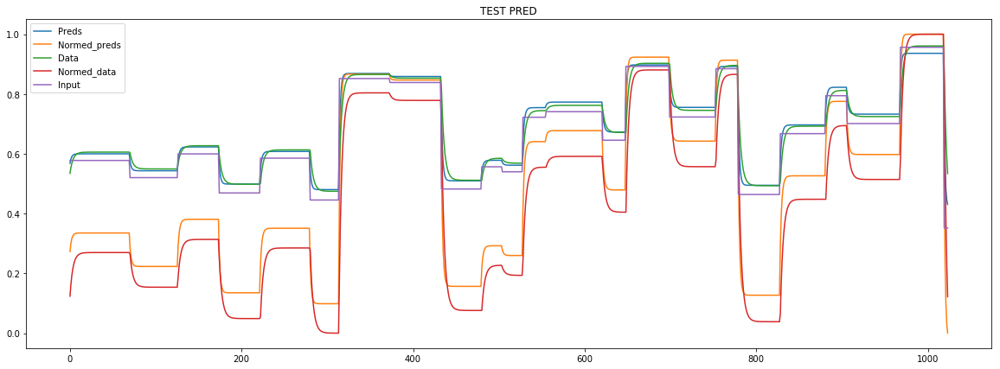

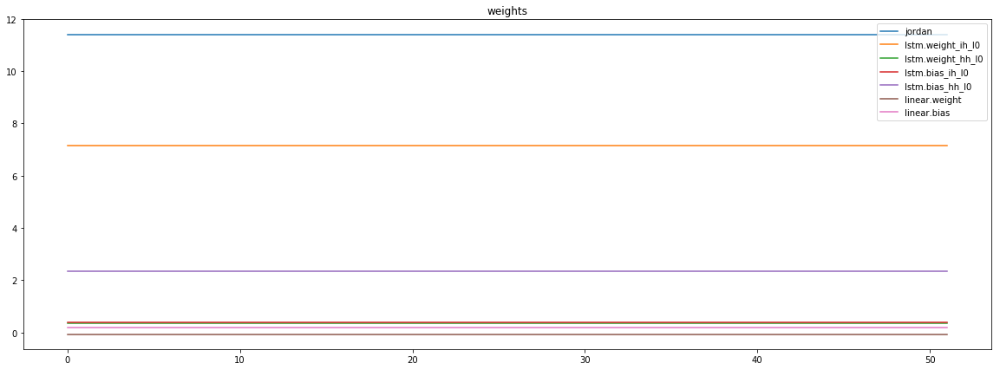

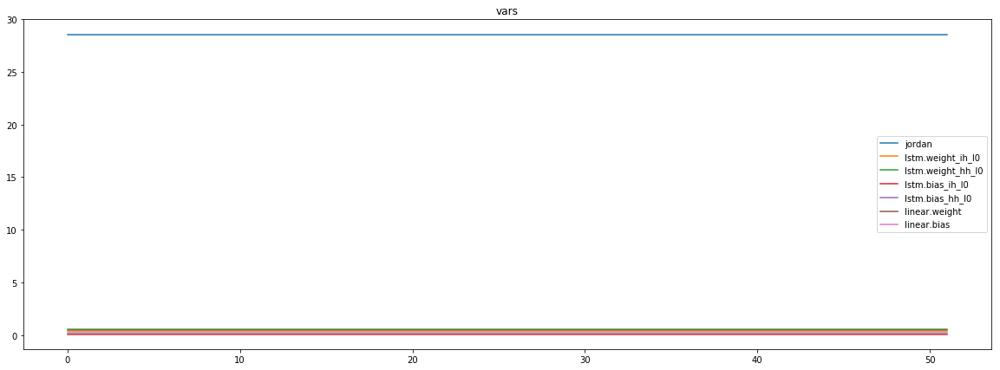

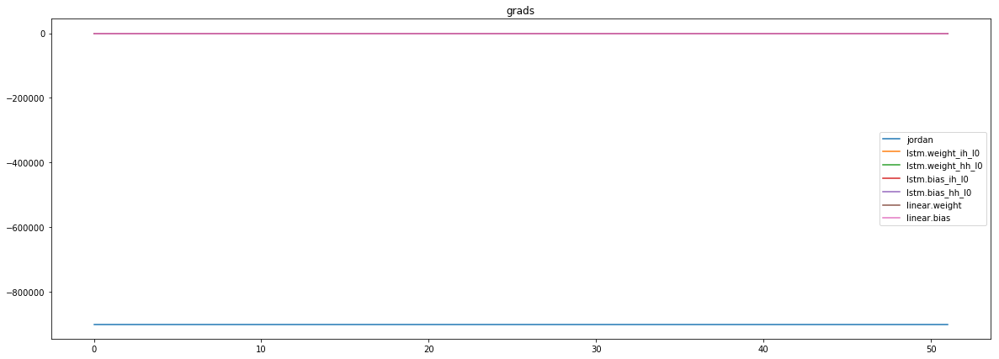

mean_p1 : -30189.23046875
mean_p2 : -862158.3125
mean_p3 : -8573.21484375


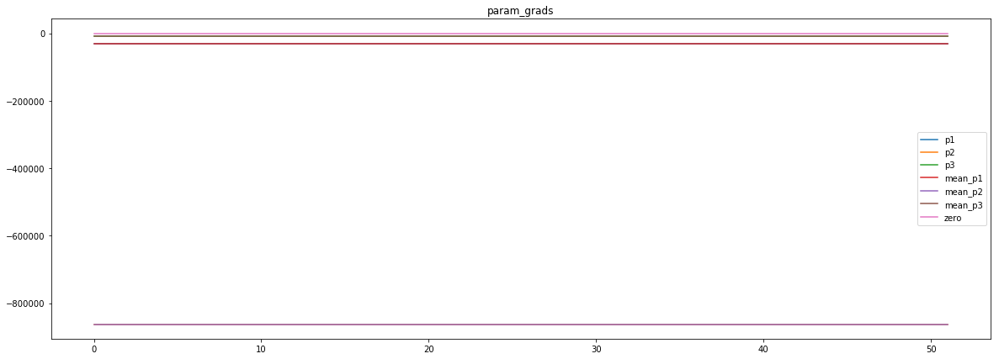

loss rate [0.0007168436914722909]
Epoch [60] 
     train_loss[6527.084794264573] 
     eval_train[0.2179723748973069] 
     eval_test[0.2206146974031898]


aux preds: 0.4509055018424988           0.9977903962135315           9.964611053466797
main loss 0.0
aux loss 386.49500626784106
jord loss 6090.675767164964
combined loss 6477.170773432805 


Parameter containing:
tensor([[0.4509, 0.9978, 9.9646]], requires_grad=True)


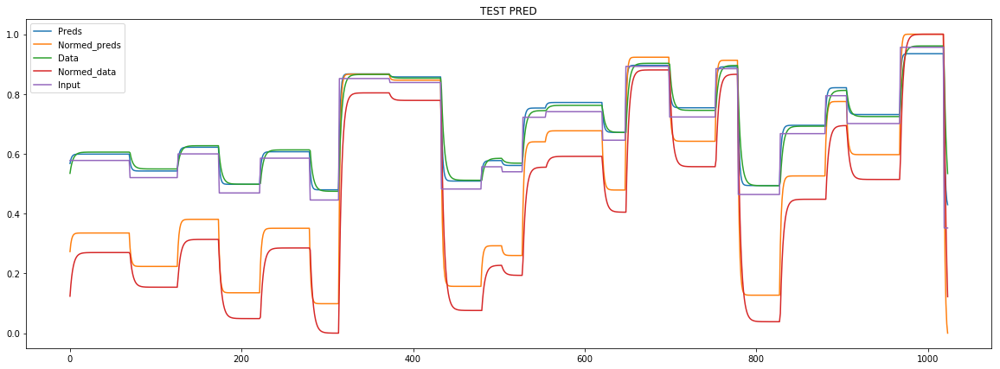

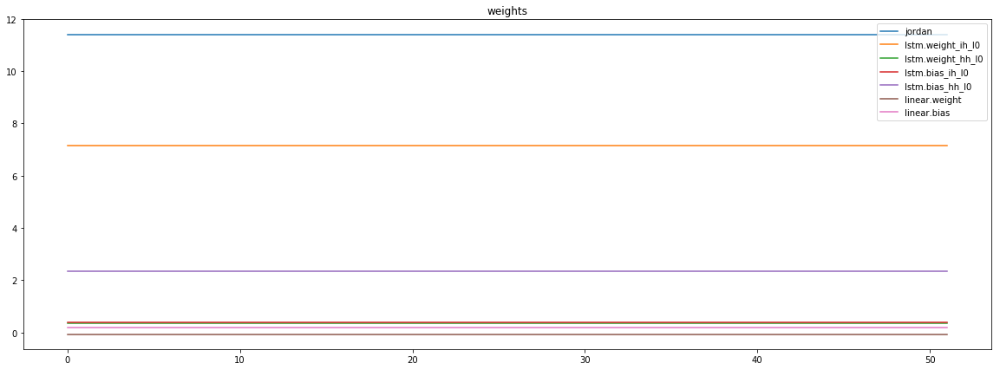

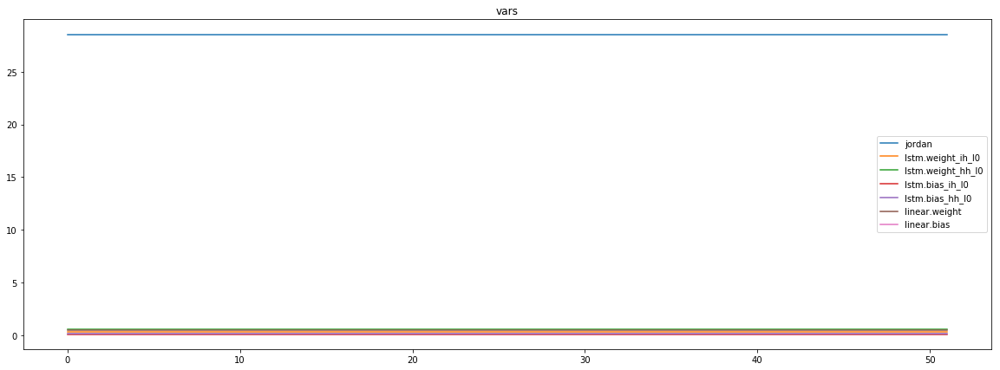

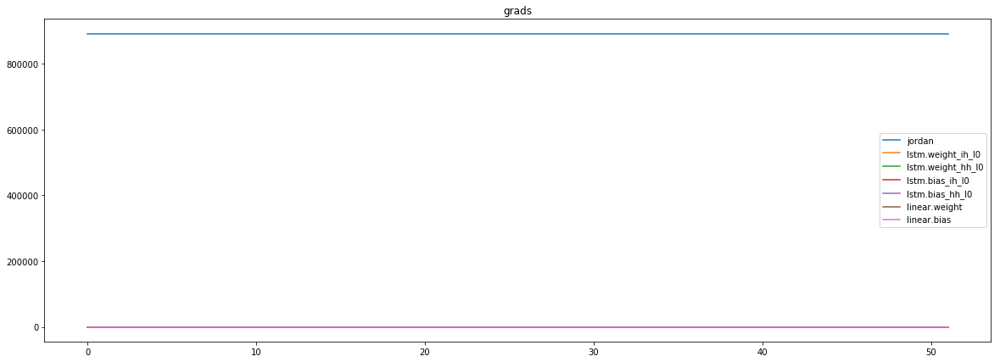

mean_p1 : -27659.12109375
mean_p2 : 910207.8125
mean_p3 : 9149.748046875


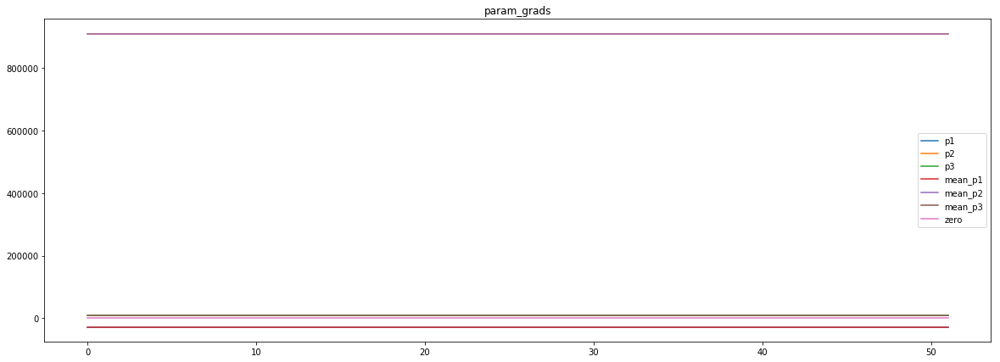

loss rate [0.0009266221826653709]
Epoch [61] 
     train_loss[6477.170773432805] 
     eval_train[0.2178183655039622] 
     eval_test[0.22051097833636132]


aux preds: 0.45053890347480774           1.0019211769104004           9.969833374023438
main loss 0.0
aux loss 385.1871467003456
jord loss 6034.15629695012
combined loss 6419.343443650466 


Parameter containing:
tensor([[0.4505, 1.0019, 9.9698]], requires_grad=True)


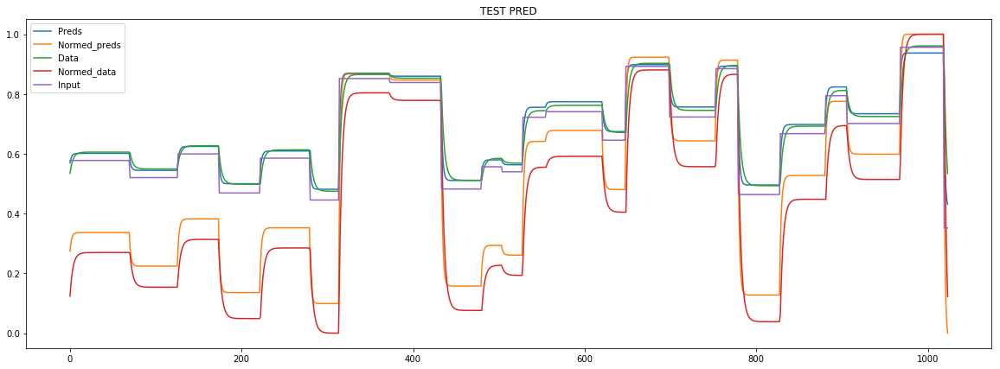

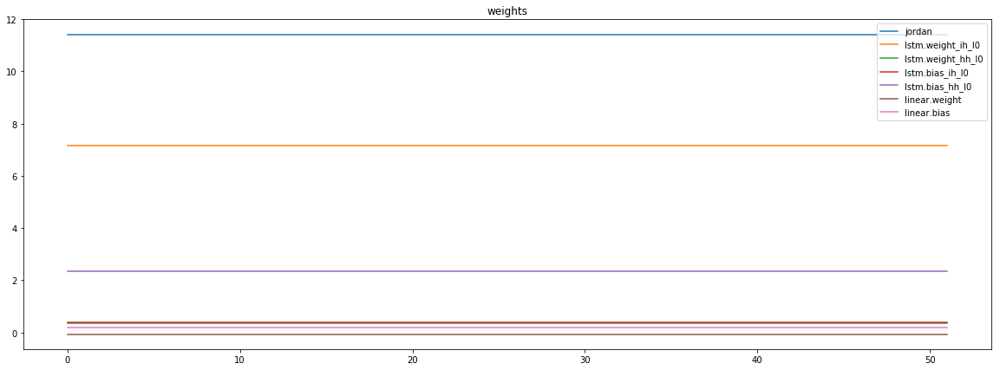

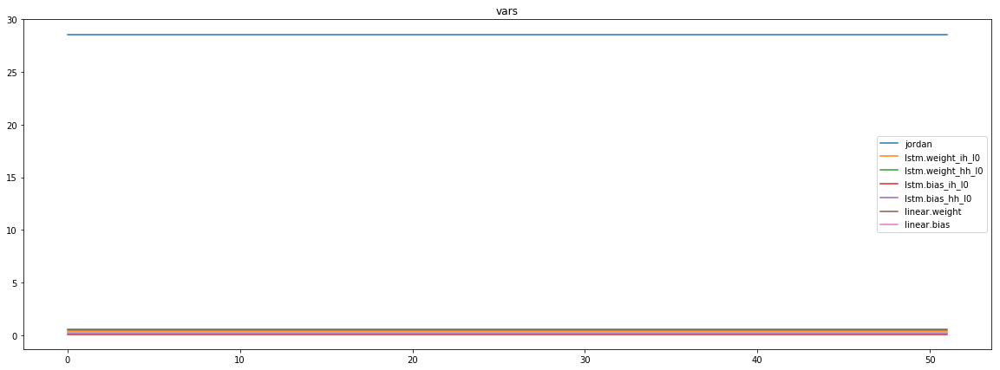

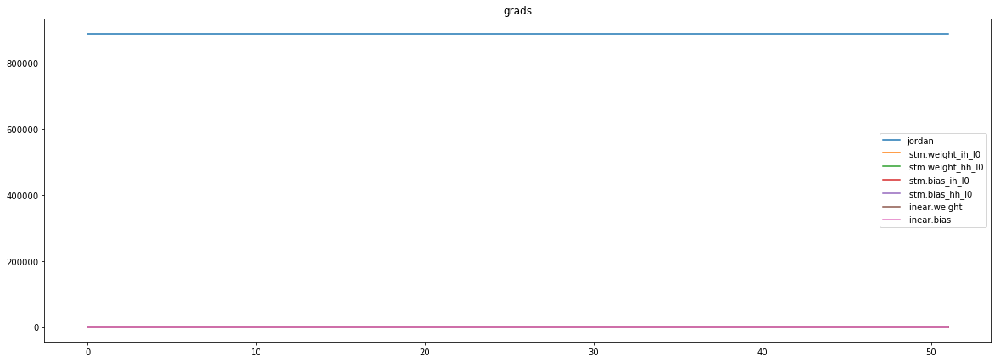

mean_p1 : -29403.8515625
mean_p2 : 910266.875
mean_p3 : 9144.666015625


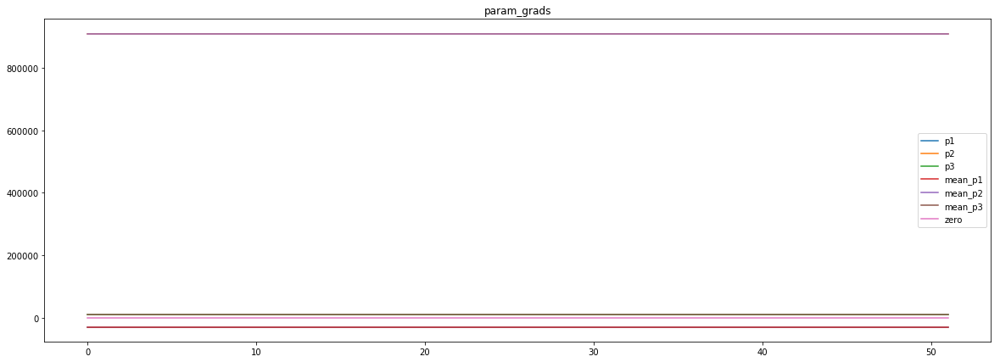

loss rate [1.1453358195190333e-06]
Epoch [62] 
     train_loss[6419.343443650466] 
     eval_train[0.21809866913379383] 
     eval_test[0.2206696914932267]


aux preds: 0.4474014937877655           1.000275731086731           9.96776008605957
main loss 0.0
aux loss 385.1540509737455
jord loss 6417.685795710637
combined loss 6802.839846684382 


Parameter containing:
tensor([[0.4474, 1.0003, 9.9678]], requires_grad=True)


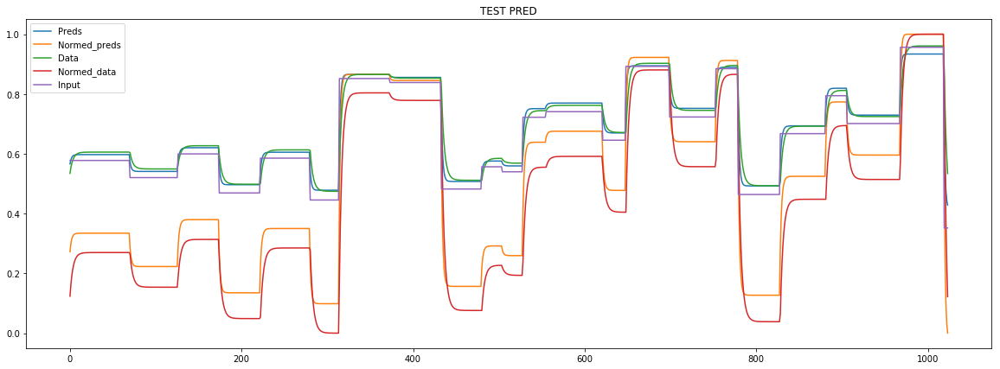

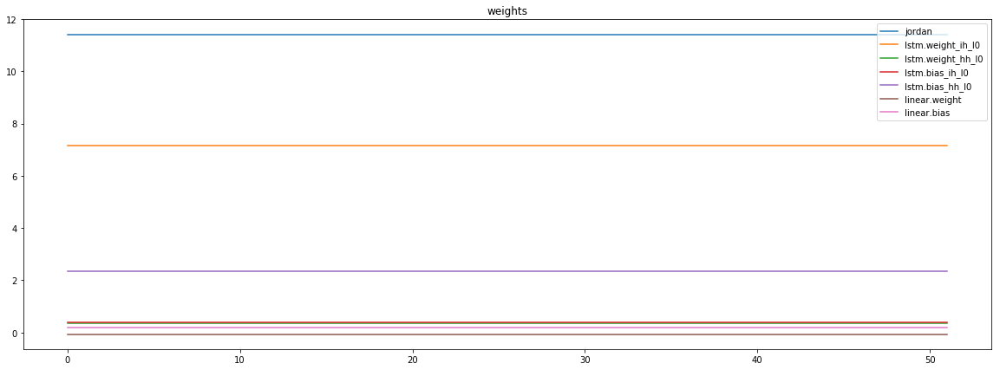

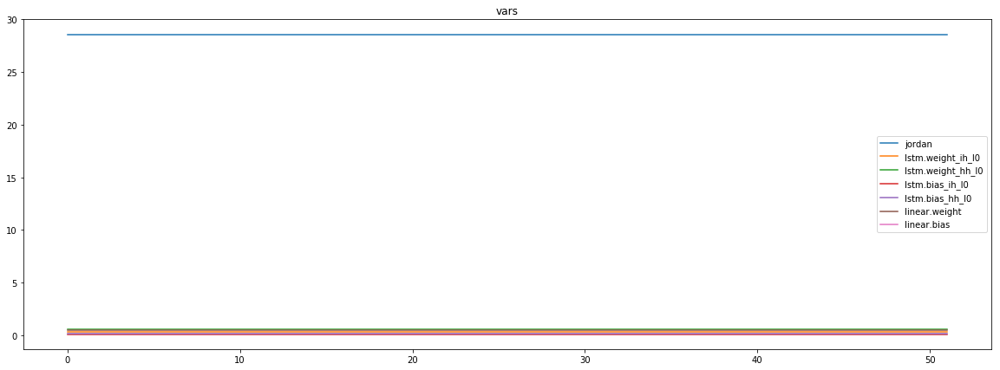

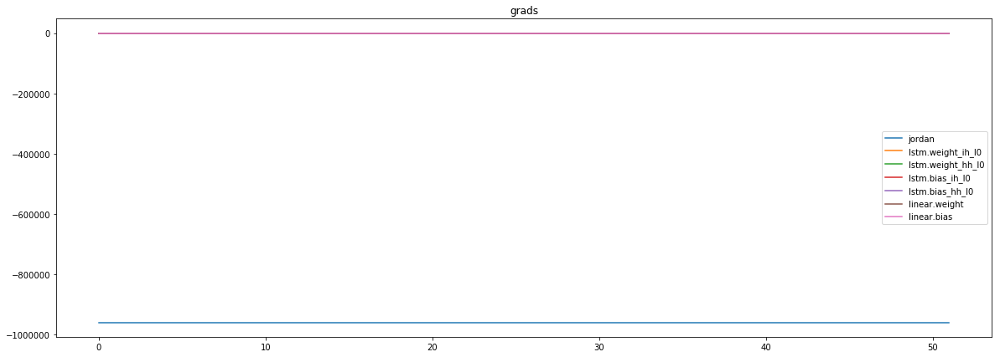

mean_p1 : -81879.3203125
mean_p2 : -868237.0625
mean_p3 : -8556.958984375


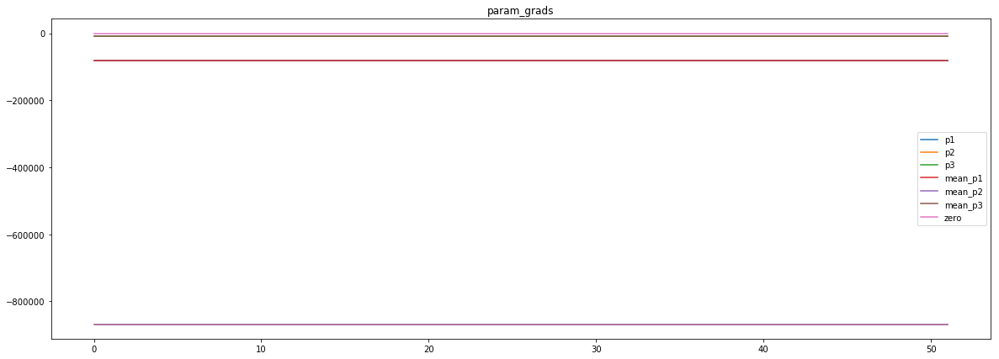

loss rate [0.0005911075320503834]
Epoch [63] 
     train_loss[6802.839846684382] 
     eval_train[0.2176572450687392] 
     eval_test[0.22046805833551017]


aux preds: 0.44700124859809875           1.001078486442566           9.971122741699219
main loss 0.0
aux loss 383.71846477801984
jord loss 6284.334453876202
combined loss 6668.052918654222 


Parameter containing:
tensor([[0.4470, 1.0011, 9.9711]], requires_grad=True)


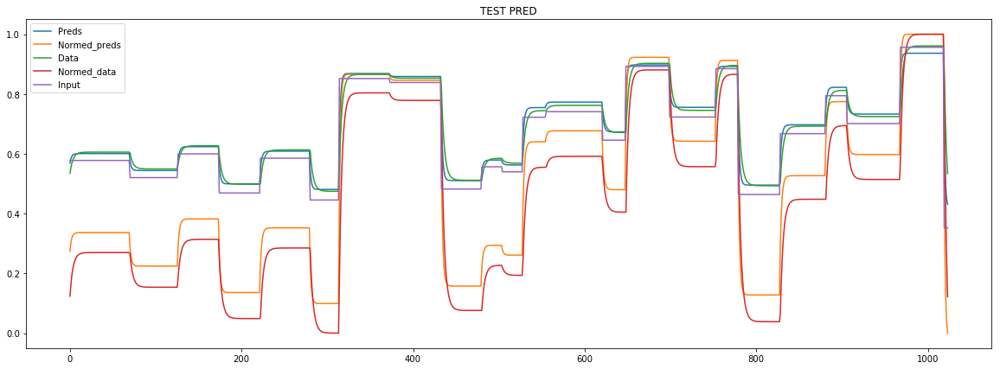

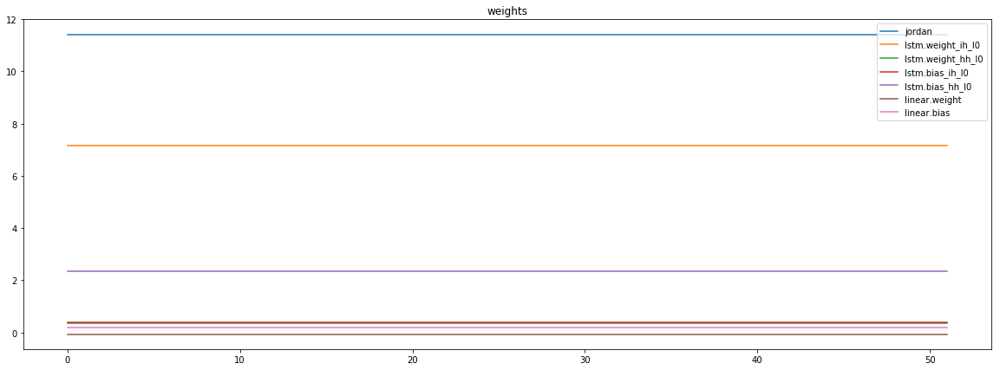

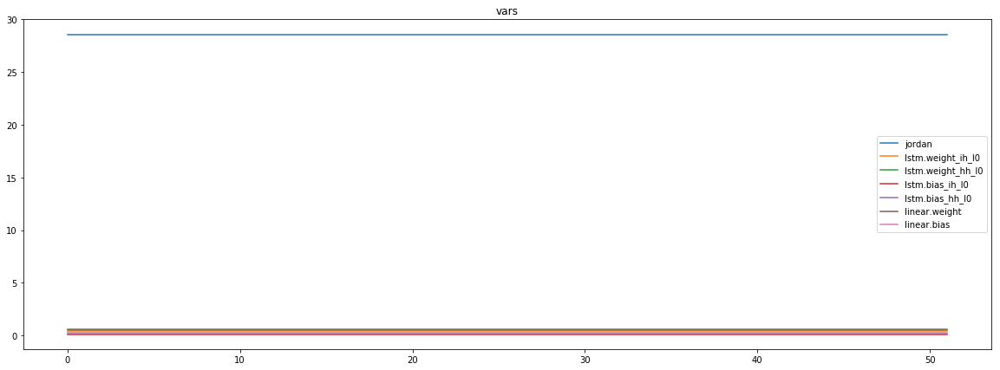

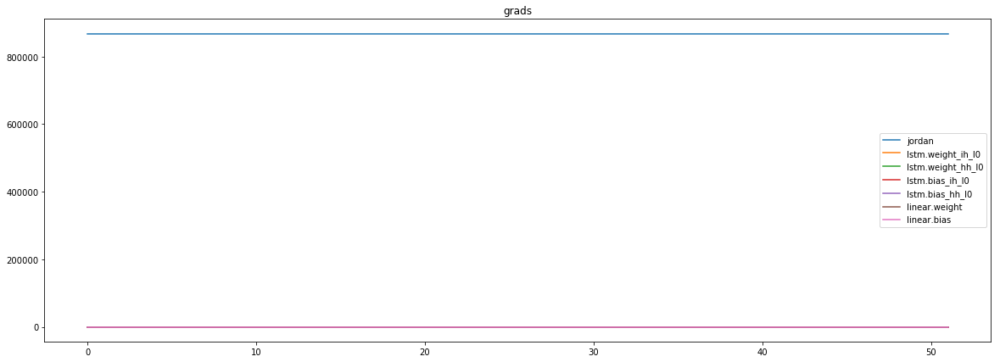

mean_p1 : -40207.68359375
mean_p2 : 899365.5
mean_p3 : 9009.5029296875


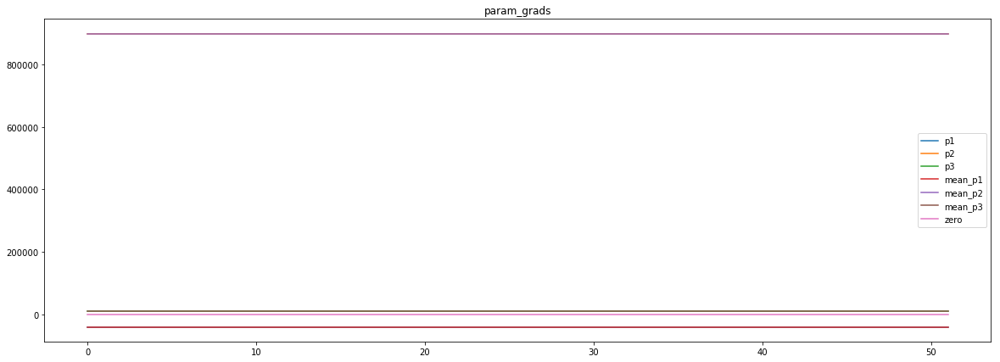

loss rate [0.00030598071047205355]
Epoch [64] 
     train_loss[6668.052918654222] 
     eval_train[0.21785868498353428] 
     eval_test[0.22048209213905712]


aux preds: 0.4509443938732147           0.9995722770690918           9.97037410736084
main loss 0.0
aux loss 385.71277383657605
jord loss 6509.552217923678
combined loss 6895.264991760254 


Parameter containing:
tensor([[0.4509, 0.9996, 9.9704]], requires_grad=True)


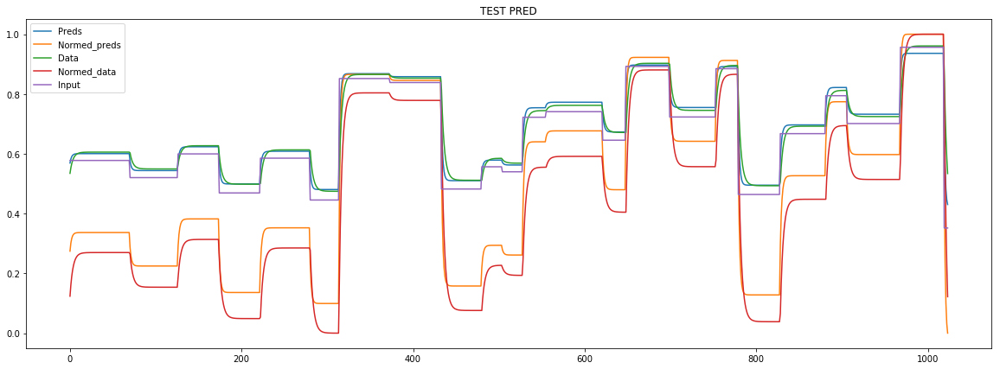

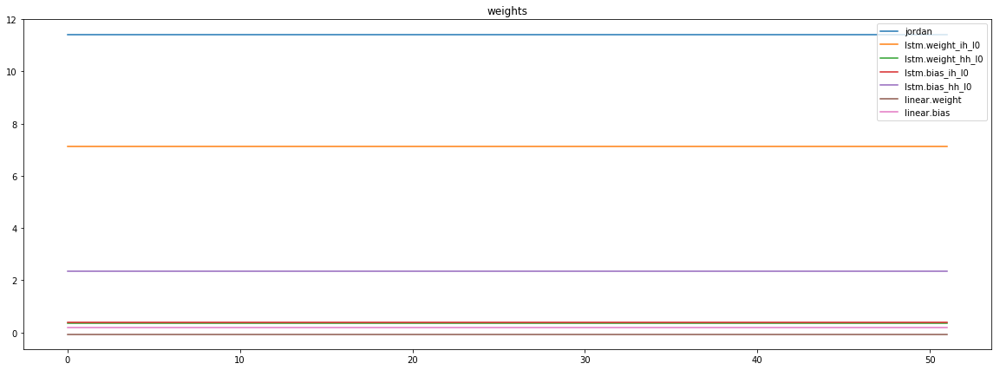

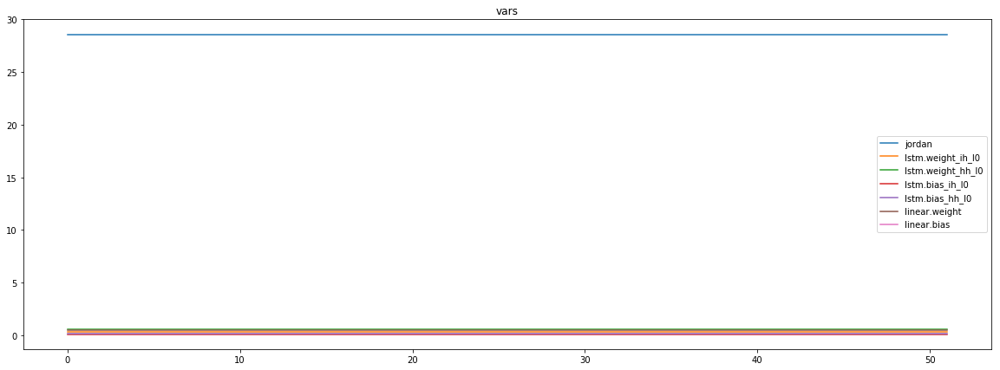

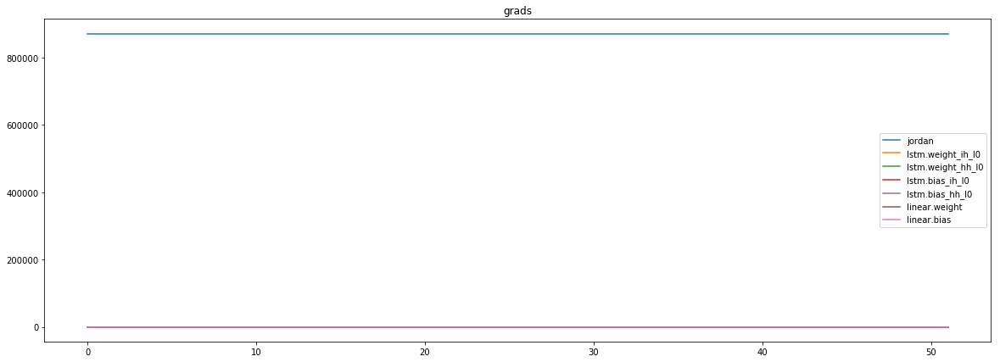

mean_p1 : 7089.712890625
mean_p2 : 855038.75
mean_p3 : 8661.759765625


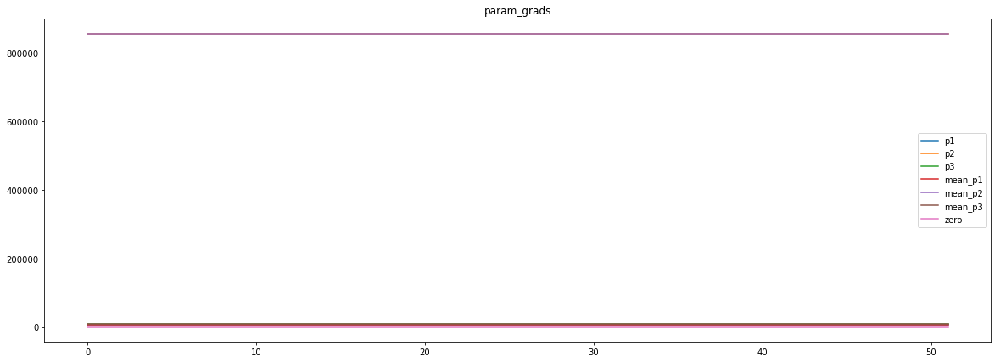

loss rate [0.0005971029855762477]
Epoch [65] 
     train_loss[6895.264991760254] 
     eval_train[0.21775946180479455] 
     eval_test[0.22040826226161284]


aux preds: 0.44986745715141296           0.9980427026748657           9.966025352478027
main loss 0.0
aux loss 384.5772534883939
jord loss 6472.31626539964
combined loss 6856.893518888033 


Parameter containing:
tensor([[0.4499, 0.9980, 9.9660]], requires_grad=True)


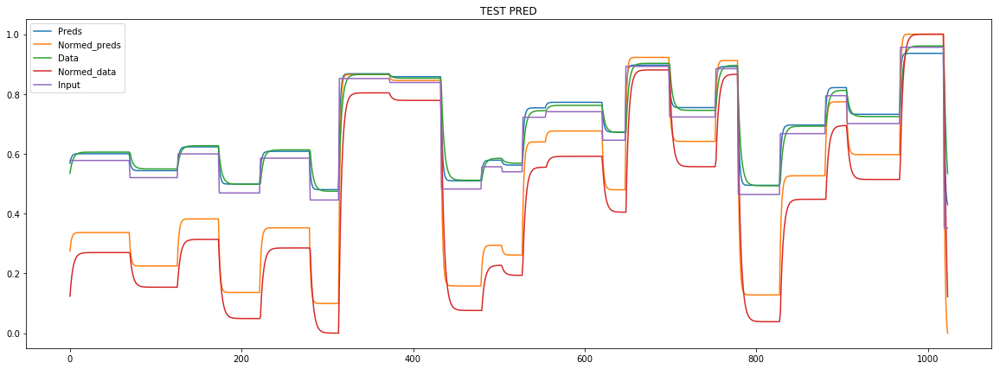

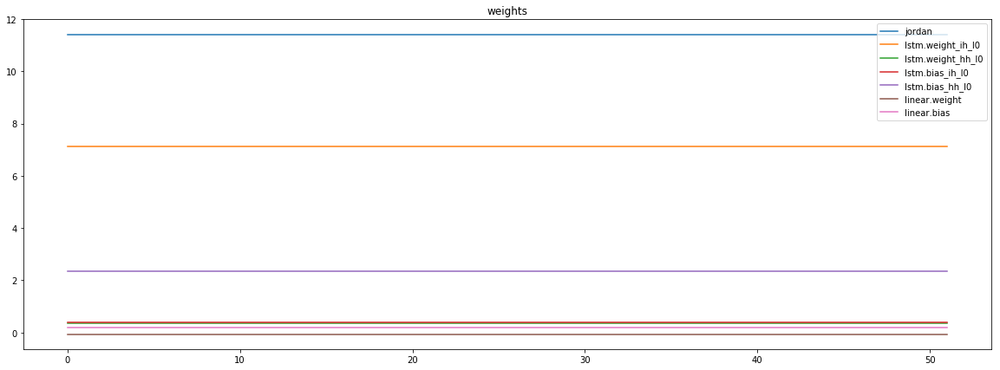

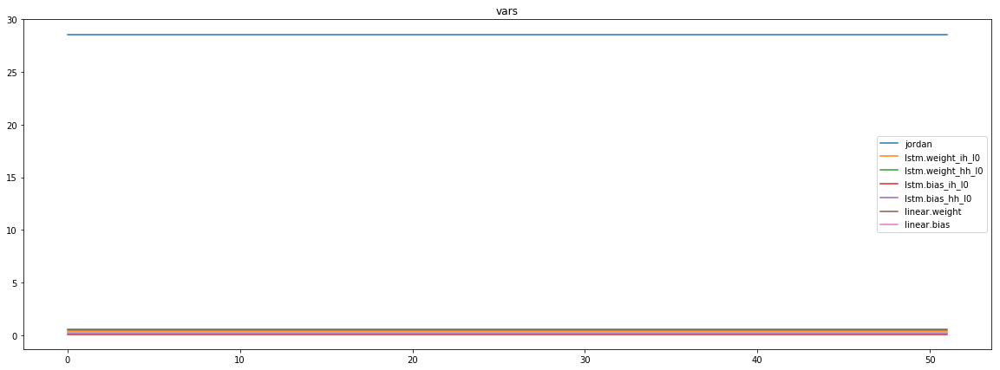

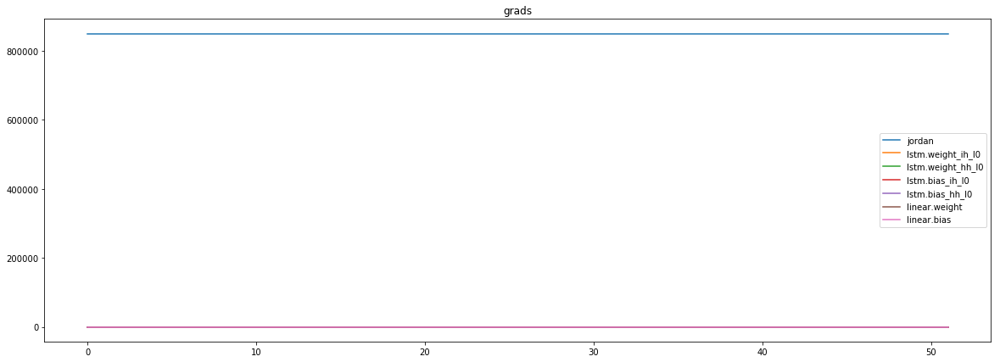

mean_p1 : 33815.8125
mean_p2 : 807451.625
mean_p3 : 8258.4033203125


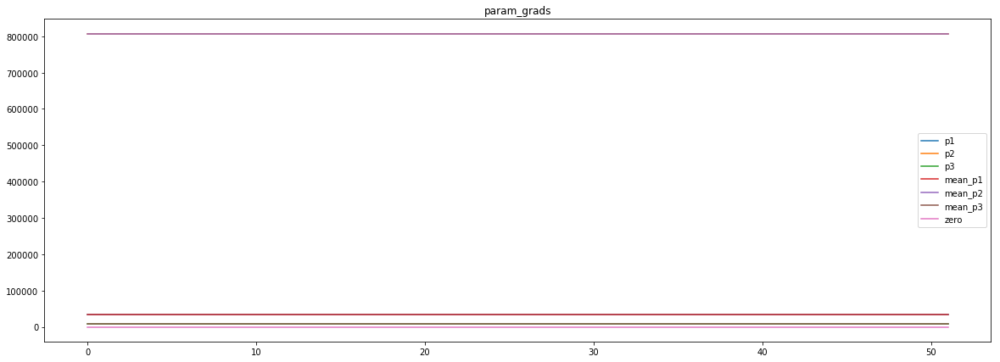

loss rate [0.000524701297455743]
Epoch [66] 
     train_loss[6856.893518888033] 
     eval_train[0.21766404583691976] 
     eval_test[0.22033713237297806]


aux preds: 0.44765105843544006           0.9998676180839539           9.973200798034668
main loss 0.0
aux loss 384.5284822904147
jord loss 6528.966472919171
combined loss 6913.494955209586 


Parameter containing:
tensor([[0.4477, 0.9999, 9.9732]], requires_grad=True)


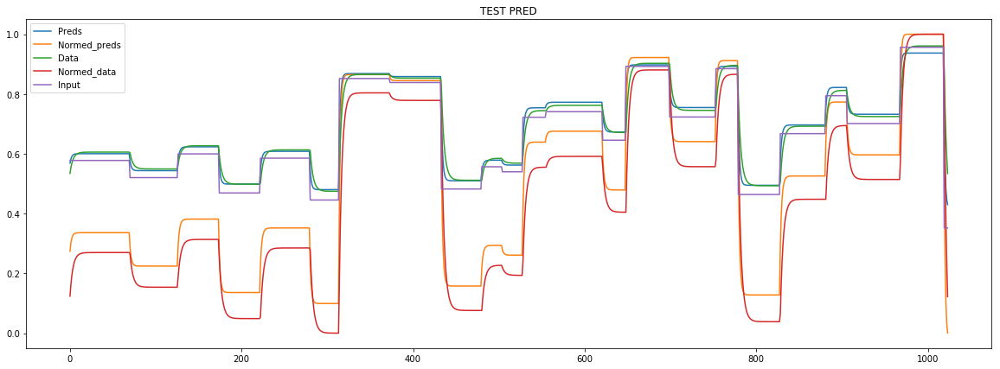

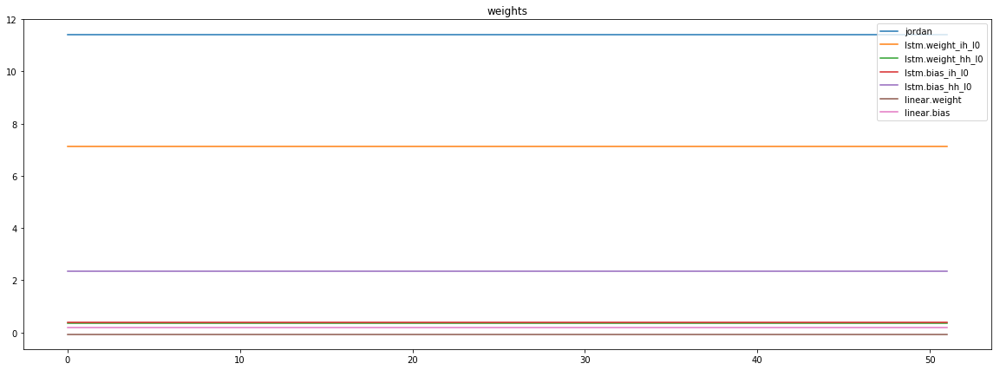

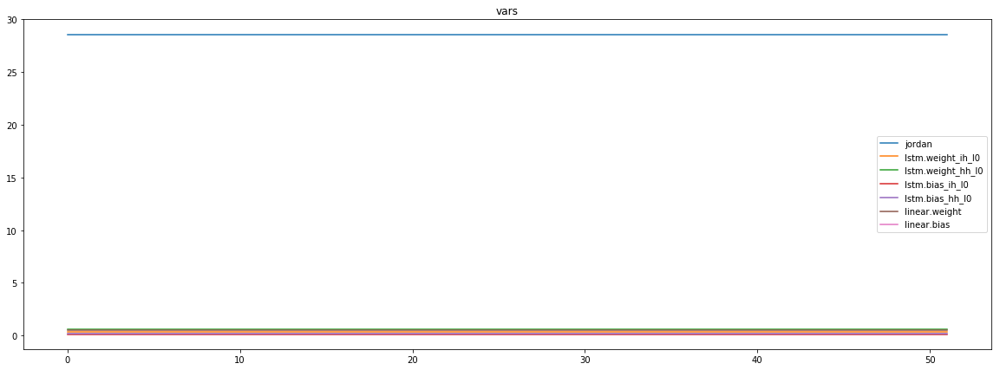

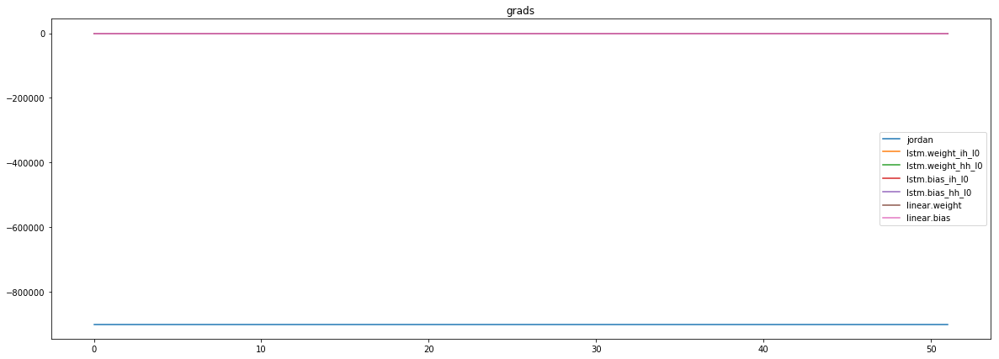

mean_p1 : -15895.8779296875
mean_p2 : -876098.875
mean_p3 : -8733.857421875


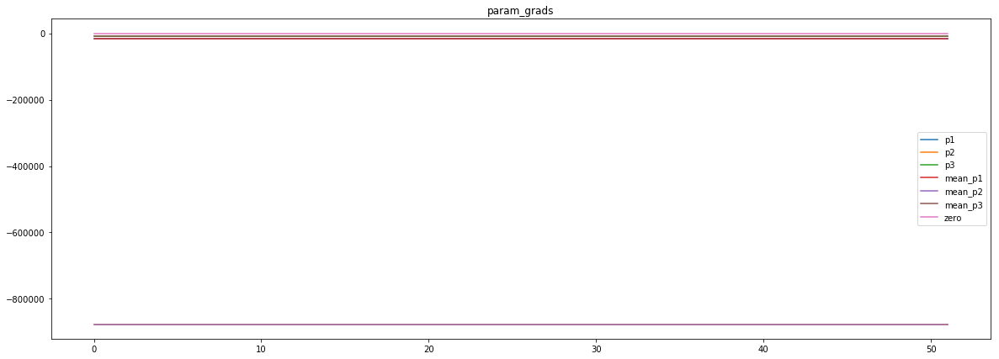

loss rate [0.000499840606372759]
Epoch [67] 
     train_loss[6913.494955209586] 
     eval_train[0.21763629091975206] 
     eval_test[0.22029899280856957]


aux preds: 0.4477197527885437           0.999890923500061           9.970940589904785
main loss 0.0
aux loss 380.7542167076698
jord loss 6682.977379432092
combined loss 7063.731596139762 


Parameter containing:
tensor([[0.4477, 0.9999, 9.9709]], requires_grad=True)


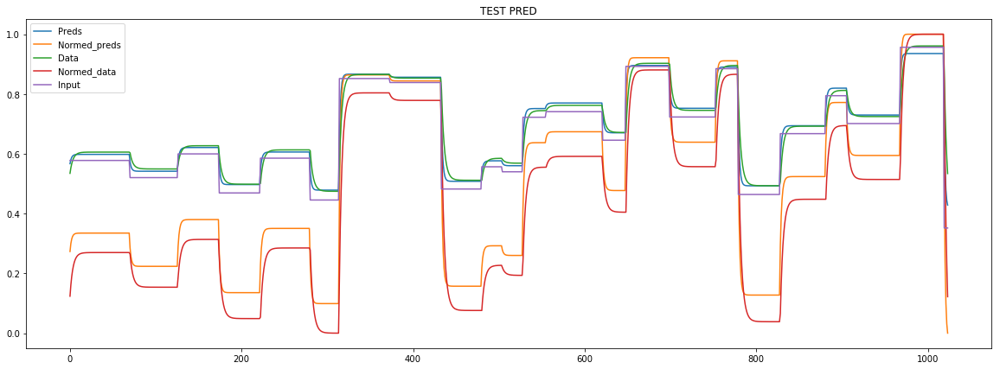

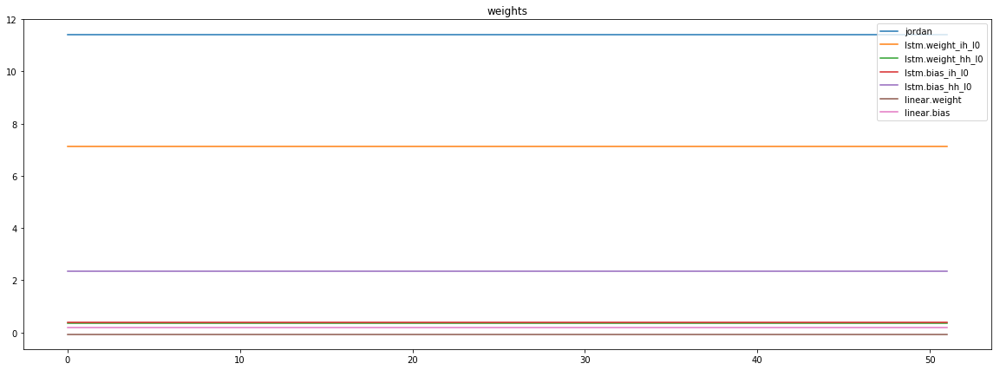

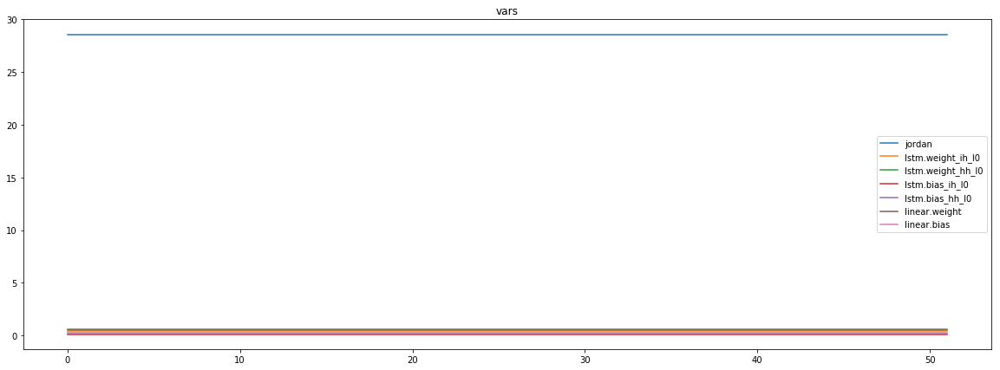

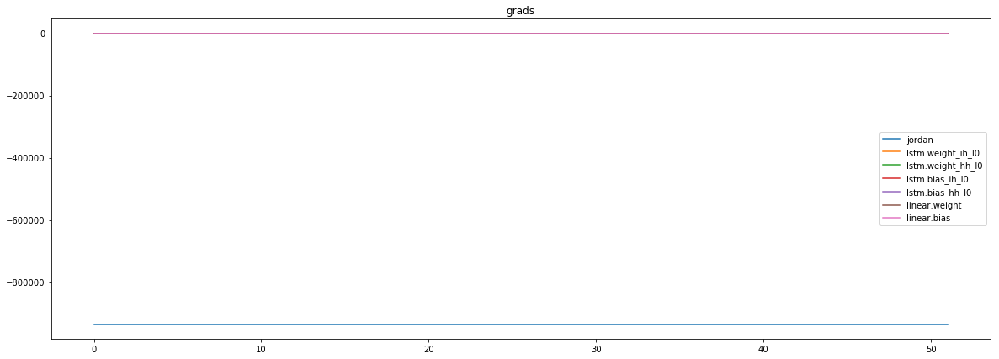

mean_p1 : -44663.08203125
mean_p2 : -881570.625
mean_p3 : -8737.4375


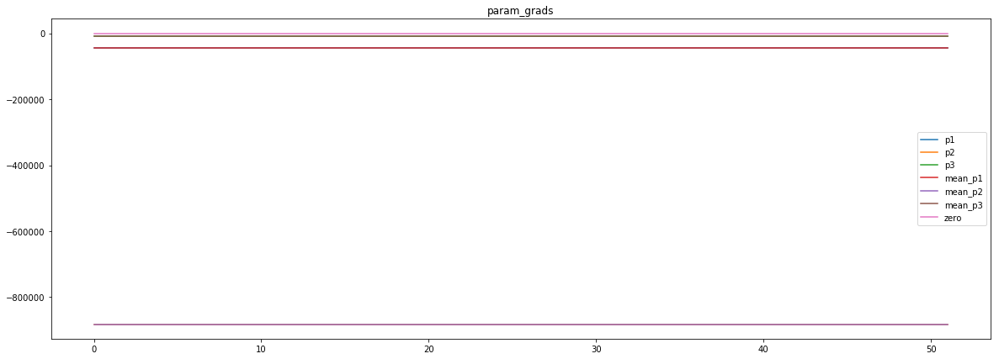

loss rate [0.0007094263664418898]
Epoch [68] 
     train_loss[7063.731596139762] 
     eval_train[0.21741300918018586] 
     eval_test[0.2201918083751066]


aux preds: 0.44848135113716125           1.0008834600448608           9.974404335021973
main loss 0.0
aux loss 380.79723182091345
jord loss 6348.491525503306
combined loss 6729.288757324219 


Parameter containing:
tensor([[0.4485, 1.0009, 9.9744]], requires_grad=True)


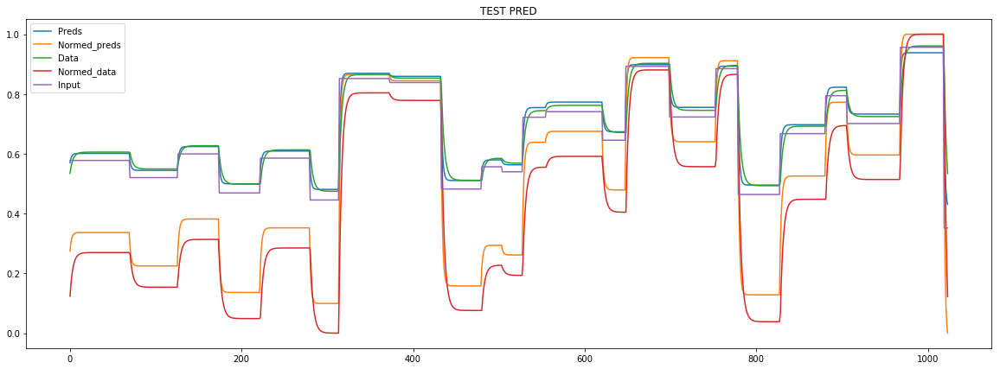

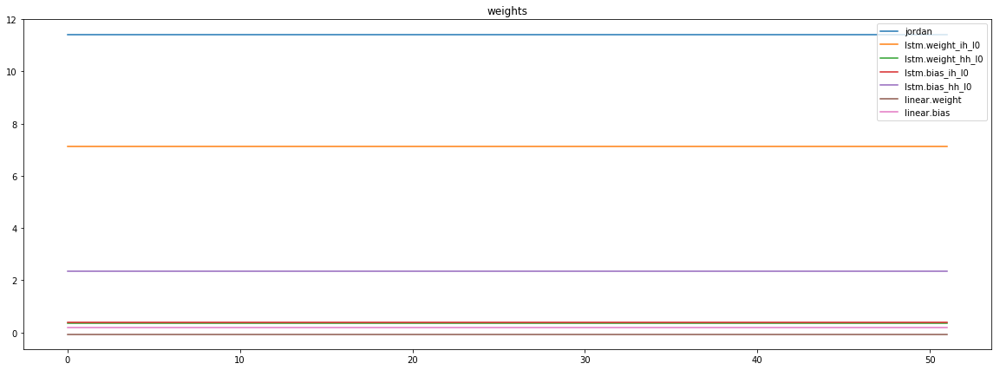

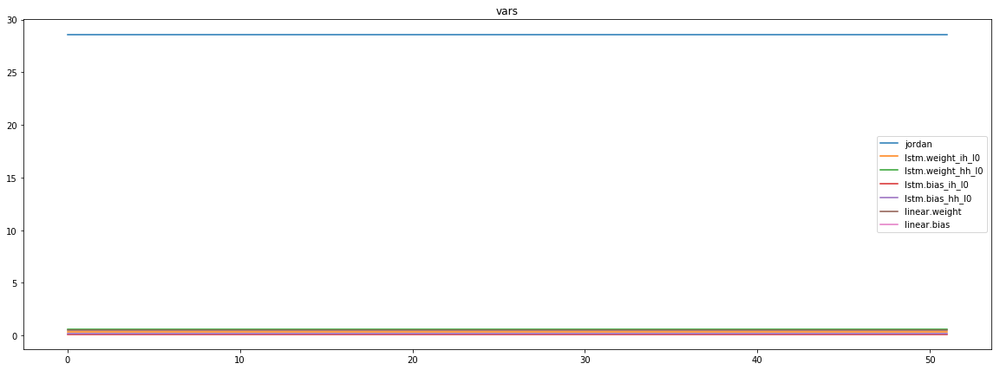

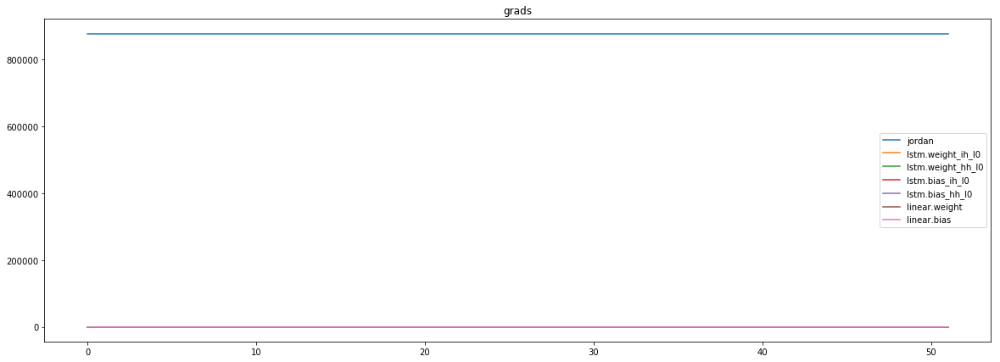

mean_p1 : -33875.265625
mean_p2 : 902203.375
mean_p3 : 9052.8310546875


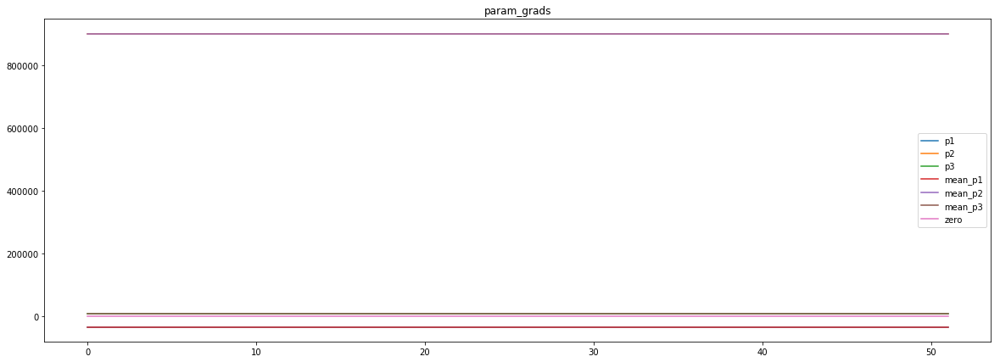

loss rate [-1.9803797359330133e-05]
Epoch [69] 
     train_loss[6729.288757324219] 
     eval_train[0.21766594000375614] 
     eval_test[0.22028034015304662]


aux preds: 0.4499397277832031           0.9989089965820312           9.970401763916016
main loss 0.0
aux loss 380.55091740534857
jord loss 6133.0927499624395
combined loss 6513.643667367788 


Parameter containing:
tensor([[0.4499, 0.9989, 9.9704]], requires_grad=True)


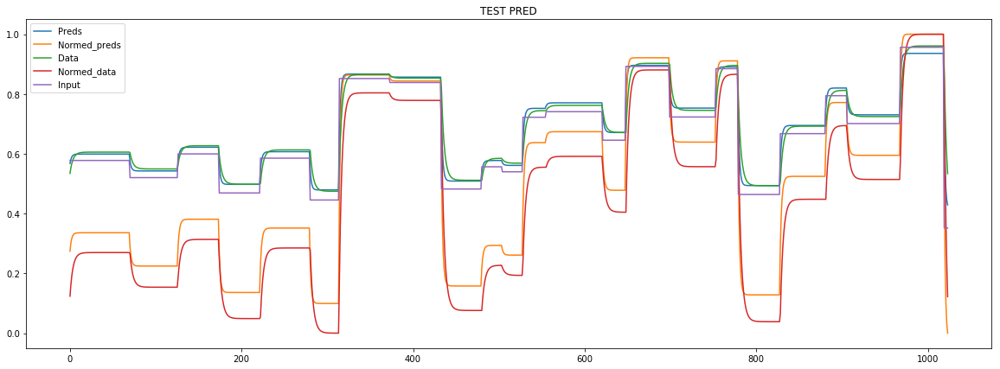

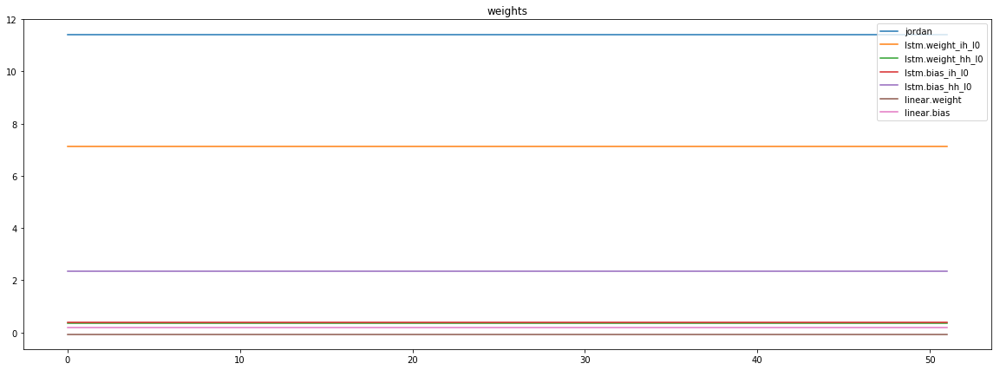

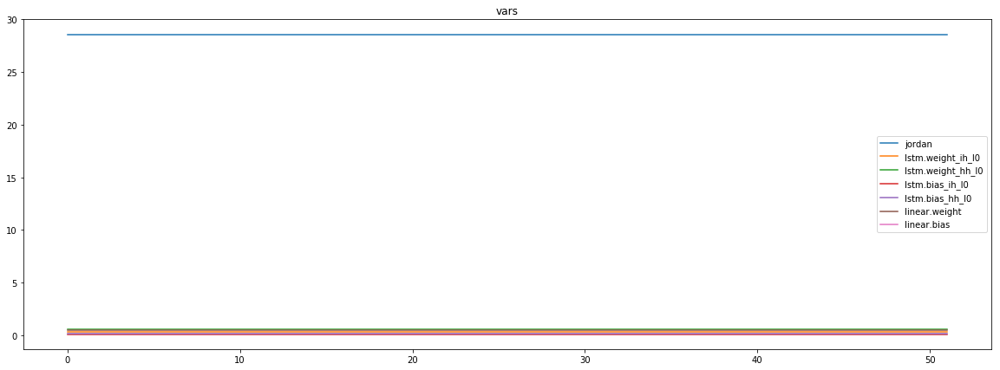

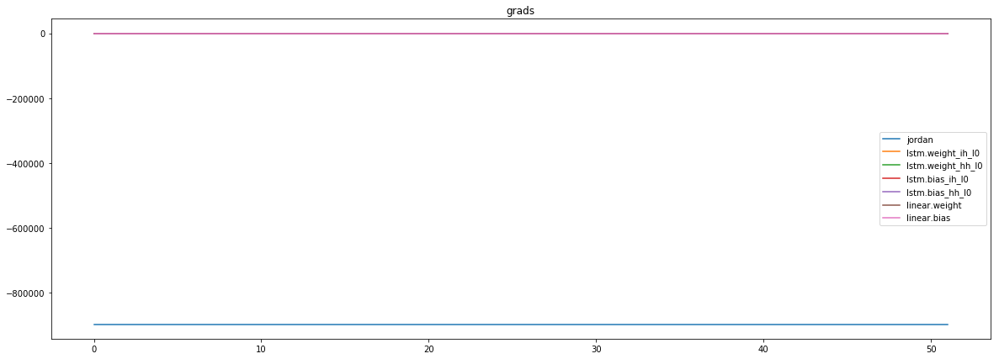

mean_p1 : -13811.421875
mean_p2 : -873713.75
mean_p3 : -8715.9423828125


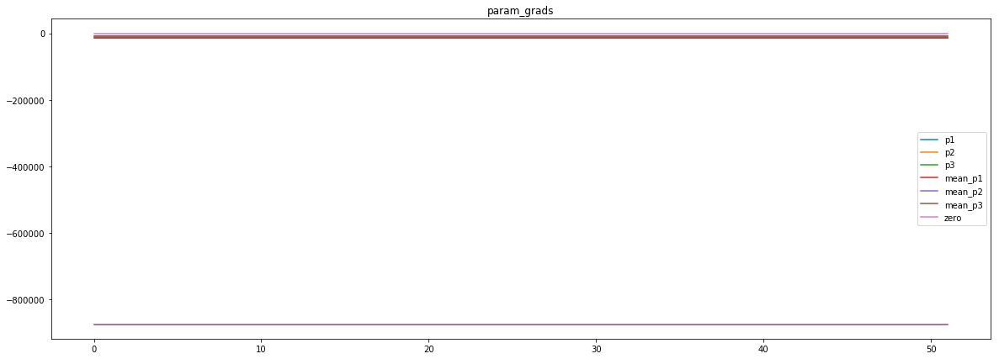

loss rate [0.0007987452103553894]
Epoch [70] 
     train_loss[6513.643667367788] 
     eval_train[0.21734890259372497] 
     eval_test[0.220081117850813]


aux preds: 0.4459126591682434           1.0007355213165283           9.970823287963867
main loss 0.0
aux loss 379.11195608285755
jord loss 6108.889446551983
combined loss 6488.001402634841 


Parameter containing:
tensor([[0.4459, 1.0007, 9.9708]], requires_grad=True)


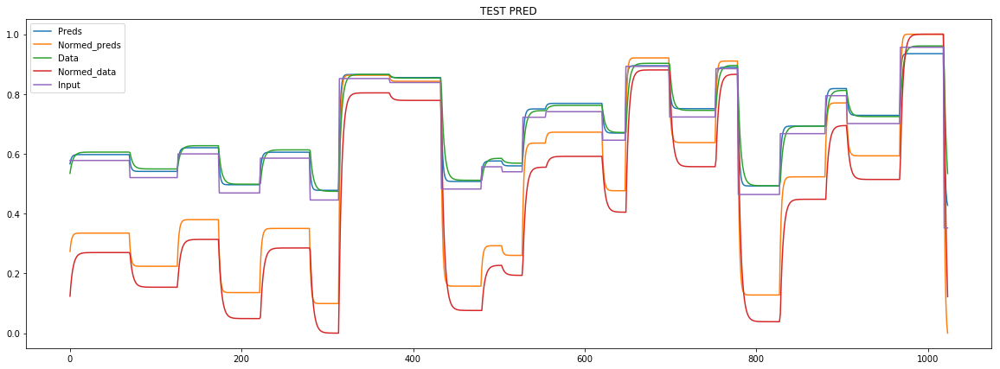

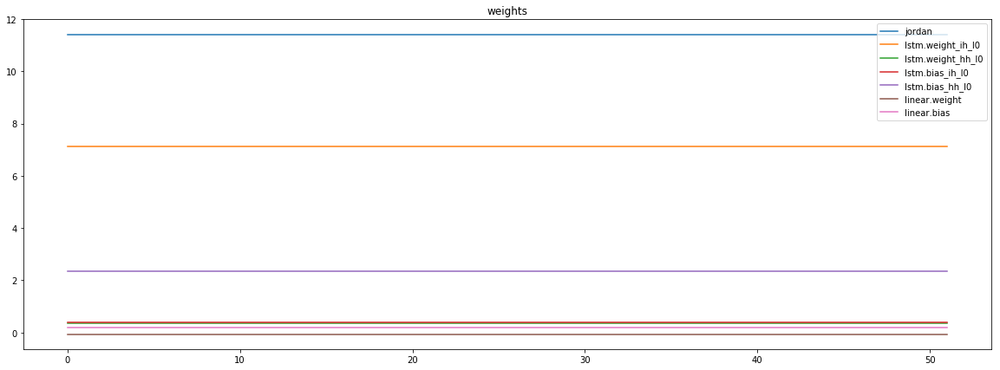

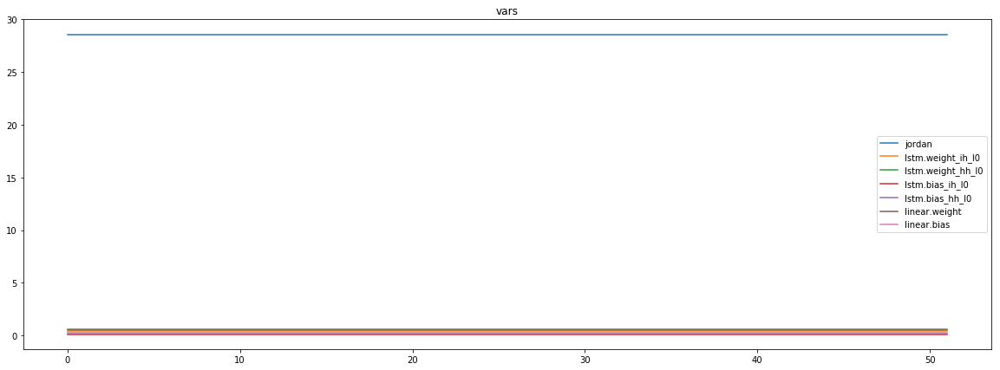

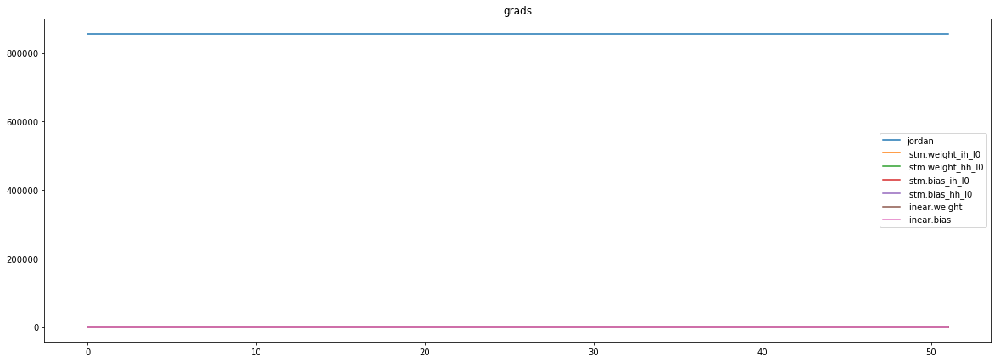

mean_p1 : 31870.81640625
mean_p2 : 816631.625
mean_p3 : 8323.185546875


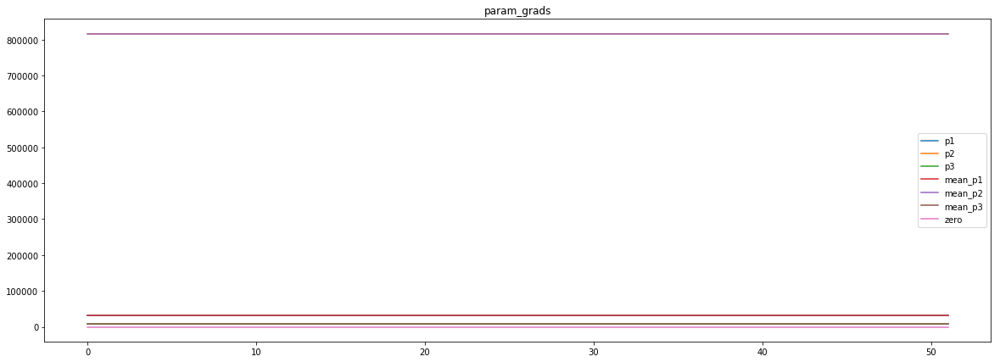

loss rate [0.000373149407921769]
Epoch [71] 
     train_loss[6488.001402634841] 
     eval_train[0.2172621329529927] 
     eval_test[0.220102260439572]


aux preds: 0.4472941756248474           0.9990888237953186           9.964847564697266
main loss 0.0
aux loss 378.63484720083386
jord loss 6480.959294245793
combined loss 6859.594141446627 


Parameter containing:
tensor([[0.4473, 0.9991, 9.9648]], requires_grad=True)


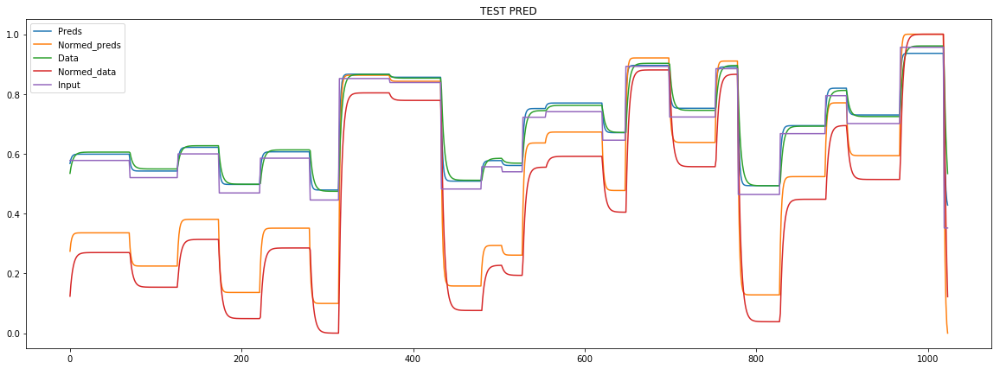

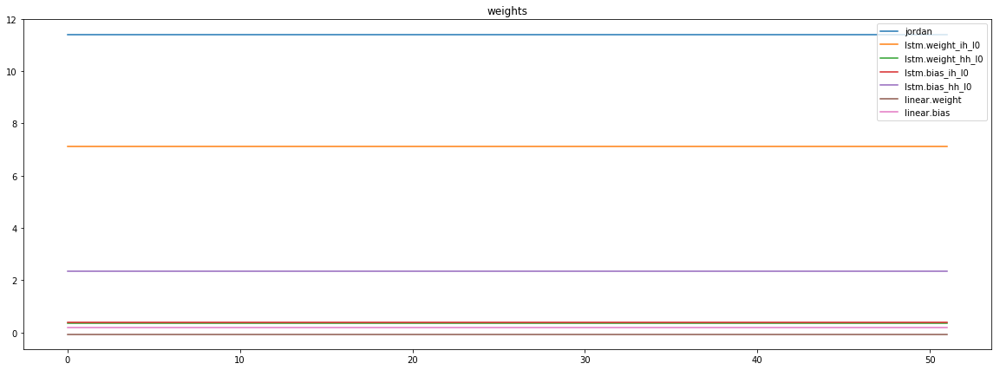

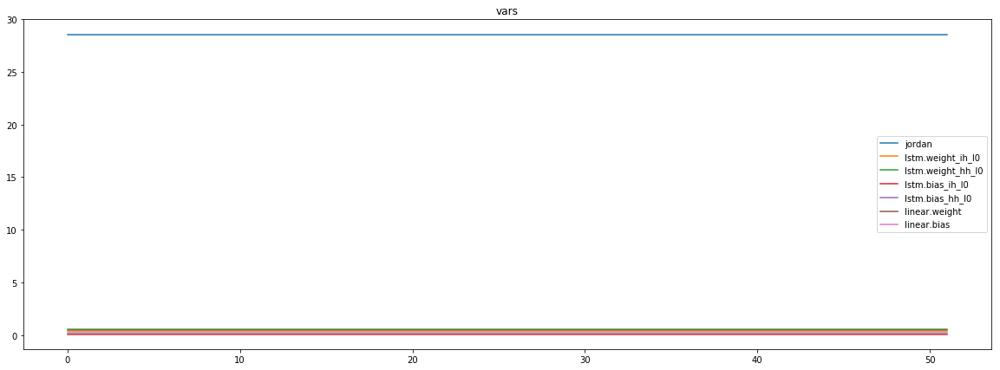

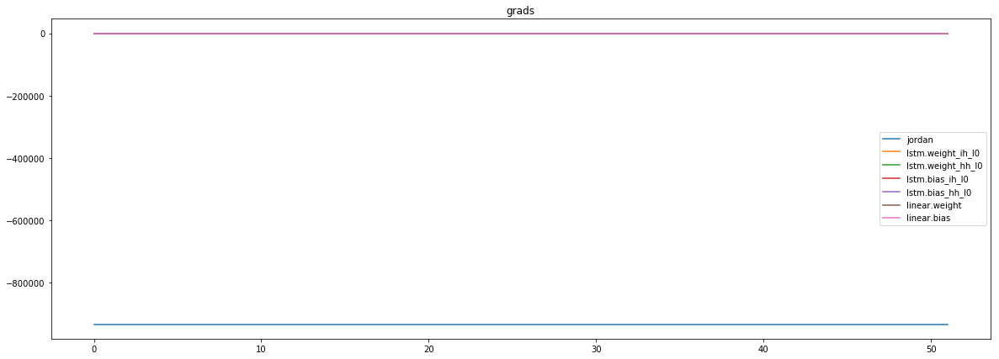

mean_p1 : -28905.505859375
mean_p2 : -896742.625
mean_p3 : -8919.859375


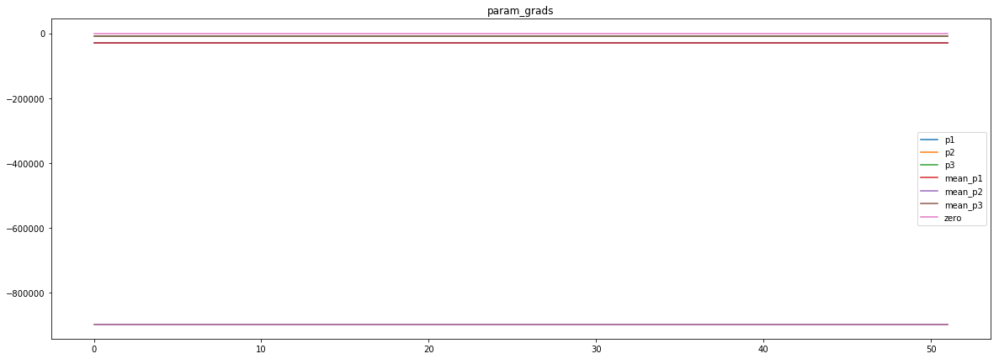

loss rate [0.0007894546449382922]
Epoch [72] 
     train_loss[6859.594141446627] 
     eval_train[0.21721940856570232] 
     eval_test[0.21998077076436443]


aux preds: 0.44496798515319824           1.0037232637405396           9.97482681274414
main loss 0.0
aux loss 378.4870135967548
jord loss 6283.561298076923
combined loss 6662.048311673678 


Parameter containing:
tensor([[0.4450, 1.0037, 9.9748]], requires_grad=True)


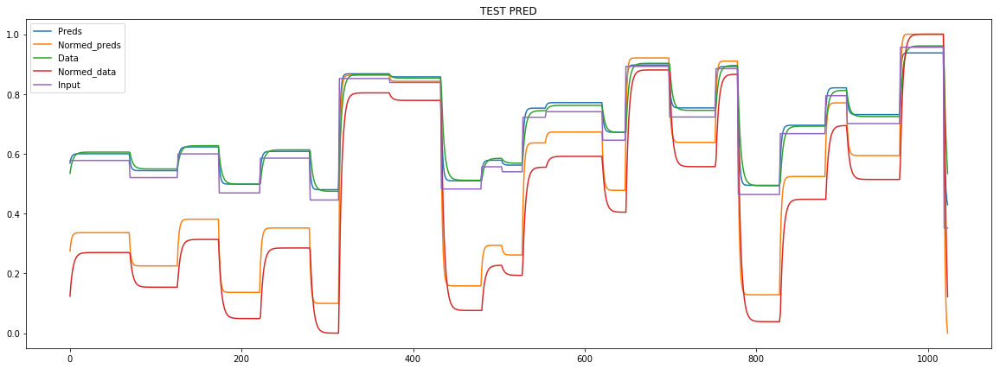

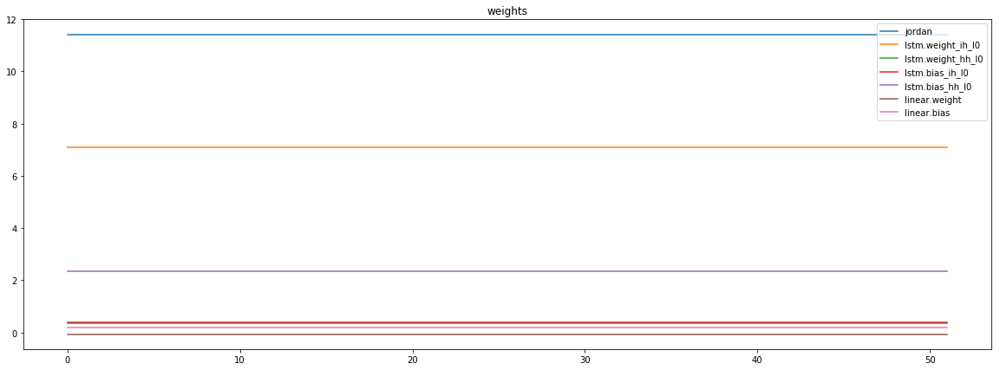

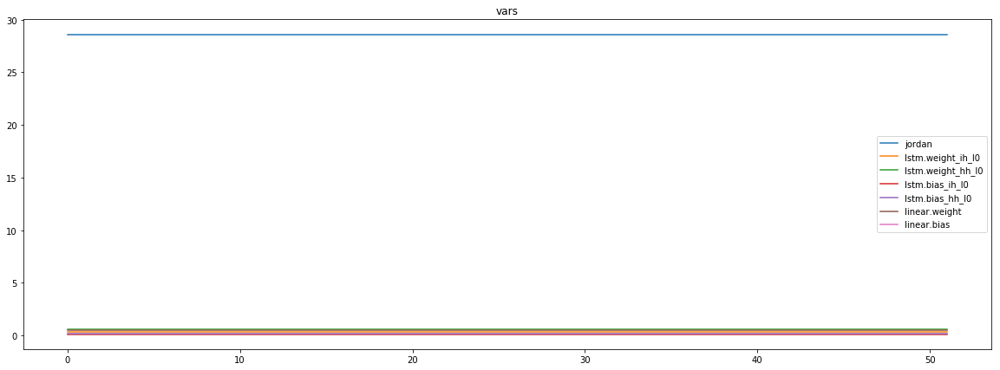

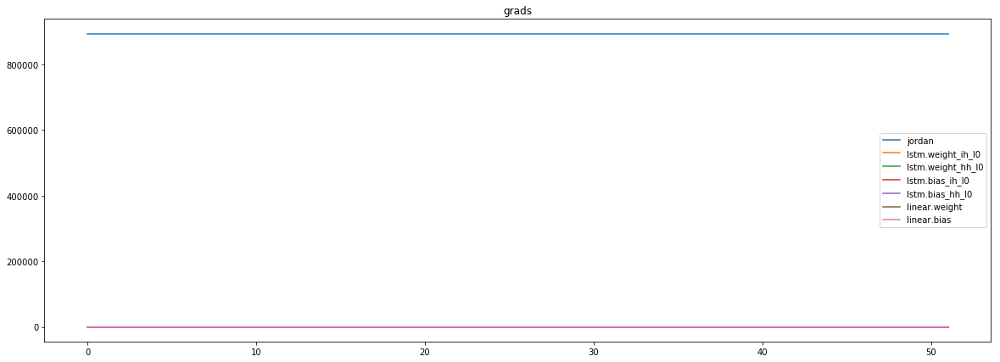

mean_p1 : -33808.5859375
mean_p2 : 918075.1875
mean_p3 : 9210.650390625


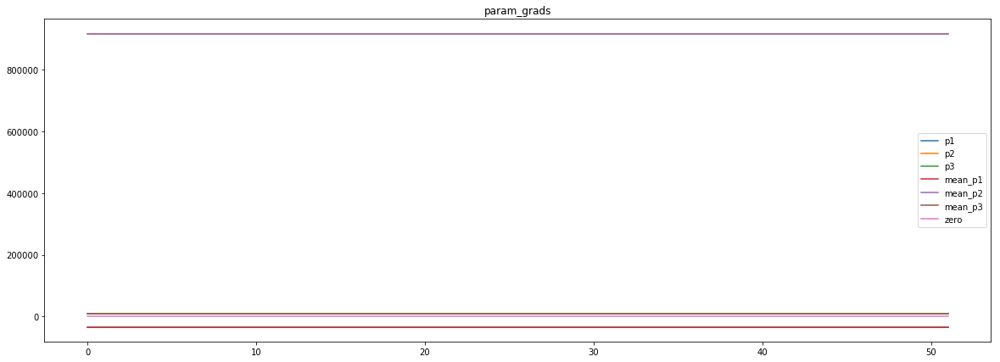

loss rate [0.0004699116895439115]
Epoch [73] 
     train_loss[6662.048311673678] 
     eval_train[0.21725509903178764] 
     eval_test[0.21995131006803026]


aux preds: 0.447647362947464           0.9980890154838562           9.971742630004883
main loss 0.0
aux loss 379.19359529935394
jord loss 5895.055767352765
combined loss 6274.249362652118 


Parameter containing:
tensor([[0.4476, 0.9981, 9.9717]], requires_grad=True)


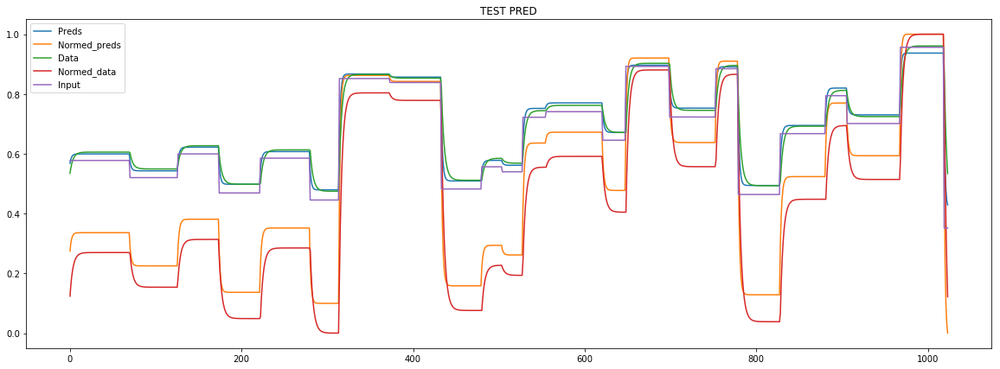

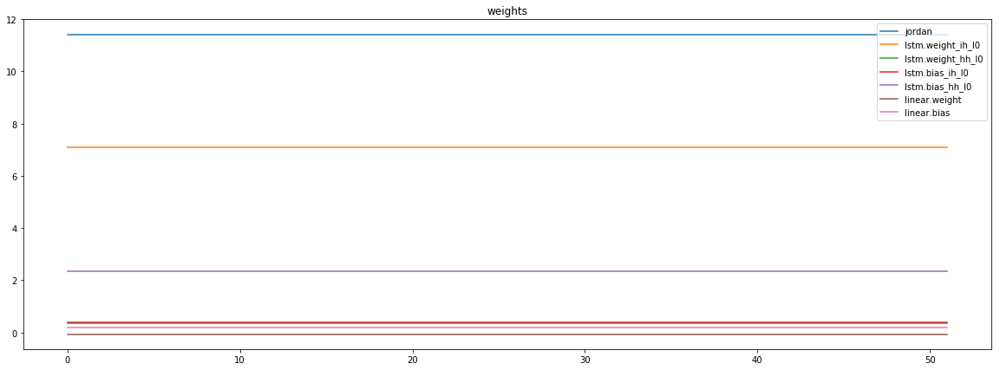

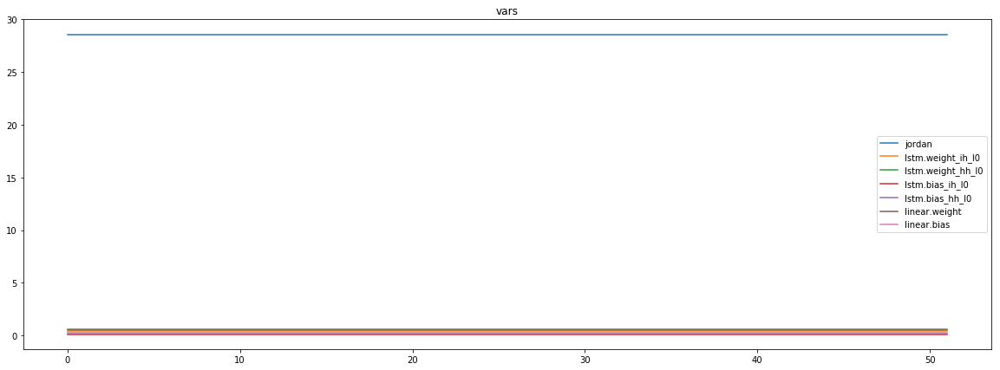

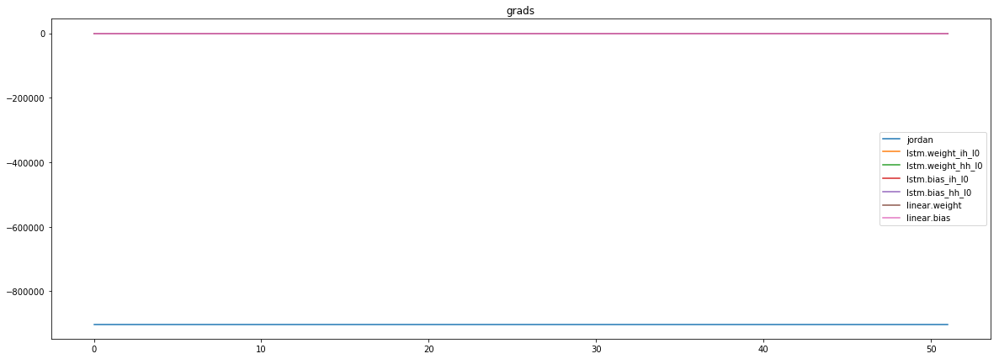

mean_p1 : -11406.037109375
mean_p2 : -881871.5625
mean_p3 : -8809.806640625


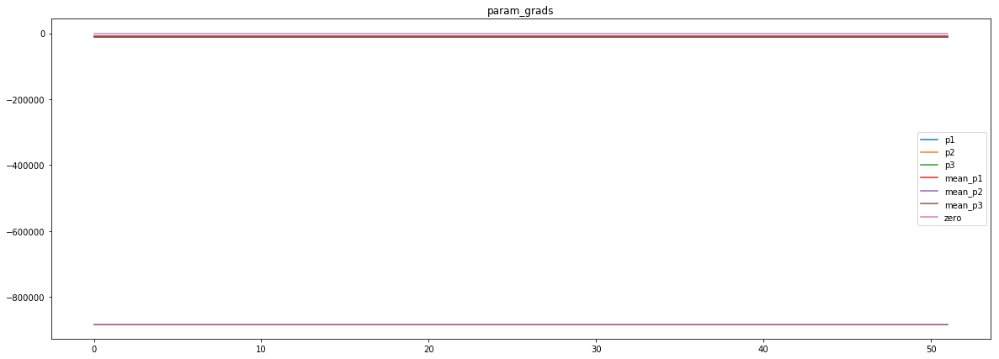

loss rate [0.0006372806921965957]
Epoch [74] 
     train_loss[6274.249362652118] 
     eval_train[0.21714473512166965] 
     eval_test[0.21987123804336245]


aux preds: 0.4483969509601593           1.0005093812942505           9.972464561462402
main loss 0.0
aux loss 378.0211956317608
jord loss 5990.166217510517
combined loss 6368.187413142277 


Parameter containing:
tensor([[0.4484, 1.0005, 9.9725]], requires_grad=True)


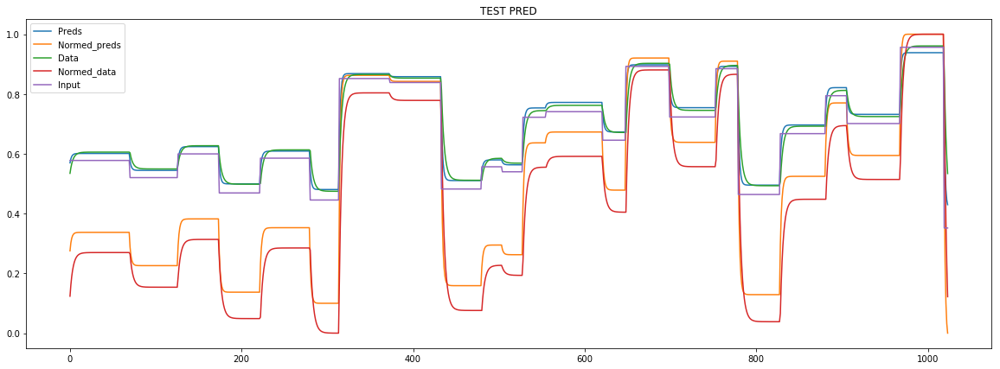

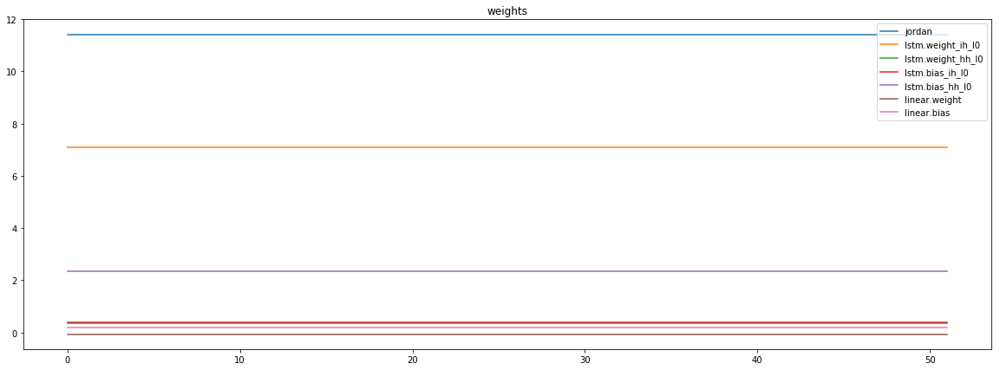

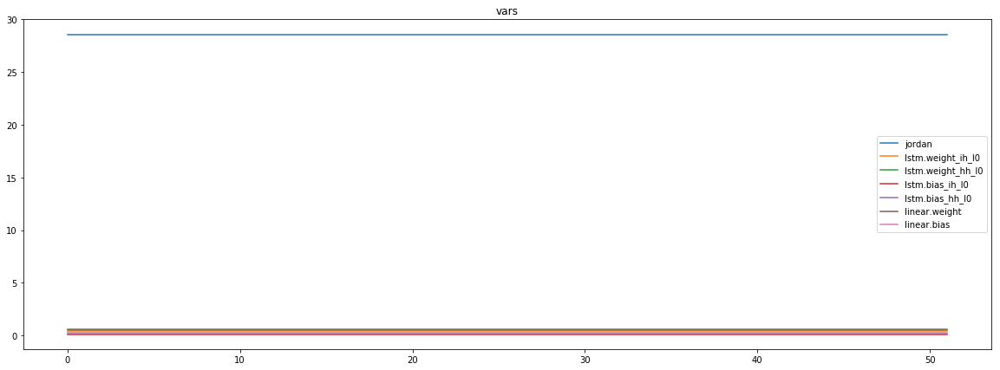

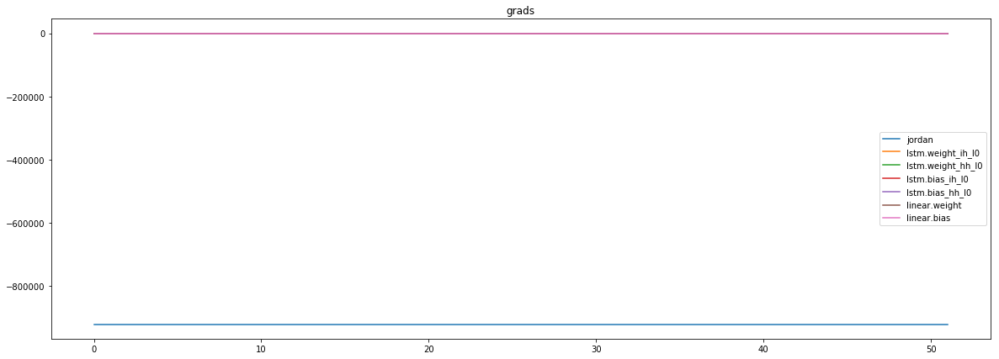

mean_p1 : -62605.75390625
mean_p2 : -850273.75
mean_p3 : -8415.369140625


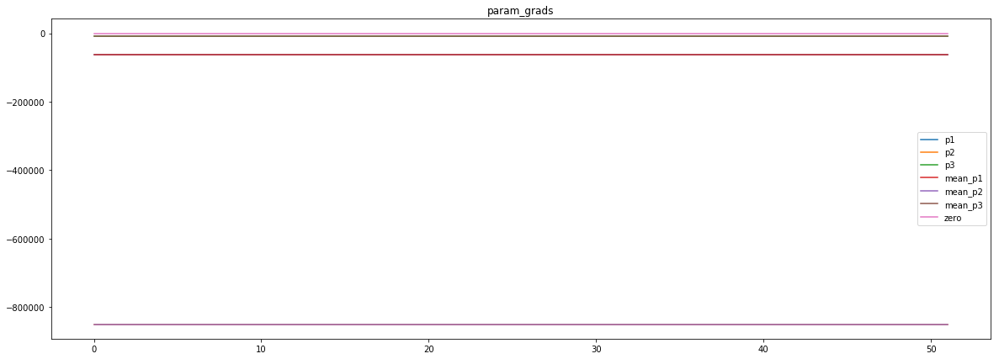

loss rate [6.168251914628886e-05]
Epoch [75] 
     train_loss[6368.187413142277] 
     eval_train[0.21725766720751727] 
     eval_test[0.21992087351496925]


aux preds: 0.4469698667526245           1.0019500255584717           9.978042602539062
main loss 0.0
aux loss 377.08018493652344
jord loss 6202.4160719651445
combined loss 6579.496256901668 


Parameter containing:
tensor([[0.4470, 1.0020, 9.9780]], requires_grad=True)


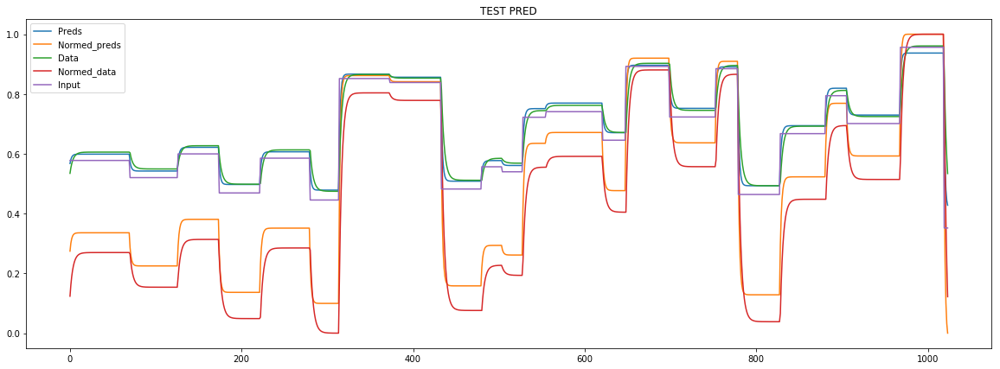

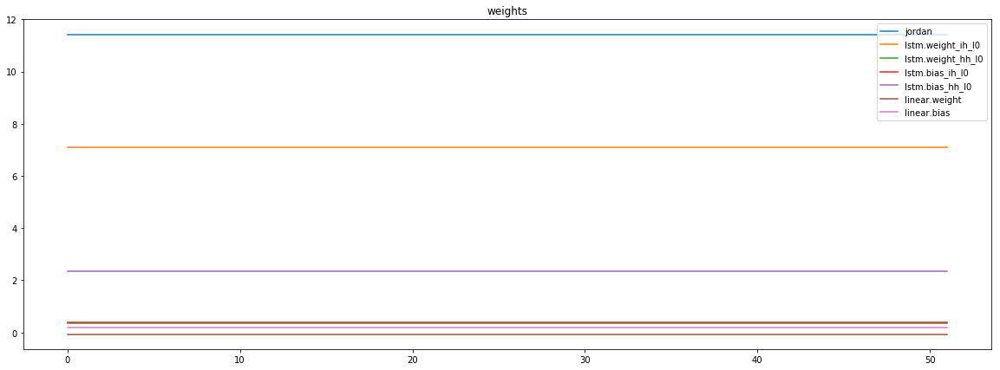

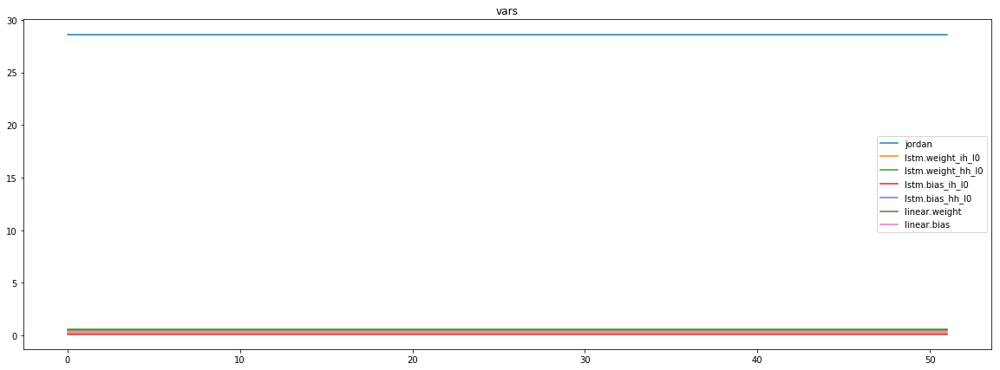

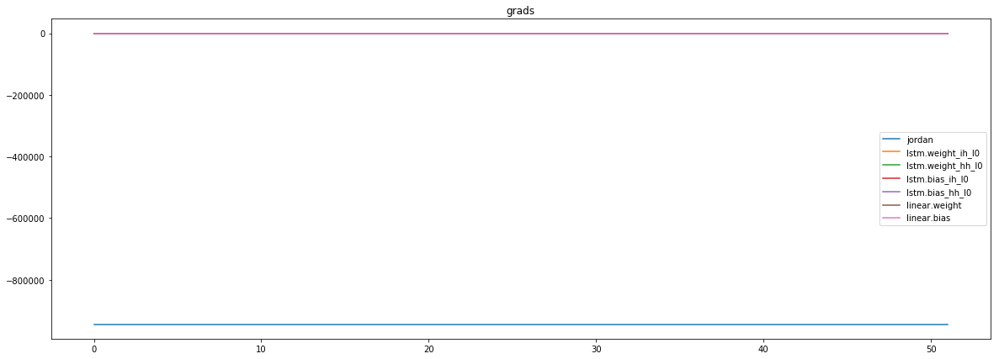

mean_p1 : -66241.90625
mean_p2 : -868985.5
mean_p3 : -8588.6357421875


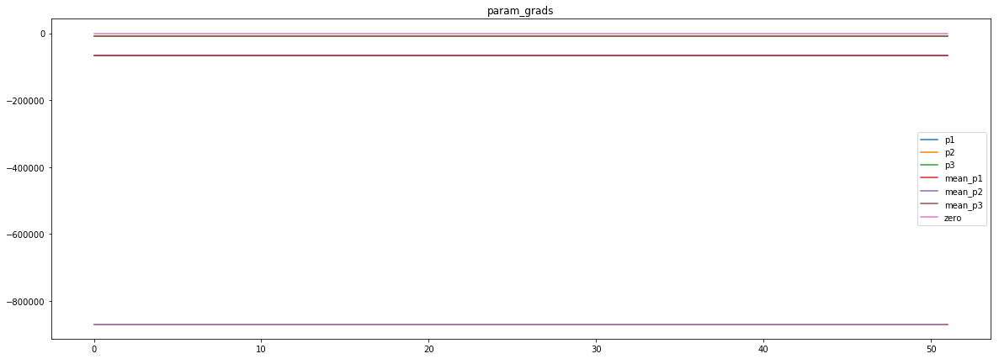

loss rate [0.0006164372303129051]
Epoch [76] 
     train_loss[6579.496256901668] 
     eval_train[0.21699650583860391] 
     eval_test[0.2197789104062725]


aux preds: 0.44929981231689453           0.9962546825408936           9.971054077148438
main loss 0.0
aux loss 374.13417287973255
jord loss 6830.117088904748
combined loss 7204.25126178448 


Parameter containing:
tensor([[0.4493, 0.9963, 9.9711]], requires_grad=True)


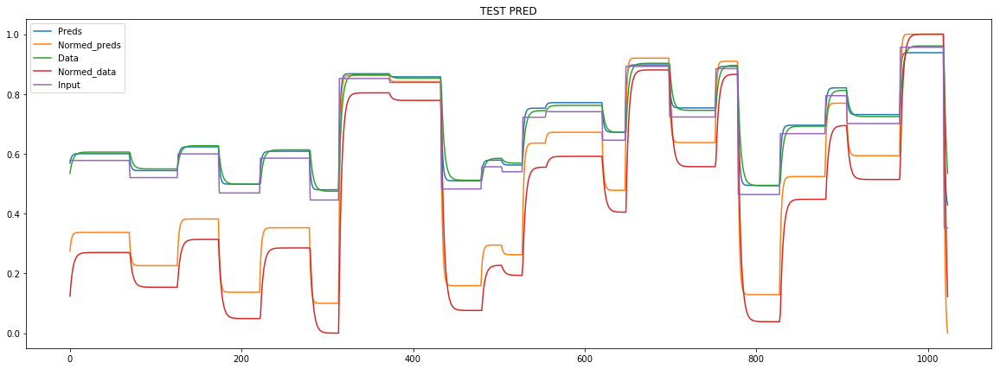

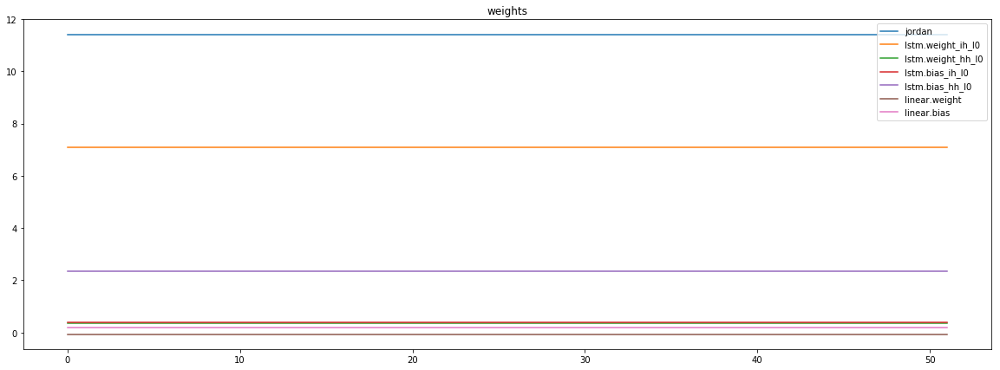

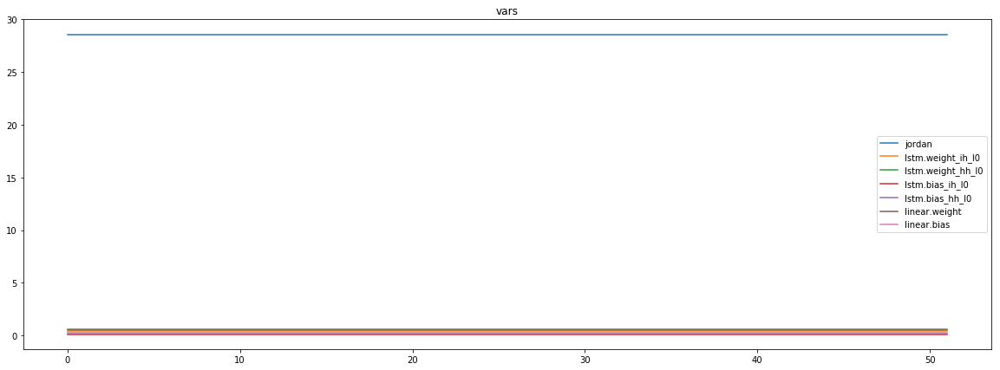

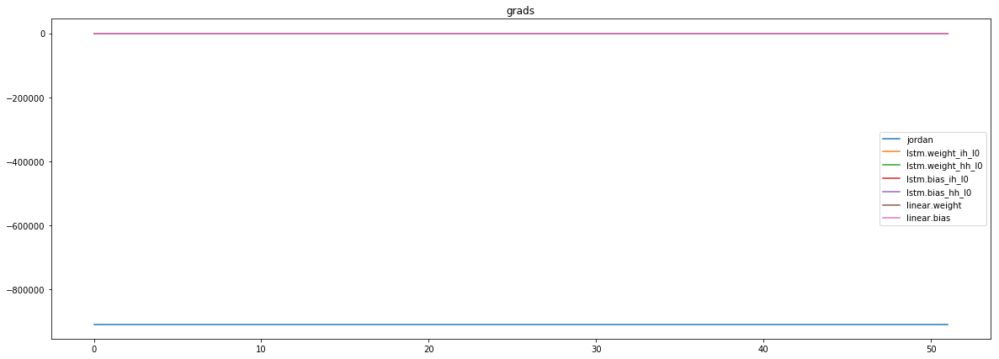

mean_p1 : -8512.6435546875
mean_p2 : -890686.5625
mean_p3 : -8916.9384765625


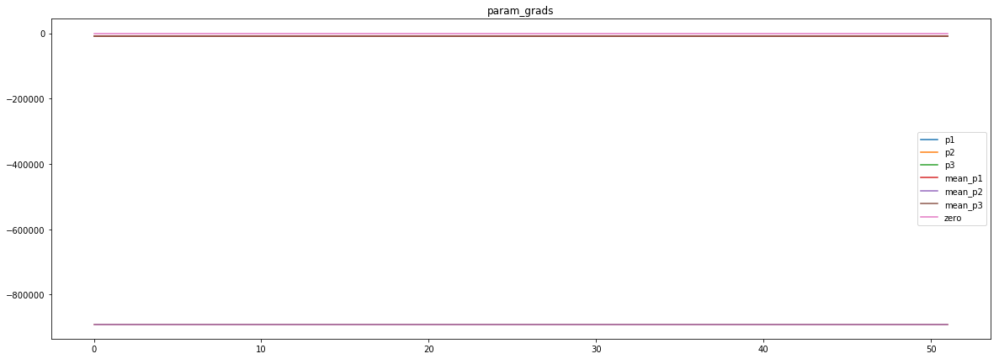

loss rate [0.0004552424161321511]
Epoch [77] 
     train_loss[7204.25126178448] 
     eval_train[0.21704153843725527] 
     eval_test[0.21975691908631811]


aux preds: 0.44596531987190247           1.0018770694732666           9.972593307495117
main loss 0.0
aux loss 374.17430114746094
jord loss 6951.320669320913
combined loss 7325.494970468374 


Parameter containing:
tensor([[0.4460, 1.0019, 9.9726]], requires_grad=True)


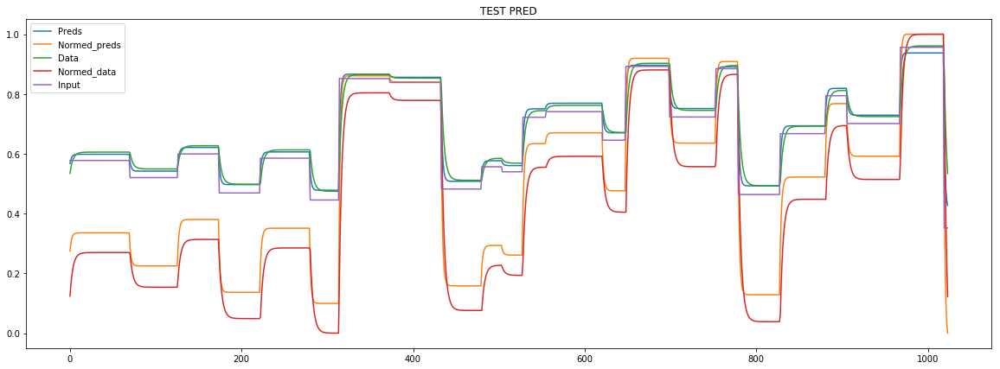

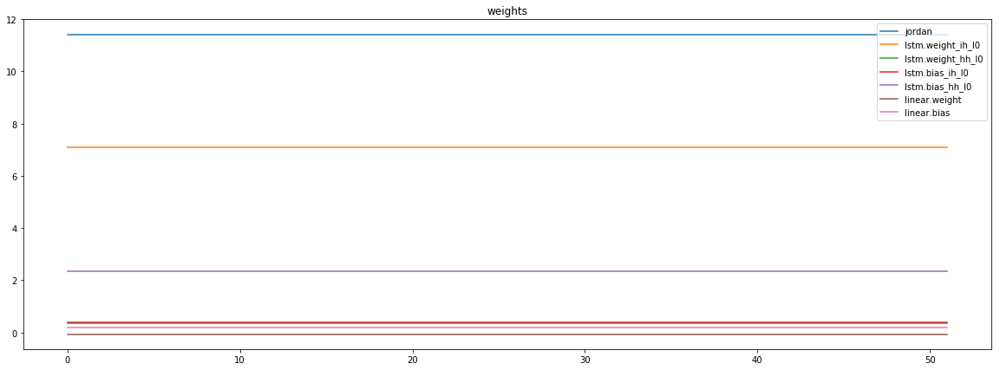

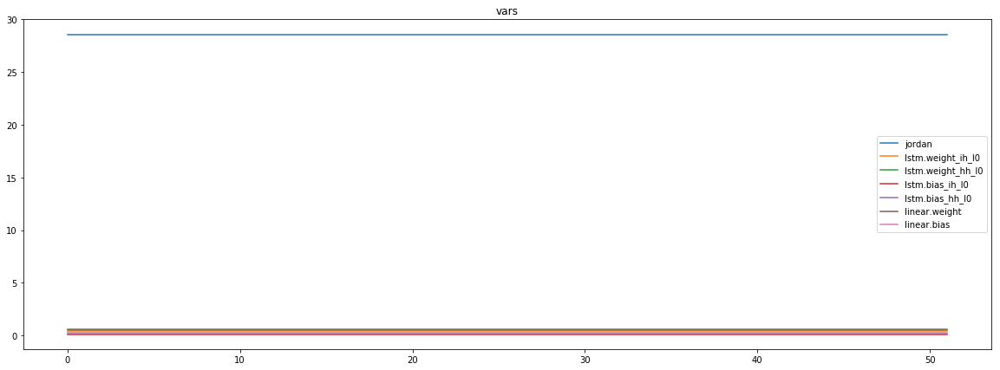

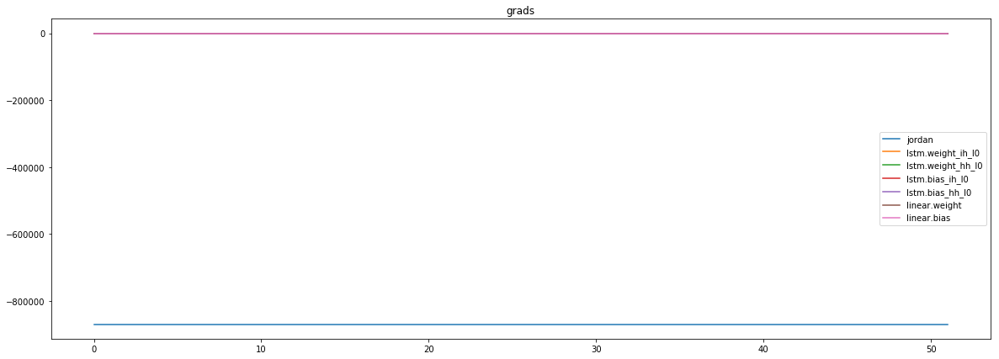

mean_p1 : -3498.197021484375
mean_p2 : -857963.0625
mean_p3 : -8589.3671875


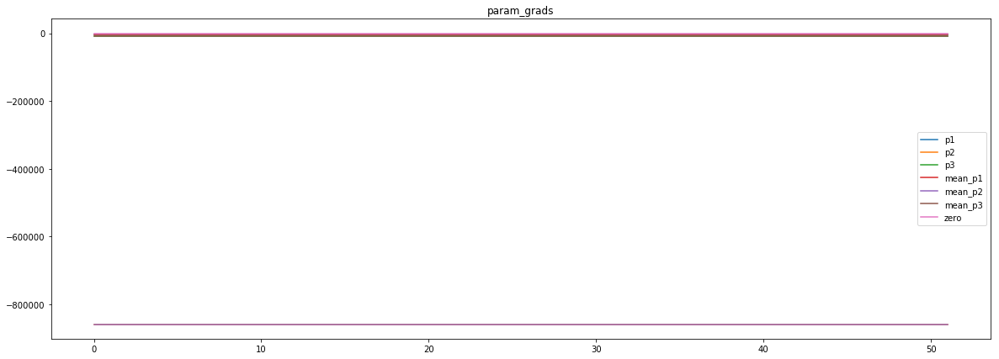

loss rate [0.000592566236199632]
Epoch [78] 
     train_loss[7325.494970468374] 
     eval_train[0.21687321166078055] 
     eval_test[0.21968864374370736]


aux preds: 0.45045024156570435           1.002277135848999           9.971514701843262
main loss 0.0
aux loss 376.9583669809195
jord loss 6345.534428523137
combined loss 6722.492795504057 


Parameter containing:
tensor([[0.4505, 1.0023, 9.9715]], requires_grad=True)


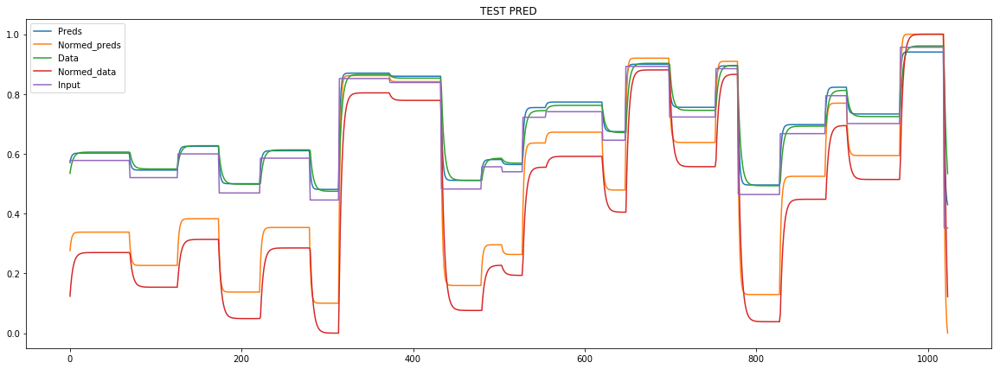

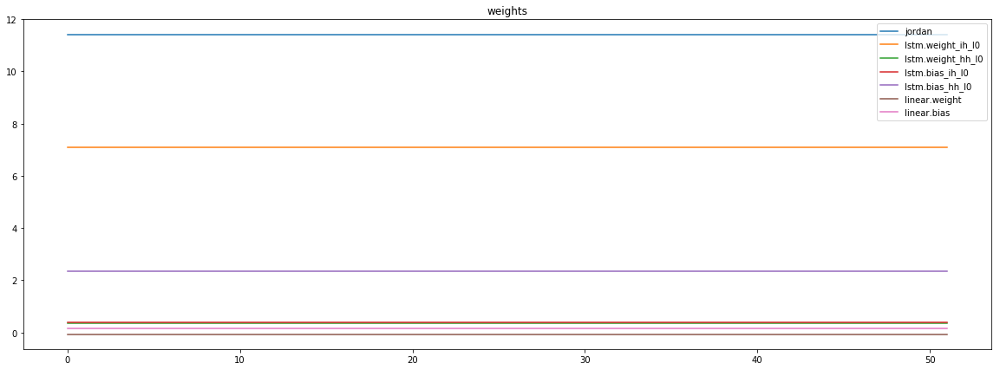

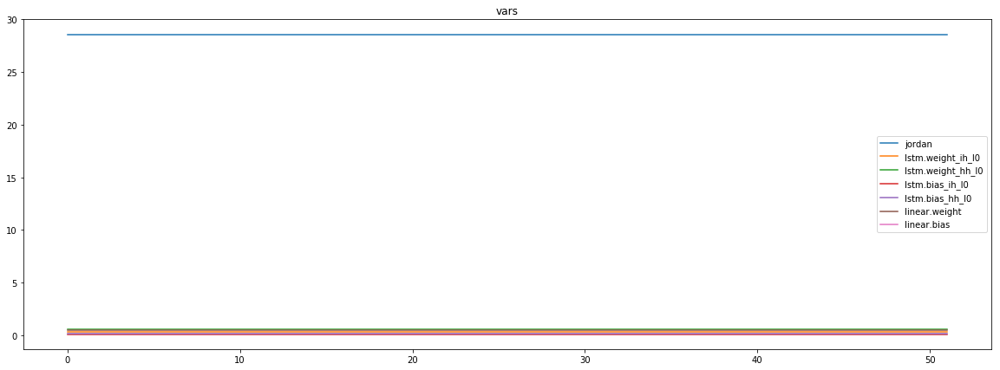

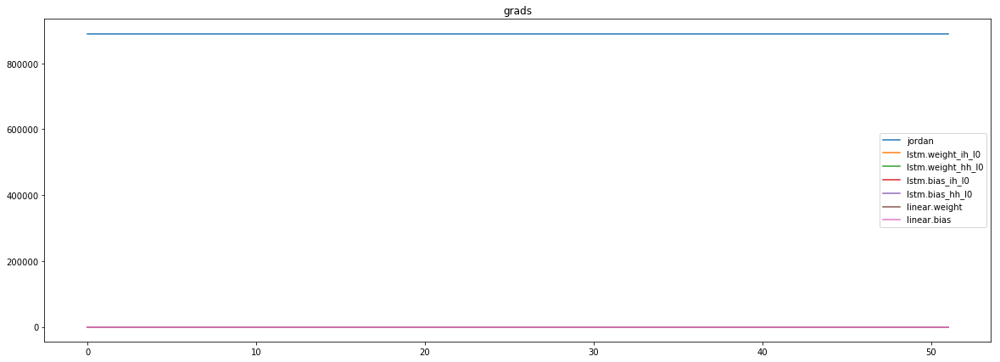

mean_p1 : -30681.248046875
mean_p2 : 911672.1875
mean_p3 : 9152.7685546875


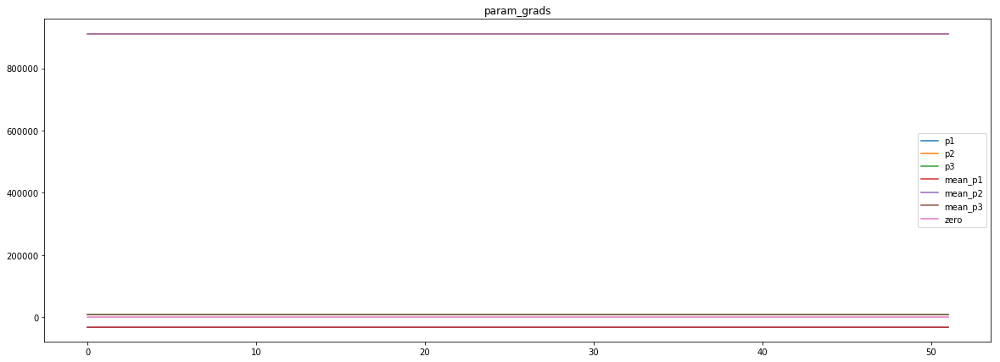

loss rate [-0.0005599116088041978]
Epoch [79] 
     train_loss[6722.492795504057] 
     eval_train[0.21725785707195217] 
     eval_test[0.2198645268905569]


In [47]:
logging.info("Training process STARTED")

model.hidden = model.init_hidden()


for t in range(num_epochs):
    
    batch_local_hist = hist["train"]["batches"]
    long_term_hist = hist["train"]["epochs"]
    
    for i, data in enumerate(tqdm(train_dl)):
        
        model.hidden = model.init_hidden()
        
        y_pred, jordan = batch_iteration(
            iter_index=i,
            model=model,
            optimizer=optimizer,
            batch_data=data,
            backprop=True,
            hist_part=batch_local_hist
        )
        
    hist['mean_params_sample']['1'][t] = jordan[:, 0].item()
    hist['mean_params_sample']['2'][t] = jordan[:, 1].item()
    hist['mean_params_sample']['3'][t] = jordan[:, 2].item()
    
    print(f"aux preds: {hist['mean_params_sample']['1'][t]} \
          {hist['mean_params_sample']['2'][t]} \
          {hist['mean_params_sample']['3'][t]}")
    
    mean_losses = update_long_term_hist(batches_hist=batch_local_hist,
                                                            long_term_hist=long_term_hist)
    mean_main, mean_aux, mean_jord = mean_losses
    # TODO add w8 decay
    print(f"main loss {mean_main}")
    print(f"aux loss {mean_aux}")
    print(f"jord loss {mean_jord}")
    print(f"combined loss {sum(mean_losses)} ")
    
    # VISUALISE TRAINING PROGRESS
#     x_batch, y_batch, indexes = data
#     plot_shared_scale([
#         (y_pred[:, 0].detach().numpy(),"Preds" ),
#          (y_batch[:, 0].detach().numpy(), "Data"),
#          (x_batch[-1].detach().numpy(), "Input")
#         ],
#         title="TRAIN PREDICT")
          
#     residuals = y_batch[:, 0] - y_pred[:, 0]
#     plot_multiscale([
#         (residuals.detach().numpy(), "Red"),
#         (y_batch[:, 0].detach().numpy(), "Green"),
#         (y_pred[:, 0].detach().numpy(), "Brown")
#     ],
#         title="TRAIN RESID"
#     ) 
    # /VISUALISE TRAINING PROGRESS

    # EVAL
    with torch.no_grad():
          
          model = model.eval()
          
          for i, data in enumerate(tqdm(train_dl)):
              batch_local_hist = hist['eval_train']['batches']
              long_term_hist=hist["eval_train"]["epochs"]
              y_pred, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          
          for i, data in enumerate(tqdm(test_dl)):
              batch_local_hist = hist['eval_test']['batches']
              long_term_hist=hist["eval_test"]["epochs"]
          
              y_pred_test, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          model = model.train()
    # /EVAL
          
    # VISUALISE ITERATION PRED
    x_batch_test, y_batch_test, indexes = data
    print(jordan)
          
    sample_y_pred_test = y_pred_test[:, 0].detach().numpy().copy()
    sample_y_pred_test -= np.min(sample_y_pred_test)
    sample_y_pred_test /= (np.max(sample_y_pred_test) - np.min(sample_y_pred_test))
    normed_data = y_batch_test[:, 0].detach().numpy().copy()
    normed_data -= np.min(normed_data)
    normed_data /= (np.max(normed_data) - np.min(normed_data))
    plot_shared_scale([
            (y_pred_test[:, 0].detach().numpy(), "Preds"),
            (sample_y_pred_test,"Normed_preds" ),
             (y_batch_test[:, 0].detach().numpy(), "Data"),
             (normed_data, "Normed_data"),
             (x_batch_test[-1].detach().numpy(), "Input")
    ],
        title = 'TEST PRED'
    )
    
#           print(y_pred.detach().numpy() == y_batch().detach().numpy())
#     plt.plot(y_pred.detach().numpy())
#     plt.show()
    
          # /VISUALISE ITERATION PRED
   
               
    plot_shared_scale([(v,k)for k, v in hist['weights']['batches'].items()], title='weights')
    plot_shared_scale([(v,k)for k, v in hist['vars']['batches'].items()], title='vars')
    plot_shared_scale([(v,k)for k, v in hist['grads']['batches'].items()], title='grads')
    
    param_grads = [(v,k) for k, v in hist['param_grads']['batches'].items()]
    param_grads_means = [ (np.full(v.shape, np.mean(v)), 'mean_' + k ) for v,k in param_grads]
    for par_gr_mean, name in param_grads_means:
          print(f"{name} : {par_gr_mean[0]}")
    plot_shared_scale(param_grads + param_grads_means +
                      [(np.zeros(len(train_dl)), 'zero')], title='param_grads')
          
    visualise_resid = False
    if visualise_resid:
        residuals = y_batch_test[:, 0] - y_pred_test[:, 0]
        plot_multiscale(
                [
                 (residuals.detach().numpy(), "Red"), 
                 (y_batch_test[:, 0].detach().numpy(),"Green")
                ],
            title = 'TEST RESID'
        )
    
    
    # UPDATE LR
    val_loss = slice_loss_sum(hist['eval_test']['epochs'], t)
    scheduler.step(val_loss)
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    hist['weights_var'][t] = torch.as_tensor([p.var() for p in model.parameters(recurse=True)]).sum().item()
    
    for name, parameter in model.named_parameters():
          hist['grads']['epochs'][name][t] = np.mean(hist['grads']['batches'][name])
          hist['weights']['epochs'][name][t] = np.mean(hist['weights']['batches'][name])
          hist['vars']['epochs'][name][t] = np.mean(hist['vars']['batches'][name])
    hist['param_grads']['epochs']['p1'][t] = np.mean(hist['param_grads']['batches']['p1'])
    hist['param_grads']['epochs']['p2'][t] = np.mean(hist['param_grads']['batches']['p2'])

    hist['param_grads']['epochs']['p3'][t] = np.mean(hist['param_grads']['batches']['p3'])
          
          
    
    hist['lr'][t] = scheduler.optimizer.param_groups[0]['lr']
#     if hist['lr'][t] <= 10**p_sched['early_stop_order'] * 1.0001: # 1+eps 
#           print("Loss critically low, EARLY STOPPING")
#           break
          
    if t > 3:
          h = hist["eval_test"]["epochs"]
          loss_rate = 1 - slice_loss_sum(h, t) / np.mean([slice_loss_sum(h, k) for k in range(t-3,t)])          
          hist['loss_rate'][t] = loss_rate              
          print(f"loss rate [{loss_rate}]")
    # /UPDATE LR
                       
    # FINAL PROGRESS LOGGING
    msg = "Epoch [{t}] \n \
    train_loss[{train_loss}] \n \
    eval_train[{eval_train}] \n \
    eval_test[{eval_test}]".format(t=t,
                                train_loss=sum([val[t] for val in hist['train']['epochs'].values()]), 
                                eval_train=sum([val[t] for val in hist['eval_train']['epochs'].values()]),
                                eval_test=sum([val[t] for val in hist['eval_test']['epochs'].values()])
                               )
    print(msg)
    logging.info(msg)
                       
    # /FINAL PROGRESS LOGGING

In [48]:
timestamp = datetime.datetime.now().strftime("%d_%B_%I_%M%p")
specifier = f"{p_net['jordan_nodes']}_{p_net['num_layers']}l_{p_net['hidden_size']}n_{int(p_net['bias'])}b"
print(specifier)
print(timestamp)
specifier = f"{p_net['num_layers']}l {p_net['hidden_size']}h {int(p_net['bias'])}b"
filename = f'jordan_full_blind_{specifier}_{timestamp}.pt'
torch.save(model, filename)
filename

3_1l_2n_1b
18_May_09_17PM


'jordan_full_blind_1l 2h 1b_18_May_09_17PM.pt'

In [49]:

filename

'jordan_full_blind_1l 2h 1b_18_May_09_17PM.pt'

In [50]:
def get_size(dicts):
    acc = 0
    for key, val in dicts.items():
        if type(val) == dict:
            print(key)
            acc += get_size(val)            
        else:
            acc+=sys.getsizeof(val)
    return acc

In [51]:

get_size(hist) / 1024

train
batches
epochs
eval_train
batches
epochs
eval_test
batches
epochs
mean_params_sample
grads
batches
epochs
weights
batches
epochs
vars
batches
epochs
param_grads
batches
epochs
grad_global


404.5

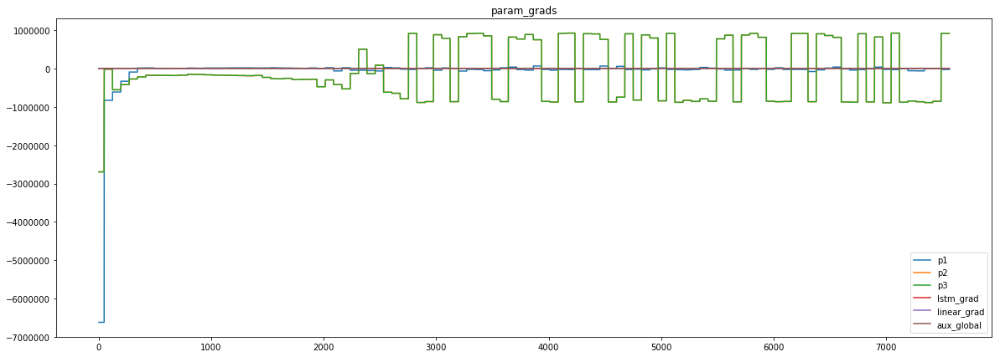

In [52]:
s = 100
e = -1
plot_shared_scale([
    (hist['grad_global']['p1'][s:e], 'p1'),
    (hist['grad_global']['p2'][s:e], 'p2'),
    (hist['grad_global']['p2'][s:e], 'p3'),
    (hist['grad_global']['lstm'][s:e], 'lstm_grad'),
    (hist['grad_global']['linear'][s:e], 'linear_grad'),
    (hist['aux_global'][s:e], 'aux_global')
], title="param_grads")
s =  10
e = -1

In [53]:
s, e = 0, t

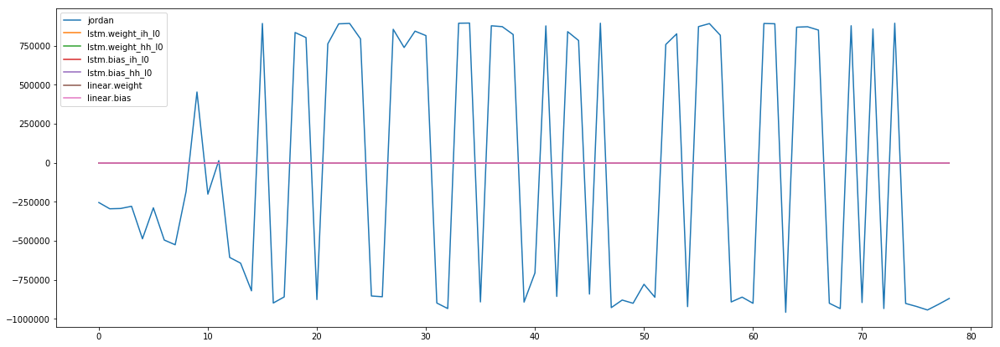

In [54]:
plot_shared_scale([(v[s:e],k)for k, v in hist['grads']['epochs'].items()])

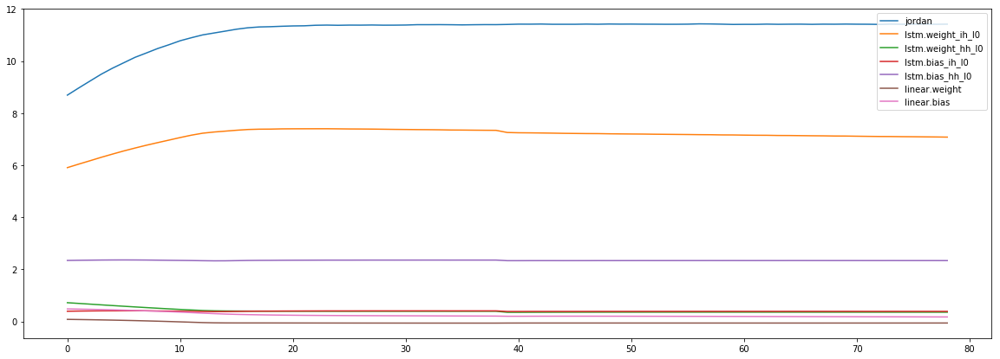

In [55]:
plot_shared_scale([(v[s:e],k)for k, v in hist['weights']['epochs'].items()])

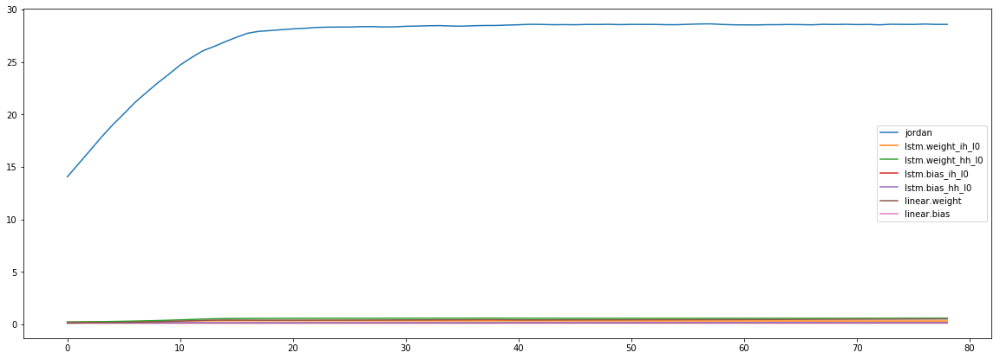

In [56]:
plot_shared_scale([(v[s:e],k)for k, v in hist['vars']['epochs'].items()])

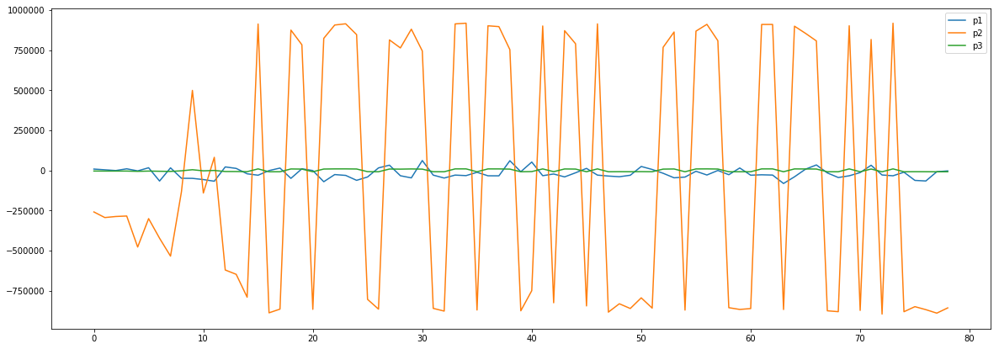

In [57]:
s = 0
plot_shared_scale([(v[s:e],k)for k, v in hist['param_grads']['epochs'].items()])

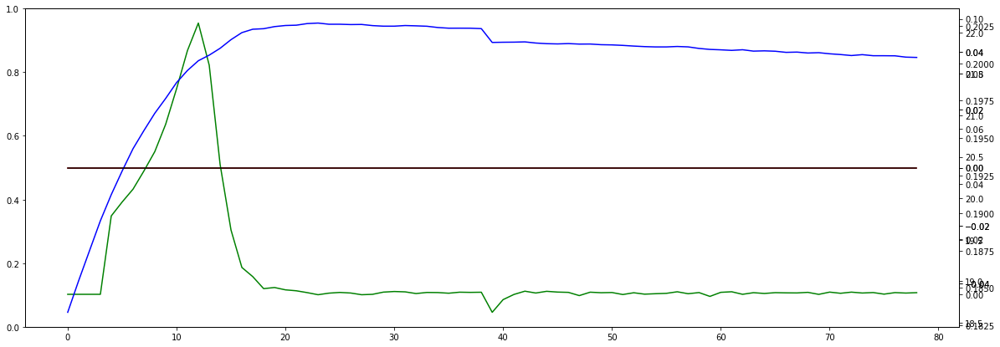

In [58]:
s, e = 0, t
plot_multiscale([
    (hist['lr'][s:e],"Red" ),
    (hist['loss_rate'][s:e], "Green"),
    (hist['weights_sum'][s:e], "Blue"),
    (hist['weights_var'][s:e], "Yellow"),
    (hist['eval_test']['epochs']['aux'][s:e], "Black")
])

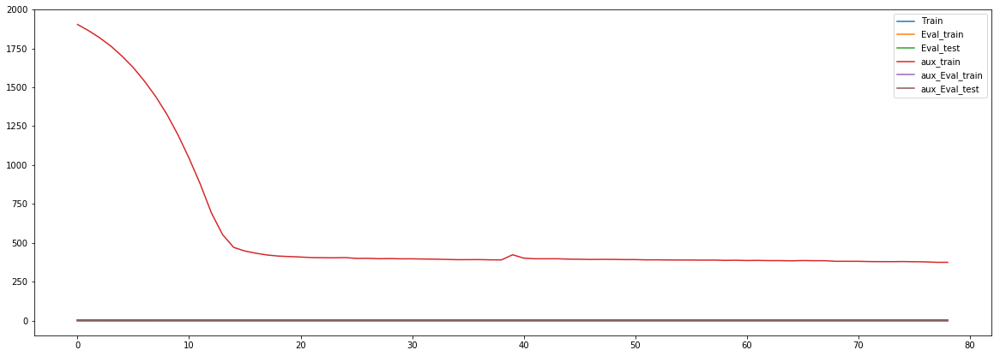

In [59]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [ ]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
#     (hist['train']["epochs"]['aux'][s:e], "aux_train"),
#     (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
#     (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [ ]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [ ]:
# To the prove of faster convergence

In [ ]:
plot_shared_scale(
[
    (hist['eval_test']["epochs"]['jordan'][s:e], 'Green'),
    
    (hist['eval_test']["epochs"]['aux'][s:e], 'Red'),
]
)

In [ ]:
for n, v in model.named_parameters():
    print(n, "\t", v.shape, "\t", v.sum())

In [ ]:
plot_shared_scale([
                  (hist['mean_params_sample']['1'][s:e], "p1"),
                  ((hist['mean_params_sample']['2']*0 + 1)[s:e], "p2"),
                  (hist['mean_params_sample']['2'][s:e], "p2"),
                  ((hist['mean_params_sample']['2']*0 + 0.5)[s:e], "p2"),
    (hist['mean_params_sample']['3'][s:e], "p3"),
                  ((hist['mean_params_sample']['2']*0 + 10)[s:e], "p3")
])

In [ ]:
model.buffers

In [ ]:
logging.info("Training process END")